In [1]:
import pandas as pd
from pathlib import Path
import numpy as np
import time
import os
import statsmodels
import seaborn as sns
import matplotlib.pyplot as plt
import glob
from scipy import stats
import pingouin as pg
import scikit_posthocs as sp
import statsmodels.api as sm
from scipy.stats import boxcox
from statannotations.Annotator import Annotator
from scipy.stats import pearsonr
import docx
from docx.enum.section import WD_ORIENT
from docx.enum.section import WD_SECTION
from docx.enum.text import WD_ALIGN_PARAGRAPH
from docx.shared import Pt
from statsmodels.stats.outliers_influence import variance_inflation_factor



c:\Users\gabot\anaconda3\lib\site-packages\outdated\utils.py:14: OutdatedCheckFailedWarning: Failed to check for latest version of package.
Set the environment variable OUTDATED_RAISE_EXCEPTION=1 for a full traceback.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


# Eye tracking analyses 2025 Gap Overlap

In [2]:
# Papermill parameters
outlier_rem = True  
date = "2025_03_15"
derivative = "standard" # "standard" or "pilot"
files_date= "2025_03_15"


In [11]:
# Function to convert df to docx table format

def df_to_table(doc, df):
    # Add a table to the end and create a reference variable
    t = doc.add_table(df.shape[0]+1, df.shape[1])

    # Make sure df is rounded 
    df = df.round(2)

    # Make sure table is auto fit
    for cell in t._cells:
        cell.width = docx.shared.Inches(1.0)
    
    # Set the style of the table
    table_style = doc.styles['Table Grid']

    # Add the header rows.
    for j in range(df.shape[-1]):
        t.cell(0,j).text = df.columns[j]

    # Add the rest of the data frame
    for i in range(df.shape[0]):
        for j in range(df.shape[-1]):
            t.cell(i+1,j).text = str(df.values[i,j])
    
    return doc

def coefplot_gap(results, multiple_models=False, fig_name=None):
    '''
    Creates a coefficient plot with confidence intervals.
    
    Parameters:
    results : statsmodels results object or DataFrame
        If multiple_models=False: statsmodels results object
        If multiple_models=True: DataFrame with columns: index, model, Coef., [0.025, P>|z|
    multiple_models : bool, default False
        Whether to create a plot for multiple models or single model
    
    Returns:
        matplotlib plot
    '''
    # Create/process dataframe based on input type
    if not multiple_models:
        coef_df = pd.DataFrame(results.summary().tables[1]).reset_index()
    else:
        coef_df = results.copy()
    
    # Drop unwanted rows
    coef_df = coef_df.loc[coef_df["index"].isin(['Group Var', 'Intercept']) == False]
    
    # Convert numeric columns to float
    coef_df['Coef.'] = coef_df['Coef.'].astype(float)
    coef_df['[0.025'] = coef_df['[0.025'].astype(float)
    coef_df['P>|z|'] = coef_df['P>|z|'].astype(float)
    
    # Calculate errors
    coef_df['errors'] = coef_df['Coef.'] - coef_df['[0.025']
    
    # Create significance indicators - make them consistent between both cases
    if multiple_models:
        coef_df['Significance'] = coef_df['P>|z|'].apply(
            lambda x: 'Significant' if x < 0.05 else 'Not Significant'
        )
    else:
        # Changed to match the multiple models case
        coef_df['Significance'] = coef_df['P>|z|'].apply(
            lambda x: 'Significant' if x < 0.05 else 'Not Significant'
        )
    
    # Clean up Treatment variable names
    for var_name in coef_df['index'].unique():
        if "Treatment" in var_name:
            if ":" in var_name:
                var1 = var_name.split("[",1)[1].split("]")[0]
                var2 = var_name.split("[", 2)[-1]
                new_var_name = var1 + ":" + var2
            else:
                new_var_name = var_name.split("[", 1)[1].split("]")[0]
            coef_df['index'] = coef_df['index'].replace(var_name, new_var_name)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(18, 10))
    
    # Define consistent marker styles
    marker_styles = {'Significant': 'X', 'Not Significant': 'o'}
    

    if multiple_models:
        # Get models and calculate positions
        models = coef_df['model'].unique()
        variables = coef_df['index'].unique()
        n_models = len(models)
        space_between = 2.5
        model_spacing = 1.0
        
        # Create position mapping
        positions = {}
        # Sort variables by their average coefficient value (lowest to highest)
        var_means = coef_df.groupby('index')['Coef.'].mean().sort_values()
        sorted_vars = var_means.index
        
        for i, var in enumerate(sorted_vars):
            base_pos = i * (n_models + space_between)
            for j, model in enumerate(models):
                positions[(var, model)] = base_pos + (j * model_spacing)
        
        # Add plot positions
        coef_df['plot_position'] = coef_df.apply(
            lambda row: positions[(row['index'], row['model'])], 
            axis=1
        )
        
        # Set up colors for multiple models
        model_palette = sns.color_palette("husl", n_colors=len(models))
        model_colors = dict(zip(models, model_palette))
        
        # Plot error bars
        for model in models:
            model_data = coef_df[coef_df['model'] == model]
            plt.errorbar(x=model_data['Coef.'],
                        y=model_data['plot_position'],
                        xerr=model_data['errors'],
                        color=model_colors[model],
                        capsize=3,
                        fmt='none',
                        alpha=0.7,
                        zorder=1)
        
        # Plot points
        g = sns.scatterplot(data=coef_df,
                           x='Coef.',
                           y='plot_position',
                           hue='model',
                           style='Significance',
                           markers=marker_styles,
                           palette=model_colors,
                           s=200,
                           zorder=3,
                           ax=ax)
        
        # Set y-ticks
        tick_positions = []
        for i, var in enumerate(sorted_vars):
            base_pos = i * (n_models + space_between)
            middle_pos = base_pos + ((n_models - 1) * model_spacing) / 2
            tick_positions.append(middle_pos)
        
        ax.set_yticks(tick_positions)
        ax.set_yticklabels(sorted_vars)
        
        # Create legends
        g.legend_.remove()
        
        # Model legend
        model_legend = ax.legend(
            title='Models',
            handles=[plt.Line2D([], [], marker='o', color=color, linestyle='None', 
                               markersize=10, label=model)
                    for model, color in model_colors.items()],
            bbox_to_anchor=(1.02, 1),
            loc='upper left'
        )
        
        # Significance legend
        significance_handles = [
            plt.Line2D([], [], marker='X', color='gray', linestyle='None', 
                      markersize=10, label='Significant'),
            plt.Line2D([], [], marker='o', color='gray', linestyle='None', 
                      markersize=10, label='Not Significant')
        ]
        
        ax.add_artist(model_legend)
        ax.legend(handles=significance_handles,
                 title='Significance',
                 bbox_to_anchor=(1.02, 0.6),
                 loc='upper left')
        
    else:
        # Sort the dataframe by coefficient values (lowest to highest)
        coef_df = coef_df.sort_values(by='Coef.', ascending=False)
        
        # Single model plot
        palette = sns.color_palette("Set1")
        color_map = {'Significant': palette[0], 'Not Significant': palette[1]}
        
        # Error bars
        for idx, row in coef_df.iterrows():
            error_color = color_map[row['Significance']]
            plt.errorbar(x=row['Coef.'], 
                        y=row['index'], 
                        xerr=row['errors'],
                        color=error_color, 
                        capsize=3,
                        fmt='none', 
                        zorder=1)
        
        # Scatter plot with consistent markers
        g = sns.scatterplot(y='index',
                           x='Coef.',
                           style='Significance',
                           hue='Significance',
                           markers=marker_styles,
                           palette=color_map,
                           s=200,
                           data=coef_df,
                           zorder=3,
                           ax=ax)
    
    # Common plot elements
    ax.axvline(x=0, linestyle='--', color='red', linewidth=1)
    
    # Set title & labels
    title = 'Coefficients Across Models w/ 95% Confidence Intervals' if multiple_models else 'Coefficients of Features w/ 95% Confidence Intervals'
    plt.title(title, fontsize=30)
    ax.set_ylabel('Variables' if multiple_models else 'Coefficients', fontsize=22)
    ax.set_xlabel('Coefficient Value' if multiple_models else '', fontsize=22)
    
    # Set x-axis limits
    ax.set_xlim(coef_df['Coef.'].min() - max(coef_df['errors']),
                coef_df['Coef.'].max() + max(coef_df['errors']))
    
    plt.tight_layout()

        # Add to the document
    
    if multiple_models:
        doc.add_paragraph('Multiple models coefficient plot', style='List Bullet')
    else:

         doc.add_paragraph('Mixed effects model results', style='List Bullet')

    # Save the plot 
    plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mixed_effects_model_{fig_name}_{date}.png")

    plt.show()
    return plt.show()
# create a function to check the assumptions of the model
# Function for homoscedasticity

def check_homoscedasticity(model, data, show_text= True):

    levene_test = stats.levene(model.fittedvalues, model.resid)
    if levene_test[1] < 0.05:
        print("Residuals are not homoscedastic", levene_test)
        if show_text:
            # Do other tests to check for homoscedasticity such as bartlett or White test
            # Bartlett’s test
            bartlett_test = stats.bartlett(model.fittedvalues, model.resid)
            print(f'Bartlett’s test p-value: {bartlett_test[1]}')
            # White test
            white_test = statsmodels.stats.diagnostic.het_white(model.resid, model.model.exog)
            print(f'White test p-value: {white_test[1]}')  
            print(f'Levene’s test p-value for the whole model: {levene_test[1]}')

            for variable in ["age", "site", "sex", "condition", "ndd"]:
                if variable not in data.columns:
                    continue
                residuals = model.resid
                group1 = residuals[data[variable] == data[variable].unique()[0]]
                group2 = residuals[data[variable] == data[variable].unique()[1]]

                stat, p_value = stats.levene(group1, group2)
                print(f'Levene’s test p-value for variable {variable}: {p_value}')
        else:
            pass
        print("Residuals are homoscedastic")


def check_assumptions(model, data, show_plots=True, show_text= True):
    # Check for normality of residuals

    # Test for normality
    shapiro_test = stats.shapiro(model.resid)
    if shapiro_test[1] < 0.05:
        print("Residuals are not normally distributed", shapiro_test)
        if show_plots:
            sns.histplot(model.resid, kde=True)
            plt.title("Residuals distribution")
            plt.show()

    else:
        print("Residuals are normally distributed")

    #Check for homoscedasticity
    if show_plots:
        plt.scatter(model.fittedvalues, model.resid)
        plt.xlabel("Fitted values")
        plt.ylabel("Residuals")
        plt.title("Homoscedasticity")
        plt.show()

    # Test for homoscedasticity using levens test 
    check_homoscedasticity(model, data,show_text= True)

    # Check for multicollinearity
    vif = pd.DataFrame()
    vif["variables"] = model.model.exog_names
    # Drop the intercept
    vif["VIF"] = [variance_inflation_factor(model.model.exog, i) for i in range(model.model.exog.shape[1])]
    vif = vif.loc[vif["variables"] != "Intercept"]
    if vif["VIF"].max() > 10:
        print("Multicollinearity detected", vif)
    else:
        print("No multicollinearity detected")
        
    return "Assumptions checked"


In [12]:
# Date 
date

'2025_03_15'

#### Create a word document with results

In [13]:
# Create a document
doc = docx.Document()


# Add a blank paragraph to push the heading to the middle of the page
for _ in range(10):  # Adjust this number to position the heading vertically
    doc.add_paragraph()

# Add the heading
heading = doc.add_paragraph()
if outlier_rem:
    heading_run = heading.add_run(f"Gap Analysis results {date}")
else:
    heading_run = heading.add_run(f"Gap Analysis results {date} no rejections")
heading_run.bold = True
heading_run.font.size = Pt(24)  # Set font size
heading_run.font.name = 'Arial'  # Set font type


# Center align the heading
heading_run.alignment = WD_ALIGN_PARAGRAPH.CENTER

author = doc.add_paragraph( "Results by : Gabriel Blanco")
author.alignment = WD_ALIGN_PARAGRAPH.CENTER

# Add new doc section with landscape orientation
section = doc.add_section()
section.start_type = WD_SECTION.ODD_PAGE
new_width, new_height = section.page_height, section.page_width
section.orientation = WD_ORIENT.LANDSCAPE
section.page_width = new_width


doc.add_heading(f"Gap Analysis results", 0)

# Add heading

doc.add_heading('Participants', level=1)

# Add a paragraph to the document
p = doc.add_paragraph()




## Data loading

In [14]:
# Load all the files
go_files = glob.glob(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/{files_date}/GO_files*/all_files/*.txt")
p1= f"Total files including tests: " + str(len(go_files))
print (p1)
doc.add_paragraph(p1, style='List Bullet')

go_files


Total files including tests: 167


['C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\\GO_files_2025_03_15\\all_files\\0042P_GO.txt',
 'C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\\GO_files_2025_03_15\\all_files\\0043F1_GO.txt',
 'C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\\GO_files_2025_03_15\\all_files\\0050M1_GO.txt',
 'C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\\GO_files_2025_03_15\\all_files\\0050P_GO.txt',
 'C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\\GO_files_2025_03_15\\all_files\\0062P_GO.txt',
 'C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\\GO_files_2025_03_15\\all_files\\0064M1_GO.txt',
 'C:/Us

In [15]:
# Load all the files into a single dataframe
df = []
for file in go_files:
    print(file)
    temp_df=pd.read_table(file)
    print("Completed")
    temp_df = pd.read_csv(file, delimiter = "\t")
    id= file.split("\\")[-1].split(".")[0].replace("_GO", "")
    print(id)
    if len(temp_df) == 0:
        print(f"Empty file: {id}")
        continue
    temp_df["subject"] = id
    if "Q" in id:
        alphanum = id.split("_")[-1]
        family_id = id.split("_")[-2][-4:]
        temp_df["subject"] = family_id + alphanum + "TEST"


    df.append(temp_df)
go_df = pd.concat(df, axis=0)
go_df

C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\GO_files_2025_03_15\all_files\0042P_GO.txt
Completed
0042P
C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\GO_files_2025_03_15\all_files\0043F1_GO.txt
Completed
0043F1
C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\GO_files_2025_03_15\all_files\0050M1_GO.txt
Completed
0050M1
C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\GO_files_2025_03_15\all_files\0050P_GO.txt
Completed
0050P
C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\GO_files_2025_03_15\all_files\0062P_GO.txt
Completed
0062P
C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/et_task_outputs/2025_03_15\GO_files_20

,Session_Name_,Trial_Index_,Trial_Recycled_,task,condition,detail,GO_JITTER,GO_SAC_RT,GO_VALID,subject
0,Q042_P,1,False,GO,Gap,Left,28,310.00,True,0042P
1,Q042_P,2,False,GO,Gap,Left,98,226.00,True,0042P
2,Q042_P,3,False,GO,Overlap,Right,17,248.15,True,0042P
3,Q042_P,4,False,GO,Gap,Left,29,286.00,True,0042P
4,Q042_P,5,False,GO,Gap,Left,21,182.00,True,0042P
...,...,...,...,...,...,...,...,...,...,...
34,Q1162_M1,35,False,GO,Overlap,Right,85,591.16,True,1162M1
35,Q1162_M1,36,False,GO,Overlap,Left,14,413.91,True,1162M1
36,Q1162_M1,37,False,GO,Overlap,Left,59,473.99,True,1162M1
37,Q1162_M1,38,False,GO,Overlap,Left,55,374.08,True,1162M1


In [16]:
go_df.subject.unique()

array(['0042P', '0043F1', '0050M1', '0050P', '0062P', '0064M1', '0064S1',
       '0068F1', '0068M1', '0068S1', '0068S3', '0083F1', '0083M1',
       '0083P', '0086F1', '0086M1', '0086S1', '0093O1', '0104P', '0105P',
       '0111F1', '0111M1', '0119M1', '0128P', '0129M1', '0131M1', '0131P',
       '0131S1', '0134F1', '0134M1', '0134S1', '0146P', '0147F2',
       '0147M1', '0147P', '0150M1', '0152M1', '0154P', '0157M1', '0159M1',
       '0162M1', '0162P', '0162S1', '0171F1', '0171M1', '0171P', '0179M1',
       '0179P', '0181F1', '0181M1', '0181P', '0183M1', '0183P', '0183S1',
       '0186F1', '0186M1', '0196M1', '0196P', '0196S2', '0200F1',
       '0200M1', '0200P', '0200S1', '0216M1', '0216P', '0218M1', '0218P',
       '0223M1', '0223P', '0223S2', '0248M1', '0248P', '0248S1', '0265M1',
       '0265P', '0275F1', '0275P', '0281M1', '0281P', '0296M1', '0296P',
       '052_go_3', '096_go_1', '1006M1', '1009M1', '1009P', '1009S1',
       '1024M1', '1024P', '1026M1', '1026P', '1028P', '1028S1'

In [17]:
go_df=go_df.rename(columns={"position":"detail"})

In [18]:
## keep only the relevant columns
go_df = go_df[["subject","Trial_Index_","condition", "detail", "GO_SAC_RT", "GO_VALID"]]

In [19]:
go_df.subject.unique()

array(['0042P', '0043F1', '0050M1', '0050P', '0062P', '0064M1', '0064S1',
       '0068F1', '0068M1', '0068S1', '0068S3', '0083F1', '0083M1',
       '0083P', '0086F1', '0086M1', '0086S1', '0093O1', '0104P', '0105P',
       '0111F1', '0111M1', '0119M1', '0128P', '0129M1', '0131M1', '0131P',
       '0131S1', '0134F1', '0134M1', '0134S1', '0146P', '0147F2',
       '0147M1', '0147P', '0150M1', '0152M1', '0154P', '0157M1', '0159M1',
       '0162M1', '0162P', '0162S1', '0171F1', '0171M1', '0171P', '0179M1',
       '0179P', '0181F1', '0181M1', '0181P', '0183M1', '0183P', '0183S1',
       '0186F1', '0186M1', '0196M1', '0196P', '0196S2', '0200F1',
       '0200M1', '0200P', '0200S1', '0216M1', '0216P', '0218M1', '0218P',
       '0223M1', '0223P', '0223S2', '0248M1', '0248P', '0248S1', '0265M1',
       '0265P', '0275F1', '0275P', '0281M1', '0281P', '0296M1', '0296P',
       '052_go_3', '096_go_1', '1006M1', '1009M1', '1009P', '1009S1',
       '1024M1', '1024P', '1026M1', '1026P', '1028P', '1028S1'

In [20]:
# Remove unnecessary subjects
for subject in go_df.subject.unique():
    if 'TEST' in subject or (derivative == "no_pilot" and 'Z' in subject):
        print(f"Removing {subject}")
        go_df = go_df[go_df.subject != subject]
#go_df.subject.unique()

In [21]:
# Load demographic data
demo_df = pd.read_csv(f'C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/redcap_demographics/{files_date}/q1k_attempted_demographic_ouputs_{files_date}.csv')

In [22]:
demo_df

,q1k_ID,group,Diagnosis,eeg_attempt,site,diagnosis,eeg_age,record_id,RS,TO,...,ndd,adhd_alt,language_dis,lang_dis_3,asd,Attention Deficit Hyperactivity Disorder.3,Language Impairment,q1k_relative_id,age_group,bids_id
0,Q1K_HSJ_10040_P,proband,NaN,0,hsj,other,NaN,40,0.0,0.0,...,ndd,NaN,1,NaN,1,0,1,Q1K_HSJ_10040_P,NaN,0040P
1,Q1K_HSJ_10040_M1,mother,NaN,0,hsj,other,NaN,41,0.0,0.0,...,no_ndd,NaN,0,NaN,0,NaN,NaN,Q1K_HSJ_10040_M1,NaN,0040M1
2,Q1K_MHC_20042_P,proband,Neurodevelopmental disorder,1,mni,NDD,30.973942,42,1.0,1.0,...,ndd,NaN,0,NaN,0,NaN,NaN,Q1K_MHC_20042_P,adult,0042P
3,Q1K_HSJ_10043_P,proband,"Neurodevelopmental disorder,Genetic carrier",1,hsj,NDD,16.906576,43,1.0,0.0,...,ndd,NaN,1,NaN,0,1,1,Q1K_HSJ_10043_P,child,0043P
4,Q1K_HSJ_10043_F1,father,Genetic carrier,1,hsj,family-carrier,58.133865,45,1.0,1.0,...,no_ndd,NaN,0,NaN,0,1,0,Q1K_HSJ_10043_F1,adult,0043F1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
279,Q1K_HSJ_1525-1203_S2,sibling,Control (no genetic or neurodev disorder),1,hsj,family-non affected,12.881852,525-1207,1.0,1.0,...,no_ndd,0.0,0,0.0,0,NaN,NaN,Q1K_HSJ_1525-1203_S2,child,1203S2
280,Q1K_HSJ_1525-1203_S3,sibling,Neurodevelopmental disorder,1,hsj,NDD,11.395169,525-1208,1.0,1.0,...,ndd,1.0,NaN,0.0,0,1,0,Q1K_HSJ_1525-1203_S3,child,1203S3
281,Q1K_HSJ_1525-1212_P,proband,"Neurodevelopmental disorder,Genetic carrier,Ot...",1,hsj,NDD,6.864047,525-1212,1.0,1.0,...,ndd,0.0,0,1.0,0,0,1,Q1K_HSJ_1525-1212_P,child,1212P
282,Q1K_HSJ_1525-1212_M1,mother,Neurodevelopmental disorder,1,hsj,NDD,26.086778,525-1213,1.0,1.0,...,no_ndd,1.0,0,0.0,0,1,0,Q1K_HSJ_1525-1212_M1,adult,1212M1


In [23]:
demo_df["subject"]=demo_df["bids_id"]

In [24]:
# Keep important columns
demo_df = demo_df[["subject", "age",  "site", "sex", "ndd", "q1k_ID", "record_id", "group"]]

# Change NDD from 0, 1 to "ndd" and "control"
demo_df["ndd"] = demo_df["ndd"].replace({0:"control", 1:"ndd"})

C:\Users\gabot\AppData\Local\Temp\ipykernel_18348\3486316502.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo_df["ndd"] = demo_df["ndd"].replace({0:"control", 1:"ndd"})


In [25]:
# drop trailing spaces
demo_df['subject'] = demo_df['subject'].str.strip()

C:\Users\gabot\AppData\Local\Temp\ipykernel_18348\3028301490.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo_df['subject'] = demo_df['subject'].str.strip()


In [210]:
demo_df

,subject,age,site,sex,ndd,q1k_ID,record_id,group
0,0040P,5.640203,hsj,NaN,ndd,Q1K_HSJ_10040_P,40,proband
1,0040M1,38.845425,hsj,NaN,no_ndd,Q1K_HSJ_10040_M1,41,mother
2,0042P,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband
3,0043P,16.526121,hsj,Male,ndd,Q1K_HSJ_10043_P,43,proband
4,0043F1,58.018873,hsj,Male,no_ndd,Q1K_HSJ_10043_F1,45,father
...,...,...,...,...,...,...,...,...
279,1203S2,12.829946,hsj,Female,no_ndd,Q1K_HSJ_1525-1203_S2,525-1207,sibling
280,1203S3,11.343263,hsj,Female,ndd,Q1K_HSJ_1525-1203_S3,525-1208,sibling
281,1212P,6.858571,hsj,Female,ndd,Q1K_HSJ_1525-1212_P,525-1212,proband
282,1212M1,26.081302,hsj,Female,no_ndd,Q1K_HSJ_1525-1212_M1,525-1213,mother


In [211]:
# Create column for age group
demo_df['age_group'] = pd.cut(demo_df['age'], bins=[0, 18, 100], labels=['child', 'adult'])

C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\1322221451.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  demo_df['age_group'] = pd.cut(demo_df['age'], bins=[0, 18, 100], labels=['child', 'adult'])


In [212]:
demo_df

,subject,age,site,sex,ndd,q1k_ID,record_id,group,age_group
0,0040P,5.640203,hsj,NaN,ndd,Q1K_HSJ_10040_P,40,proband,child
1,0040M1,38.845425,hsj,NaN,no_ndd,Q1K_HSJ_10040_M1,41,mother,adult
2,0042P,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
3,0043P,16.526121,hsj,Male,ndd,Q1K_HSJ_10043_P,43,proband,child
4,0043F1,58.018873,hsj,Male,no_ndd,Q1K_HSJ_10043_F1,45,father,adult
...,...,...,...,...,...,...,...,...,...
279,1203S2,12.829946,hsj,Female,no_ndd,Q1K_HSJ_1525-1203_S2,525-1207,sibling,child
280,1203S3,11.343263,hsj,Female,ndd,Q1K_HSJ_1525-1203_S3,525-1208,sibling,child
281,1212P,6.858571,hsj,Female,ndd,Q1K_HSJ_1525-1212_P,525-1212,proband,child
282,1212M1,26.081302,hsj,Female,no_ndd,Q1K_HSJ_1525-1212_M1,525-1213,mother,adult


In [213]:
for subject in go_df.subject.unique():
    if subject in demo_df.subject.unique():
        continue
    else: 
        print (f"Flag '{subject}'")

Flag '0154P'
Flag '052_go_3'
Flag '096_go_1'


In [214]:
demo_df

,subject,age,site,sex,ndd,q1k_ID,record_id,group,age_group
0,0040P,5.640203,hsj,NaN,ndd,Q1K_HSJ_10040_P,40,proband,child
1,0040M1,38.845425,hsj,NaN,no_ndd,Q1K_HSJ_10040_M1,41,mother,adult
2,0042P,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
3,0043P,16.526121,hsj,Male,ndd,Q1K_HSJ_10043_P,43,proband,child
4,0043F1,58.018873,hsj,Male,no_ndd,Q1K_HSJ_10043_F1,45,father,adult
...,...,...,...,...,...,...,...,...,...
279,1203S2,12.829946,hsj,Female,no_ndd,Q1K_HSJ_1525-1203_S2,525-1207,sibling,child
280,1203S3,11.343263,hsj,Female,ndd,Q1K_HSJ_1525-1203_S3,525-1208,sibling,child
281,1212P,6.858571,hsj,Female,ndd,Q1K_HSJ_1525-1212_P,525-1212,proband,child
282,1212M1,26.081302,hsj,Female,no_ndd,Q1K_HSJ_1525-1212_M1,525-1213,mother,adult


In [215]:
# keep only the subjects that are in the go_df 
demo_df = demo_df[demo_df.subject.isin(go_df.subject.unique())]

## Exploratory Analysis

In [216]:
# Total number of subjects
p2 = f"Total number of subjects in Q1K: {len(demo_df)}"

print (p2)
doc.add_paragraph(p2,style='List Bullet')

Total number of subjects in Q1K: 155


In [217]:
# Summarize data by diagnosis groups
summary_table = demo_df.groupby("ndd").agg(
    n=("ndd", "count"),
    male=("sex", lambda x: (x == "male").sum()),
    female=("sex", lambda x: (x == "female").sum()),
    mean_age=("age", "mean"),
    std_age=("age", "std"),
    hsj=("site", lambda x: (x == "hsj").sum()),
    mni=("site", lambda x: (x == "mni").sum()),
    adults=("age_group", lambda x: (x == "adult").sum()),
    children=("age_group", lambda x: (x == "child").sum()),
).reset_index()

# Add combined row for all participants
all_participants = {
    "ndd": "combined",
    "n": summary_table["n"].sum(),
    "male": summary_table["male"].sum(),
    "female": summary_table["female"].sum(),
    "mean_age": demo_df["age"].mean(),
    "std_age": demo_df["age"].std(),
    "hsj": summary_table["hsj"].sum(),
    "mni": summary_table["mni"].sum(),
    "adults": summary_table["adults"].sum(),
    "children": summary_table["children"].sum(),
}

summary_table = pd.concat(
    [pd.DataFrame([all_participants]), summary_table], ignore_index=True
)

# Create combined and percentage columns
summary_table["sex (M:F)"] = summary_table["male"].astype(str) + ":" + summary_table["female"].astype(str)
summary_table["sex % (M:F)"] = (
    (summary_table["male"] / summary_table["n"] * 100).round(2).astype(str)
    + ":"
    + (summary_table["female"] / summary_table["n"] * 100).round(2).astype(str)
)

summary_table["site (HSJ:MNI)"] = summary_table["hsj"].astype(str) + ":" + summary_table["mni"].astype(str)
summary_table["site % (HSJ:MNI)"] = (
    (summary_table["hsj"] / summary_table["n"] * 100).round(2).astype(str)
    + ":"
    + (summary_table["mni"] / summary_table["n"] * 100).round(2).astype(str)
)

# Drop intermediate columns to keep the table clean
summary_table.drop(columns=["male", "female", "hsj", "mni"], inplace=True)

# Rename columns for better clarity
summary_table.rename(
    columns={
        "ndd": "NDD Group",
        "n": "Total Participants",
        "mean_age": "Mean Age",
        "std_age": "Age SD",
        "adults": "Adults",
        "children": "Children",
    },
    inplace=True,
)

print(summary_table)


  NDD Group  Total Participants   Mean Age     Age SD  Adults  Children  \
0  combined                 155  27.782440  16.735515      84        71   
1       ndd                  87  21.054397  14.256402      30        57   
2    no_ndd                  68  36.390378  15.776471      54        14   

  sex (M:F) sex % (M:F) site (HSJ:MNI) site % (HSJ:MNI)  
0       0:0     0.0:0.0         112:43      72.26:27.74  
1       0:0     0.0:0.0          65:22      74.71:25.29  
2       0:0     0.0:0.0          47:21      69.12:30.88  


In [218]:
summary_table=summary_table.round(2)
summary_table

,NDD Group,Total Participants,Mean Age,Age SD,Adults,Children,sex (M:F),sex % (M:F),site (HSJ:MNI),site % (HSJ:MNI)
0,combined,155,27.78,16.74,84,71,0:0,0.0:0.0,112:43,72.26:27.74
1,ndd,87,21.05,14.26,30,57,0:0,0.0:0.0,65:22,74.71:25.29
2,no_ndd,68,36.39,15.78,54,14,0:0,0.0:0.0,47:21,69.12:30.88


In [219]:
## Add table to the document
doc.add_heading('Demographics', level=1)

doc.add_heading('Demographics table', level=3)

doc = df_to_table(doc, summary_table)


#### Age stats

In [220]:
# Age stats
p3 = f"Mean age: {demo_df.age.mean().round(2)}"
print (p3)

# Number of adults and children
p5 = f"Number of adults: {len(demo_df[demo_df.age_group == 'adult'])}"
print (p5)

p6 = f"Number of children: {len(demo_df[demo_df.age_group == 'child'])}"
print (p6)


Mean age: 27.78
Number of adults: 84
Number of children: 71


#### Sex

In [221]:
# Number of female
p7 = f"Number of females: {len(demo_df[demo_df.sex == 'female'])}"
print (p7)

# Number of males
p8 = f"Number of male: {len(demo_df[demo_df.sex=='male'])}"
print (p8)


Number of females: 0
Number of male: 0


#### Number of NDDs

In [222]:

# Number of NDD
p9 = f"Number of NDD: {len(demo_df[demo_df.ndd=='ndd'])}"
print (p9)

# Number of control
p10 = f"Number of control: {len(demo_df[demo_df.ndd=='control'])}"
print (p10)


Number of NDD: 87
Number of control: 0


#### Site Count

In [223]:
# Number of MNI
p11 = f"Number of mni: {len(demo_df[demo_df.site=='mni'])}"
print (p11)

# Number of HSJ
p12 = f"Number of hsj: {len(demo_df[demo_df.site=='hsj'])}"
print (p12)


Number of mni: 43
Number of hsj: 112


#### Famly dynamics

In [224]:
print(demo_df.group.value_counts())

proband    51
mother     49
sibling    31
father     24
Name: group, dtype: int64


In [225]:
## Merge the go_df and demo_df
go_df = pd.merge(go_df, demo_df, on="subject", how="inner")

In [226]:
#backup_go_df = go_df.copy()
#go_df= backup_go_df.copy()

#### Differences in accuracy (valid trials)

#### Particpant statistics for accuracy 

In [227]:
# Change reaction times below 0 to invalide trials 

go_df.loc[go_df.GO_SAC_RT < 0, "GO_VALID"] = False

In [228]:
go_df

,subject,Trial_Index_,condition,detail,GO_SAC_RT,GO_VALID,age,site,sex,ndd,q1k_ID,record_id,group,age_group
0,0042P,1,Gap,Left,310.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
1,0042P,2,Gap,Left,226.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
2,0042P,3,Overlap,Right,248.15,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
3,0042P,4,Gap,Left,286.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
4,0042P,5,Gap,Left,182.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5550,1162M1,35,Overlap,Right,591.16,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
5551,1162M1,36,Overlap,Left,413.91,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
5552,1162M1,37,Overlap,Left,473.99,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
5553,1162M1,38,Overlap,Left,374.08,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult


In [229]:
# Calculate the overall number of trials and failed trials per subject into one dataframe
total_trials = go_df.groupby(["subject", "ndd"]).size().reset_index(name="total_trials")
failed_trials = go_df[go_df.GO_VALID == False].groupby(["subject"]).size().reset_index(name="failed_trials")

# Calculate the numebr of failed "Overlap" trials
total_overlap = go_df[go_df.condition == "Overlap"].groupby(["subject"]).size().reset_index(name="total_overlap")
failed_overlap = go_df[(go_df.GO_VALID == False) & (go_df.condition == "Overlap")].groupby(["subject"]).size().reset_index(name="failed_overlap")

# Calculate the numebr of failed "Baseline" trials
total_baseline = go_df[go_df.condition == "Baseline"].groupby(["subject"]).size().reset_index(name="total_baseline")
failed_baseline = go_df[(go_df.GO_VALID == False) & (go_df.condition == "Baseline")].groupby(["subject"]).size().reset_index(name="failed_baseline")

# Calculate the numebr of failed "Gap" trials
total_gap = go_df[go_df.condition == "Gap"].groupby(["subject"]).size().reset_index(name="total_gap")
failed_gap = go_df[(go_df.GO_VALID == False) & (go_df.condition == "Gap")].groupby(["subject"]).size().reset_index(name="failed_gap")

# Merge the all dataframes
trial_data = pd.merge(total_trials, failed_trials, on="subject", how="left")
trial_data = pd.merge(trial_data, total_overlap, on="subject", how="left")
trial_data = pd.merge(trial_data, failed_overlap, on="subject", how="left")
trial_data = pd.merge(trial_data, total_baseline, on="subject", how="left")
trial_data = pd.merge(trial_data, failed_baseline, on="subject", how="left")
trial_data = pd.merge(trial_data, total_gap, on="subject", how="left")
trial_data = pd.merge(trial_data, failed_gap, on="subject", how="left")

# Fill NaN values with 0
trial_data = trial_data.fillna(0)

# Percentage of failed trials
trial_data["failed_trials"] = trial_data["failed_trials"].fillna(0)
trial_data["%_accuracy"] = trial_data["failed_trials"] / trial_data["total_trials"] * 100

# Percentage of failed "Baseline" trials
trial_data["%_baseline"] = trial_data["failed_baseline"] / trial_data["total_baseline"] * 100

# Percentage of failed "Overlap" trials
trial_data["%_overlap"] = trial_data["failed_overlap"] / trial_data["total_overlap"] * 100

# Percentage of failed "Gap" trials
trial_data["%_gap"] = trial_data["failed_gap"] / trial_data["total_gap"] * 100

# Keep only important columns
trial_data = trial_data[["subject", "ndd", "total_trials", "failed_trials", "%_accuracy", "total_overlap", "%_overlap", "total_baseline", "%_baseline", "total_gap", "%_gap"]]

In [230]:
# Outline participants with more than 50% failed trials
trial_data[trial_data["%_accuracy"] > 90]


,subject,ndd,total_trials,failed_trials,%_accuracy,total_overlap,%_overlap,total_baseline,%_baseline,total_gap,%_gap
12,0083M1,ndd,4,4.0,100.000000,0.0,NaN,4.0,100.0,0.0,NaN
88,1028P,ndd,3,3.0,100.000000,0.0,NaN,0.0,NaN,3.0,100.0
95,1037P,ndd,1,1.0,100.000000,0.0,NaN,0.0,NaN,1.0,100.0
107,1057P,ndd,12,11.0,91.666667,3.0,66.666667,7.0,100.0,2.0,100.0
117,1080F1,ndd,1,1.0,100.000000,1.0,100.000000,0.0,NaN,0.0,NaN
119,1080P,ndd,6,6.0,100.000000,0.0,NaN,6.0,100.0,0.0,NaN


In [231]:
trial_data


,subject,ndd,total_trials,failed_trials,%_accuracy,total_overlap,%_overlap,total_baseline,%_baseline,total_gap,%_gap
0,0042P,ndd,36,1.0,2.777778,12.0,0.000000,12.0,8.333333,12.0,0.000000
1,0043F1,no_ndd,36,0.0,0.000000,12.0,0.000000,12.0,0.000000,12.0,0.000000
2,0050M1,no_ndd,36,1.0,2.777778,12.0,8.333333,12.0,0.000000,12.0,0.000000
3,0050P,ndd,44,11.0,25.000000,12.0,8.333333,16.0,31.250000,16.0,31.250000
4,0062P,no_ndd,36,2.0,5.555556,12.0,8.333333,12.0,8.333333,12.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
150,1140S1,ndd,40,15.0,37.500000,14.0,57.142857,14.0,21.428571,12.0,33.333333
151,1147F1,no_ndd,36,2.0,5.555556,12.0,0.000000,12.0,8.333333,12.0,8.333333
152,1147P,ndd,36,2.0,5.555556,12.0,0.000000,12.0,16.666667,12.0,0.000000
153,1147S1,no_ndd,36,0.0,0.000000,12.0,0.000000,12.0,0.000000,12.0,0.000000


In [232]:
# Add the trial data to the document
doc.add_heading('Accuracy analysis', level=1)

doc.add_heading('Participants with more than 50% failed trials"', level=3)

doc = df_to_table(doc,trial_data[(trial_data["%_accuracy"] > 50) & (trial_data["%_baseline"] > 50) | (trial_data["total_trials"] < 20)])

In [233]:
# Create a list of subjects with the following conditions 

# 1. More than 50% failed trials
# 2. More than 50% failed "Baseline" trials
# 3. Less than 30 total trials 

bad_subjects = trial_data[(trial_data["%_accuracy"] > 90) & (trial_data["%_baseline"] > 90)].subject.tolist()

# Append participants with less than 30 trials
bad_subjects.extend(trial_data[trial_data["total_trials"] < 10].subject.tolist())

# Drop duplicates
bad_subjects = list(set(bad_subjects))

# Add the list of subjects to the document


In [234]:
bad_subjects

['1037P', '1080F1', '1080P', '0083M1', '1057P', '1028P']

In [235]:
trial_data[(trial_data["%_accuracy"] > 50) & (trial_data["%_baseline"] > 50) | (trial_data["total_trials"] < 20)]

,subject,ndd,total_trials,failed_trials,%_accuracy,total_overlap,%_overlap,total_baseline,%_baseline,total_gap,%_gap
12,0083M1,ndd,4,4.0,100.000000,0.0,NaN,4.0,100.000000,0.0,NaN
17,0093O1,no_ndd,49,27.0,55.102041,18.0,55.555556,18.0,66.666667,13.0,38.461538
36,0152M1,no_ndd,10,8.0,80.000000,0.0,NaN,8.0,87.500000,2.0,50.000000
88,1028P,ndd,3,3.0,100.000000,0.0,NaN,0.0,NaN,3.0,100.000000
95,1037P,ndd,1,1.0,100.000000,0.0,NaN,0.0,NaN,1.0,100.000000
105,1052S1,no_ndd,31,23.0,74.193548,9.0,66.666667,17.0,82.352941,5.0,60.000000
107,1057P,ndd,12,11.0,91.666667,3.0,66.666667,7.0,100.000000,2.0,100.000000
117,1080F1,ndd,1,1.0,100.000000,1.0,100.000000,0.0,NaN,0.0,NaN
119,1080P,ndd,6,6.0,100.000000,0.0,NaN,6.0,100.000000,0.0,NaN
126,1093S2,no_ndd,26,19.0,73.076923,6.0,100.000000,13.0,61.538462,7.0,71.428571


In [236]:
valid_trials=go_df[go_df.GO_VALID==True].groupby(["subject","condition"])["GO_VALID"].count()
total_trials=go_df.groupby(["subject","condition","ndd"])["GO_VALID"].count()
acc_per_sub=valid_trials/total_trials

In [237]:
acc_per_sub_s=pd.DataFrame(acc_per_sub).reset_index().rename(columns={"GO_VALID":"perc_accuracy"})
acc_decriptive_stats=acc_per_sub_s.groupby(["condition"]).perc_accuracy.describe().reset_index()
acc_decriptive_stats.round(2)

,condition,count,mean,std,min,25%,50%,75%,max
0,Baseline,149.0,0.87,0.18,0.12,0.80,0.92,1.0,1.0
1,Gap,149.0,0.85,0.17,0.24,0.77,0.92,1.0,1.0
2,Overlap,148.0,0.85,0.19,0.15,0.75,0.92,1.0,1.0


In [238]:
# Descriptive stats for accuracy
doc.add_heading('Accuracy descriptive stats', level=3)
doc = df_to_table(doc, acc_decriptive_stats)


In [239]:
acc_per_sub_s

,subject,condition,ndd,perc_accuracy
0,0042P,Baseline,ndd,0.916667
1,0042P,Gap,ndd,1.000000
2,0042P,Overlap,ndd,1.000000
3,0043F1,Baseline,no_ndd,1.000000
4,0043F1,Gap,no_ndd,1.000000
...,...,...,...,...
449,1147S1,Gap,no_ndd,1.000000
450,1147S1,Overlap,no_ndd,1.000000
451,1162M1,Baseline,ndd,0.800000
452,1162M1,Gap,ndd,0.750000


<Axes: xlabel='perc_accuracy', ylabel='Count'>

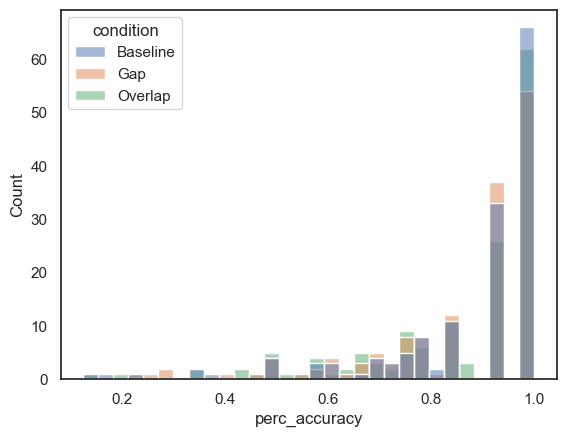

In [240]:
sns.histplot(acc_per_sub_s, x="perc_accuracy", hue="condition", bins=30)

### Anova to test differences 

#### Assumption of normality

In [241]:
pg.normality(data=acc_per_sub_s, dv='perc_accuracy', group='condition').round(2)

,W,pval,normal
condition,,,
Baseline,0.74,0.0,False
Gap,0.80,0.0,False
Overlap,0.80,0.0,False


#### Assumption of normality transformations

In [242]:
#Applied various trasnformations
acc_per_sub_s["log_rt"]=np.log(acc_per_sub_s.perc_accuracy)
acc_per_sub_s["sqrt_rt"]=np.sqrt(acc_per_sub_s.perc_accuracy)
acc_per_sub_s["reciprocal_rt"] = boxcox(acc_per_sub_s.perc_accuracy,-0.5)

<Axes: xlabel='reciprocal_rt', ylabel='Count'>

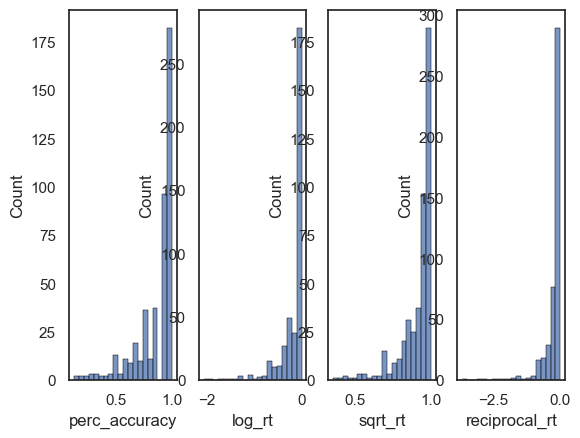

In [243]:
fig, axs = plt.subplots(ncols=4)
sns.histplot(acc_per_sub_s.perc_accuracy,edgecolor='black', bins=20, ax=axs[0])
sns.histplot(acc_per_sub_s.log_rt,edgecolor='black', bins=20, ax=axs[1])
sns.histplot(acc_per_sub_s.sqrt_rt,edgecolor='black', bins=20, ax=axs[2])
sns.histplot(acc_per_sub_s.reciprocal_rt,edgecolor='black', bins=20, ax=axs[3])


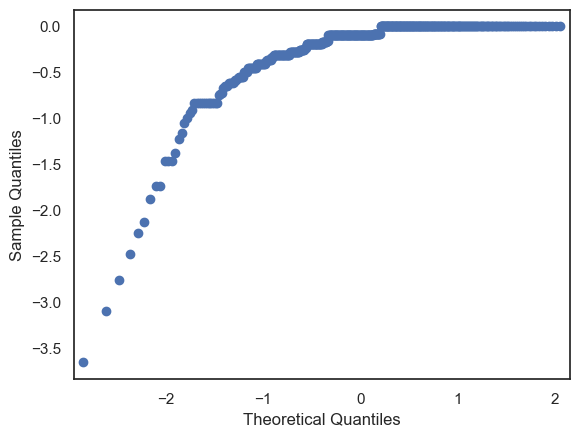

In [244]:
fig = sm.qqplot(acc_per_sub_s.reciprocal_rt, line='s')

plt.show()

In [245]:
pg.normality(data=acc_per_sub_s, dv='perc_accuracy', group='condition')

,W,pval,normal
condition,,,
Baseline,0.735383,4.455824e-15,False
Gap,0.802051,6.418641e-13,False
Overlap,0.796561,4.583574e-13,False


In [246]:
# Perform normality tests for each group and condition
results=[]
for group in acc_per_sub_s['ndd'].unique():
    for condition in acc_per_sub_s['condition'].unique():
        subset = acc_per_sub_s[(acc_per_sub_s['ndd'] == group) & (acc_per_sub_s['condition'] == condition)]
        test_result = pg.normality(subset['perc_accuracy'], method='shapiro')
        results.append({
            'ndd': group,
            'condition': condition,
            'p-value': test_result['pval'].values[0],
            'Normal': 'Yes' if test_result['pval'].values[0] > 0.05 else 'No'
        })

results_df = pd.DataFrame(results)
results_df


,ndd,condition,p-value,Normal
0,ndd,Baseline,4.134958e-08,No
1,ndd,Gap,2.630855e-07,No
2,ndd,Overlap,7.833647e-08,No
3,no_ndd,Baseline,1.621428e-12,No
4,no_ndd,Gap,2.772697e-10,No
5,no_ndd,Overlap,7.261493e-10,No


In [247]:
## Add table to the document
doc.add_heading('Normality test', level=3)

doc = df_to_table(doc, results_df)

# Add bullet point to the document

doc.add_paragraph("Not normally distributed: suggest non-parametric", style='List Bullet')

#### Assumption of sphericity (Mauchly’s test)

In [248]:

print(pg.sphericity(data=acc_per_sub_s, dv='perc_accuracy', subject='subject', within='condition')[-1])

# Perform Levene's test for homogeneity of variance
pg.homoscedasticity(data=acc_per_sub_s, dv='perc_accuracy', group='ndd', method='levene')

0.942476738895186


,W,pval,equal_var
levene,NaN,NaN,False


In [249]:
# Add assumption results to the document as bullet points

doc.add_paragraph(f"Sphericity: {pg.sphericity(data=acc_per_sub_s, dv='perc_accuracy', subject='subject', within='condition')[-1]}", style='List Bullet')

#doc.add_paragraph(f"Levene's test for homogeneity of variance: {pg.homoscedasticity(data=acc_per_sub_s, dv='perc_accuracy', group='ndd', method='levene')}", style='List Bullet')

In [250]:
### Friedman Test (non-parametric)
pg.friedman(data=acc_per_sub_s, dv="perc_accuracy", within="condition", subject="subject").round(3)

,Source,W,ddof1,Q,p-unc
Friedman,condition,0.034,2,9.99,0.007


In [251]:
doc.add_heading('Friedman test for each group and condition', level=3)


In [252]:
# Add to the document
doc.add_paragraph('Friedman test for each condition across participants', style='List Bullet')

# Add table to the document
doc = df_to_table(doc, pg.friedman(data=acc_per_sub_s, dv="perc_accuracy", within="condition", subject="subject").round(3))

In [253]:
posthocs=sp.posthoc_conover_friedman(a=acc_per_sub_s, y_col="perc_accuracy", group_col="condition", block_col="subject", 
                                 p_adjust="fdr_bh", melted=True)
posthocs["Condition"]= posthocs.index
posthocs=posthocs[["Condition","Baseline","Overlap","Gap"]]
posthocs

,Condition,Baseline,Overlap,Gap
Baseline,Baseline,1.000000,0.003933,0.010298
Gap,Gap,0.010298,0.602002,1.000000
Overlap,Overlap,0.003933,1.000000,0.602002


In [254]:
# Add to the document
doc.add_paragraph('Post-hoc testing for each condition', style='List Bullet')

# Add table to the document
doc = df_to_table(doc, posthocs)

In [255]:
# Friedman for each group and condition

#NDD
print ("Friedmans for NDD")
pg.friedman(data=acc_per_sub_s.loc[acc_per_sub_s.ndd=="ndd"] , dv="perc_accuracy", within="condition", subject="subject").round(3)


Friedmans for NDD


,Source,W,ddof1,Q,p-unc
Friedman,condition,0.057,2,9.178,0.01


In [256]:
#Control
print ("Friedmans for Control")
pg.friedman(data=acc_per_sub_s.loc[acc_per_sub_s.ndd=="control"] , dv="perc_accuracy", within="condition", subject="subject").round(3)


Friedmans for Control


c:\Users\gabot\anaconda3\lib\site-packages\pingouin\nonparametric.py:715: RuntimeWarning: invalid value encountered in double_scalars
  W = (12 * ssbn - 3 * n**2 * k * (k + 1) ** 2) / (n**2 * k * (k - 1) * (k + 1) - n * ties)


,Source,W,ddof1,Q,p-unc
Friedman,condition,NaN,-1,NaN,NaN


In [257]:
# Add resuls to the document

# Add bullet points
doc.add_paragraph('Friedman test NDD group', style='List Bullet')

# Add table to the document
doc = df_to_table(doc, pg.friedman(data=acc_per_sub_s.loc[acc_per_sub_s.ndd=="ndd"] , dv="perc_accuracy", within="condition", subject="subject").round(3))

doc.add_paragraph('Friedman test Control group', style='List Bullet')
doc = df_to_table(doc, pg.friedman(data=acc_per_sub_s.loc[acc_per_sub_s.ndd=="control"] , dv="perc_accuracy", within="condition", subject="subject").round(3))


c:\Users\gabot\anaconda3\lib\site-packages\pingouin\nonparametric.py:715: RuntimeWarning: invalid value encountered in double_scalars
  W = (12 * ssbn - 3 * n**2 * k * (k + 1) ** 2) / (n**2 * k * (k - 1) * (k + 1) - n * ties)


In [258]:
# Mann Whitney U test for each differeences between groups for each condition 
pg.pairwise_ttests(data=acc_per_sub_s, dv='perc_accuracy', between='ndd', within='condition', subject='subject', parametric=False, padjust='fdr_bh').round(3)


c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)
c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,condition,A,B,Paired,Parametric,U-val,W-val,alternative,p-unc,p-corr,p-adjust,hedges
0,condition,-,Baseline,Gap,True,False,NaN,1883.0,two-sided,0.027,0.040,fdr_bh,0.111
1,condition,-,Baseline,Overlap,True,False,NaN,1274.5,two-sided,0.010,0.030,fdr_bh,0.142
2,condition,-,Gap,Overlap,True,False,NaN,2680.0,two-sided,0.743,0.743,fdr_bh,0.036
3,ndd,-,ndd,no_ndd,False,False,1869.0,NaN,two-sided,0.002,NaN,NaN,-0.512
4,condition * ndd,Baseline,ndd,no_ndd,False,False,2018.0,NaN,two-sided,0.007,0.011,fdr_bh,-0.408
5,condition * ndd,Gap,ndd,no_ndd,False,False,1871.0,NaN,two-sided,0.001,0.004,fdr_bh,-0.537
6,condition * ndd,Overlap,ndd,no_ndd,False,False,2158.0,NaN,two-sided,0.037,0.037,fdr_bh,-0.406


### Plotting accuracy 

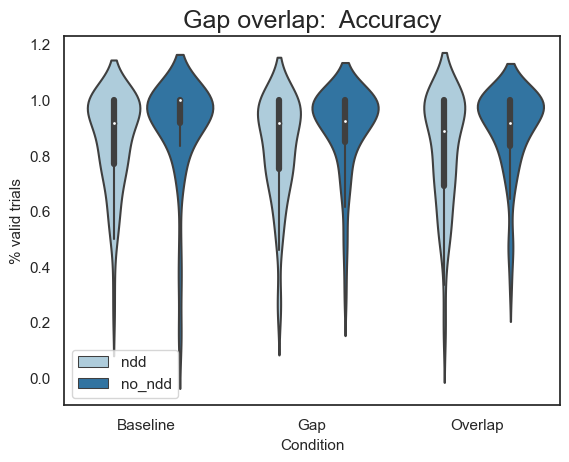

In [259]:
sns.violinplot(x="condition", y="perc_accuracy", data=acc_per_sub_s, palette="Paired", hue="ndd", 
        ).set_title('Gap overlap:  Accuracy',fontsize=18)

plt.grid(False)
plt.ylabel('% valid trials',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='lower left')

#plt.ylim([0.7,1.2])

# Save the figure
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/accuracy_conditions_{date}.png")

plt.show()

# Add the figure to the document
doc.add_heading('Accuracy figure ', level=4)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/accuracy_conditions_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))



#### Outlier rejection based on accuracy 

In [260]:
# Remove subjects with more than 40% failed trials
p13 = f"Removing {len(bad_subjects)} subjects that did not meet the criteria"
print (p13)
doc.add_paragraph(p13,style='List Bullet')

# Total number of subjects before removing bad subjects
p14 = f"Total number of subjects before removing bad subjects: {len(go_df.subject.unique())}"
print(p14)
doc.add_paragraph(p14,style='List Bullet')

if outlier_rem:
    go_df = go_df[~go_df["subject"].isin(bad_subjects)]

# Total subject after removing bad subjects
p15 = f"Total number of subjects after removing bad subjects: {len(go_df.subject.unique())}"
print (p15)
doc.add_paragraph(p15,style='List Bullet')


Removing 6 subjects that did not meet the criteria
Total number of subjects before removing bad subjects: 155
Total number of subjects after removing bad subjects: 149


In [261]:
no_outliers_acc_sub=go_df[go_df.GO_VALID==True].groupby(["subject","condition"])["GO_VALID"].count()/go_df.groupby(["subject","condition","ndd"])["GO_VALID"].count()
no_outliers_acc_sub=no_outliers_acc_sub.reset_index().rename(columns={"GO_VALID":"perc_accuracy"})
no_outliers_acc_sub=no_outliers_acc_sub.round(2)
no_outliers_acc_sub

,subject,condition,ndd,perc_accuracy
0,0042P,Baseline,ndd,0.92
1,0042P,Gap,ndd,1.00
2,0042P,Overlap,ndd,1.00
3,0043F1,Baseline,no_ndd,1.00
4,0043F1,Gap,no_ndd,1.00
...,...,...,...,...
441,1147S1,Gap,no_ndd,1.00
442,1147S1,Overlap,no_ndd,1.00
443,1162M1,Baseline,ndd,0.80
444,1162M1,Gap,ndd,0.75


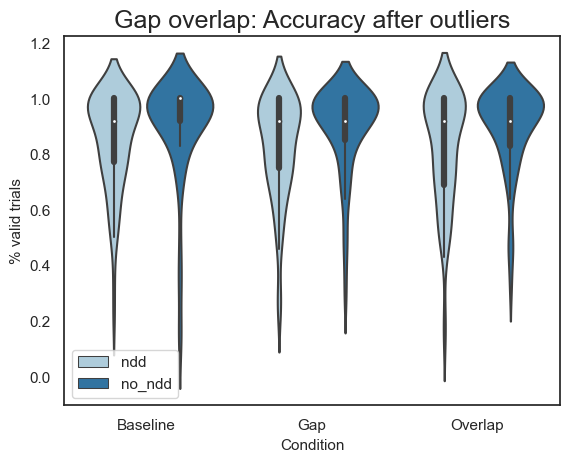

In [262]:
sns.violinplot(x="condition", y="perc_accuracy", data=no_outliers_acc_sub, palette="Paired", hue="ndd", 
        ).set_title('Gap overlap: Accuracy after outliers',fontsize=18)

plt.grid(False)
plt.ylabel('% valid trials',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='lower left')

#plt.ylim([0.7,1.2])

# Save the figure
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/accuracy_conditions__after_outliers{date}.png")

plt.show()

# Add the figure to the document
doc.add_heading('Accuracy figure ', level=4)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/accuracy_conditions__after_outliers{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))



## Differences in reaction time 

In [263]:
#Remove failed trials, those with negative reaction times and reaction times abova 1 second
go_rt=go_df[go_df.GO_VALID]
#go_rt=go_rt.loc[(go_rt.GO_SAC_RT>0) & (go_rt.GO_SAC_RT<1000)]

In [264]:
go_rt_sub=pd.DataFrame(go_rt).reset_index().rename(columns={"GO_SAC_RT":"rt"})
rt_decriptive_stats=go_rt_sub.groupby(["condition"]).rt.describe().reset_index()
rt_decriptive_stats.round(2)

,condition,count,mean,std,min,25%,50%,75%,max
0,Baseline,1603.0,282.91,124.98,113.92,207.98,251.60,316.15,1172.82
1,Gap,1557.0,251.10,128.74,114.00,163.00,216.00,299.00,1172.00
2,Overlap,1549.0,348.06,166.95,114.12,244.50,306.76,394.48,1179.46


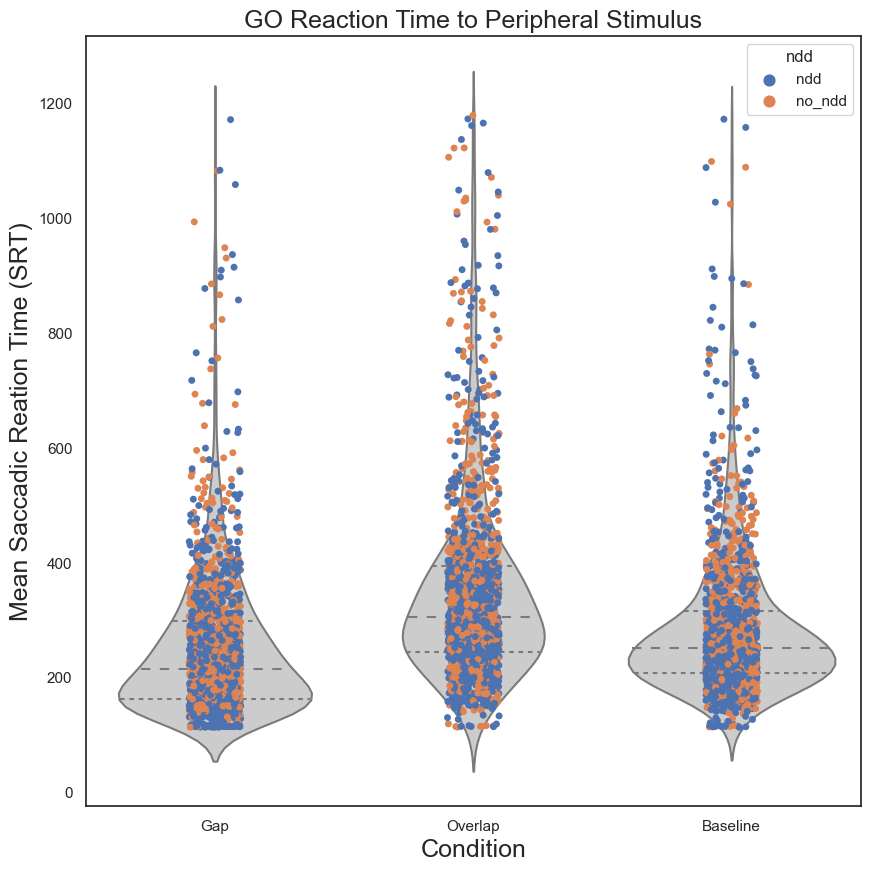

In [265]:
ax = plt.figure(figsize=(10, 10))
ax = sns.violinplot(x="condition", y="rt", inner='quartile', data=go_rt_sub, 
                    color=".8").set_title('GO Reaction Time to Peripheral Stimulus',fontsize=18)
ax = sns.stripplot(x="condition", y="rt", hue="ndd", data=go_rt_sub)
ax = plt.ylabel('Mean Saccadic Reation Time (SRT)',fontsize=18)
ax = plt.xlabel('Condition',fontsize=18)
#plt.savefig('go_plot_1.png')

Text(0.5, 1.0, 'Mean Saccadic Reaction Time as a function of task condition')

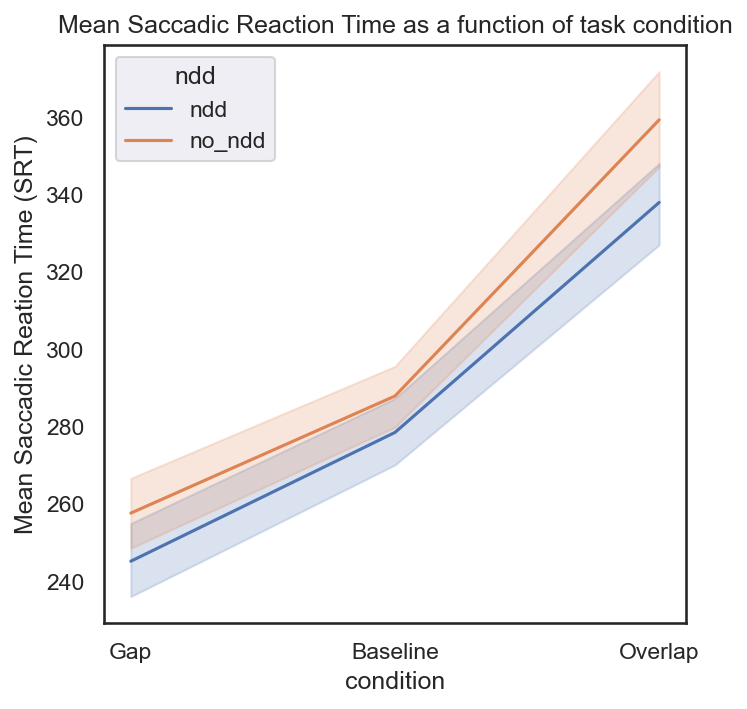

In [266]:
fig, ax = plt.subplots(figsize=(5, 5), dpi=150)
sns.set_theme(style="darkgrid")

go_rt_sub.condition = pd.Categorical(go_rt_sub.condition, 
                      categories=["Gap", "Baseline", "Overlap"],
                      ordered=True)

sns.lineplot(x = 'condition', y = 'rt', data=go_rt_sub, ax=ax, hue='ndd')
ax.set_ylabel('Mean Saccadic Reation Time (SRT)')
ax.set_title('Mean Saccadic Reaction Time as a function of task condition')
#plt.savefig('go_plot_2.png')

### Outlier detection for each subject

In [267]:
go_rt_sub

,index,subject,Trial_Index_,condition,detail,rt,GO_VALID,age,site,sex,ndd,q1k_ID,record_id,group,age_group
0,0,0042P,1,Gap,Left,310.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
1,1,0042P,2,Gap,Left,226.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
2,2,0042P,3,Overlap,Right,248.15,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
3,3,0042P,4,Gap,Left,286.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
4,4,0042P,5,Gap,Left,182.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4704,5550,1162M1,35,Overlap,Right,591.16,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
4705,5551,1162M1,36,Overlap,Left,413.91,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
4706,5552,1162M1,37,Overlap,Left,473.99,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
4707,5553,1162M1,38,Overlap,Left,374.08,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult


In [268]:
# Remove outliers for each subject

n_before = len(go_rt_sub)
print ("Toral number of trials before removal: ", n_before)
summary_outliers= []
for sub in go_rt_sub.subject.unique():
    df=go_rt_sub.loc[go_rt_sub.subject==sub]
    # Function to perform outlier removal using IQR
    Q1 = df["rt"].quantile(0.25)
    Q3 = df["rt"].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR # Should be 1.5 but can be adjusted to 3
    upper_bound = Q3 + 1.5 * IQR
    df_filtered = df[(df["rt"] >= lower_bound) & (df["rt"] <= upper_bound)]
    df_removed = df[(df["rt"] < lower_bound) | (df["rt"] > upper_bound)]
    summary_outliers.append(df_removed)

    if outlier_rem:

        # Check if they have at least 7 trials per condition 
        if (df_filtered.groupby(["condition"]).size() < 8).all():
            continue
        # Remove the outlier trials from the main dataframe
        else:
            go_rt_sub = go_rt_sub[~go_rt_sub.index.isin(df_removed.index)]    
        print( "Subject: ", sub, "n trials removed: ", len(df_removed), "% left: ", len(df_filtered)/len(df)*100)
    else:
        print( "no outlier removal")

n_after = len(go_rt_sub)
print ("Toral number of trials after removal: ", n_after)
summary_outliers_df = pd.concat(summary_outliers, axis=0)

Toral number of trials before removal:  4709
Subject:  0042P n trials removed:  0 % left:  100.0
Subject:  0043F1 n trials removed:  1 % left:  97.22222222222221
Subject:  0050M1 n trials removed:  0 % left:  100.0
Subject:  0050P n trials removed:  3 % left:  90.9090909090909
Subject:  0062P n trials removed:  1 % left:  97.05882352941177
Subject:  0064M1 n trials removed:  1 % left:  96.875
Subject:  0064S1 n trials removed:  3 % left:  90.625
Subject:  0068F1 n trials removed:  2 % left:  94.11764705882352
Subject:  0068M1 n trials removed:  4 % left:  88.88888888888889
Subject:  0068S1 n trials removed:  2 % left:  93.54838709677419
Subject:  0068S3 n trials removed:  4 % left:  86.20689655172413
Subject:  0083P n trials removed:  1 % left:  96.96969696969697
Subject:  0086F1 n trials removed:  3 % left:  91.66666666666666
Subject:  0086M1 n trials removed:  1 % left:  97.14285714285714
Subject:  0086S1 n trials removed:  2 % left:  94.28571428571428
Subject:  0093O1 n trials remov

In [269]:
# Calculate the number of trials removed and how many per condition
summary_outliers_df.groupby(["condition"]).size().reset_index(name="n_removed")

,condition,n_removed
0,Gap,53
1,Baseline,61
2,Overlap,154


In [270]:
# Calculate the number of trials removed per subject and condition
summary_outliers_df2=summary_outliers_df.groupby(["subject", "condition"]).size().reset_index(name="n_trials_removed").pivot(index="subject", columns="condition", values="n_trials_removed")

In [271]:
summary_outliers_df2

condition,Gap,Baseline,Overlap
subject,,,
0043F1,0,0,1
0050P,0,0,3
0062P,0,0,1
0064M1,0,0,1
0064S1,1,1,1
...,...,...,...
1125P,1,0,0
1134M1,0,1,0
1134S1,1,1,3


In [272]:
# Add number of trials removed to the document
doc.add_heading('Reaction time analysis', level=1)

doc.add_heading('Outliers removal', level=2)

doc.add_paragraph(f"Total number of trials before removal: {n_before}", style='List Bullet')

doc.add_paragraph(f"Total number of trials after removal: {n_after}", style='List Bullet')

doc.add_heading('Number of trials removed per condition', level=3)

doc = df_to_table(doc, summary_outliers_df.groupby(["condition"]).size().reset_index(name="n_removed"))




In [273]:
# Createa a table with the rt time descriptive stats for both groups
rt_groups=go_rt_sub.groupby(["subject", "ndd", "condition"])["rt"].mean().reset_index().groupby(["ndd", "condition"])["rt"].describe().reset_index()

# Roudn and select important columns
rt_groups=rt_groups[["ndd", "condition", "mean", "std"]].round(2)

# Create table for combined groups

rt_combined=go_rt_sub.groupby(["subject", "condition"])["rt"].mean().reset_index().groupby(["condition"])["rt"].describe().reset_index()

# Roudn and select important columns
rt_combined=rt_combined[["condition", "mean", "std"]].round(2)
rt_combined["ndd"]="combined"

# Merge tables
rt_combined=pd.concat([rt_groups, rt_combined], axis=0)

# Pivot table
rt_combined = rt_combined.pivot(index="ndd", columns="condition", values=["mean", "std"]).reset_index()
rt_combined

ndd    mean                     std                 
condition               Gap Baseline Overlap    Gap Baseline Overlap
0          combined  242.95   271.40  312.98  62.89    57.54   72.87
1               ndd  240.83   263.26  304.02  70.29    64.59   72.50
2            no_ndd  245.48   281.09  323.85  53.16    46.45   72.38

In [274]:
# Add to the document
doc.add_heading('Reaction Time descriptive stats', level=3)

doc = df_to_table(doc, rt_combined)


In [275]:
go_rt_sub

,index,subject,Trial_Index_,condition,detail,rt,GO_VALID,age,site,sex,ndd,q1k_ID,record_id,group,age_group
0,0,0042P,1,Gap,Left,310.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
1,1,0042P,2,Gap,Left,226.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
2,2,0042P,3,Overlap,Right,248.15,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
3,3,0042P,4,Gap,Left,286.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
4,4,0042P,5,Gap,Left,182.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4704,5550,1162M1,35,Overlap,Right,591.16,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
4705,5551,1162M1,36,Overlap,Left,413.91,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
4706,5552,1162M1,37,Overlap,Left,473.99,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
4707,5553,1162M1,38,Overlap,Left,374.08,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult


In [276]:
ndd_trials=go_rt_sub.loc[go_rt_sub.ndd=="ndd"].groupby(["subject", "condition"]).size().reset_index(name="ndd").groupby(["condition"]).mean().T
ctrl_trials=go_rt_sub.loc[go_rt_sub.ndd=="control"].groupby(["subject", "condition"]).size().reset_index(name="control").groupby(["condition"]).mean().T
combined_trials=go_rt_sub.groupby(["subject", "condition"]).size().reset_index(name="combined").groupby(["condition"]).mean().T

# Merge tables
combined_trials=pd.concat([ndd_trials, ctrl_trials, combined_trials], axis=0)
combined_trials


C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\727017434.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ndd_trials=go_rt_sub.loc[go_rt_sub.ndd=="ndd"].groupby(["subject", "condition"]).size().reset_index(name="ndd").groupby(["condition"]).mean().T
C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\727017434.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ctrl_trials=go_rt_sub.loc[go_rt_sub.ndd=="control"].groupby(["subject", "condition"]).size().reset_index(name="control").groupby(["condition"]).mean().T
C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\727017434.py:3: FutureWarning: The default 

condition,Gap,Baseline,Overlap
ndd,9.839506,10.160494,9.135802
control,NaN,NaN,NaN
combined,10.114094,10.362416,9.369128


In [277]:
# Add to the document

doc.add_heading('Number of trials per condition after outliers', level=3)
doc = df_to_table(doc, combined_trials)


In [278]:
# Check how many subjects have at least 4 trials per condition

n_trials=go_rt_sub.groupby(["subject", "condition"]).size().reset_index(name="n_trials").pivot(index="subject", columns="condition", values="n_trials")

# Check any rows with less than 4 trials
if outlier_rem:
    not_enough_trials=n_trials[n_trials < 4].dropna(how="all")
    not_enough_trials
else:
    not_enough_trials=n_trials[n_trials < 4].dropna(how="all")

    print ("No outlier removal")  





In [279]:
# Add to the document

if len(not_enough_trials) == 0:
    doc.add_paragraph("No participants with less than 4 trials per condition", style='List Bullet')
else:
    doc.add_heading('Participants with less than 4 trials per condition', level=3)

    doc = df_to_table(doc, not_enough_trials)

    doc.add_paragraph(f"Total of {len(bad_subjects)} were removed", style='List Bullet')

# Remove subjects with less than 4 trials per condition
    go_rt_sub = go_rt_sub[~go_rt_sub["subject"].isin(not_enough_trials.index)]

In [280]:
# Change age_group to object
go_rt_sub["age_group"] = go_rt_sub["age_group"].astype(str)
outlier_demo= go_rt_sub.groupby(["subject","ndd","sex","age", "site","age_group" ]).count().reset_index()
# Select important columns
outlier_demo=outlier_demo[["subject", "ndd", "sex", "age", "index", "site", "age_group"]].rename(columns={"index":"n_trials"}) 
outlier_demo

C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\560402200.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_rt_sub["age_group"] = go_rt_sub["age_group"].astype(str)


,subject,ndd,sex,age,n_trials,site,age_group
0,0043F1,no_ndd,Male,58.018873,35,hsj,adult
1,0050M1,no_ndd,Female,36.600455,35,hsj,adult
2,0050P,ndd,Female,7.573165,30,hsj,child
3,0062P,no_ndd,Female,40.209016,33,hsj,adult
4,0064M1,no_ndd,Female,38.204754,31,hsj,adult
...,...,...,...,...,...,...,...
136,1140S1,ndd,Female,9.637547,25,hsj,child
137,1147F1,no_ndd,Male,50.643180,34,hsj,adult
138,1147P,ndd,Male,16.233165,31,hsj,child
139,1147S1,no_ndd,Male,13.254322,35,hsj,child


#### Participant demographics after all outlier removal

In [281]:

# Summarize data by diagnosis groups
summary_table = outlier_demo.groupby("ndd").agg(
    n=("ndd", "count"),
    male=("sex", lambda x: (x == "male").sum()),
    female=("sex", lambda x: (x == "female").sum()),
    mean_age=("age", "mean"),
    std_age=("age", "std"),
    hsj=("site", lambda x: (x == "hsj").sum()),
    mni=("site", lambda x: (x == "mni").sum()),
    adults=("age_group", lambda x: (x == "adult").sum()),
    children=("age_group", lambda x: (x == "child").sum()),
    n_trials=("n_trials", "mean")
).reset_index()

# Add combined row for all participants
all_participants = {
    "ndd": "combined",
    "n": summary_table["n"].sum(),
    "male": summary_table["male"].sum(),
    "female": summary_table["female"].sum(),
    "mean_age": outlier_demo["age"].mean(),
    "std_age": outlier_demo["age"].std(),
    "hsj": summary_table["hsj"].sum(),
    "mni": summary_table["mni"].sum(),
    "adults": summary_table["adults"].sum(),
    "children": summary_table["children"].sum(),
    "n_trials": summary_table["n_trials"].mean()
}

summary_table = pd.concat(
    [pd.DataFrame([all_participants]), summary_table], ignore_index=True
)

# Create combined and percentage columns
summary_table["sex (M:F)"] = summary_table["male"].astype(str) + ":" + summary_table["female"].astype(str)
summary_table["sex % (M:F)"] = (
    (summary_table["male"] / summary_table["n"] * 100).round(2).astype(str)
    + ":"
    + (summary_table["female"] / summary_table["n"] * 100).round(2).astype(str)
)

summary_table["site (HSJ:MNI)"] = summary_table["hsj"].astype(str) + ":" + summary_table["mni"].astype(str)
summary_table["site % (HSJ:MNI)"] = (
    (summary_table["hsj"] / summary_table["n"] * 100).round(2).astype(str)
    + ":"
    + (summary_table["mni"] / summary_table["n"] * 100).round(2).astype(str)
)

# Drop intermediate columns to keep the table clean
summary_table.drop(columns=["male", "female", "hsj", "mni"], inplace=True)

# Rename columns for better clarity
summary_table.rename(
    columns={
        "ndd": "NDD Group",
        "n": "Total Participants",
        "mean_age": "Mean Age",
        "std_age": "Age SD",
        "adults": "Adults",
        "children": "Children",
        "n_trials": "Mean Trials"
    },
    inplace=True,
)

print(summary_table)

  NDD Group  Total Participants   Mean Age     Age SD  Adults  Children  \
0  combined                 141  27.861833  16.616077      76        65   
1       ndd                  76  19.875788  13.342122      23        53   
2    no_ndd                  65  37.199363  15.200680      53        12   

   Mean Trials sex (M:F) sex % (M:F) site (HSJ:MNI) site % (HSJ:MNI)  
0    30.725709       0:0     0.0:0.0         100:41      70.92:29.08  
1    29.605263       0:0     0.0:0.0          56:20      73.68:26.32  
2    31.846154       0:0     0.0:0.0          44:21      67.69:32.31  


In [282]:
## Add table to the document

doc.add_heading('Demographics table after outlier removal', level=3)

doc = df_to_table(doc, summary_table)


## Disengagement effect (Gap-Overlap)

In [283]:
# Add logrt to the df
go_rt_sub["log_rt"] = np.log(go_rt_sub.rt)

C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\2689860150.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_rt_sub["log_rt"] = np.log(go_rt_sub.rt)


In [284]:
go_dis=go_rt_sub[["subject","condition", "rt"]]

In [285]:
go_dis=go_dis.groupby(["subject","condition"]).mean().reset_index()

In [286]:
go_grouped= go_dis
go_grouped #.dropna(inplace=True)

# check for na 
go_grouped[go_grouped.isna().any(axis=1)]

,subject,condition,rt


In [287]:
## Add demographic back to go_grouped
go_grouped=pd.merge(go_grouped, demo_df, on="subject", how="inner")


### Anova to test differences 

#### Assumption of normality

In [288]:
pg.normality(data=go_grouped, dv='rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.959773,0.000340,False
Baseline,0.942620,0.000013,False
Overlap,0.958784,0.000277,False


In [289]:
# Perform normality tests for each group and condition
results=[]

for group in go_grouped['ndd'].unique():
    for condition in go_grouped['condition'].unique():
        subset = go_grouped[(go_grouped['ndd'] == group) & (go_grouped['condition'] == condition)]
        test_result = pg.normality(subset['rt'], method='shapiro')
        results.append({
            'ndd': group,
            'condition': condition,
            'p-value': test_result['pval'].values[0],
            'Normal': 'Yes' if test_result['pval'].values[0] > 0.05 else 'No'
        })

results_df = pd.DataFrame(results)


results_df

,ndd,condition,p-value,Normal
0,ndd,Gap,0.001327,No
1,ndd,Baseline,0.000029,No
2,ndd,Overlap,0.054233,Yes
3,no_ndd,Gap,0.083722,Yes
4,no_ndd,Baseline,0.044967,No
5,no_ndd,Overlap,0.002349,No


#### Assumption of normality transformations

In [290]:
# Add assumption results to the document as bullet points

doc.add_heading('ANOVA Assupmtions', level=2)
tests_passed= len(results_df.loc[results_df.Normal=="Yes"])
doc.add_paragraph(f"Normality test: Total of tests passed {tests_passed}", style='List Bullet')

In [291]:
#Applied various trasnformations
go_grouped["log_rt"]=np.log(go_grouped.rt)
go_grouped["sqrt_rt"]=np.sqrt(go_grouped.rt)
go_grouped["reciprocal_rt"] = boxcox(go_grouped.rt,-0.5)

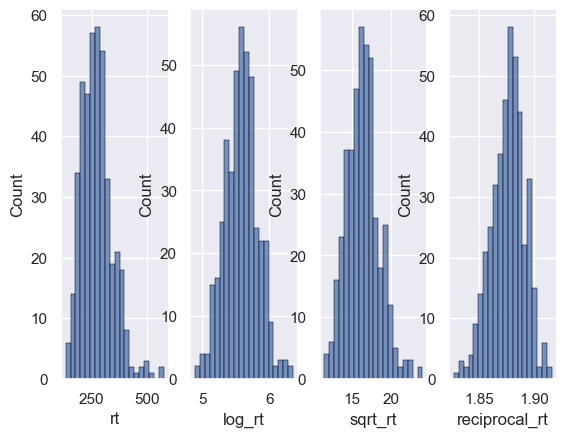

In [292]:
fig, axs = plt.subplots(ncols=4)
sns.histplot(go_grouped.rt,edgecolor='black', bins=20, ax=axs[0])
sns.histplot(go_grouped.log_rt,edgecolor='black', bins=20, ax=axs[1])
sns.histplot(go_grouped.sqrt_rt,edgecolor='black', bins=20, ax=axs[2])
sns.histplot(go_grouped.reciprocal_rt,edgecolor='black', bins=20, ax=axs[3])

# Save the figure in doc folder and then doc 



# Save the figure
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/rt_transformations_{date}.png")

plt.show()

# Add the figure to the document
doc.add_heading('Transformations figure  ', level=4)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/rt_transformations_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))



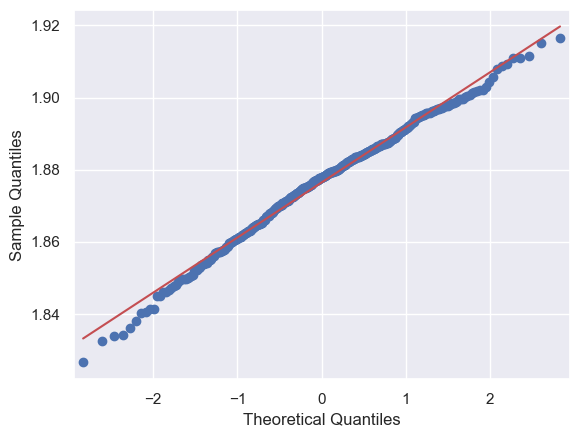

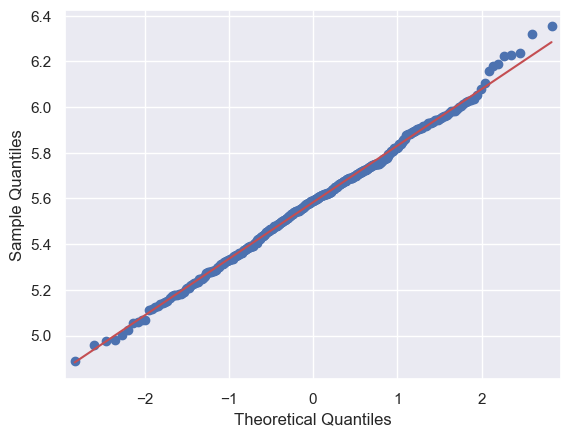

In [293]:
fig = sm.qqplot(go_grouped.reciprocal_rt, line='s')

fig = sm.qqplot(go_grouped.log_rt, line='s')

plt.show()

In [294]:
pg.normality(data=go_grouped, dv='log_rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.991259,0.521590,True
Baseline,0.989497,0.359037,True
Overlap,0.992265,0.629618,True


In [ ]:
# Perform normality tests for each group and condition
results=[]

for group in go_grouped['ndd'].unique():
    for condition in go_grouped['condition'].unique():
        subset = go_grouped[(go_grouped['ndd'] == group) & (go_grouped['condition'] == condition)]
        test_result = pg.normality(subset['log_rt'], method='shapiro')
        results.append({
            'ndd': group,
            'condition': condition,
            'p-value': test_result['pval'].values[0],
            'Normal': 'Yes' if test_result['pval'].values[0] > 0.05 else 'No'
        })

results_df = pd.DataFrame(results)


results_df

,ndd,condition,p-value,Normal
0,ndd,Gap,0.334524,Yes
1,ndd,Baseline,0.223494,Yes
2,ndd,Overlap,0.972915,Yes
3,no_ndd,Gap,0.979716,Yes
4,no_ndd,Baseline,0.535893,Yes
5,no_ndd,Overlap,0.506392,Yes


In [296]:
# Add assumptions to the document

tests_passed= len(results_df.loc[results_df.Normal=="Yes"])
doc.add_paragraph(f"Normality test: Total of tests passed with Log_RT {tests_passed}", style='List Bullet')

#### Assumption of sphericity (Mauchly’s test)

In [297]:
pg.sphericity(data=go_grouped, dv='log_rt', subject='subject', within='condition', method='mauchly')

SpherResults(spher=False, W=0.8217007314372718, chi2=27.689442369075653, dof=2, pval=9.712118798914318e-07)

In [298]:
# Add to doc 
if pg.sphericity(data=go_grouped, dv='log_rt', subject='subject', within='condition')[-1] < 0.05:
    p16= "Assumption of sphericity is violated : " + str(pg.sphericity(data=go_grouped, dv='log_rt', subject='subject', within='condition')[-1].round(4))
    print(p16)
    # Add to doc 
    doc.add_paragraph(p16, style='List Bullet')
else:
    print("Assumption of sphericity is met")
    doc.add_paragraph("Assumption of sphericity is met", style='List Bullet')


Assumption of sphericity is violated : 0.0


#### Assumptions of Levenes test

In [299]:
# Calculte levels test assumptions 
pg.homoscedasticity(data=go_grouped, dv='log_rt', group='ndd', method='levene')

,W,pval,equal_var
levene,5.979424,0.014877,False


In [300]:
if pg.homoscedasticity(data=go_grouped, dv='log_rt', group='ndd', method='levene')["pval"].values[0] < 0.05:
   # p17= "Assumption of homoscedasticity is violated" + str(pg.homoscedasticity(data=go_grouped, dv='log_rt', group='ndd', method='levene')[-1])
    #print(p17)
    print("Assumption of homoscedastic is violated")
    # Add to doc 
    #doc.add_paragraph(p17, style='List Bullet')
else: 
    print("Assumption of homoscedastic is met")
    doc.add_paragraph("Assumption of homoscedastic is met", style='List Bullet')

Assumption of homoscedastic is violated


In [301]:
#IF not met 
# 
# ### Friedman Test (non-parametric)
#pg.friedman(data=go_grouped, dv="log_rt", within="condition", subject="subject").round(3)

#sp.posthoc_conover_friedman(a=go_grouped, y_col="rt", group_col="condition", block_col="subject", 
                   #              p_adjust="fdr_bh", melted=True).round(5)


In [302]:
#### One-way measures ANOVA
res = pg.mixed_anova(dv="log_rt", within="condition", between="ndd", subject="subject", data=go_grouped).round(4)
res


c:\Users\gabot\anaconda3\lib\site-packages\pingouin\parametric.py:1568: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)


,Source,SS,DF1,DF2,MS,F,p-unc,p-GG-corr,np2,eps,sphericity,W-spher,p-spher
0,ndd,0.5338,1,141,0.5338,4.6211,0.0333,NaN,0.0317,NaN,NaN,NaN,NaN
1,condition,4.9524,2,282,2.4762,154.5185,0.0000,0.0,0.5229,0.8487,False,0.8217,0.0
2,Interaction,0.0067,2,282,0.0034,0.2106,0.8103,NaN,0.0015,NaN,NaN,NaN,NaN


In [303]:
# Add to doc 

doc.add_heading('Mixed ANOVA', level=2)

doc.add_paragraph('Mixed ANOVA results', style='List Bullet')

doc = df_to_table(doc, res)


In [304]:
post_hocs = pg.pairwise_tests(dv='log_rt', within=['condition'],
                               subject='subject', padjust='fdr_bh', data=go_grouped).round(5)
post_hocs

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,Baseline,Gap,True,True,8.47564,142.0,two-sided,0.0,0.0,fdr_bh,2.443e+11,0.54407
1,condition,Baseline,Overlap,True,True,-11.48742,142.0,two-sided,0.0,0.0,fdr_bh,8.524e+18,-0.65430
2,condition,Gap,Overlap,True,True,-14.87959,142.0,two-sided,0.0,0.0,fdr_bh,3.513e+27,-1.12492


In [305]:
# Add to doc
doc.add_heading('Post-hoc tests', level=2)

doc.add_paragraph('Post-hoc tests results', style='List Bullet')

doc = df_to_table(doc, post_hocs)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


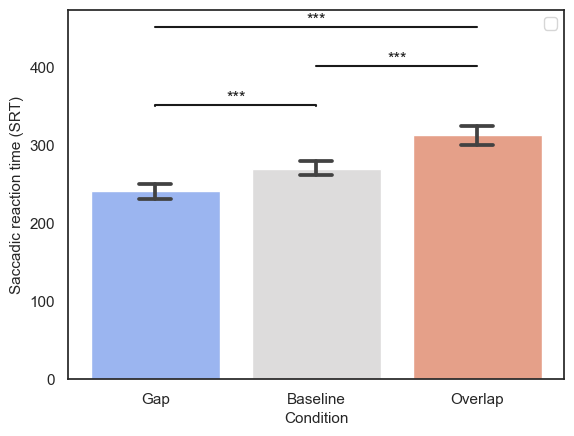

In [306]:
sns.set_theme(style='white')
order = ["Gap", "Baseline","Overlap"]
ax=sns.barplot(x="condition", y="rt", data=go_grouped,order=order,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm").set_title("",fontsize=18)

plt.grid(False)
plt.ylabel('Saccadic reaction time (SRT)',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper right')

x1, x2 = 0,2 
y, h, col = 450 + 0.5, 0.2, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "***", ha='center', va='bottom', color=col)

x3, x2 = 0,1 
y, h, col = 350 + 0.5, 0.2, 'k'

plt.plot([x3, x3, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x3+x2)*.5, y+h, "***", ha='center', va='bottom', color=col)

x3, x2 = 1,2
y, h, col = 400 + 0.5, 0.2, 'k'

plt.plot([x3, x3, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x3+x2)*.5, y+h, "***", ha='center', va='bottom', color=col)



plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/rt_conditions_{date}.png")
plt.show()


# Add the figure to the document
doc.add_heading('Reaction Time figure ', level=4)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/rt_conditions_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))




## Exploratory analyses

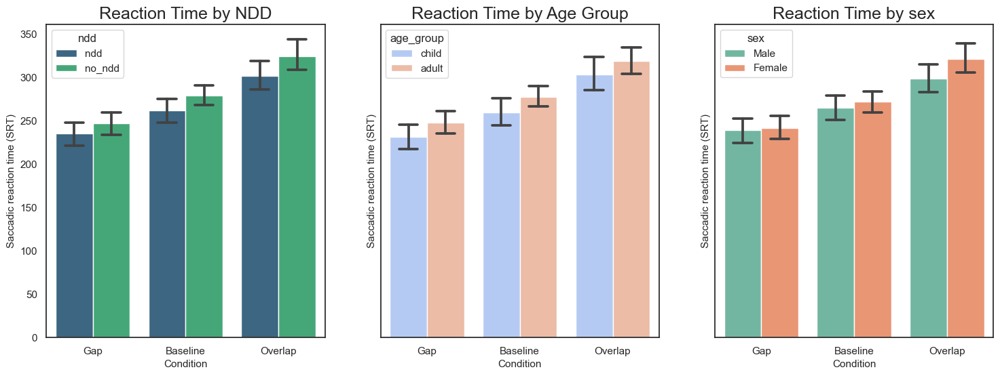

In [307]:
# Make thre pltos for reaction times for each sex and age group
fig, ax = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
sns.set_theme(style="white")

order = ["Gap", "Baseline","Overlap"]
sns.barplot(x="condition", y="rt", data=go_grouped,order=order,estimator=np.mean, ci=95, capsize=.2, hue = "ndd", ax=ax[0],
            palette="viridis").set_title("",fontsize=18)

sns.barplot(x="condition", y="rt", data=go_grouped,order=order,estimator=np.mean, ci=95, capsize=.2, hue ="age_group", ax=ax[1],
            palette="coolwarm").set_title("",fontsize=18)

sns.barplot(x="condition", y="rt", data=go_grouped,order=order,estimator=np.mean, ci=95, capsize=.2, hue= "sex", ax=ax[2],
            palette="Set2").set_title("",fontsize=18)


# Add titles to the plots
ax[0].set_title('Reaction Time by NDD',fontsize=18)
ax[1].set_title('Reaction Time by Age Group',fontsize=18)
ax[2].set_title('Reaction Time by sex',fontsize=18)

# Add labels to the plots
ax[0].set_ylabel('Saccadic reaction time (SRT)',fontsize=11)
ax[0].set_xlabel('Condition',fontsize=11)


ax[1].set_ylabel('Saccadic reaction time (SRT)',fontsize=11)
ax[1].set_xlabel('Condition',fontsize=11)

ax[2].set_ylabel('Saccadic reaction time (SRT)',fontsize=11)
ax[2].set_xlabel('Condition',fontsize=11)

# Save and add to doc 
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/exploratory_rt_conditions_grouped_{date}.png")

plt.show()

# Add the figure to the document
doc.add_heading('Reaction Time figure grouped', level=4)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/exploratory_rt_conditions_grouped_{date}.png", width=docx.shared.Inches(9), height=docx.shared.Inches(3))


### Linear model analysis 

In [308]:
# Add logrt to the df
go_rt_sub["log_rt"] = np.log(go_rt_sub.rt)

C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\2689860150.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_rt_sub["log_rt"] = np.log(go_rt_sub.rt)


In [309]:
go_dis=go_rt_sub[["subject","condition", "log_rt"]]

In [310]:
go_dis=go_dis.groupby(["subject","condition"]).mean().reset_index()

In [311]:
go_grouped= go_dis
go_grouped #.dropna(inplace=True)

# check for na 
go_grouped[go_grouped.isna().any(axis=1)]

,subject,condition,log_rt


In [312]:
## Add demographic back to go_grouped
go_grouped=pd.merge(go_grouped, demo_df, on="subject", how="inner")


In [313]:
go_grouped

,subject,condition,log_rt,age,site,sex,ndd,q1k_ID,record_id,group,age_group
0,0042P,Gap,5.437029,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
1,0042P,Baseline,5.717505,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
2,0042P,Overlap,5.755118,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult
3,0043F1,Gap,5.695441,58.018873,hsj,Male,no_ndd,Q1K_HSJ_10043_F1,45,father,adult
4,0043F1,Baseline,5.798165,58.018873,hsj,Male,no_ndd,Q1K_HSJ_10043_F1,45,father,adult
...,...,...,...,...,...,...,...,...,...,...,...
424,1147S1,Baseline,5.364899,13.254322,hsj,Male,no_ndd,Q1K_HSJ_1525-1147_S1,525-1150,sibling,child
425,1147S1,Overlap,5.596711,13.254322,hsj,Male,no_ndd,Q1K_HSJ_1525-1147_S1,525-1150,sibling,child
426,1162M1,Gap,5.512932,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult
427,1162M1,Baseline,5.520576,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult


In [314]:
## Pivot the data to obtain columns with each condition
go_dis=go_dis.pivot(index="subject",columns="condition", values="log_rt")

In [315]:
go_dis["facilitation"]=go_dis["Baseline"]-go_dis["Gap"]

In [316]:
go_dis["disengage"]=go_dis["Overlap"]-go_dis["Baseline"]

In [317]:
go_dis["gap_overlap"]=go_dis["Overlap"]-go_dis["Gap"]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


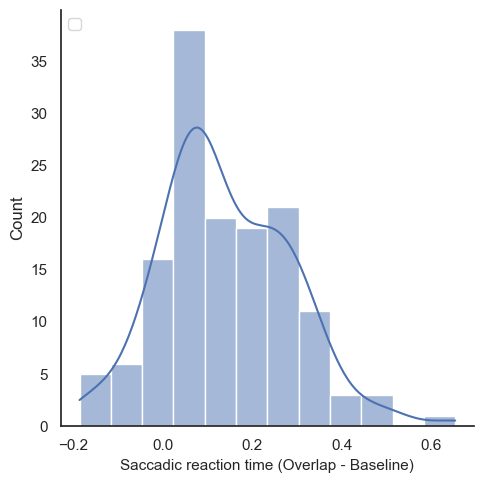

In [318]:
sns.displot(data=go_dis,x="disengage", palette="Paired", kde=True)
plt.xlabel('Saccadic reaction time (Overlap - Baseline)',fontsize=11)
plt.legend(loc='upper left')


In [319]:
go_dis

condition,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap
subject,,,,,,
0042P,5.437029,5.717505,5.755118,0.280476,0.037614,0.318089
0043F1,5.695441,5.798165,5.911835,0.102724,0.113670,0.216394
0050M1,5.596039,5.626875,5.684424,0.030836,0.057549,0.088385
0050P,5.533359,5.482190,5.706198,-0.051170,0.224008,0.172838
0062P,5.698331,5.685460,5.741635,-0.012871,0.056175,0.043304
...,...,...,...,...,...,...
1140S1,5.168022,5.498694,5.467757,0.330672,-0.030937,0.299734
1147F1,5.459696,5.700759,5.748521,0.241062,0.047763,0.288825
1147P,5.516428,5.553409,5.677342,0.036981,0.123933,0.160914


In [320]:
# Create a table with the descriptive stats for each condition and group 
go_dis_stats=go_dis.merge(demo_df[["subject","ndd"]], on="subject", how="inner").drop(columns=["Gap","Baseline","Overlap"])

# Create a table with the descriptive stats for each condition and group (only keep mean and std)
go_dis_stats=go_dis_stats.groupby(["ndd"]).describe().reset_index().round(2)

# Select only the ndd column, count, mean and std columns
go_dis_stats=go_dis_stats[[("ndd", ""),("disengage", "mean"),("disengage", "std"),("facilitation", "mean"),("facilitation", "std"),("gap_overlap", "mean"),("gap_overlap", "std")]]
#go_dis_stats=go_dis_stats[[("disengage", "mean"),("disengage", "std"),("facilitation", "mean"),("facilitation", "std"),("gap_overlap", "mean"),("gap_overlap", "std"),("disengage", "mean"),("disengage", "std")]]
go_dis_stats

ndd disengage       facilitation       gap_overlap      
               mean   std         mean   std        mean   std
0     ndd      0.14  0.14         0.13  0.18        0.28  0.20
1  no_ndd      0.14  0.15         0.14  0.15        0.28  0.21

In [321]:
# Add to the document
doc.add_heading('Facilitation and Disengagement descriptive stats', level=3)

doc = df_to_table(doc, go_dis_stats)


In [322]:
# Add a column with total number of trrials and one for overall RT
go_rt_sub["total_trials"]=go_rt_sub.groupby("subject")["rt"].transform("count")
go_rt_sub["overall_rt"]=go_rt_sub.groupby("subject")["rt"].transform("mean")
go_rt_sub


C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\1997453592.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_rt_sub["total_trials"]=go_rt_sub.groupby("subject")["rt"].transform("count")
C:\Users\gabot\AppData\Local\Temp\ipykernel_19332\1997453592.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_rt_sub["overall_rt"]=go_rt_sub.groupby("subject")["rt"].transform("mean")


,index,subject,Trial_Index_,condition,detail,rt,GO_VALID,age,site,sex,ndd,q1k_ID,record_id,group,age_group,log_rt,total_trials,overall_rt
0,0,0042P,1,Gap,Left,310.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult,5.736572,35,292.678857
1,1,0042P,2,Gap,Left,226.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult,5.420535,35,292.678857
2,2,0042P,3,Overlap,Right,248.15,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult,5.514033,35,292.678857
3,3,0042P,4,Gap,Left,286.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult,5.655992,35,292.678857
4,4,0042P,5,Gap,Left,182.00,True,30.215656,mni,NaN,ndd,Q1K_MHC_20042_P,42,proband,adult,5.204007,35,292.678857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4704,5550,1162M1,35,Overlap,Right,591.16,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult,6.382087,33,291.701515
4705,5551,1162M1,36,Overlap,Left,413.91,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult,6.025649,33,291.701515
4706,5552,1162M1,37,Overlap,Left,473.99,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult,6.161186,33,291.701515
4707,5553,1162M1,38,Overlap,Left,374.08,True,30.544205,hsj,Female,ndd,Q1K_HSJ_1525-1162_M1,525-1163,mother,adult,5.924470,33,291.701515


In [323]:
# Merge df wih demogroupic data
go_rt_sub[["subject", "total_trials", "overall_rt", "ndd", "site", "sex","age", "age_group","q1k_ID"]].drop_duplicates()

,subject,total_trials,overall_rt,ndd,site,sex,age,age_group,q1k_ID
0,0042P,35,292.678857,ndd,mni,NaN,30.215656,adult,Q1K_MHC_20042_P
35,0043F1,35,340.700571,no_ndd,hsj,Male,58.018873,adult,Q1K_HSJ_10043_F1
71,0050M1,35,285.132857,no_ndd,hsj,Female,36.600455,adult,Q1K_HSJ_10050_M1
106,0050P,30,271.362333,ndd,hsj,Female,7.573165,child,Q1K_HSJ_10050_P
139,0062P,33,311.886061,no_ndd,hsj,Female,40.209016,adult,Q1K_HSJ_10062_P
...,...,...,...,...,...,...,...,...,...
4547,1140S1,25,237.595600,ndd,hsj,Female,9.637547,child,Q1K_HSJ_1525-1140_S1
4572,1147F1,34,298.535588,no_ndd,hsj,Male,50.643180,adult,Q1K_HSJ_1525-1147_F1
4606,1147P,31,270.660645,ndd,hsj,Male,16.233165,child,Q1K_HSJ_1525-1147_P
4640,1147S1,35,228.672857,no_ndd,hsj,Male,13.254322,child,Q1K_HSJ_1525-1147_S1


In [324]:
# Merge with go_dis
go_dis = pd.merge(go_dis,go_rt_sub[["subject", "total_trials", "overall_rt", "ndd", "site", "age","sex", "age_group","q1k_ID"]].drop_duplicates(), on="subject", how="inner")


In [325]:
go_rt_sub.columns

Index(['index', 'subject', 'Trial_Index_', 'condition', 'detail', 'rt',
       'GO_VALID', 'age', 'site', 'sex', 'ndd', 'q1k_ID', 'record_id', 'group',
       'age_group', 'log_rt', 'total_trials', 'overall_rt'],
      dtype='object')

In [326]:
go_dis

,subject,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap,total_trials,overall_rt,ndd,site,age,sex,age_group,q1k_ID
0,0042P,5.437029,5.717505,5.755118,0.280476,0.037614,0.318089,35,292.678857,ndd,mni,30.215656,NaN,adult,Q1K_MHC_20042_P
1,0043F1,5.695441,5.798165,5.911835,0.102724,0.113670,0.216394,35,340.700571,no_ndd,hsj,58.018873,Male,adult,Q1K_HSJ_10043_F1
2,0050M1,5.596039,5.626875,5.684424,0.030836,0.057549,0.088385,35,285.132857,no_ndd,hsj,36.600455,Female,adult,Q1K_HSJ_10050_M1
3,0050P,5.533359,5.482190,5.706198,-0.051170,0.224008,0.172838,30,271.362333,ndd,hsj,7.573165,Female,child,Q1K_HSJ_10050_P
4,0062P,5.698331,5.685460,5.741635,-0.012871,0.056175,0.043304,33,311.886061,no_ndd,hsj,40.209016,Female,adult,Q1K_HSJ_10062_P
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,1140S1,5.168022,5.498694,5.467757,0.330672,-0.030937,0.299734,25,237.595600,ndd,hsj,9.637547,Female,child,Q1K_HSJ_1525-1140_S1
139,1147F1,5.459696,5.700759,5.748521,0.241062,0.047763,0.288825,34,298.535588,no_ndd,hsj,50.643180,Male,adult,Q1K_HSJ_1525-1147_F1
140,1147P,5.516428,5.553409,5.677342,0.036981,0.123933,0.160914,31,270.660645,ndd,hsj,16.233165,Male,child,Q1K_HSJ_1525-1147_P
141,1147S1,5.173092,5.364899,5.596711,0.191807,0.231812,0.423619,35,228.672857,no_ndd,hsj,13.254322,Male,child,Q1K_HSJ_1525-1147_S1


In [327]:
## Add new section to document 

doc.add_heading('Linear regression modelling', level=1)

In [154]:
# Plot the linear relationship between all variables 
#sns.pairplot(go_dis, hue="ndd", palette="viridis")

# Add to document 
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/pairplot_all_variables_{date}.png")

plt.show()

# Add the figure to the document
doc.add_heading('Pairplot all variables', level=2)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/pairplot_all_variables_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))


<Figure size 640x480 with 0 Axes>

### Ntrials and overall RT

In [155]:
# Create function to assess the correaltion beyween  of reaction time on the different variables

def varriable_correlation_test(data, x, y):
    # remove less than 20 trials 
    #data=data[data.total_trials>20]
    # Drop nas
    if data[x].isna().any() or data[y].isna().any():
        data=data.dropna()
        print("Dropped nas")
    else: 
        data=data

# Add to document
    r, p = stats.pearsonr(data[x], data[y])
    r= round(r, 2)
    p= round(p, 2)

    if p < 0.05:
        doc.add_heading(f"Correlation test for {x}", level=2)

        print(f"Correlation between {x} and {y} is significant: r = {r}, p = {p}")
        sns.lmplot(x=x, y=y, data=data, palette="viridis")
        
        doc.add_paragraph(f"Correlation between {x} and {y} is significant : r= {r.round(2)}, p= {p.round(2)}", style='List Bullet')

    else: 
        print(f"Correlation between {x} and {y} is not significant: r = {r}, p = {p}")
    return x, y, r, p


Correlation between total_trials and Gap is not significant: r = -0.09, p = 0.3
Correlation between total_trials and Gap is not significant: r = -0.09, p = 0.3
Correlation between total_trials and Baseline is not significant: r = 0.08, p = 0.35
Correlation between total_trials and Baseline is not significant: r = 0.08, p = 0.35
Correlation between total_trials and Overlap is not significant: r = 0.09, p = 0.28
Correlation between total_trials and Overlap is not significant: r = 0.09, p = 0.28
Correlation between total_trials and facilitation is significant: r = 0.21, p = 0.01
Correlation between total_trials and facilitation is significant: r = 0.21, p = 0.01
Correlation between total_trials and disengage is not significant: r = 0.03, p = 0.69
Correlation between total_trials and disengage is not significant: r = 0.03, p = 0.69
Correlation between total_trials and gap_overlap is significant: r = 0.19, p = 0.02
Correlation between total_trials and gap_overlap is significant: r = 0.19, p

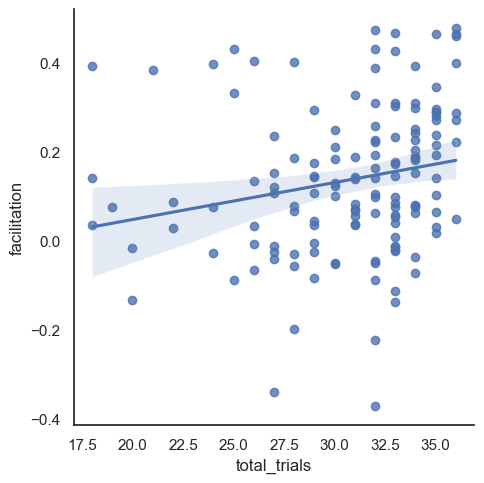

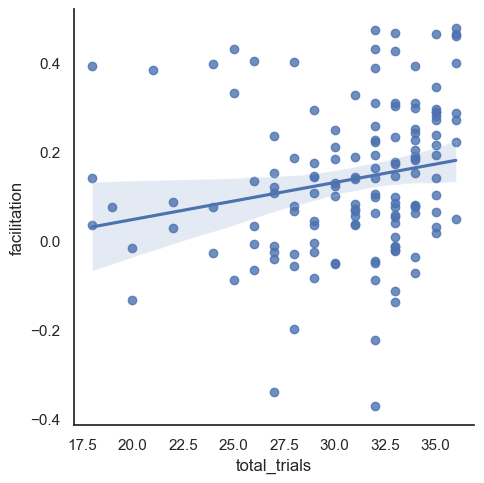

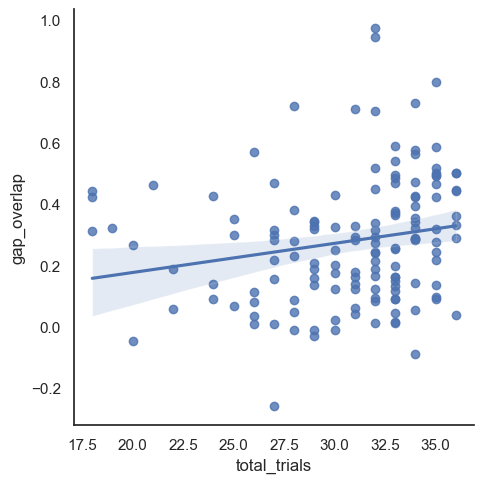

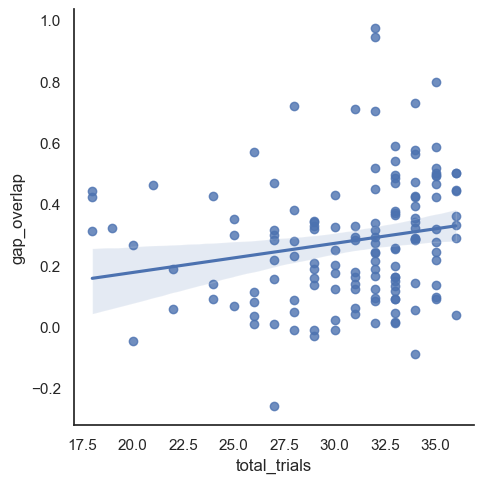

In [156]:
# Test the effects of number of trials on all reaction times 
rt_variables = ["Gap", "Baseline", "Overlap", "facilitation", "disengage", "gap_overlap"]

corr_df=[]
for var in rt_variables:
    if len(go_dis[var])<4:
        continue
    if len(go_dis["total_trials"]) < 4:
        continue
    else:    
        varriable_correlation_test(go_dis, "total_trials", var)
        corr_df.append(varriable_correlation_test(go_dis, "total_trials", var))

# Create correlation table
corr_df=pd.DataFrame(corr_df, columns=["variable_1", "variable_2", "r", "p"])
corr_df

# Add table to the document

doc= df_to_table(doc, corr_df)


### Effects of Age

Correlation between overall_rt and Gap is significant: r = 0.81, p = 0.0
Correlation between overall_rt and Gap is significant: r = 0.81, p = 0.0
Correlation between age and Gap is not significant: r = 0.15, p = 0.08
Correlation between age and Gap is not significant: r = 0.15, p = 0.08
Correlation between overall_rt and Baseline is significant: r = 0.9, p = 0.0
Correlation between overall_rt and Baseline is significant: r = 0.9, p = 0.0
Correlation between age and Baseline is significant: r = 0.17, p = 0.04
Correlation between age and Baseline is significant: r = 0.17, p = 0.04
Correlation between overall_rt and Overlap is significant: r = 0.87, p = 0.0
Correlation between overall_rt and Overlap is significant: r = 0.87, p = 0.0
Correlation between age and Overlap is not significant: r = 0.09, p = 0.3
Correlation between age and Overlap is not significant: r = 0.09, p = 0.3
Correlation between overall_rt and facilitation is not significant: r = -0.07, p = 0.41
Correlation between over

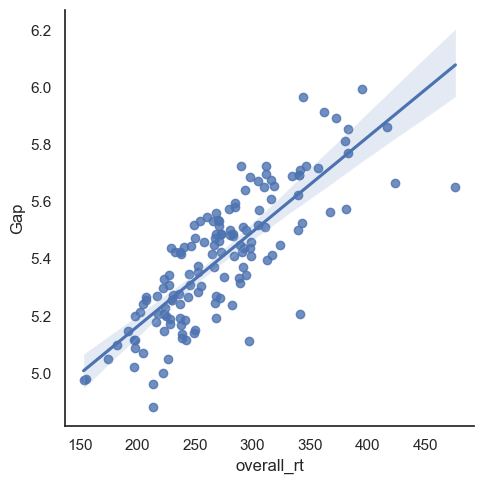

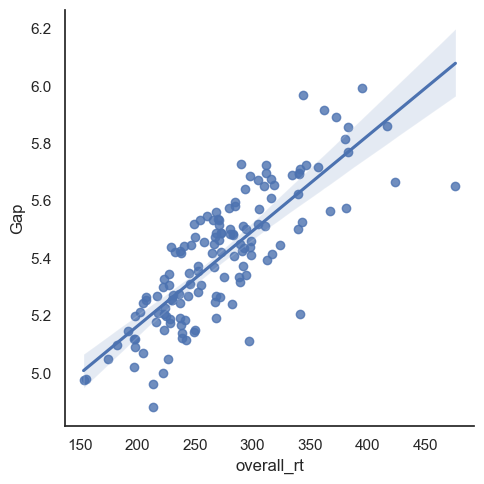

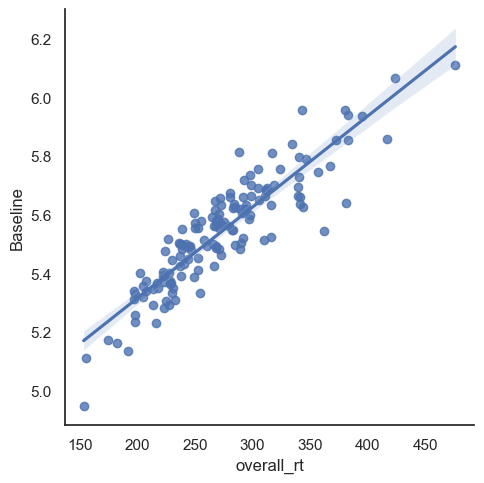

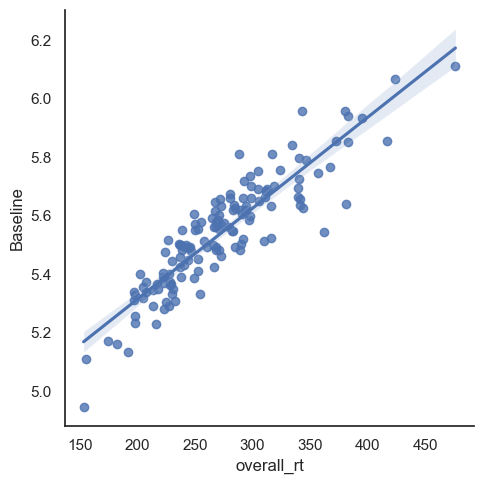

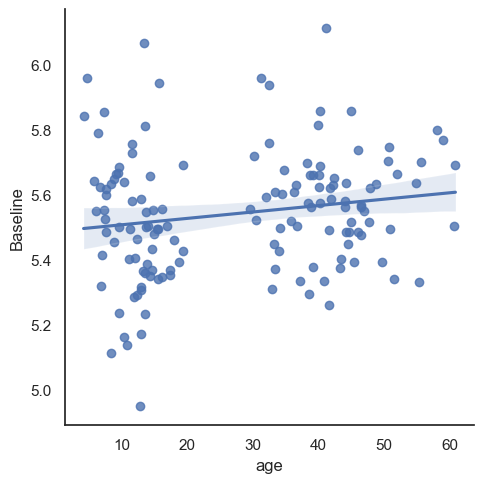

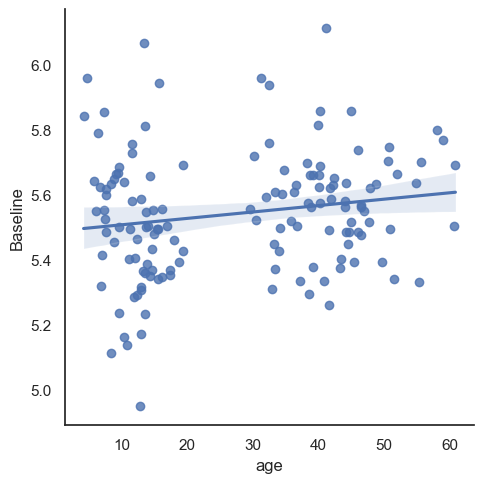

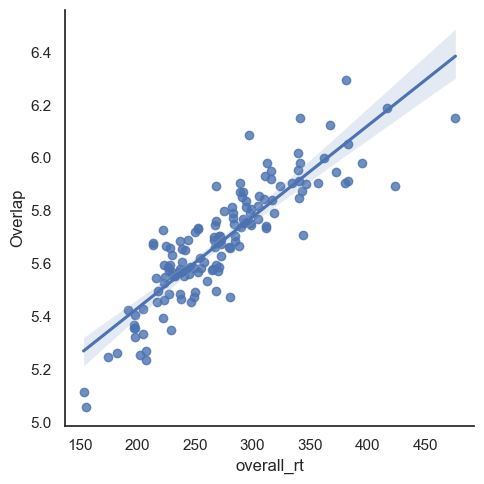

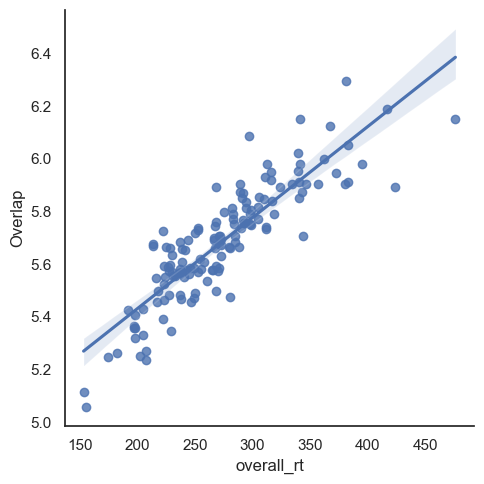

In [157]:
# Test the effects of number of trials on all reaction times 
rt_variables = ["Gap", "Baseline", "Overlap", "facilitation", "disengage", "gap_overlap"]

corr_df=[]
for var in rt_variables:
    if len(go_dis[var])<4:
        continue
    if len(go_dis["overall_rt"]) < 4:
        continue
    else:
        varriable_correlation_test(go_dis, "overall_rt", var)
        corr_df.append(varriable_correlation_test(go_dis, "overall_rt", var))
    varriable_correlation_test(go_dis, "age", var)
    corr_df.append(varriable_correlation_test(go_dis, "age", var))

# Create correlation table
corr_df=pd.DataFrame(corr_df, columns=["variable_1", "variable_2", "r", "p"])
corr_df

# Add table to the document

doc= df_to_table(doc, corr_df)


### Mixed effects linear modelling

In [158]:
import statsmodels.formula.api as smf


In [159]:
# Test the effects of group and condition on rt while accoutning for sex, age and site


# Create mixed effects model 
model_formula = "log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + age + sex + site"

# Simple model without random effects
model = smf.ols(model_formula, go_grouped).fit()

# Simple mixed effects model
model2 = smf.mixedlm(model_formula, go_grouped, groups=go_grouped["subject"],re_formula="~1").fit()

# Simple mixed effects model with random slopes 
model3 = smf.mixedlm(model_formula, go_grouped, groups=go_grouped["subject"],re_formula="~condition").fit()


#Simple mixed effects model with random slopes and intercepts
model4 = smf.mixedlm(model_formula, go_grouped, groups=go_grouped["subject"],re_formula="~1+condition").fit()

# Accounting for variance in conditons solution two
model5 = smf.mixedlm(model_formula, go_grouped, 
                    groups=go_grouped["subject"], 
                    re_formula="~1", 
                    vc_formula={"condition": "0 + C(condition)"}).fit()

# Accounting for variance in conditons solution four
weights = 1 / go_grouped.groupby("condition")["log_rt"].transform("std")**2
model5 = sm.GLS.from_formula(model_formula, go_grouped, weights=weights).fit()

# Create with log-likehood for each model 
models = [model, model2, model3, model4, model5]
log_likelihoods = [model.llf for model in models]
aic = [model.aic for model in models]
bic = [model.bic for model in models]
index = ["OLS", "MixedLM with random intercepts", "MixedLM with random intercepts and slopes", "MixedLM with random slopes", "GLS"]


# print the summary of of each model 
for model in [model, model2, model3, model4, model5]:

   print(model.summary())
   check_assumptions(model, go_grouped)
    # Create a table with the log-likelihoods, AIC and BIC
log_likelihoods_df = pd.DataFrame({"Log-likelihood": log_likelihoods, "AIC": aic, "BIC": bic}, index=index)
log_likelihoods_df


IndexError: index 420 is out of bounds for axis 0 with size 420

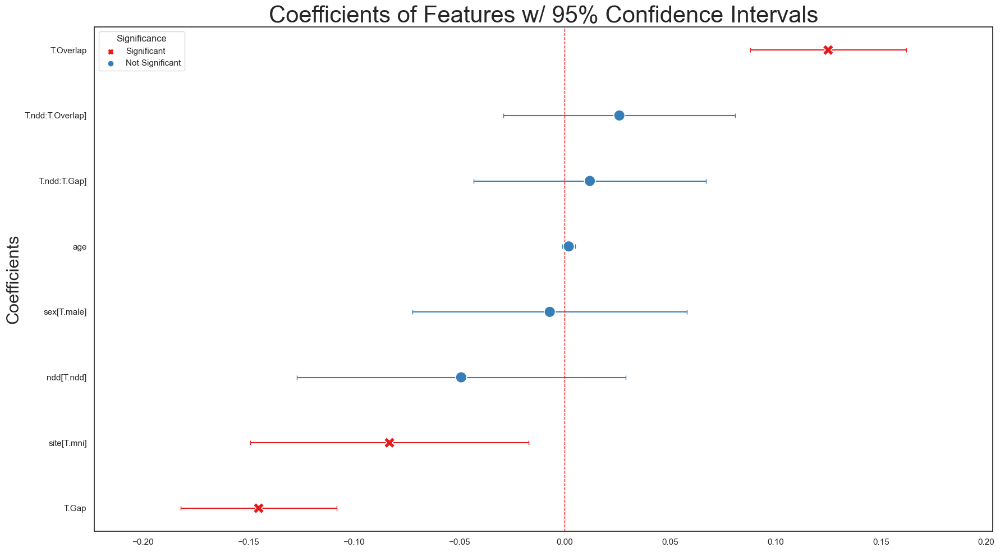

In [ ]:
# Plot coeffient for single model and save it  

# Add the figure to the document
doc.add_heading('Mixed effects model figure', level=4)

coefplot_gap(model2, multiple_models=False, fig_name="original_model")

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mixed_effects_model_original_model_{date}.png", 
                width=docx.shared.Inches(8), height=docx.shared.Inches(4))


### Mixed model for reaction time

In [ ]:
# Compare different models 

models= {"original": "log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + age + sex + site", 
                "no_interaction": "log_rt ~ ndd + C(condition, Treatment(reference='Baseline')) + age + sex + site",
                "no_age": "log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + sex + site",
                "no_covariates": "log_rt ~ ndd * C(condition, Treatment(reference='Baseline'))"}

model_comparison = {}

coeff_dfs = []

for model_name, formula in models.items():
    model = smf.mixedlm(formula, go_grouped, groups=go_grouped["subject"],re_formula="~1").fit()
    model2 = smf.mixedlm(formula, go_grouped, groups=go_grouped["subject"],re_formula="~1+condition").fit()
    model3 = smf.ols(formula, go_grouped).fit()
    # Accounting for variance in conditons solution two
    model5 = smf.mixedlm(model_formula, go_grouped, 
                        groups=go_grouped["subject"], 
                        re_formula="~1", 
                        vc_formula={"condition": "0 + C(condition)"}).fit()

    # Accounting for variance in conditons solution four
    weights = 1 / go_grouped.groupby("condition")["log_rt"].transform("std")**2
    model5 = sm.GLS.from_formula(model_formula, go_grouped, weights=weights).fit()

    # Create with log-likehood for each model 
    model_variations = [model, model2, model3, model5]
    log_likelihoods = [model.llf for model in model_variations]
    aic = [model.aic for model in model_variations]
    bic = [model.bic for model in model_variations]
    index = ["MixedLM with random intercepts", "MixedLM with random intercepts and slopes","OLS", "GLS"]


    # print the summary of of each model 
    for modelx in [model, model2, model3, model4, model5]:

       # print(model.summary())
        check_assumptions(modelx, go_grouped, show_plots=False)
        log_likelihoods_df = pd.DataFrame({"Log-likelihood": log_likelihoods, "AIC": aic, "BIC": bic}, index=index)
        log_likelihoods_df
        # Print the best model based on log likelihood
        great_model = log_likelihoods_df.idxmax()
        print(f"****Best model: {great_model}")

    # Extract log likelihood
    model_comparison[model_name] = model.llf
    print(f"Model: {model_name}")

    # Add to coeff dfs
    coef_df = pd.DataFrame(model.summary().tables[1]).reset_index()
    coef_df = coef_df.loc[coef_df["index"] != "Group Var"]
    coef_df['model'] = model_name
    
    coeff_dfs.append(coef_df)


    # Extract BIC
    if model_name=="original":
        print(model.summary())

        doc.add_heading(f"Linear model for reaction time general")
        doc.add_paragraph(f"{models[model_name]}", style='List Bullet')
        model_summary= model.summary()
        model_table=pd.DataFrame(model_summary.tables[1])
        model_table["var"] = model_table.index
        model_table = model_table[["var", "Coef.", "Std.Err.", "z", "P>|z|", "[0.025", "0.975]"]]

        doc = df_to_table(doc, model_table)
model_comparison = pd.DataFrame(model_comparison, index=["log_likelihood"]).T

# Create df with all coefficients
all_coefs = pd.concat(coeff_dfs, keys=models.keys()).reset_index()


# Print the best model based on log likelihood
best_model = model_comparison.idxmax()
print(f"Best model: {best_model}")

# Add to the document
doc.add_paragraph(f"Model comparison for reaction time general", style='List Bullet')
model_comparison["type"] = model_comparison.index
model_comparison = model_comparison[["type", "log_likelihood"]]
doc = df_to_table(doc, model_comparison)
doc.add_paragraph(f'Best model= {best_model[0]} : {models[best_model[0]]}', style='List Bullet')

# Print the summary of the best model
model = smf.mixedlm(models[best_model[0]], go_grouped, groups=go_grouped["subject"],re_formula="~1").fit()
model_summary = model.summary()
model_summary

    


c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


Residuals are not normally distributed ShapiroResult(statistic=0.9902791976928711, pvalue=0.0036567675415426493)
Residuals are not homoscedastic LeveneResult(statistic=183.5002180773276, pvalue=2.799521767167555e-38)
Bartlett’s test p-value: 7.645444066502072e-47
White test p-value: 0.008425362730487452
Levene’s test p-value for the whole model: 2.799521767167555e-38
Levene’s test p-value for variable age: 0.9766918461972487
Levene’s test p-value for variable site: 0.06791557249273808
Levene’s test p-value for variable sex: 0.214903487340209
Levene’s test p-value for variable condition: 9.212099232407706e-07
Levene’s test p-value for variable ndd: 0.5085940175823138
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     GLS
dtype: object
Residuals are not normally distributed ShapiroResult(stat

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


Residuals are not normally distributed ShapiroResult(statistic=0.9903798699378967, pvalue=0.003938730340451002)
Residuals are not homoscedastic LeveneResult(statistic=182.04595612014182, pvalue=5.156276563813563e-38)
Bartlett’s test p-value: 1.0258688312564843e-46
White test p-value: 0.0019145758083220733
Levene’s test p-value for the whole model: 5.156276563813563e-38
Levene’s test p-value for variable age: 0.9768888089212492
Levene’s test p-value for variable site: 0.09785320336275394
Levene’s test p-value for variable sex: 0.2275378445659568
Levene’s test p-value for variable condition: 1.0214578764439543e-06
Levene’s test p-value for variable ndd: 0.542908066919731
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     GLS
dtype: object
Residuals are not normally distributed ShapiroResult(s

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


Residuals are not normally distributed ShapiroResult(statistic=0.9906889796257019, pvalue=0.004953963216394186)
Residuals are not homoscedastic LeveneResult(statistic=183.2602402393227, pvalue=3.0962091328611516e-38)
Bartlett’s test p-value: 9.449183250722943e-47
White test p-value: 0.00736597535704601
Levene’s test p-value for the whole model: 3.0962091328611516e-38
Levene’s test p-value for variable age: 0.9766918461972487
Levene’s test p-value for variable site: 0.06545523240734287
Levene’s test p-value for variable sex: 0.19970509922770496
Levene’s test p-value for variable condition: 1.0156628251593894e-06
Levene’s test p-value for variable ndd: 0.5270920044469314
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     OLS
BIC                                                     GLS
dtype: object
Residuals are not normally distributed ShapiroResult(s

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


Residuals are not normally distributed ShapiroResult(statistic=0.9900048971176147, pvalue=0.0029899058863520622)
Residuals are not homoscedastic LeveneResult(statistic=182.4114817082023, pvalue=4.4221336182311576e-38)
Bartlett’s test p-value: 1.2728867083922603e-46
White test p-value: 0.0007465118749723173
Levene’s test p-value for the whole model: 4.4221336182311576e-38
Levene’s test p-value for variable age: 0.9766918461972487
Levene’s test p-value for variable site: 0.06930947219003374
Levene’s test p-value for variable sex: 0.23742293972731615
Levene’s test p-value for variable condition: 5.245069224716488e-07
Levene’s test p-value for variable ndd: 0.4839466603146252
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     OLS
BIC                                                     OLS
dtype: object
Residuals are not normally distributed ShapiroResul

<class 'statsmodels.iolib.summary2.Summary'>
"""
                                     Mixed Linear Model Regression Results
===============================================================================================================
Model:                               MixedLM                    Dependent Variable:                    log_rt  
No. Observations:                    465                        Method:                                REML    
No. Groups:                          155                        Scale:                                 0.0153  
Min. group size:                     3                          Log-Likelihood:                        137.9444
Max. group size:                     3                          Converged:                             Yes     
Mean group size:                     3.0                                                                       
---------------------------------------------------------------------------------------------------------------
                                                                    Coef.  Std.Err.    z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------------------------------------------
Intercept                                                            5.542    0.024 227.583 0.000  5.494  5.589
ndd[T.ndd]                                                          -0.048    0.036  -1.325 0.185 -0.118  0.023
C(condition, Treatment(reference='Baseline'))[T.Gap]                -0.145    0.019  -7.590 0.000 -0.182 -0.108
C(condition, Treatment(reference='Baseline'))[T.Overlap]             0.125    0.019   6.561 0.000  0.088  0.163
ndd[T.ndd]:C(condition, Treatment(reference='Baseline'))[T.Gap]      0.012    0.028   0.432 0.666 -0.043  0.068
ndd[T.ndd]:C(condition, Treatment(reference='Baseline'))[T.Overlap]  0.026    0.028   0.927 0.354 -0.029  0.081
Group Var                                                            0.034    0.045                            
===============================================================================================================

"""

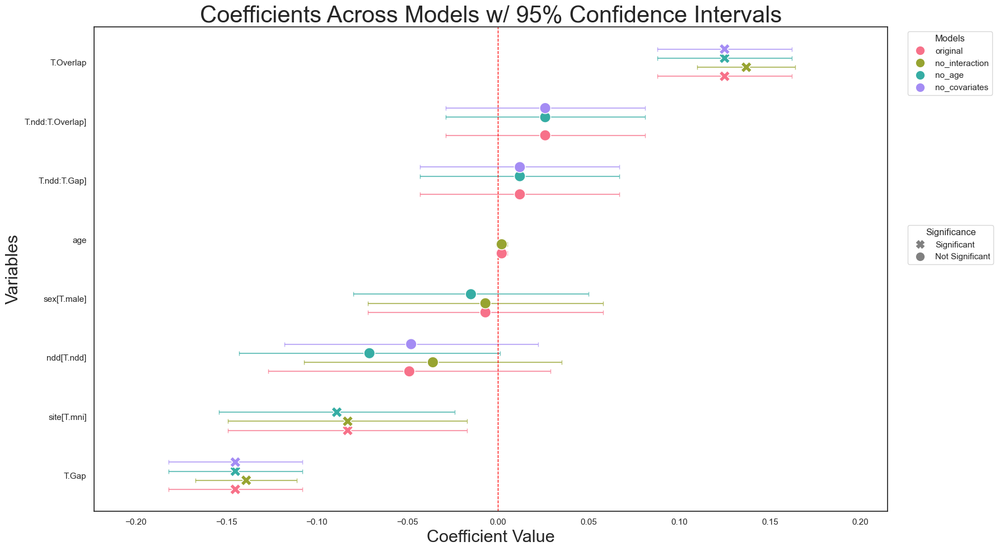

In [ ]:
# Plot the multiple models and save it to the document

# Add the figure to the document
doc.add_heading('Mixed effects model figure', level=3)

coefplot_gap(all_coefs, multiple_models=True, fig_name="multiple_models")

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mixed_effects_model_multiple_models_{date}.png",
                width=docx.shared.Inches(8), height=docx.shared.Inches(4))

# Save the document
doc.save(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/Gap_analysis_{date}.docx")

### Mixed model for reaction time including Trial length

C:\Users\gabot\AppData\Local\Temp\ipykernel_15364\1029997068.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_rt_sub["Trial_Index_"] = go_rt_sub["Trial_Index_"].astype(float)


log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + age + sex + site + total_trials + Trial_Index_


c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


                                     Mixed Linear Model Regression Results
Model:                               MixedLM                   Dependent Variable:                   log_rt    
No. Observations:                    4770                      Method:                               REML      
No. Groups:                          155                       Scale:                                0.0860    
Min. group size:                     18                        Log-Likelihood:                       -1155.6686
Max. group size:                     36                        Converged:                            Yes       
Mean group size:                     30.8                                                                      
---------------------------------------------------------------------------------------------------------------
                                                                    Coef.  Std.Err.    z    P>|z| [0.025 0.975]
-----------------------------

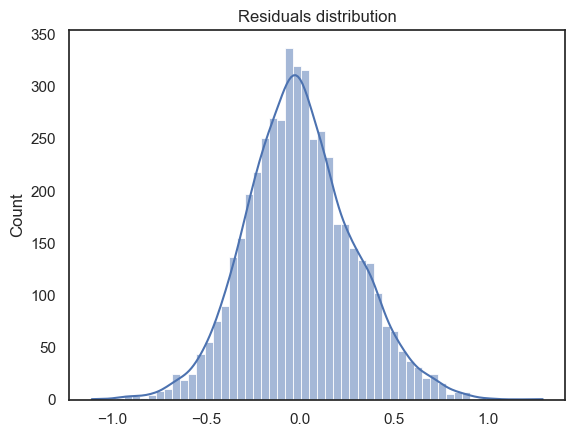

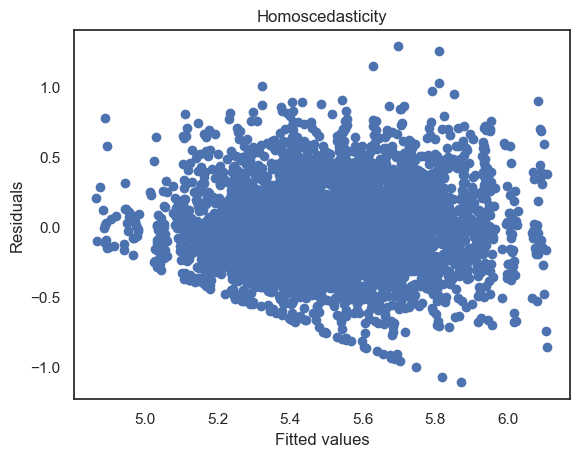

Residuals are not homoscedastic LeveneResult(statistic=253.078865566548, pvalue=2.9197878075890823e-56)
Bartlett’s test p-value: 8.216820975923496e-89
White test p-value: 4.576562373204373e-20
Levene’s test p-value for the whole model: 2.9197878075890823e-56
Levene’s test p-value for variable age: 0.0070119494666547625
Levene’s test p-value for variable site: 2.806658640641496e-12
Levene’s test p-value for variable sex: 0.24197954045366912
Levene’s test p-value for variable condition: 3.177561380093376e-08
Levene’s test p-value for variable ndd: 0.012466754777505966
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                                    Mixed Linear Model Regression Results
Model:                              MixedLM                   Dependent Variable:    

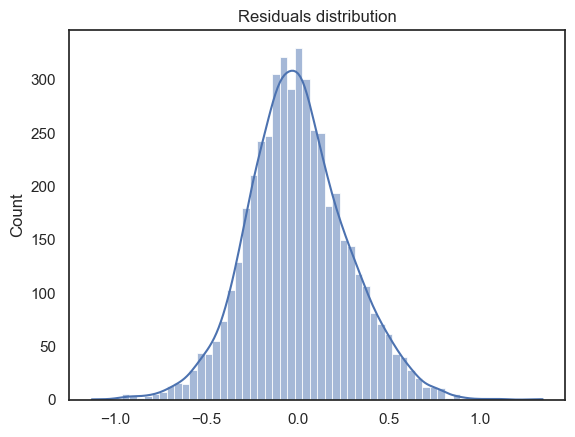

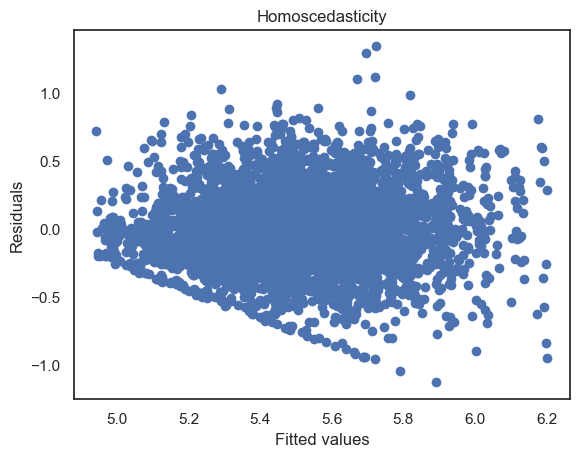

Residuals are not homoscedastic LeveneResult(statistic=124.98138290974647, pvalue=7.759533165272745e-29)
Bartlett’s test p-value: 2.0253955133830844e-50
White test p-value: 4.1904489652778716e-14
Levene’s test p-value for the whole model: 7.759533165272745e-29
Levene’s test p-value for variable age: 0.00915364607465438
Levene’s test p-value for variable site: 2.6816160998619556e-11
Levene’s test p-value for variable sex: 0.4863046912243054
Levene’s test p-value for variable condition: 1.3150948215438583e-06
Levene’s test p-value for variable ndd: 0.009212909094100108
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                            OLS Regression Results                            
Dep. Variable:                 log_rt   R-squared:                       0.117


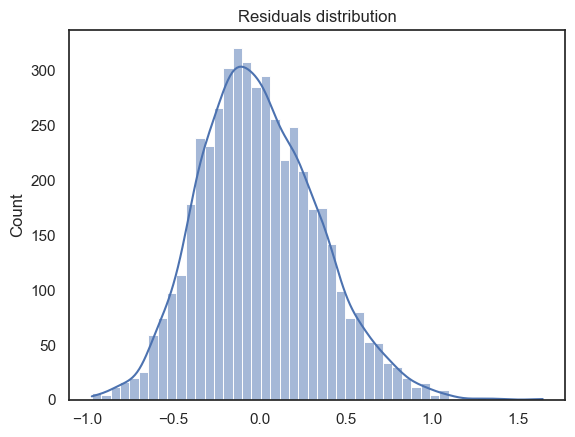

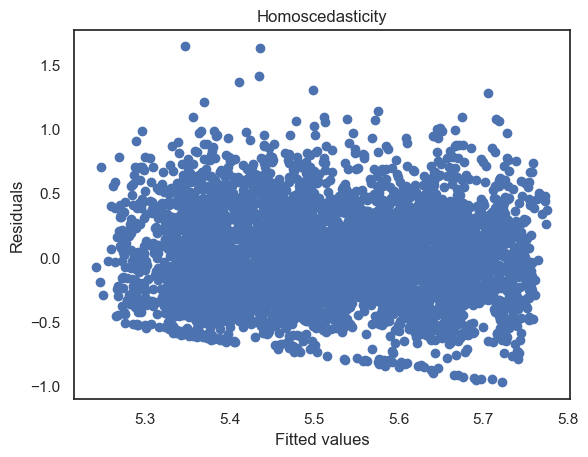

Residuals are not homoscedastic LeveneResult(statistic=2728.079779768682, pvalue=0.0)
Bartlett’s test p-value: 0.0
White test p-value: 7.395473177062732e-23
Levene’s test p-value for the whole model: 0.0
Levene’s test p-value for variable age: 0.006448581275085986
Levene’s test p-value for variable site: 6.492325436009529e-06
Levene’s test p-value for variable sex: 0.3689548345049142
Levene’s test p-value for variable condition: 1.813382368315019e-05
Levene’s test p-value for variable ndd: 0.0028261503032379898
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                                     Mixed Linear Model Regression Results
Model:                               MixedLM                   Dependent Variable:                   log_rt    
No. Observations:           

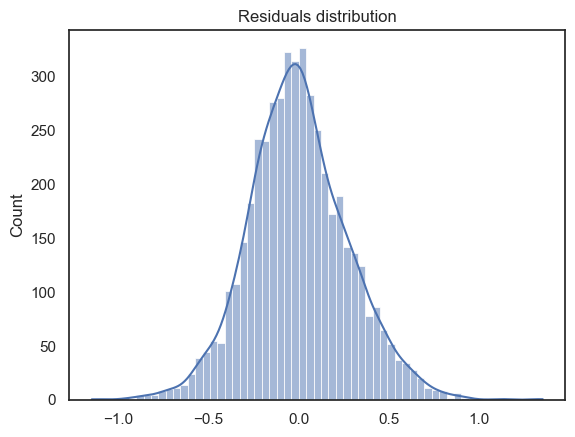

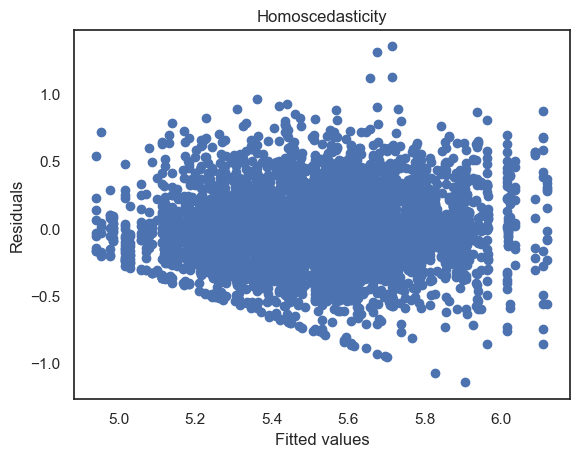

Residuals are not homoscedastic LeveneResult(statistic=128.3654922630735, pvalue=1.4420485116654325e-29)
Bartlett’s test p-value: 7.4158013101805225e-53
White test p-value: 1.6642984328074666e-16
Levene’s test p-value for the whole model: 1.4420485116654325e-29
Levene’s test p-value for variable age: 0.015275899589061401
Levene’s test p-value for variable site: 4.329766842258355e-12
Levene’s test p-value for variable sex: 0.4917619024592027
Levene’s test p-value for variable condition: 7.319527814410948e-08
Levene’s test p-value for variable ndd: 0.009916070251762636
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                            GLS Regression Results                            
Dep. Variable:                 log_rt   R-squared:                       0.891


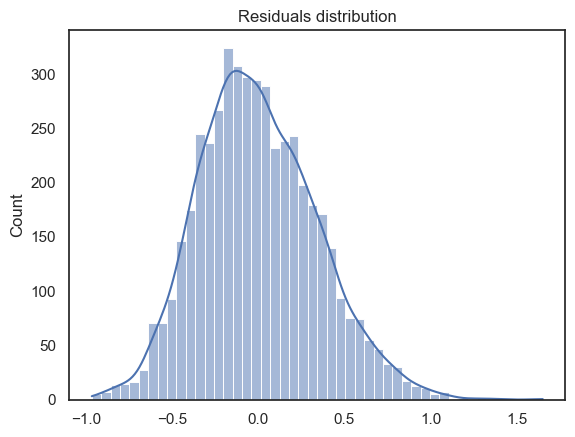

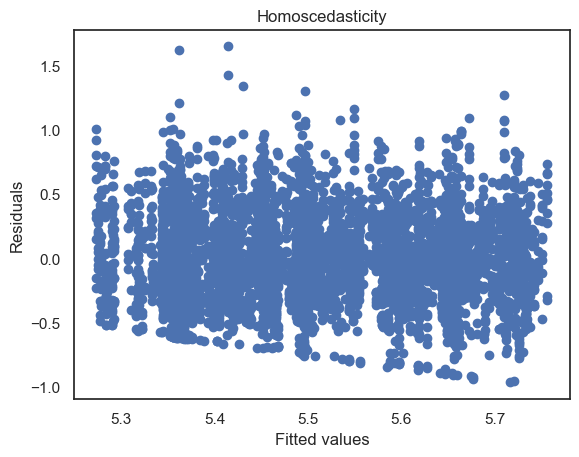

Residuals are not homoscedastic LeveneResult(statistic=2767.375151714543, pvalue=0.0)
Bartlett’s test p-value: 0.0
White test p-value: 1.1561805727927475e-20
Levene’s test p-value for the whole model: 0.0
Levene’s test p-value for variable age: 0.006405654240842531
Levene’s test p-value for variable site: 1.22926691128145e-05
Levene’s test p-value for variable sex: 0.3674402572134148
Levene’s test p-value for variable condition: 1.4801339904424442e-05
Levene’s test p-value for variable ndd: 0.0025636136813331945
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
Model: original
                                     Mixed Linear Model Regression Results
Model:                               MixedLM                   Dependent Variable:                   log_rt    
No. Observa

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


                                     Mixed Linear Model Regression Results
Model:                               MixedLM                   Dependent Variable:                   log_rt    
No. Observations:                    4770                      Method:                               REML      
No. Groups:                          155                       Scale:                                0.0860    
Min. group size:                     18                        Log-Likelihood:                       -1157.0557
Max. group size:                     36                        Converged:                            Yes       
Mean group size:                     30.8                                                                      
---------------------------------------------------------------------------------------------------------------
                                                                    Coef.  Std.Err.    z    P>|z| [0.025 0.975]
-----------------------------

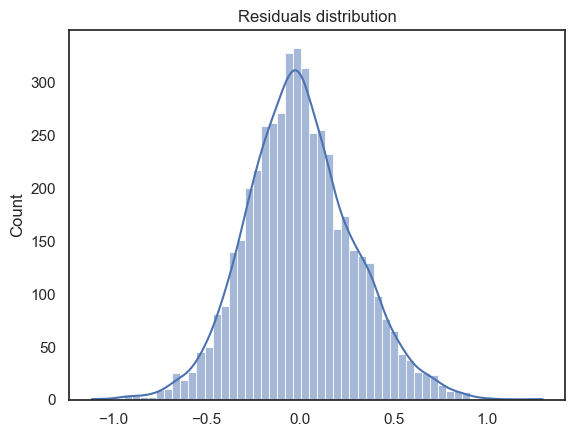

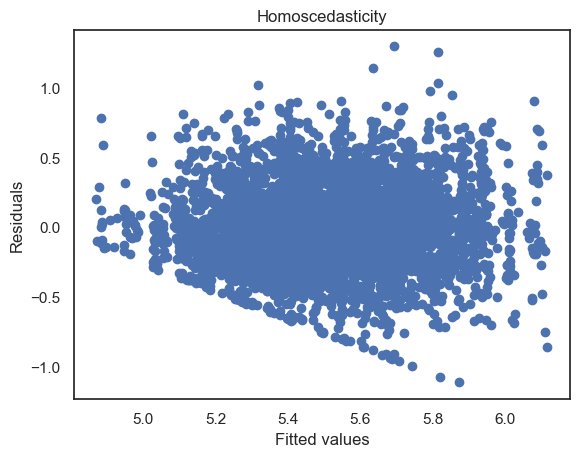

Residuals are not homoscedastic LeveneResult(statistic=253.53389277981992, pvalue=2.3373440251179943e-56)
Bartlett’s test p-value: 6.812425135650965e-89
White test p-value: 8.507551496080676e-19
Levene’s test p-value for the whole model: 2.3373440251179943e-56
Levene’s test p-value for variable age: 0.006877787485186688
Levene’s test p-value for variable site: 1.7380602355884736e-12
Levene’s test p-value for variable sex: 0.24190175041893075
Levene’s test p-value for variable condition: 3.6272576803653624e-08
Levene’s test p-value for variable ndd: 0.012535604085273095
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                                     Mixed Linear Model Regression Results
Model:                               MixedLM                   Dependent Variable

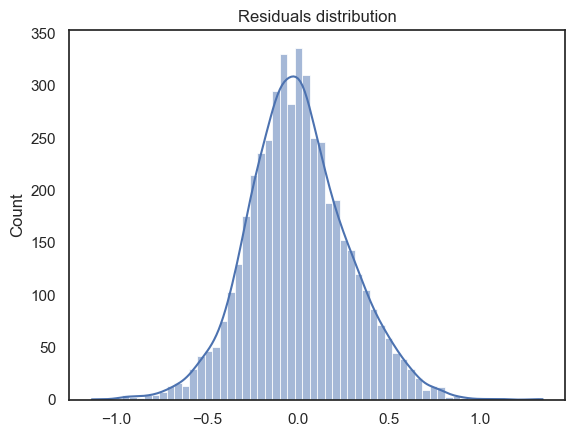

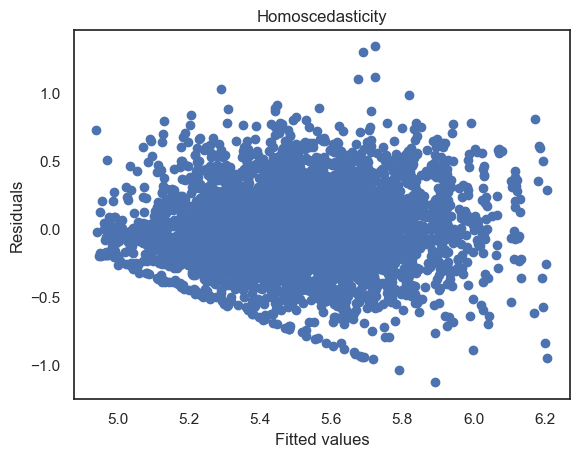

Residuals are not homoscedastic LeveneResult(statistic=125.19806523999597, pvalue=6.966701861719577e-29)
Bartlett’s test p-value: 1.4723102396937923e-50
White test p-value: 2.4401889544510166e-13
Levene’s test p-value for the whole model: 6.966701861719577e-29
Levene’s test p-value for variable age: 0.009227927562799481
Levene’s test p-value for variable site: 1.9081469077886737e-11
Levene’s test p-value for variable sex: 0.4878095512712004
Levene’s test p-value for variable condition: 1.3008262401849084e-06
Levene’s test p-value for variable ndd: 0.009238865643948541
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                            OLS Regression Results                            
Dep. Variable:                 log_rt   R-squared:                       0.117

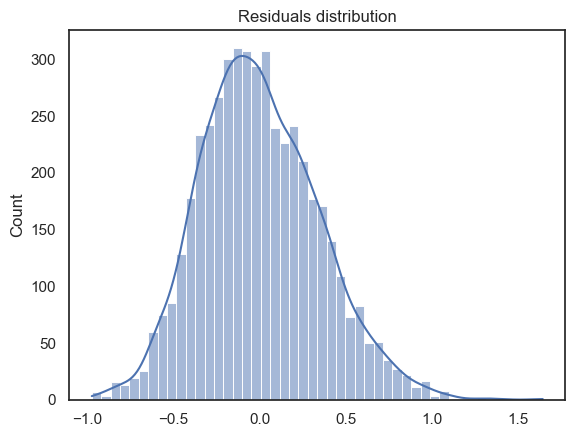

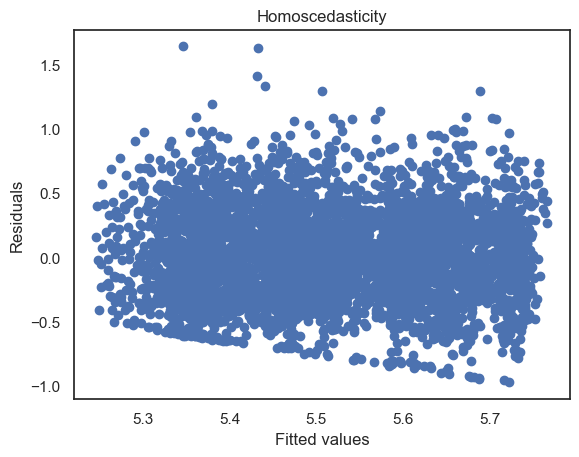

Residuals are not homoscedastic LeveneResult(statistic=2731.3587103402983, pvalue=0.0)
Bartlett’s test p-value: 0.0
White test p-value: 6.880053941060283e-21
Levene’s test p-value for the whole model: 0.0
Levene’s test p-value for variable age: 0.006344336955848967
Levene’s test p-value for variable site: 1.5399453951551292e-05
Levene’s test p-value for variable sex: 0.39186702578189736
Levene’s test p-value for variable condition: 2.5758275340320256e-05
Levene’s test p-value for variable ndd: 0.0032211999149054835
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                                     Mixed Linear Model Regression Results
Model:                               MixedLM                   Dependent Variable:                   log_rt    
No. Observations:       

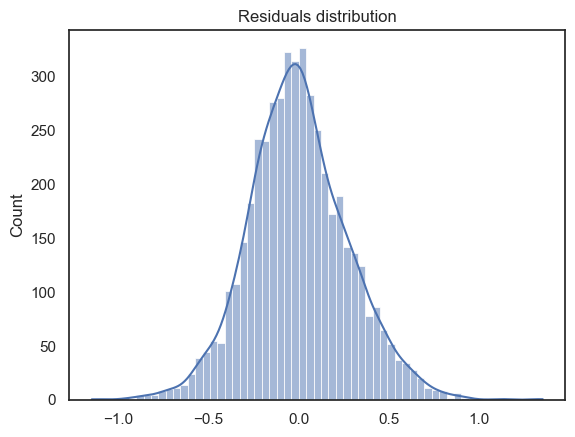

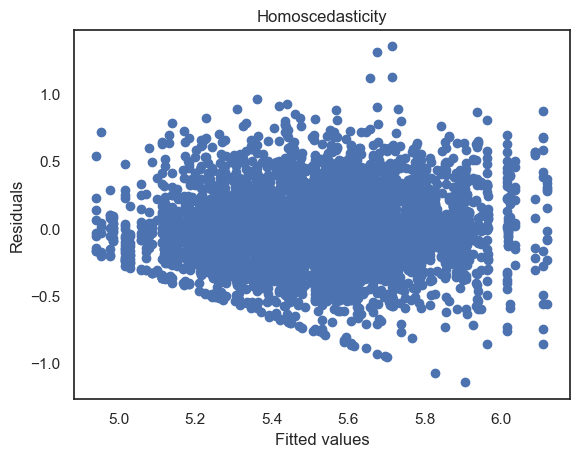

Residuals are not homoscedastic LeveneResult(statistic=128.3654922630735, pvalue=1.4420485116654325e-29)
Bartlett’s test p-value: 7.4158013101805225e-53
White test p-value: 1.6642984328074666e-16
Levene’s test p-value for the whole model: 1.4420485116654325e-29
Levene’s test p-value for variable age: 0.015275899589061401
Levene’s test p-value for variable site: 4.329766842258355e-12
Levene’s test p-value for variable sex: 0.4917619024592027
Levene’s test p-value for variable condition: 7.319527814410948e-08
Levene’s test p-value for variable ndd: 0.009916070251762636
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
                            GLS Regression Results                            
Dep. Variable:                 log_rt   R-squared:                       0.891


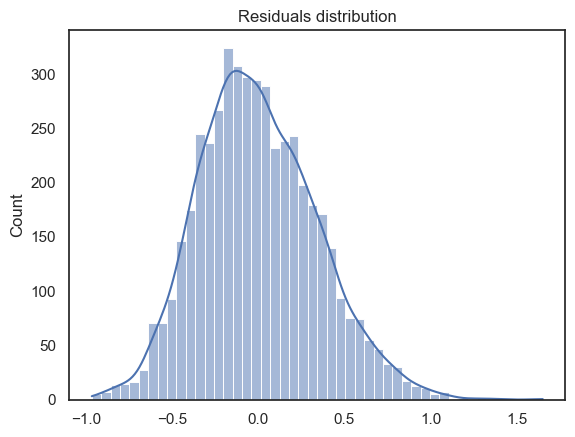

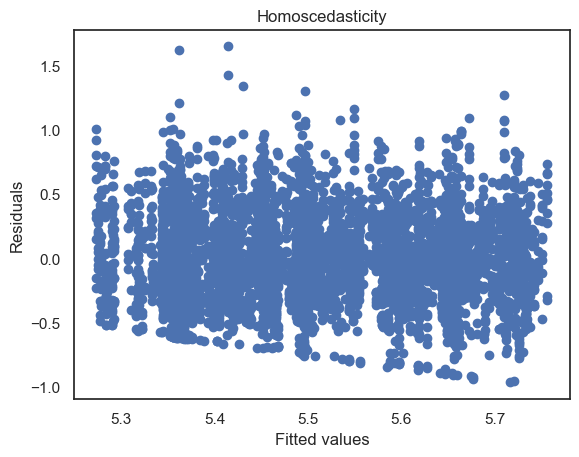

Residuals are not homoscedastic LeveneResult(statistic=2767.375151714543, pvalue=0.0)
Bartlett’s test p-value: 0.0
White test p-value: 1.1561805727927475e-20
Levene’s test p-value for the whole model: 0.0
Levene’s test p-value for variable age: 0.006405654240842531
Levene’s test p-value for variable site: 1.22926691128145e-05
Levene’s test p-value for variable sex: 0.3674402572134148
Levene’s test p-value for variable condition: 1.4801339904424442e-05
Levene’s test p-value for variable ndd: 0.0025636136813331945
Residuals are homoscedastic
No multicollinearity detected
****Best model: Log-likelihood    MixedLM with random intercepts and slopes
AIC                                                     GLS
BIC                                                     OLS
dtype: object
Model: trial_index_interaction
Best model: log_likelihood    original
dtype: object : log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + age + sex + site + total_trials + Trial_Index_


<class 'statsmodels.iolib.summary2.Summary'>
"""
                                     Mixed Linear Model Regression Results
===============================================================================================================
Model:                               MixedLM                   Dependent Variable:                   log_rt    
No. Observations:                    4770                      Method:                               REML      
No. Groups:                          155                       Scale:                                0.0860    
Min. group size:                     18                        Log-Likelihood:                       -1155.6686
Max. group size:                     36                        Converged:                            Yes       
Mean group size:                     30.8                                                                      
---------------------------------------------------------------------------------------------------------------
                                                                    Coef.  Std.Err.    z    P>|z| [0.025 0.975]
---------------------------------------------------------------------------------------------------------------
Intercept                                                            5.448    0.140  38.860 0.000  5.173  5.723
ndd[T.ndd]                                                          -0.045    0.039  -1.174 0.240 -0.121  0.030
C(condition, Treatment(reference='Baseline'))[T.Gap]                -0.150    0.014 -10.887 0.000 -0.177 -0.123
C(condition, Treatment(reference='Baseline'))[T.Overlap]             0.128    0.014   9.098 0.000  0.100  0.155
sex[T.male]                                                         -0.004    0.033  -0.122 0.903 -0.070  0.061
site[T.mni]                                                         -0.081    0.034  -2.422 0.015 -0.147 -0.016
ndd[T.ndd]:C(condition, Treatment(reference='Baseline'))[T.Gap]      0.009    0.021   0.429 0.668 -0.032  0.049
ndd[T.ndd]:C(condition, Treatment(reference='Baseline'))[T.Overlap]  0.024    0.021   1.151 0.250 -0.017  0.065
age                                                                  0.002    0.001   1.394 0.163 -0.001  0.004
total_trials                                                         0.002    0.004   0.523 0.601 -0.006  0.011
Trial_Index_                                                         0.001    0.000   2.187 0.029  0.000  0.002
Group Var                                                            0.035    0.015                            
===============================================================================================================

"""

In [ ]:
# Compare different models including trial number and overall rt
go_rt_sub["Trial_Index_"] = go_rt_sub["Trial_Index_"].astype(float)
models= {"original": "log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + age + sex + site + total_trials + Trial_Index_", 
                "trial_index_interaction": "log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + ndd * Trial_Index_ + age + sex + site "}#,
               # "no_interaction": "log_rt ~ ndd + C(condition, Treatment(reference='Baseline')) + age + sex + site + total_trials", 
                #"no_age": "log_rt ~ ndd * C(condition, Treatment(reference='Baseline')) + sex + site + total_trials + Trial_Index_",
             #   "no_covariates": "log_rt ~ ndd * C(condition, Treatment(reference='Baseline'))"}

model_comparison = {}

coeff_dfs = []
for model_name, formula in models.items():
    print(formula)
    model = smf.mixedlm(formula, go_rt_sub, groups=go_rt_sub["subject"],re_formula="~1").fit()
    model2 = smf.mixedlm(formula, go_rt_sub, groups=go_rt_sub["subject"],re_formula="~1+condition").fit()
    model3 = smf.ols(formula, go_rt_sub).fit()
    # Accounting for variance in conditons solution two
    model4 = smf.mixedlm(model_formula, go_rt_sub, 
                        groups=go_rt_sub["subject"], 
                        re_formula="~1", 
                        vc_formula={"condition": "0 + C(condition)"}).fit()
    # GLS model 
    weights = 1 / go_rt_sub.groupby("condition")["log_rt"].transform("std")**2
    model5 = sm.GLS.from_formula(model_formula, go_rt_sub, weights=weights).fit()

    # Create with log-likehood for each model
    model_variations = [model, model2, model3, model4, model5]
    log_likelihoods = [model.llf for model in model_variations]
    aic = [model.aic for model in model_variations]
    bic = [model.bic for model in model_variations]

    index = ["MixedLM with random intercepts", "MixedLM with random intercepts and slopes","OLS","MixedLM with covariates adjusted", "GLS"]

    # print the summary of of each model
    for modelx in [model, model2, model3, model4, model5]:
        
        print(modelx.summary())
        check_assumptions(modelx, go_rt_sub, show_plots=True)
        log_likelihoods_df = pd.DataFrame({"Log-likelihood": log_likelihoods, "AIC": aic, "BIC": bic}, index=index)
        log_likelihoods_df
        # Print the best model based on log likelihood
        great_model = log_likelihoods_df.idxmax()
        print(f"****Best model: {great_model}")

    # Extract log likelihood
    model_comparison[model_name] = model.llf
    print(f"Model: {model_name}")

    # Add to coeff dfs
    coef_df = pd.DataFrame(model.summary().tables[1]).reset_index()
    coef_df = coef_df.loc[coef_df["index"] != "Group Var"]
    coef_df['model'] = model_name
    coeff_dfs.append(coef_df)
    
    # Extract BIC
    if model_name == "original":
        print(model.summary())
        doc.add_heading(f"Linear model for reaction time general with trial index")
        doc.add_paragraph(f"{models[model_name]}", style='List Bullet')
        model_summary= model.summary()
        model_table=pd.DataFrame(model_summary.tables[1])
        model_table["var"] = model_table.index
        model_table = model_table[["var", "Coef.", "Std.Err.", "z", "P>|z|", "[0.025", "0.975]"]]

        doc = df_to_table(doc, model_table)

model_comparison = pd.DataFrame(model_comparison, index=["log_likelihood"]).T

# Create df with all coefficients
all_coefs = pd.concat(coeff_dfs, keys=models.keys()).reset_index()


# Print the best model based on log likelihood
best_model = model_comparison.idxmax()
print(f"Best model: {best_model} : {models[best_model[0]]}")

# Add to the document
doc.add_paragraph(f"Model comparison for reaction time general + index", style='List Bullet')

model_comparison["type"] = model_comparison.index
model_comparison = model_comparison[["type", "log_likelihood"]]

doc = df_to_table(doc, model_comparison)
doc.add_paragraph(f'Best model= {best_model[0]} : {models[best_model[0]]}', style='List Bullet')

# Print the summary of the best model
model = smf.mixedlm(models[best_model[0]], go_rt_sub, groups=go_rt_sub["subject"],re_formula="~1").fit()
model_summary = model.summary()
model_summary

    


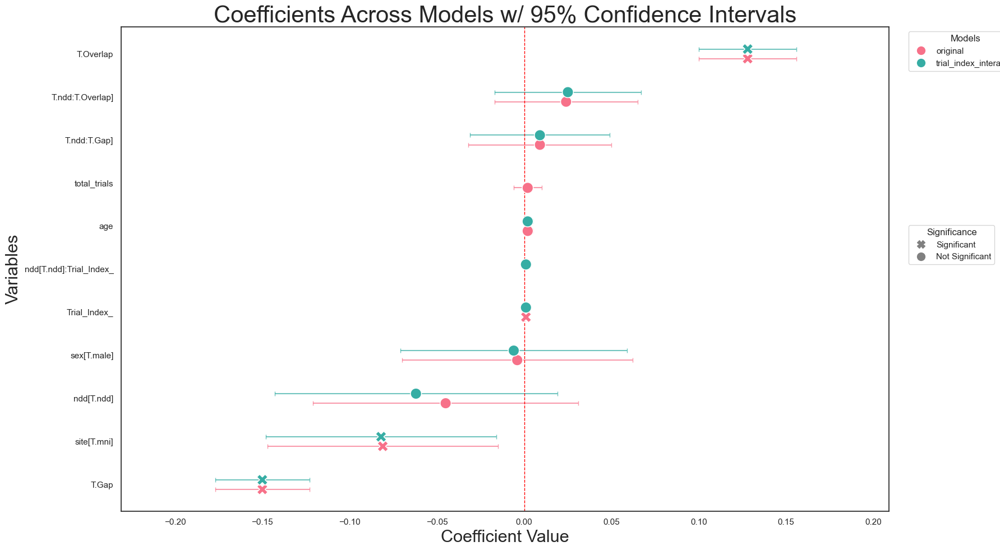

In [ ]:
# Plot it and save it to the document

# Add the figure to the document
doc.add_heading('Mixed effects model figure for trial length', level=3)

coefplot_gap(all_coefs, multiple_models=True, fig_name="trial_length_model")

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mixed_effects_model_trial_length_model_{date}.png",
                width=docx.shared.Inches(8), height=docx.shared.Inches(4))



#### Model for disengagement and faciliation

disengage ~ ndd + age + sex + site + total_trials 
Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=148.82525781537197, pvalue=3.4142069148430464e-28)
Bartlett’s test p-value: 4.173618280577252e-59
White test p-value: 0.08494424212840551
Levene’s test p-value for the whole model: 3.4142069148430464e-28
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.1380424148835277
Levene’s test p-value for variable sex: 0.5433282062098688
Levene’s test p-value for variable ndd: 0.6357956251640678
Residuals are homoscedastic


c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


No multicollinearity detected
                                Log-likelihood         AIC         BIC  \
OLS                                  86.316563 -160.633125 -142.372575   
MixedLM with random intercepts       63.138824         NaN         NaN   
GLS                                  86.316563 -160.633125 -142.372575   

                                         Lev  
OLS                             3.414207e-28  
MixedLM with random intercepts  3.414207e-28  
GLS                             3.414207e-28  
****Best model: Log-likelihood                               OLS
AIC                                          OLS
BIC                                          OLS
Lev               MixedLM with random intercepts
dtype: object
Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=148.82525781537183, pvalue=3.4142069148431334e-28)
Bartlett’s test p-value: 4.173618280580119e-59
White test p-value: 0.0849442421284046
Levene’s test p-value for the wh

c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=147.63279434042002, pvalue=5.119846874651059e-28)
Bartlett’s test p-value: 6.618975831297421e-58
White test p-value: 0.0594980878697702
Levene’s test p-value for the whole model: 5.119846874651059e-28
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.1471896053798595
Levene’s test p-value for variable sex: 0.5744254099707569
Levene’s test p-value for variable ndd: 0.6830139593906729
Residuals are homoscedastic
No multicollinearity detected
                                Log-likelihood         AIC         BIC  \
OLS                                  86.465096 -158.930193 -137.626217   
MixedLM with random intercepts       61.165835         NaN         NaN   
GLS                                  86.465096 -158.930193 -137.626217   

                                         Lev  
OLS                             5.119847e-28  
MixedLM with random intercepts  5.1198

c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


White test p-value: 0.0594980878697702
Levene’s test p-value for the whole model: 5.119846874651059e-28
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.1471896053798595
Levene’s test p-value for variable sex: 0.5744254099707569
Levene’s test p-value for variable ndd: 0.6830139593906729
Residuals are homoscedastic
No multicollinearity detected
                                Log-likelihood         AIC         BIC  \
OLS                                  86.465096 -158.930193 -137.626217   
MixedLM with random intercepts       61.165835         NaN         NaN   
GLS                                  86.465096 -158.930193 -137.626217   

                                         Lev  
OLS                             5.119847e-28  
MixedLM with random intercepts  5.119847e-28  
GLS                             5.119847e-28  
****Best model: Log-likelihood                               GLS
AIC                                          OLS
BIC              

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=141.3255332005965, pvalue=4.4451042496743614e-27)
Bartlett’s test p-value: 2.1957393607330487e-51
White test p-value: 0.07045711267918432
Levene’s test p-value for the whole model: 4.4451042496743614e-27
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.16118965732110477
Levene’s test p-value for variable sex: 0.5217671321356427
Levene’s test p-value for variable ndd: 0.6904497884618335
Residuals are homoscedastic
Multicollinearity detected                     variables        VIF
1                  ndd[T.ndd]   8.453795
2                 sex[T.male]  11.395911
3                 site[T.mni]   1.119021
4      ndd[T.ndd]:sex[T.male]  13.454952
5                         age   3.569821
6              ndd[T.ndd]:age   6.003010
7             age:sex[T.male]   7.945909
8  ndd[T.ndd]:age:sex[T.male]   6.306015
9                total_trials   1.188686
                  

c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)


Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=176.3593333405891, pvalue=3.9379678280094827e-32)
Bartlett’s test p-value: 1.8292502188135913e-115
White test p-value: 0.7726249818025017
Levene’s test p-value for the whole model: 3.9379678280094827e-32
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.1723474574747921
Levene’s test p-value for variable sex: 0.3428869906481441
Levene’s test p-value for variable ndd: 0.7177069619128476
Residuals are homoscedastic
No multicollinearity detected
                                Log-likelihood         AIC         BIC  \
OLS                                  83.212024 -162.424047 -156.337197   
MixedLM with random intercepts       76.798051         NaN         NaN   
GLS                                  83.212024 -162.424047 -156.337197   

                                         Lev  
OLS                             3.937968e-32  
MixedLM with random intercepts  3.9

c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


No multicollinearity detected
                                Log-likelihood         AIC         BIC  \
OLS                                  83.212024 -162.424047 -156.337197   
MixedLM with random intercepts       76.798051         NaN         NaN   
GLS                                  83.212024 -162.424047 -156.337197   

                                         Lev  
OLS                             3.937968e-32  
MixedLM with random intercepts  3.937968e-32  
GLS                             3.937968e-32  
****Best model: Log-likelihood                               GLS
AIC                                          OLS
BIC                                          OLS
Lev               MixedLM with random intercepts
dtype: object
Best model: no_covariates


c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['groups']
  warnings.warn(msg, ValueWarning)


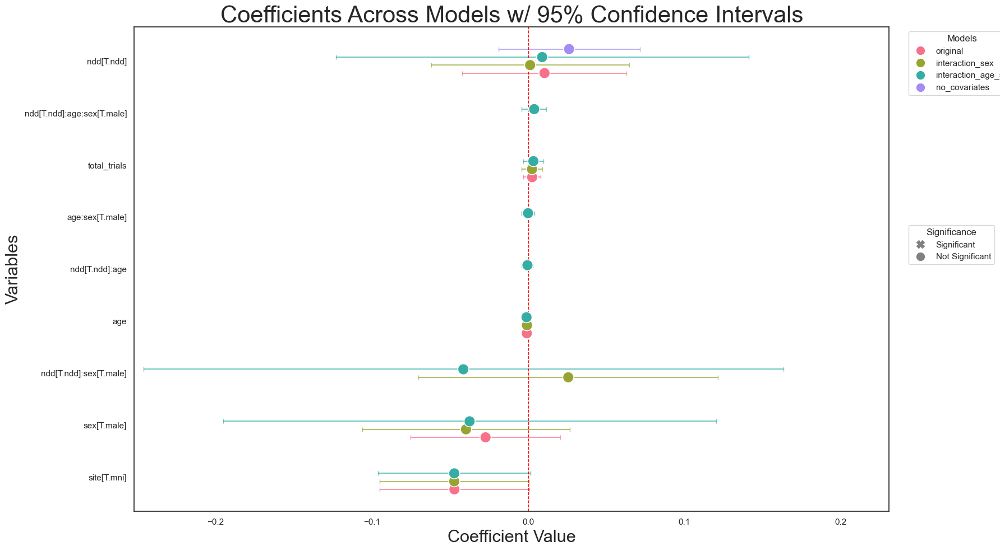

facilitation ~ ndd + age + sex + site + total_trials 
Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=134.28923006229496, pvalue=5.1406593772845765e-26)
Bartlett’s test p-value: 9.570097290415527e-53
White test p-value: 0.4527681798958903
Levene’s test p-value for the whole model: 5.1406593772845765e-26
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.15888424889757533
Levene’s test p-value for variable sex: 0.2542597824122953
Levene’s test p-value for variable ndd: 0.09970078687959914
Residuals are homoscedastic
No multicollinearity detected
                                Log-likelihood         AIC        BIC  \
OLS                                  62.702794 -113.405589 -95.145038   
MixedLM with random intercepts       40.439137         NaN        NaN   
GLS                                  62.702794 -113.405589 -95.145038   

                                         Lev  
OLS                            

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


No multicollinearity detected
                                Log-likelihood         AIC        BIC  \
OLS                                  62.702794 -113.405589 -95.145038   
MixedLM with random intercepts       40.439137         NaN        NaN   
GLS                                  62.702794 -113.405589 -95.145038   

                                         Lev  
OLS                             5.140659e-26  
MixedLM with random intercepts  5.140659e-26  
GLS                             5.140659e-26  
****Best model: Log-likelihood    OLS
AIC               GLS
BIC               GLS
Lev               OLS
dtype: object
Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=134.28923006229496, pvalue=5.1406593772845765e-26)
Bartlett’s test p-value: 9.570097290415527e-53
White test p-value: 0.4527681798958903
Levene’s test p-value for the whole model: 5.1406593772845765e-26
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=127.93960199675666, pvalue=4.845843869592105e-25)
Bartlett’s test p-value: 4.169619958042034e-49
White test p-value: 0.565422870167676
Levene’s test p-value for the whole model: 4.845843869592105e-25
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.17040630896546816
Levene’s test p-value for variable sex: 0.26102911424654607
Levene’s test p-value for variable ndd: 0.106912455985052
Residuals are homoscedastic
No multicollinearity detected
                                Log-likelihood        AIC        BIC  \
OLS                                  63.292735 -112.58547 -91.281495   
MixedLM with random intercepts       39.039968        NaN        NaN   
GLS                                  63.292735 -112.58547 -91.281495   

                                         Lev  
OLS                             4.845844e-25  
MixedLM with random intercepts  4.845844e-25  

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


Residuals are normally distributed
Residuals are not homoscedastic LeveneResult(statistic=119.12833479905417, pvalue=1.1530635871909204e-23)
Bartlett’s test p-value: 1.3780396269366277e-42
White test p-value: 0.7054856804087619
Levene’s test p-value for the whole model: 1.1530635871909204e-23
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.10756818433217535
Levene’s test p-value for variable sex: 0.26865303938166096
Levene’s test p-value for variable ndd: 0.14564539736960683
Residuals are homoscedastic
Multicollinearity detected                     variables        VIF
1                  ndd[T.ndd]   8.453795
2                 sex[T.male]  11.395911
3                 site[T.mni]   1.119021
4      ndd[T.ndd]:sex[T.male]  13.454952
5                         age   3.569821
6              ndd[T.ndd]:age   6.003010
7             age:sex[T.male]   7.945909
8  ndd[T.ndd]:age:sex[T.male]   6.306015
9                total_trials   1.188686
                

c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['weights']
  warnings.warn(msg, ValueWarning)
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.06775242337851801
Levene’s test p-value for variable sex: 0.24835739984959854
Levene’s test p-value for variable ndd: 0.08563467894783171
Residuals are homoscedastic
No multicollinearity detected
                                Log-likelihood         AIC         BIC  \
OLS                                  58.182246 -112.364492 -106.277642   
MixedLM with random intercepts       52.091238         NaN         NaN   
GLS                                  58.182246 -112.364492 -106.277642   

                                         Lev  
OLS                             4.757097e-40  
MixedLM with random intercepts  4.757097e-40  
GLS                             4.757097e-40  
****Best model: Log-likelihood                               OLS
AIC                                          GLS
BIC                                          GLS
Lev               MixedLM with random intercepts
dtype: object
Residu

c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\base\model.py:127: ValueWarning: unknown kwargs ['groups']
  warnings.warn(msg, ValueWarning)


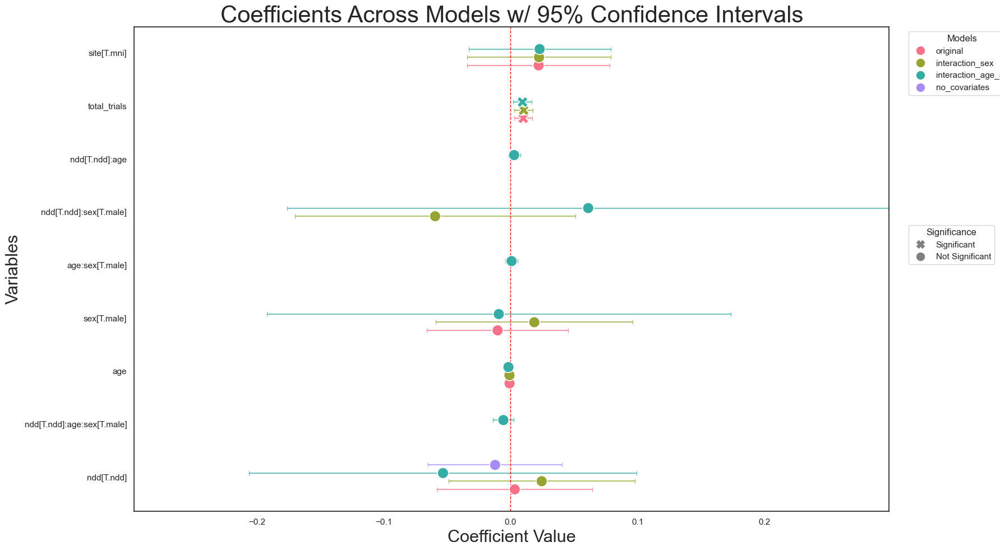

In [ ]:
vairables_to_test = ["disengage", "facilitation"]

for var in vairables_to_test:
        models= {"original": f"{var} ~ ndd + age + sex + site + total_trials ", 
                        "interaction_sex": f"{var} ~ ndd * sex + age + site + total_trials", 
                        "interaction_age_sex": f"{var} ~ ndd * age * sex + site + total_trials ",
                        "no_covariates": f"{var} ~ ndd"}

        model_comparison = {}
        coeff_dfs = []


        for model_name, formula in models.items():
                print(formula)
                
                model = smf.ols(formula, go_dis).fit()
                model2 = smf.mixedlm(formula, go_dis, groups=go_dis["ndd"],re_formula="~1").fit()
                # GLS model
                weights = 1 / go_dis.groupby("ndd")[var].transform("std")**2
                model3 = sm.GLS.from_formula(formula, go_dis, weights=weights).fit()


                # Create with log-likehood for each model
                model_variations = [model, model2, model3]
                log_likelihoods = [model.llf for model in model_variations]
                aic = [model.aic for model in model_variations]
                bic = [model.bic for model in model_variations]
                levene_test = [stats.levene(model.fittedvalues, model.resid)[1] for model in model_variations]
                
                index = ["OLS", "MixedLM with random intercepts","GLS"]

                # print the summary of of each model
                for modelx in [model, model2, model3]:

                    #print(modelx.summary())
                    check_assumptions(modelx, go_dis, show_plots=False)
                    log_likelihoods_df = pd.DataFrame({"Log-likelihood": log_likelihoods, "AIC": aic, "BIC": bic, 'Lev': levene_test}, index=index)
                    log_likelihoods_df
                    # Print the best model based on log likelihood
                    great_model = log_likelihoods_df.idxmax()
                    print(log_likelihoods_df)
                    print(f"****Best model: {great_model}")

                # Extract log likelihood
                model_comparison[model_name] = model.llf
                aic = model.aic
                bic = model.bic
                r_squared = model.rsquared
                adj_r_squared = model.rsquared_adj
                model_comparison[model_name] = [model.llf, aic, bic, r_squared, adj_r_squared]

                # Add to coeff dfs
                coef_df = pd.DataFrame(model.summary().tables[1].data).reset_index()
                coef_df["model"] = model_name
                coef_df.drop(0, inplace=True)


                coeff_dfs.append(coef_df)

                # Extract BIC
                if model_name == "interaction_age":
                        print(var, model.summary())
                        doc.add_heading(f"Linear model for {var}", level=2)
                        if var == "disengage":
                                doc.add_paragraph(f"For {var}: Lower values are mean better attention", style='List Bullet')
                        elif var == "facilitation":
                                doc.add_paragraph(f"For {var}: Higher values mean enhances attention", style='List Bullet')
                        elif var == "gap_overlap":
                                doc.add_paragraph(f"For {var}: Higher values even better attention", style='List Bullet')


                        doc.add_paragraph(f"{models[model_name]}", style='List Bullet')
                        
                        model_summary= model.summary()
                        model_table=pd.DataFrame(model_summary.tables[1]) 
                                # make the first row the column names
                        model_table.columns = model_table.iloc[0]
                        model_table = model_table[1:]
                        model_table.columns = ["var","coef", "std err", "t", "p", "0.025", "0.975"]
                        doc = df_to_table(doc, model_table)

                        # Calcualte AIC and BIC


        model_comparison = pd.DataFrame(model_comparison, index=["log_likelihood", "aic", "bic", "r^2", "adj_r^2"]).T.reset_index().rename(columns={"index":"type"})


        # Create df with all coefficients
        all_coefs = pd.concat(coeff_dfs, keys=models.keys()).reset_index()

        # Drop certain columns
        all_coefs.drop(columns=['level_0', 'level_1', 'index'], inplace=True)

        # Add proper columsn to all coef dataframe
        all_coefs.columns = ['index', 'Coef.', 'Std.Err.', 'z', 'P>|z|',
       '[0.025', '0.975]', 'model']
        
        # pick the best model based on AIC
        best_model = model_comparison[model_comparison["aic"] == model_comparison.aic.min()]["type"].values[0]
        print(f"Best model: {best_model}")

        # Show the best model summary
        model = smf.ols(models[best_model], go_dis, groups=go_dis["subject"]).fit()
        model_summary = model.summary()

        model_summary

        # Add to the document
        doc.add_paragraph(f"{var} model comparisons", style='List Bullet')

        doc.add_paragraph(f'Best model= {best_model} : {models[best_model]}', style='List Bullet')

        doc = df_to_table(doc, model_comparison)

        # Plot the multiple models and save it to the document
        coefplot_gap(all_coefs, multiple_models=True, fig_name=f"{var}_models")

        doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mixed_effects_model_{var}_models_{date}.png",
                        width=docx.shared.Inches(8), height=docx.shared.Inches(4))
        
        


#### Save the Gap outputs

In [328]:
# Merge with demo data to add record id
go_dis=pd.merge(go_dis, demo_df[["subject","record_id",]], on="subject", how="inner")

In [329]:
if derivative == "standard":
    go_dis.to_csv(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/analysis_dfs/go/go_dis_{date}.csv")
else:
    print("dont save")

In [ ]:
date

'01_24_2025'

In [330]:
go_dis

,subject,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap,total_trials,overall_rt,ndd,site,age,sex,age_group,q1k_ID,record_id
0,0042P,5.437029,5.717505,5.755118,0.280476,0.037614,0.318089,35,292.678857,ndd,mni,30.215656,NaN,adult,Q1K_MHC_20042_P,42
1,0043F1,5.695441,5.798165,5.911835,0.102724,0.113670,0.216394,35,340.700571,no_ndd,hsj,58.018873,Male,adult,Q1K_HSJ_10043_F1,45
2,0050M1,5.596039,5.626875,5.684424,0.030836,0.057549,0.088385,35,285.132857,no_ndd,hsj,36.600455,Female,adult,Q1K_HSJ_10050_M1,63
3,0050P,5.533359,5.482190,5.706198,-0.051170,0.224008,0.172838,30,271.362333,ndd,hsj,7.573165,Female,child,Q1K_HSJ_10050_P,50
4,0062P,5.698331,5.685460,5.741635,-0.012871,0.056175,0.043304,33,311.886061,no_ndd,hsj,40.209016,Female,adult,Q1K_HSJ_10062_P,62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,1140S1,5.168022,5.498694,5.467757,0.330672,-0.030937,0.299734,25,237.595600,ndd,hsj,9.637547,Female,child,Q1K_HSJ_1525-1140_S1,525-1142
139,1147F1,5.459696,5.700759,5.748521,0.241062,0.047763,0.288825,34,298.535588,no_ndd,hsj,50.643180,Male,adult,Q1K_HSJ_1525-1147_F1,525-1149
140,1147P,5.516428,5.553409,5.677342,0.036981,0.123933,0.160914,31,270.660645,ndd,hsj,16.233165,Male,child,Q1K_HSJ_1525-1147_P,525-1147
141,1147S1,5.173092,5.364899,5.596711,0.191807,0.231812,0.423619,35,228.672857,no_ndd,hsj,13.254322,Male,child,Q1K_HSJ_1525-1147_S1,525-1150


In [368]:
# Import clinical data

In [369]:
#srs_df = pd.read_csv(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/datasets/outputs/clinical/srs/{files_date}/srs_cleaned_{files_date}.csv")

In [370]:
# # Check total number of missing values in each column
#srs_df.isnull().sum()

record_id        0
srs_type         0
awr_raw          0
cog_raw          0
com_raw          0
mot_raw          0
rrb_raw          0
sci_raw          0
srs_total_raw    0
srs_total_t      0
dtype: int64

In [371]:
# Convert any zeros to na
#srs_df.replace(0, np.nan, inplace=True)

In [372]:
# merge with go_dis
#srs_go_dis=pd.merge(go_dis, srs_df, on="record_id", how="left")


In [373]:
"""# Test the effects of rt variables on clinical variables
rt_variables = ["Gap", "Baseline", "Overlap", "facilitation", "disengage", "overall_rt"]
srs_variables = ['srs_total_raw', 'srs_total_t']

#rt_variables = ["facilitation", "disengage"]
#srs_variables = ['srs_total_raw', 'srs_total_t','sci_raw', 'cog_raw' ]


corr_df=[]
for srs_var in srs_variables:
    for rt_var in rt_variables:
        if len(srs_go_dis[srs_var])<4:
            continue
        if len(srs_go_dis[rt_var]) < 4:
            continue
        else:
            varriable_correlation_test(srs_go_dis, srs_var, rt_var)
            corr_df.append(varriable_correlation_test(srs_go_dis, srs_var, rt_var))

# Create correlation table
corr_df=pd.DataFrame(corr_df, columns=["variable_1", "variable_2", "r", "p"])
corr_df

# Add table to the document

doc= df_to_table(doc, corr_df)
"""

'# Test the effects of rt variables on clinical variables\nrt_variables = ["Gap", "Baseline", "Overlap", "facilitation", "disengage", "overall_rt"]\nsrs_variables = [\'srs_total_raw\', \'srs_total_t\']\n\n#rt_variables = ["facilitation", "disengage"]\n#srs_variables = [\'srs_total_raw\', \'srs_total_t\',\'sci_raw\', \'cog_raw\' ]\n\n\ncorr_df=[]\nfor srs_var in srs_variables:\n    for rt_var in rt_variables:\n        if len(srs_go_dis[srs_var])<4:\n            continue\n        if len(srs_go_dis[rt_var]) < 4:\n            continue\n        else:\n            varriable_correlation_test(srs_go_dis, srs_var, rt_var)\n            corr_df.append(varriable_correlation_test(srs_go_dis, srs_var, rt_var))\n\n# Create correlation table\ncorr_df=pd.DataFrame(corr_df, columns=["variable_1", "variable_2", "r", "p"])\ncorr_df\n\n# Add table to the document\n\ndoc= df_to_table(doc, corr_df)\n'

In [374]:
# Check total number of missing values in the dataset

In [375]:
# Plot correalltion betweern srs_total_t and disengage
#sns.lmplot(x="disengage", y="srs_total_raw", data=srs_go_dis, palette="viridis")

In [376]:
# Plot correalltion betweern srs_total_t and disengage
#sns.lmplot(x="disengage", y="cog_raw", data=srs_go_dis, palette="viridis", hue="ndd")

In [377]:
# Plot correalltion betweern srs_total_t and disengage
#sns.lmplot(x="disengage", y="mot_raw", data=srs_go_dis, palette="viridis", hue="ndd")

In [114]:
go_dis

,subject,condition,rt
0,002Z,Gap,213.916667
1,002Z,Baseline,270.945000
2,002Z,Overlap,318.220909
3,0042P,Gap,241.000000
4,0042P,Baseline,313.200000
...,...,...,...
463,1134S1,Baseline,142.544000
464,1134S1,Overlap,170.068571
465,1140S1,Gap,192.125000
466,1140S1,Baseline,262.231818


#### Check family relations

In [115]:
# Isolate the numbers from the subject column
go_dis["family_id"] = go_dis["subject"].str.extract("(\d+)")


In [116]:
go_dis.subject.unique()

array(['002Z', '0042P', '0043F1', '004Z', '0050M1', '0050P', '0062P',
       '0064M1', '0064S1', '0068F1', '0068M1', '0068S1', '0068S3', '006Z',
       '0083F1', '0083P', '0086M1', '0086S1', '008Z', '0093O1', '009Z',
       '0104P', '0105P', '010Z', '0111F1', '0111M1', '0119M1', '0128P',
       '0129M1', '012Z', '0131M1', '0131P', '0131S1', '0134F1', '0134M1',
       '0134S1', '013Z', '0146P', '0147F2', '0147M1', '0147P', '014Z',
       '0157M1', '0159M1', '015Z', '0162M1', '0162P', '0162S1', '0171F1',
       '0171M1', '0171P', '0179M1', '0179P', '017Z', '0181F1', '0181M1',
       '0183M1', '0183P', '0183S1', '0186F1', '0186M1', '018Z', '0196M1',
       '0196P', '0196S2', '0200F1', '0200M1', '0200P', '0200S1', '020Z',
       '0216M1', '0216P', '0218M1', '0218P', '0223M1', '0223P', '023Z',
       '0248M1', '0248P', '0248S1', '024Z', '0265M1', '026Z', '0275F1',
       '0275P', '027Z', '0281M1', '0281P', '028Z', '029Z', '030Z', '031Z',
       '032Z', '033Z', '038Z', '052Z', '1006M1', '100

In [117]:
# manually change the family id for the following subjects

go_dis.loc[go_dis["subject"] == "004Z", "family_id"] = "C_004"
go_dis.loc[go_dis["subject"] == "020Z", "family_id"] = "C_004"

go_dis.loc[go_dis["subject"] == "008Z", "family_id"] = "AH_008"
go_dis.loc[go_dis["subject"] == "017Z", "family_id"] = "AH_008"


In [118]:
# Check how many family members
fam_values=go_dis.family_id.value_counts().sort_index()

In [119]:
fam_values

002       3
0042      3
0043      3
0050      6
006       3
         ..
1125      3
1134      6
1140      3
AH_008    6
C_004     6
Name: family_id, Length: 90, dtype: int64

In [120]:
# Create a column to check how many family members per id

# Create new column to say family role, if "P" is in subject then its child, if "F" then its father, if "M" then its mother, if "S" then its sibling
go_dis["family_role"] = go_dis["subject"].apply(lambda x: "child" if "P" in x else "father" if "F" in x else "mother" if "M" in x else "sibling" if "S" in x else "other")
go_dis["parents"] = go_dis["subject"].apply(lambda x: "child" if "P" in x else "parent" if "F" in x else "parent" if "M" in x else "child" if "S" in x else "other")

go_dis.loc[go_dis["subject"] == "004Z", "family_role"] = "child"
go_dis.loc[go_dis["subject"] == "020Z", "family_role"] = "mother"
go_dis.loc[go_dis["subject"] == "020Z", "parents"] = "parent"
go_dis.loc[go_dis["subject"] == "004Z", "parents"] = "child"



go_dis.loc[go_dis["subject"] == "008Z", "family_role"] = "father"
#go_dis.loc[go_dis["subject"] == "008Z", "family_role"] = "mother"
go_dis.loc[go_dis["subject"] == "008Z", "parents"] = "parent"
go_dis.loc[go_dis["subject"] == "017Z", "parents"] = "child"

go_dis.loc[go_dis["subject"] == "017Z", "family_role"] = "child"



In [121]:

go_dis["n_family"] = go_dis["family_id"].map(go_dis["family_id"].value_counts())

go_dis

,subject,condition,rt,family_id,family_role,parents,n_family
0,002Z,Gap,213.916667,002,other,other,3
1,002Z,Baseline,270.945000,002,other,other,3
2,002Z,Overlap,318.220909,002,other,other,3
3,0042P,Gap,241.000000,0042,child,child,3
4,0042P,Baseline,313.200000,0042,child,child,3
...,...,...,...,...,...,...,...
463,1134S1,Baseline,142.544000,1134,sibling,child,6
464,1134S1,Overlap,170.068571,1134,sibling,child,6
465,1140S1,Gap,192.125000,1140,sibling,child,3
466,1140S1,Baseline,262.231818,1140,sibling,child,3


In [385]:
go_dis_family = []

for family_id in go_dis["family_id"].unique():
    family_subset = go_dis[go_dis["family_id"] == family_id]
    
    if len(family_subset) < 2:
        continue
    
    # Case for exactly two members
    if len(family_subset) == 2:
        if {"parent", "child"}.issubset(set(family_subset["parents"].values)):
            go_dis_family.append(family_subset)
        else:
            print(f"Not a parent-child dyad: {family_id}")
    
    # Case for more than two members
    else:
        if {"mother", "child"}.issubset(set(family_subset["family_role"].values)):
            selected_subset = family_subset[family_subset["family_role"].isin(["mother", "child"])]
            go_dis_family.append(selected_subset)
        elif {"mother", "sibling"}.issubset(set(family_subset["family_role"].values)):
            selected_subset = family_subset[family_subset["family_role"].isin(["mother", "sibling"])]
            go_dis_family.append(selected_subset)
        elif {"father", "child"}.issubset(set(family_subset["family_role"].values)):
            selected_subset = family_subset[family_subset["family_role"].isin(["father", "child"])]
            go_dis_family.append(selected_subset)
        elif {"father", "sibling"}.issubset(set(family_subset["family_role"].values)):
            selected_subset = family_subset[family_subset["family_role"].isin(["father", "sibling"])]
            go_dis_family.append(selected_subset)
        else:
            print(f"No valid parent-child pairs found for family_id: {family_id}")

# Convert the list of dataframes to a single dataframe
go_dis_family_parents = pd.concat(go_dis_family, ignore_index=True)


Not a parent-child dyad: 0111
Not a parent-child dyad: 0181
Not a parent-child dyad: 0186
Not a parent-child dyad: 1028
Not a parent-child dyad: 1045
Not a parent-child dyad: 1052
Not a parent-child dyad: 1057
Not a parent-child dyad: 1093
No valid parent-child pairs found for family_id: 1102


In [386]:
go_dis_family_parents

,subject,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap,total_trials,overall_rt,ndd,...,sex,age_group,q1k_ID,record_id_x,record_id_y,family_id,family_role,parents,n_family,record_id
0,004Z,4.982845,4.973942,4.983040,-0.008904,0.009098,0.000195,28,149.997857,control,...,female,child,Q1K_004_Z,4,4,C_004,child,child,2,4
1,020Z,5.218745,5.427831,5.429256,0.209087,0.001424,0.210511,32,213.218750,control,...,female,adult,Q1K_020_Z,20,20,C_004,mother,parent,2,20
2,0050M1,5.596039,5.626875,5.684424,0.030836,0.057549,0.088385,35,285.132857,control,...,female,adult,Q1K_HSJ_10050_M1,63,63,0050,mother,parent,2,63
3,0050P,5.533359,5.482190,5.706198,-0.051170,0.224008,0.172838,30,271.362333,ndd,...,female,child,Q1K_HSJ_10050_P,50,50,0050,child,child,2,50
4,0064M1,5.624924,5.695665,5.953148,0.070741,0.257483,0.328224,31,339.381935,control,...,female,adult,Q1K_HSJ_10064_M1,66,66,0064,mother,parent,2,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,1118P,4.881458,5.346319,5.678586,0.464861,0.332267,0.797129,35,213.519429,ndd,...,male,child,Q1K_HSJ_1525-1118_P,525-1118,525-1118,1118,child,child,2,525-1118
71,1121M1,5.189745,5.374840,5.661488,0.185095,0.286648,0.471743,34,228.057059,ndd,...,female,adult,Q1K_HSJ_1525-1121_M1,525-1123,525-1123,1121,mother,parent,4,525-1123
72,1121P,5.411889,5.662087,5.805966,0.250199,0.143879,0.394077,34,298.461176,ndd,...,male,child,Q1K_HSJ_1525-1121_P,525-1121,525-1121,1121,child,child,4,525-1121
73,1134M1,5.650442,5.513032,5.846517,-0.137410,0.333485,0.196075,33,310.120000,ndd,...,female,adult,Q1K_HSJ_1525-1134_M1,525-1135,525-1135,1134,mother,parent,2,525-1135


In [387]:
selected_subset

,subject,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap,total_trials,overall_rt,ndd,...,sex,age_group,q1k_ID,record_id_x,record_id_y,family_id,family_role,parents,n_family,record_id
148,1121M1,5.189745,5.374840,5.661488,0.185095,0.286648,0.471743,34,228.057059,ndd,...,female,adult,Q1K_HSJ_1525-1121_M1,525-1123,525-1123,1121,mother,parent,4,525-1123
149,1121P,5.411889,5.662087,5.805966,0.250199,0.143879,0.394077,34,298.461176,ndd,...,male,child,Q1K_HSJ_1525-1121_P,525-1121,525-1121,1121,child,child,4,525-1121


In [388]:
# Drop family with multiple siblings 
go_dis_family_parents=go_dis_family_parents[go_dis_family_parents.record_id != "191"]

In [389]:
go_dis_family_parents["n_family"] = go_dis_family_parents["family_id"].map(go_dis_family_parents["family_id"].value_counts())


go_dis_family_parents.n_family.value_counts()

C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\1907085675.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_parents["n_family"] = go_dis_family_parents["family_id"].map(go_dis_family_parents["family_id"].value_counts())


2    74
Name: n_family, dtype: int64

In [390]:
# Subset only mother and child pairs 
go_dis_family=go_dis[go_dis.family_role.isin(["mother", "child"])]
go_dis_family.n_family.value_counts()

2    40
3    25
1    18
4     5
Name: n_family, dtype: int64

In [391]:

go_dis_family=go_dis_family[go_dis_family.n_family >1]
go_dis_family["n_family"] = go_dis_family["family_id"].map(go_dis_family["family_id"].value_counts())

go_dis_family=go_dis_family[go_dis_family.n_family >1]

go_dis_family.n_family.value_counts()

2    50
Name: n_family, dtype: int64

In [392]:
go_dis_family

,subject,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap,total_trials,overall_rt,ndd,...,sex,age_group,q1k_ID,record_id_x,record_id_y,family_id,family_role,parents,n_family,record_id
3,004Z,4.982845,4.973942,4.983040,-0.008904,0.009098,0.000195,28,149.997857,control,...,female,child,Q1K_004_Z,4,4,C_004,child,child,2,4
4,0050M1,5.596039,5.626875,5.684424,0.030836,0.057549,0.088385,35,285.132857,control,...,female,adult,Q1K_HSJ_10050_M1,63,63,0050,mother,parent,2,63
5,0050P,5.533359,5.482190,5.706198,-0.051170,0.224008,0.172838,30,271.362333,ndd,...,female,child,Q1K_HSJ_10050_P,50,50,0050,child,child,2,50
29,0131M1,5.448697,5.426267,5.700509,-0.022430,0.274242,0.251812,33,266.469091,control,...,female,adult,Q1K_HSJ_100131_M1,133,133,0131,mother,parent,2,133
30,0131P,5.677370,5.632115,5.920757,-0.045255,0.288643,0.243387,32,316.215937,ndd,...,female,child,Q1K_HSJ_100131_P,131,131,0131,child,child,2,131
38,0147M1,5.307276,5.291186,5.573563,-0.016090,0.282377,0.266287,20,227.946500,ndd,...,female,adult,Q1K_HSJ_100147_M1,148,148,0147,mother,parent,2,148
39,0147P,4.978636,5.111855,5.058203,0.133219,-0.053652,0.079567,26,155.890000,ndd,...,male,child,Q1K_HSJ_100147_P,147,147,0147,child,child,2,147
44,0162M1,5.117395,5.258710,5.358638,0.141315,0.099928,0.241243,35,198.312857,control,...,female,adult,Q1K_HSJ_100162_M1,164,164,0162,mother,parent,2,164
45,0162P,5.048941,5.170877,5.249231,0.121935,0.078354,0.200290,30,174.650667,ndd,...,male,child,Q1K_HSJ_100162_P,162,162,0162,child,child,2,162
48,0171M1,5.485246,5.660244,5.474622,0.174998,-0.185622,-0.010624,29,280.714483,control,...,female,adult,Q1K_MHC_200171_M1,172,172,0171,mother,parent,2,172


In [393]:
go_dis_family=go_dis_family_parents

In [394]:
# 1. Summary of age statistics by family role
age_summary = go_dis_family.groupby("family_role")["age"].describe().reset_index()

# 2. Distribution of NDD by family role
ndd_distribution = go_dis_family.groupby("family_role")["ndd"].value_counts().unstack().reset_index()

# 3. Distribution of sex by family role
sex_distribution = go_dis_family.groupby("family_role")["sex"].value_counts().unstack().reset_index()

# Merging the tables
demographics_summary = age_summary.merge(ndd_distribution, on="family_role", how="left")
demographics_summary = demographics_summary.merge(sex_distribution, on="family_role", how="left")


In [395]:
demographics_summary

,family_role,count,mean,std,min,25%,50%,75%,max,control,ndd,female,male
0,child,31.0,12.220261,2.866233,6.483478,10.840743,12.309516,14.361748,17.509029,2,29,13.0,18.0
1,father,6.0,45.459918,6.476524,36.816636,41.840758,46.022848,47.343203,55.667125,4,2,NaN,6.0
2,mother,31.0,42.147660,6.007003,29.580233,38.547050,41.703685,45.230281,55.067524,21,10,31.0,NaN
3,sibling,6.0,10.822927,5.056058,5.322377,7.607874,9.981040,12.660082,19.283193,1,5,2.0,4.0


In [406]:
# Fit a mixed-effects model with family as a random effect
model = smf.mixedlm("overall_rt ~ age + sex + ndd", go_dis_family, groups=go_dis_family["family_id"])
result = model.fit()

# Extract intraclass correlation manually
icc = result.cov_re / (result.cov_re + result.scale)
#print(f"Intraclass Correlation Coefficient (ICC): {icc:.3f}")

In [407]:
# Print the summary
result.summary()

<class 'statsmodels.iolib.summary2.Summary'>
"""
          Mixed Linear Model Regression Results
=========================================================
Model:             MixedLM Dependent Variable: overall_rt
No. Observations:  74      Method:             REML      
No. Groups:        37      Scale:              3016.6600 
Min. group size:   2       Log-Likelihood:     -397.6343 
Max. group size:   2       Converged:          Yes       
Mean group size:   2.0                                   
---------------------------------------------------------
             Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
---------------------------------------------------------
Intercept   248.266   26.358  9.419 0.000 196.606 299.926
sex[T.male]  -9.284   17.019 -0.546 0.585 -42.640  24.072
ndd[T.ndd]    5.611   18.683  0.300 0.764 -31.006  42.228
age           0.617    0.547  1.128 0.260  -0.456   1.690
Group Var   914.783   15.143                             
=========================================================

"""

In [408]:
icc

,Group
Group,0.232684


Residuals are not normally distributed ShapiroResult(statistic=0.9547215700149536, pvalue=0.009783018380403519)


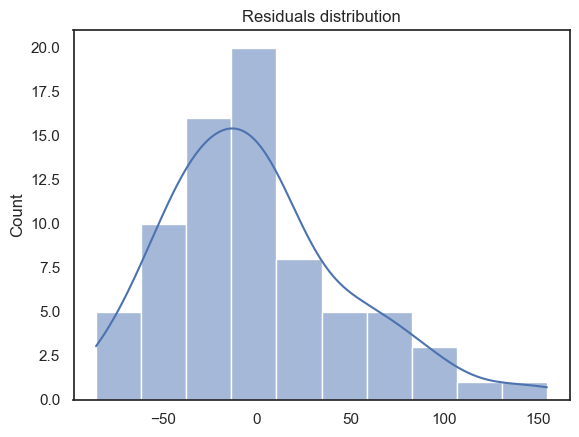

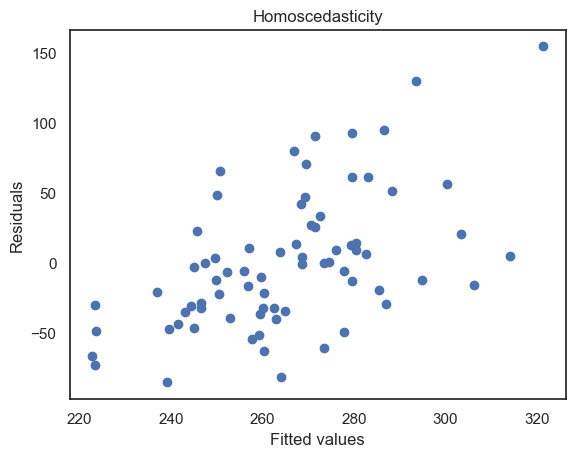

Residuals are not homoscedastic LeveneResult(statistic=26.166037735371308, pvalue=9.697097402059518e-07)
Bartlett’s test p-value: 5.889859336317171e-12
White test p-value: 0.5620284752347008
Levene’s test p-value for the whole model: 9.697097402059518e-07
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.2899859309843729
Levene’s test p-value for variable sex: 0.6189801319835964
Levene’s test p-value for variable ndd: 0.8071626184500716
No multicollinearity detected


c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


'Assumptions checked'

In [409]:
# Check the assumptions of the model
check_assumptions(result, go_dis_family)

Residuals are not normally distributed ShapiroResult(statistic=0.9547215700149536, pvalue=0.009783018380403519)


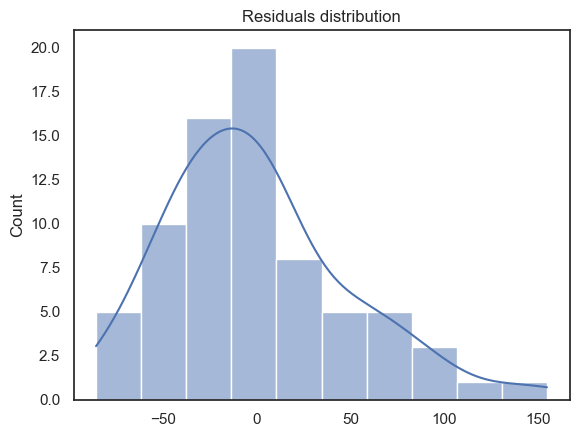

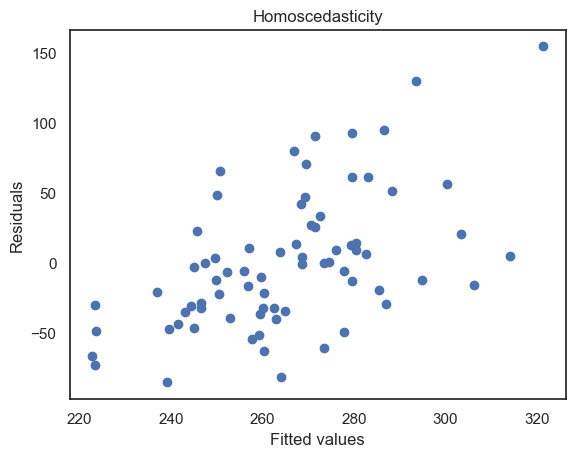

Residuals are not homoscedastic LeveneResult(statistic=26.1660377353709, pvalue=9.697097402061248e-07)
Bartlett’s test p-value: 5.889859336319875e-12
White test p-value: 0.5620284752347094
Levene’s test p-value for the whole model: 9.697097402061248e-07
Levene’s test p-value for variable age: nan
Levene’s test p-value for variable site: 0.2899859309843729
Levene’s test p-value for variable sex: 0.6189801319835964
Levene’s test p-value for variable ndd: 0.8071626184500716
No multicollinearity detected
Intraclass Correlation Coefficient (ICC): 0.2327


c:\Users\gabot\anaconda3\lib\site-packages\scipy\stats\_morestats.py:2710: RuntimeWarning: invalid value encountered in double_scalars
  W = numer / denom


In [413]:
# Fit a mixed-effects model with family_id as a random effect
model = smf.mixedlm("overall_rt ~ age + ndd +sex", go_dis_family, groups=go_dis_family["family_id"])
result = model.fit()

# Check the assumptions
check_assumptions(result, go_dis_family)

# Extract variance components
vc = result.cov_re.iloc[0, 0]  # Random effect variance (family)
residual_var = result.scale    # Residual variance (individual)

# Calculate ICC
icc = vc / (vc + residual_var)

print(f"Intraclass Correlation Coefficient (ICC): {icc:.4f}")

In [414]:
# Add to the document
doc.add_heading('Intraclass Correlation Coefficient (ICC)', level=2)

doc.add_paragraph(f"Intraclass Correlation Coefficient (ICC): {icc:.4f}", style='List Bullet')


In [415]:
# Mixed-effects model (random intercept for family)
mixed_model = smf.mixedlm("overall_rt ~ age + sex", go_dis_family, groups=go_dis_family["family_id"])
mixed_result = mixed_model.fit()

# Fixed-effects model (no family random effect)
fixed_model = smf.ols("overall_rt ~ age + sex", go_dis_family).fit()

# Print summaries
print("Mixed-Effects Model Summary:")
print(mixed_result.summary())

print("\nFixed-Effects Model Summary:")
print(fixed_model.summary())

Mixed-Effects Model Summary:
          Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: overall_rt
No. Observations:  74      Method:             REML      
No. Groups:        37      Scale:              2981.5077 
Min. group size:   2       Log-Likelihood:     -401.5229 
Max. group size:   2       Converged:          Yes       
Mean group size:   2.0                                   
---------------------------------------------------------
             Coef.  Std.Err.   z    P>|z|  [0.025  0.975]
---------------------------------------------------------
Intercept   253.985   18.089 14.041 0.000 218.532 289.439
sex[T.male]  -8.512   16.696 -0.510 0.610 -41.236  24.211
age           0.525    0.450  1.166 0.244  -0.357   1.407
Group Var   898.492   14.989                             


Fixed-Effects Model Summary:
                            OLS Regression Results                            
Dep. Variable:             overall_rt   R-squared:         

In [416]:

# Log-likelihoods for both models
ll_mixed = mixed_result.llf  # Log-likelihood of mixed model
ll_fixed = fixed_model.llf  # Log-likelihood of fixed model

# Likelihood ratio test statistic
lr_stat = 2 * (ll_mixed - ll_fixed)

# Degrees of freedom (number of random effects added in mixed model)
df_diff = 1

# Calculate p-value
p_value = chi2.sf(lr_stat, df_diff)

print(f"Likelihood Ratio Test Statistic: {lr_stat:.4f}")
print(f"P-value: {p_value:.4f}")

if p_value < 0.05:
    print("The mixed model is significantly better. Retain family random effect.")
    # Add to the document
    doc.add_heading('Likelihood Ratio Test', level=2)
    doc.add_paragraph(f"Likelihood Ratio Test Statistic: {lr_stat:.4f}", style='List Bullet')
    doc.add_paragraph(f"P-value: {p_value:.4f}", style='List Bullet')
    doc.add_paragraph("The mixed model is significantly better. Retain family random effect.", style='List Bullet')
else:
    print("No significant difference. Consider using the fixed-effects model.")
    # Add to the document
    doc.add_heading('Likelihood Ratio Test', level=2)
    doc.add_paragraph(f"Likelihood Ratio Test Statistic: {lr_stat:.4f}", style='List Bullet')
    doc.add_paragraph(f"P-value: {p_value:.4f}", style='List Bullet')
    doc.add_paragraph("No significant difference. Consider using the fixed-effects model.", style='List Bullet')
    

Likelihood Ratio Test Statistic: 15.2710
P-value: 0.0001
The mixed model is significantly better. Retain family random effect.


In [417]:
# Extract variance components
family_variance = mixed_result.cov_re.iloc[0, 0]  # Between-family variance
residual_variance = mixed_result.scale            # Within-family variance

# Compute ICC
icc = family_variance / (family_variance + residual_variance)
print("family variance", family_variance)
print("residual variance", residual_variance)
print(f"ICC: {icc:.4f}")

family variance 898.491989374695
residual variance 2981.507680710567
ICC: 0.2316


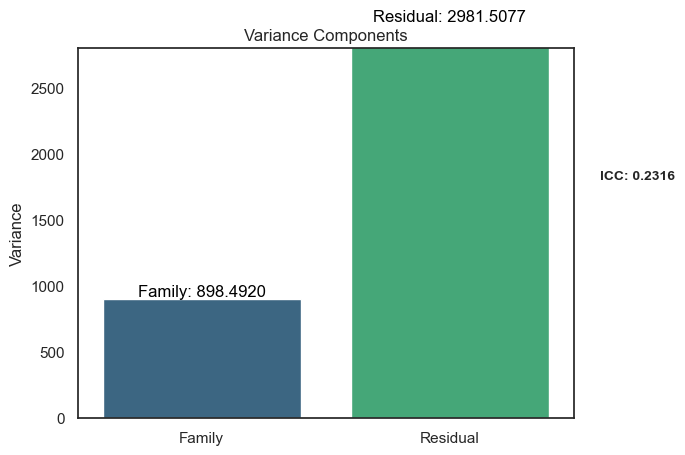

In [418]:
# Plot the family variance and residual variance
sns.barplot(x=["Family", "Residual"], y=[family_variance, residual_variance], palette="viridis")
plt.ylabel("Variance")
plt.title("Variance Components")

# Add ICC values to the plot as subtitle
plt.suptitle(f"ICC: {icc:.4f}", x=1, y=0.6, fontsize=10, fontweight="bold",ha= "center", va="bottom")

# Write subtitle with ICC value

# Add the variance valies to the plot
plt.text(0, family_variance, f"Family: {family_variance:.4f}", ha="center", va="bottom", color="black")
plt.text(1, residual_variance, f"Residual: {residual_variance:.4f}", ha="center", va="bottom", color="black")

# Add ylimm 
plt.ylim(0, 2800)
# Add to the document
doc.add_heading('Variance Components', level=2)


# Save the plot
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/variance_components_{date}.png")

# Add the figure to the document
doc.add_heading('Variance Components figure', level=3)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/variance_components_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))


plt.show()


In [419]:
variable = "overall_rt"


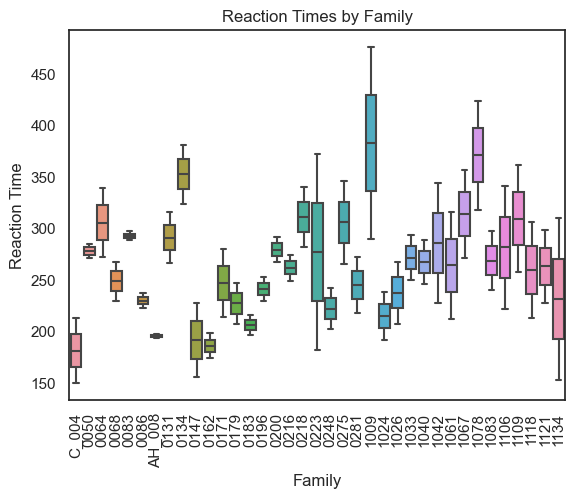

In [420]:
# Assuming 'go_dis_family' is your dataset and 'family_id' represents the family group
sns.boxplot(x='family_id', y='overall_rt', data=go_dis_family)
plt.title('Reaction Times by Family')
plt.xlabel('Family')
plt.ylabel('Reaction Time')
plt.xticks(rotation=90)  # Rotate family labels if necessary
plt.show()

<Axes: xlabel='disengage', ylabel='Count'>

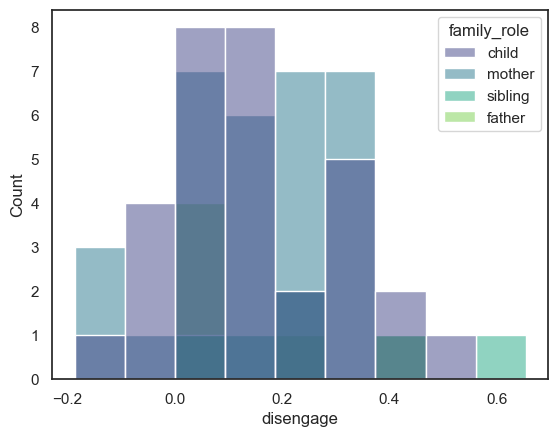

In [434]:
# Plot the distribution of disenage by family
sns.histplot(x='disengage', data=go_dis_family, hue='family_role', palette='viridis')

In [436]:
# Check if disengage is normally distributed
# Test for normality
shapiro_test = stats.shapiro(go_dis["disengage"])
if shapiro_test[1] < 0.05:
    print("Disengage is not normally distributed", shapiro_test)
    sns.histplot(go_dis_family["disengage"], kde=True)
    plt.title("Disengage distribution")
    ## QQ plot
    stats.probplot(go_dis_family["disengage"], dist="norm", plot=plt)
    plt.show()
else:
    print("Disengage is normally distributed")

Disengage is normally distributed


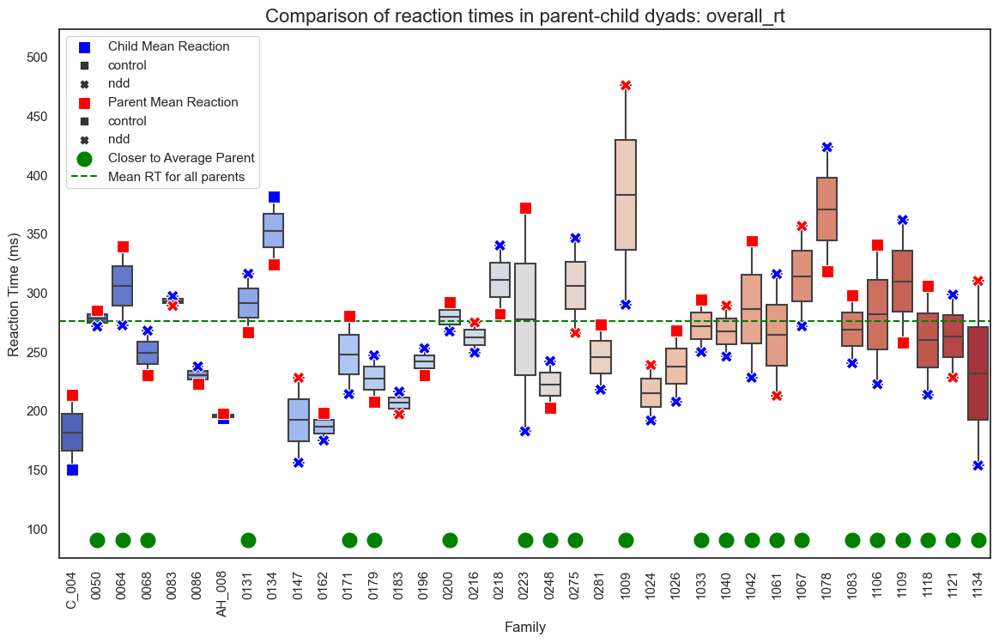

In [422]:
# Variable to test
variable = 'overall_rt'

family_order = go_dis_family['family_id'].unique()



# Step 1: Calculate the boxplot for each family
# First, split the dataset by family_role (mother vs child)
children_data = go_dis_family[go_dis_family['parents'] == 'child']
mothers_data = go_dis_family[go_dis_family['parents'] == 'parent']

# Step 2: Calculate the mean reaction time for children and mothers within families
child_means = children_data.groupby('family_id')[variable].mean().reset_index()
parent_means = mothers_data.groupby('family_id')[variable].mean().reset_index()

# Merge ndd with the child_means and parent_means
child_means = child_means.merge(children_data[['family_id', 'ndd']], on='family_id', how='left')
parent_means = parent_means.merge(mothers_data[['family_id', 'ndd']], on='family_id', how='left')

# Average for moms
avg_mom_rt = mothers_data[variable].mean()

# Step 4: Calculate absolute differences for each family
child_means['diff_within'] = abs(child_means[variable] - child_means['family_id'].map(parent_means.set_index('family_id')[variable]))
child_means['diff_random'] = abs(child_means[variable] - avg_mom_rt)


# Step 5: Identify families where the child's reaction time is closer to the random mother’s
highlight_families = child_means[child_means['diff_random'] < child_means['diff_within']]['family_id']

# Step 6: Create the plot
plt.figure(figsize=(14, 8))

# Sort dataframes by family_id order
child_means['family_id'] = pd.Categorical(child_means['family_id'], categories=family_order, ordered=True)
child_means = child_means.sort_values('family_id')

parent_means['family_id'] = pd.Categorical(parent_means['family_id'], categories=family_order, ordered=True)
parent_means = parent_means.sort_values('family_id')

highlight_families = pd.Categorical(highlight_families, categories=family_order, ordered=True)
highlight_families = highlight_families.sort_values()

# Plot the boxplot for each family, showing mother and child side by side
sns.boxplot(x='family_id', y=variable, data=go_dis_family, showfliers=False, palette='coolwarm')


# Overlay mean reaction times for children and random mothers
sns.scatterplot(x='family_id', y=variable, color='blue', label='Child Mean Reaction',
                 s=100, zorder=5, style='ndd', data=child_means, markers=['s','X'])
sns.scatterplot(x='family_id', y=variable, color='red', label='Parent Mean Reaction', data=parent_means,
                 s=100, zorder=5, style='ndd', markers=['s', "X"])

# Add y limits based on reaction times for clarity. Make custome limits
ymax= go_dis_family[variable].max() * 1.1

if go_dis_family[variable].min() < 0:
    ymin= go_dis_family[variable].min() * 1.5
    closer_ymin= ymin - ymin*0.1

else:
    ymin= go_dis_family[variable].min() * 0.5
    closer_ymin= ymin + ymin*0.2

# Highlight families where child’s reaction time is closer to the random mother’s average
sns.scatterplot(x=highlight_families, y=closer_ymin,
                color='green', label='Closer to Average Parent', s=200, zorder=10, marker='o')

# Plot the overall mean reaction time for context
plt.axhline(y=mothers_data[variable].mean(), color='green', linestyle='--', label='Mean RT for all parents')

plt.ylim(ymin, ymax)

# Add titles and labels
plt.title(F'Comparison of reaction times in parent-child dyads: {variable}', fontsize=16)
plt.xlabel('Family')
plt.ylabel('Reaction Time (ms)')
plt.xticks(rotation=90)

# Show legend for clarity
plt.legend()

# Add to the document
doc.add_heading('Reaction Time Comparison in Parent-Child Dyads', level=2)

# Save the plot
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/parent_child_reaction_time_comparison_{date}.png")

# Add the figure to the document
doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/parent_child_reaction_time_comparison_{date}.png", width=docx.shared.Inches(9), height=docx.shared.Inches(6))


# Show the plot
plt.show()


C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\3948021492.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\3948021492.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


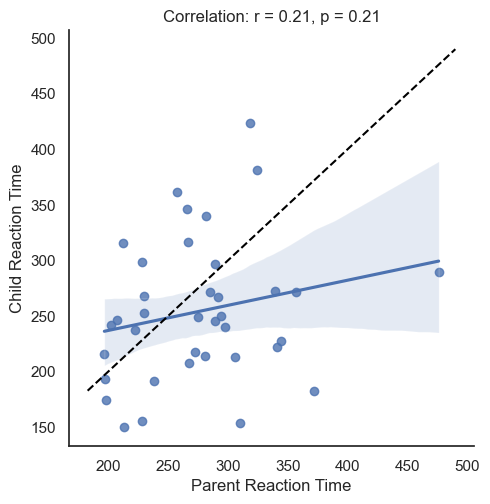

In [423]:
# Calcualte correlation betwen child and mom's reaction times
go_dis_family_parent=go_dis_family[go_dis_family.parents=="parent"]
go_dis_family_child=go_dis_family[go_dis_family.parents=="child"]

go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
go_dis_family_child["child_rt"] = go_dis_family_child[variable]

# Merge the two dataframes
go_dis_family_parent_child=pd.merge(go_dis_family_parent, go_dis_family_child, on="family_id", how="inner")


# Calculate the correlation between mother and child reaction times
r, p = stats.pearsonr(go_dis_family_parent_child["parent_rt"], go_dis_family_parent_child["child_rt"])
r= round(r, 2)
p= round(p, 2)

# Plot the relationship between mother and child reaction times
sns.lmplot(x="parent_rt", y="child_rt", data=go_dis_family_parent_child, palette="Sett1")


plt.xlabel("Parent Reaction Time")
plt.ylabel("Child Reaction Time")
plt.title(f"Correlation: r = {r}, p = {p}")


# Add diagonal line that represents perfect correlation (r = 1)
xmin, xmax = plt.xlim()
#ymin, ymax = plt.ylim()
plt.plot([xmin, xmax], [xmin, xmax], color="black", linestyle="--")



# Add to the document
doc.add_heading('Mother-Child Reaction Time Correlation', level=2)

doc.add_paragraph(f"Correlation: r = {r}, p = {p.round(2)}", style='List Bullet')

# Save the plot
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/parent_child_rt_{date}.png")

plt.show()  

# Add the figure to the document
doc.add_heading('Mother-Child Reaction Time Correlation figure', level=3)

doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/parent_child_rt_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))




C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family['Overlap_rt'] = np.exp(go_dis_family['Overlap'])
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intraclass Correlation Coefficient (ICC) for Gap: 0.093
Likelihood Ratio Test Statistic: -22.5680
P-value: 1.0000
Gap
No significant difference. Consider using the fixed-effects model.
family variance 0.008400715939052516
residual variance 0.05276198355034556
ICC FINAL Gap: 0.1374


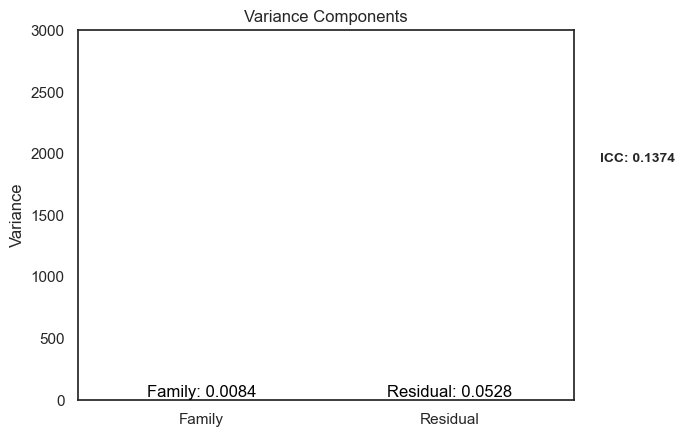

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 18   48.64864864864865 %


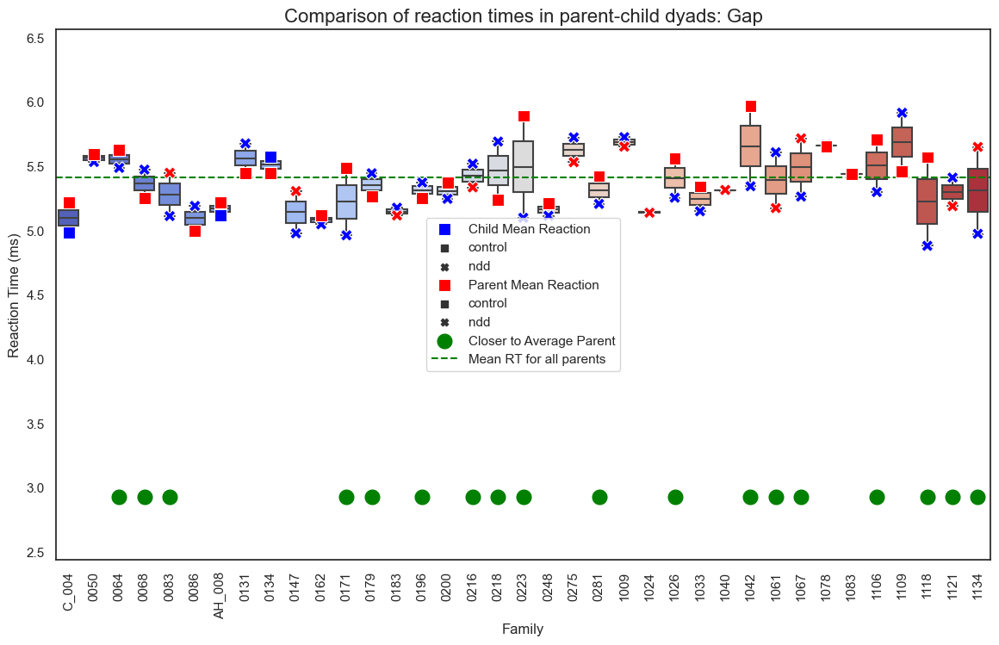

C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


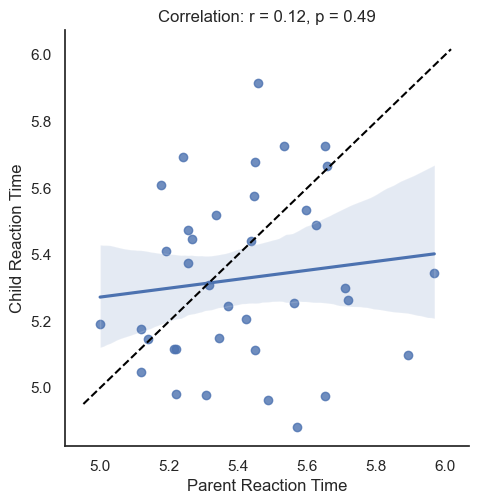

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intraclass Correlation Coefficient (ICC) for facilitation: 0.005
Likelihood Ratio Test Statistic: -25.6526
P-value: 1.0000
facilitation
No significant difference. Consider using the fixed-effects model.
family variance 3.9920132634533365e-05
residual variance 0.0331660309819035
ICC FINAL facilitation: 0.0012


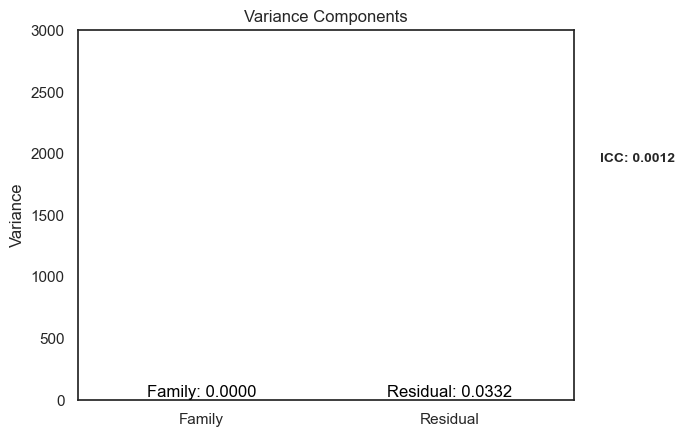

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 25   67.56756756756756 %


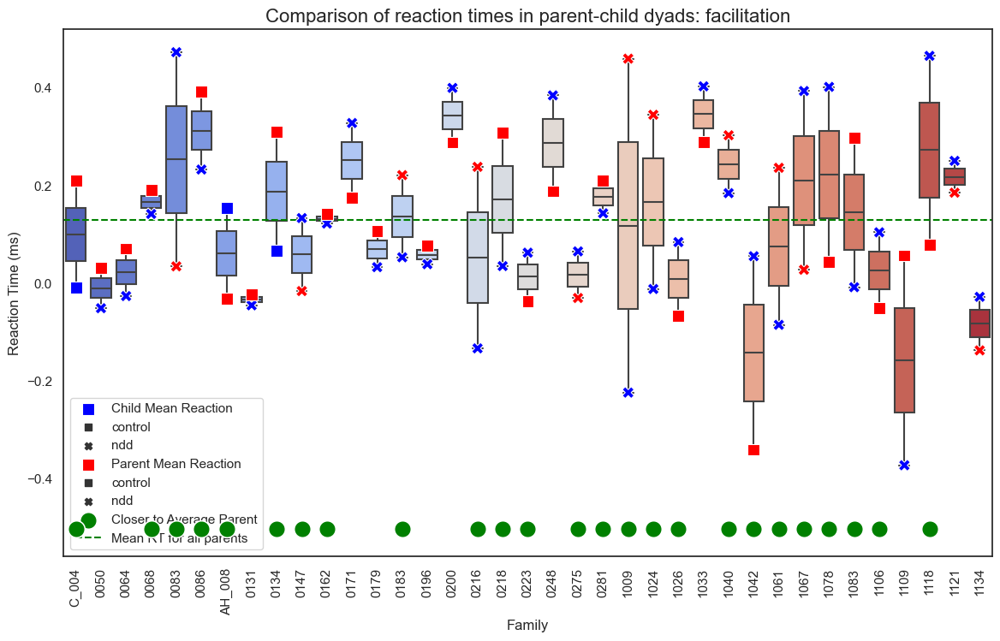

C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


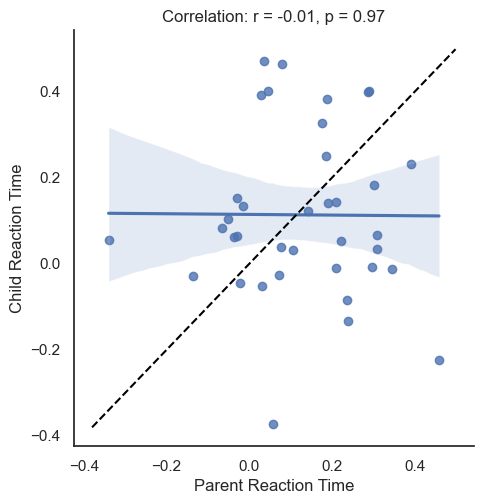

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intraclass Correlation Coefficient (ICC) for disengage: 0.069
Likelihood Ratio Test Statistic: -26.6893
P-value: 1.0000
disengage
No significant difference. Consider using the fixed-effects model.
family variance 0.0017138272228353405
residual variance 0.022843206318343183
ICC FINAL disengage: 0.0698


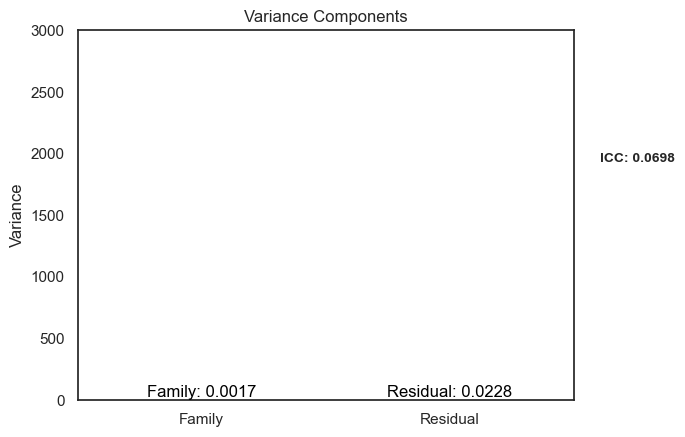

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 22   59.45945945945946 %


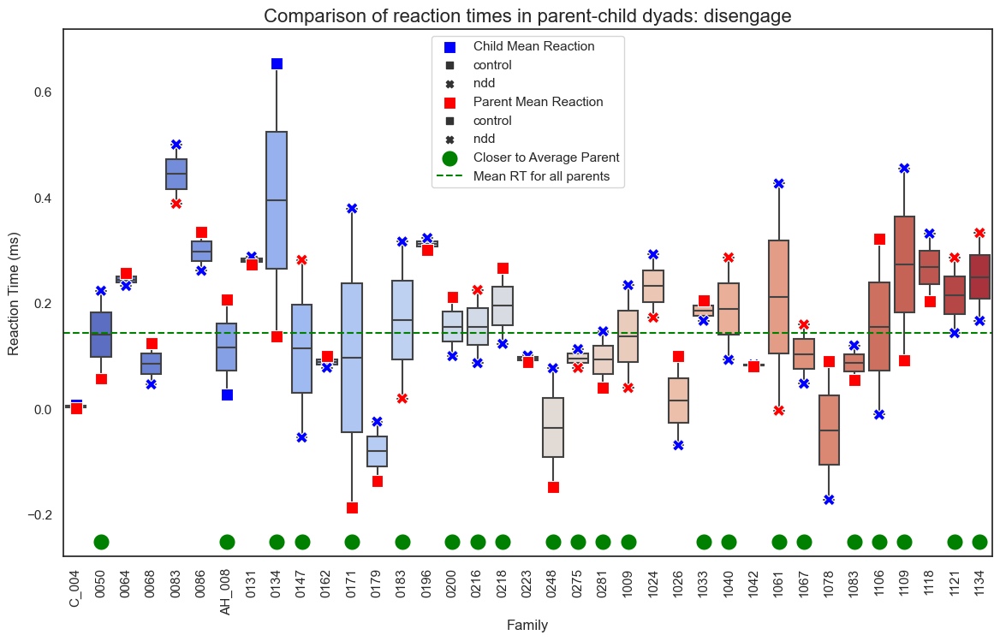

C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


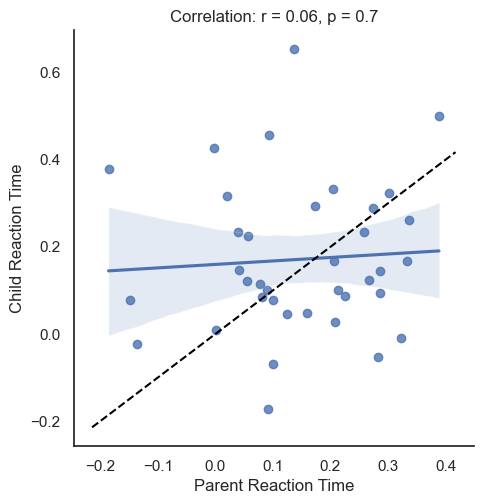

Intraclass Correlation Coefficient (ICC) for Overlap_rt: 0.221
Likelihood Ratio Test Statistic: 25.0854
P-value: 0.0000
Overlap_rt
The mixed model is significantly better. Retain family random effect.
family variance 1509.4265429713748
residual variance 4074.145264690491
ICC FINAL Overlap_rt: 0.2703


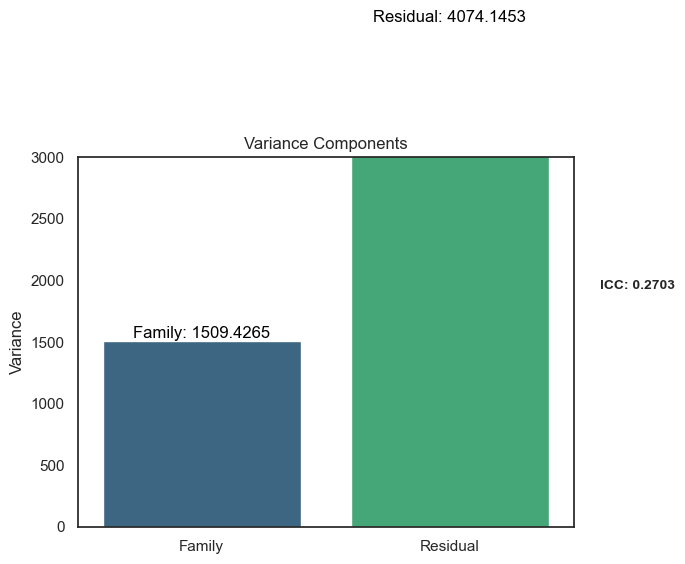

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 23   62.16216216216216 %


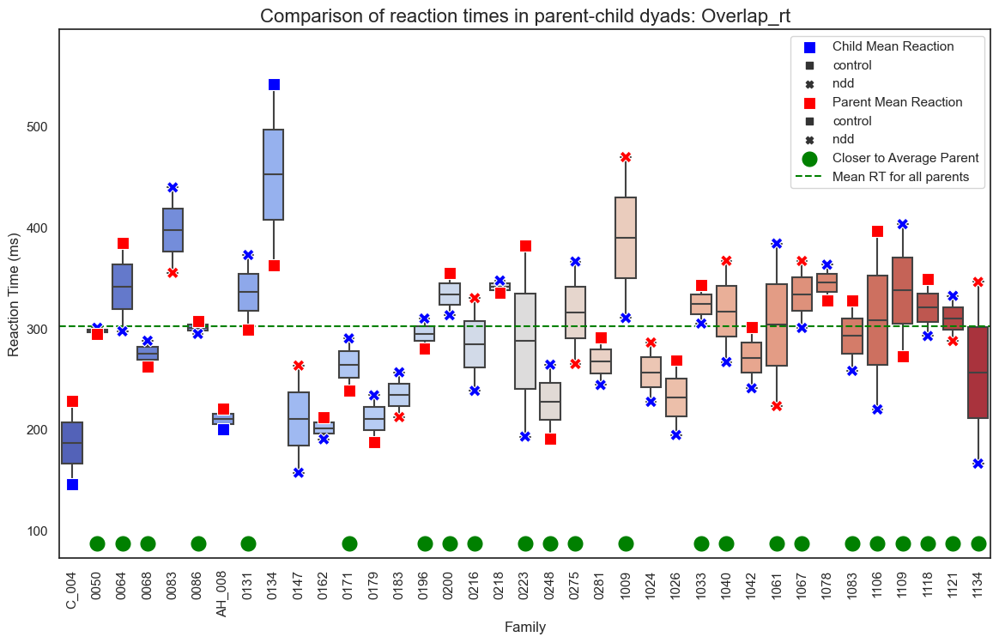

C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


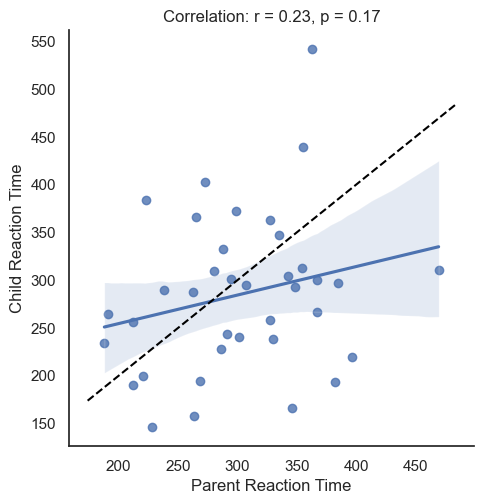

Intraclass Correlation Coefficient (ICC) for overall_rt: 0.185
Likelihood Ratio Test Statistic: 22.9587
P-value: 0.0000
overall_rt
The mixed model is significantly better. Retain family random effect.
family variance 914.7829843744065
residual variance 3016.660049526428
ICC FINAL overall_rt: 0.2327


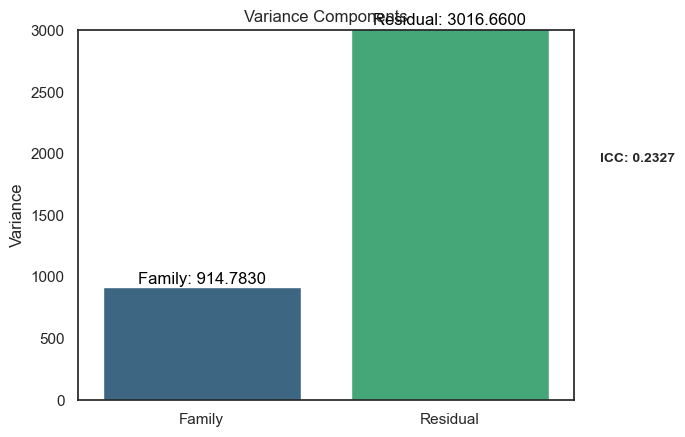

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 22   59.45945945945946 %


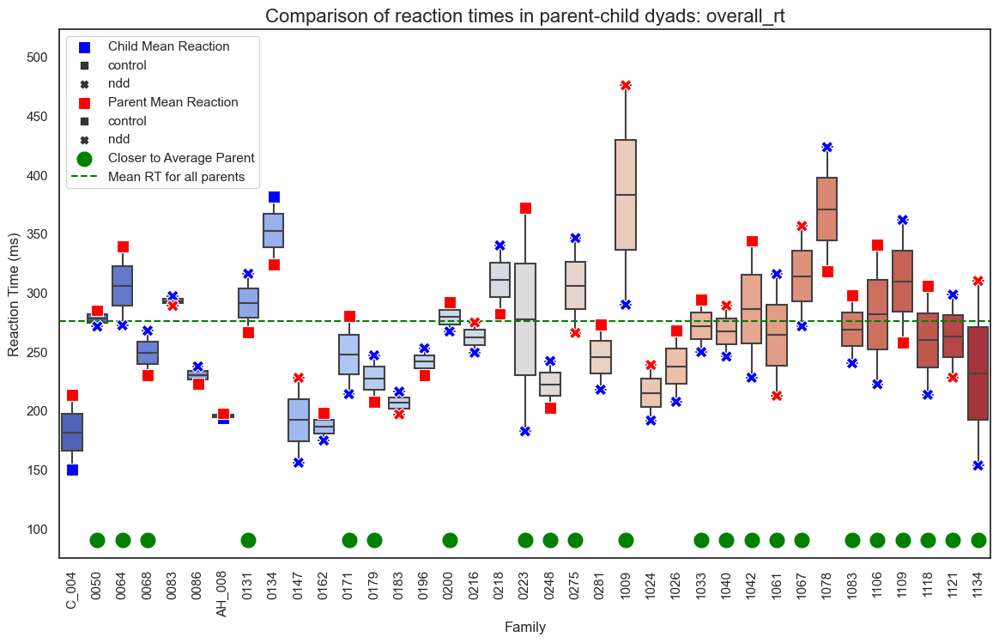

C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_13584\223466413.py:203: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


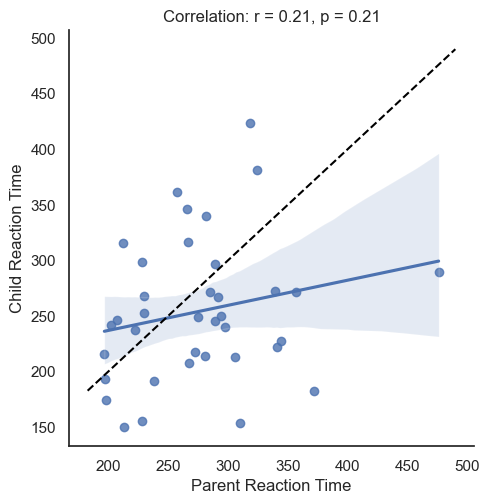

In [429]:
go_dis_family['Overlap_rt'] = np.exp(go_dis_family['Overlap'])
rt_variables = ["Gap","facilitation", "disengage", "Overlap_rt","overall_rt"]
for variable in rt_variables:


    # Fit a mixed-effects model with family as a random effect
    model = smf.mixedlm(f"{variable} ~ 1", go_dis_family, groups=go_dis_family["family_id"])
    result = model.fit()

    # Extract intraclass correlation manually
    icc = result.cov_re / (result.cov_re + result.scale)
    print(f"Intraclass Correlation Coefficient (ICC) for {variable}: {icc.Group.values.item():.3f}")

    # Add to the document
    doc.add_heading(f"Intraclass Correlation Coefficient (ICC) {variable}" , level=2)

    doc.add_paragraph(f"Intraclass Correlation Coefficient (ICC) for {variable}: {icc.Group.values.item():.4f}", style='List Bullet')

    # Mixed-effects model (random intercept for family)
    mixed_model = smf.mixedlm(f"{variable} ~ age + sex +ndd", go_dis_family, groups=go_dis_family["family_id"])
    mixed_result = mixed_model.fit()

    # Fixed-effects model (no family random effect)
    fixed_model = smf.ols(f"{variable} ~ age + sex + ndd", go_dis_family).fit()

    
    # Print summaries
   # print("Mixed-Effects Model Summary:")
    #print(mixed_result.summary())

    #print("\nFixed-Effects Model Summary:")
    #print(fixed_model.summary())

# Log-likelihoods for both models
    ll_mixed = mixed_result.llf  # Log-likelihood of mixed model
    ll_fixed = fixed_model.llf  # Log-likelihood of fixed model

    # Likelihood ratio test statistic
    lr_stat = 2 * (ll_mixed - ll_fixed)

    # Degrees of freedom (number of random effects added in mixed model)
    df_diff = 1

    # Calculate p-value
    p_value = chi2.sf(lr_stat, df_diff)

    print(f"Likelihood Ratio Test Statistic: {lr_stat:.4f}")
    print(f"P-value: {p_value:.4f}")

    if p_value < 0.05:
        print(variable)
        print("The mixed model is significantly better. Retain family random effect.")
        # Add to the document
        doc.add_heading('Likelihood Ratio Test', level=2)
        doc.add_paragraph(f"Likelihood Ratio Test Statistic {variable}: {lr_stat:.4f}", style='List Bullet')
        doc.add_paragraph(f"P-value: {p_value:.4f}", style='List Bullet')
        doc.add_paragraph("The mixed model is significantly better. Retain family random effect.", style='List Bullet')
    else:
        print(variable)
        print("No significant difference. Consider using the fixed-effects model.")
        # Add to the document
        doc.add_heading('Likelihood Ratio Test', level=2)
        doc.add_paragraph(f"Likelihood Ratio Test Statistic {variable}: {lr_stat:.4f}", style='List Bullet')
        doc.add_paragraph(f"P-value: {p_value:.4f}", style='List Bullet')
        doc.add_paragraph("No significant difference. Consider using the fixed-effects model.", style='List Bullet')
        # Extract variance components
    family_variance = mixed_result.cov_re.iloc[0, 0]  # Between-family variance
    residual_variance = mixed_result.scale            # Within-family variance

    # Compute ICC
    icc = family_variance / (family_variance + residual_variance)
    print("family variance", family_variance)
    print("residual variance", residual_variance)
    print(f"ICC FINAL {variable}: {icc:.4f}")
    # Plot the family variance and residual variance
    sns.barplot(x=["Family", "Residual"], y=[family_variance, residual_variance], palette="viridis")
    plt.ylabel("Variance")
    plt.title("Variance Components")

    # Add ICC values to the plot as subtitle
    plt.suptitle(f"ICC: {icc:.4f}", x=1, y=0.6, fontsize=10, fontweight="bold",ha= "center", va="bottom")

    # Write subtitle with ICC value

    # Add the variance valies to the plot
    plt.text(0, family_variance, f"Family: {family_variance:.4f}", ha="center", va="bottom", color="black")
    plt.text(1, residual_variance, f"Residual: {residual_variance:.4f}", ha="center", va="bottom", color="black")

    # Add ylimm 
    plt.ylim(0, 3000)
    # Add to the document
    doc.add_heading('Variance Components', level=2)


    # Save the plot
    plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/variance_components_{date}.png")

    # Add the figure to the document
    doc.add_heading('Variance Components figure', level=3)

    doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/variance_components_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))


    plt.show()
    
    # Step 1: Calculate the boxplot for each family
    # First, split the dataset by family_role (mother vs child)
    children_data = go_dis_family[go_dis_family['parents'] == 'child']
    mothers_data = go_dis_family[go_dis_family['parents'] == 'parent']

    # Step 2: Calculate the mean reaction time for children and mothers within families
    child_means = children_data.groupby('family_id')[variable].mean().reset_index()
    parent_means = mothers_data.groupby('family_id')[variable].mean().reset_index()

    # Merge ndd with the child_means and parent_means
    child_means = child_means.merge(children_data[['family_id', 'ndd']], on='family_id', how='left')
    parent_means = parent_means.merge(mothers_data[['family_id', 'ndd']], on='family_id', how='left')

    # Average for moms
    avg_mom_rt = mothers_data[variable].mean()

    # Step 4: Calculate absolute differences for each family
    child_means['diff_within'] = abs(child_means[variable] - child_means['family_id'].map(parent_means.set_index('family_id')[variable]))
    child_means['diff_random'] = abs(child_means[variable] - avg_mom_rt)


    # Step 5: Identify families where the child's reaction time is closer to the random mother’s
    highlight_families = child_means[child_means['diff_random'] < child_means['diff_within']]['family_id']

    # Step 6: Create the plot
    plt.figure(figsize=(14, 8))

    # Sort dataframes by family_id order
    child_means['family_id'] = pd.Categorical(child_means['family_id'], categories=family_order, ordered=True)
    child_means = child_means.sort_values('family_id')

    parent_means['family_id'] = pd.Categorical(parent_means['family_id'], categories=family_order, ordered=True)
    parent_means = parent_means.sort_values('family_id')

    highlight_families = pd.Categorical(highlight_families, categories=family_order, ordered=True)
    highlight_families = highlight_families.sort_values()

    # Plot the boxplot for each family, showing mother and child side by side
    sns.boxplot(x='family_id', y=variable, data=go_dis_family, showfliers=False, palette='coolwarm')


    # Overlay mean reaction times for children and random mothers
    sns.scatterplot(x='family_id', y=variable, color='blue', label='Child Mean Reaction',
                    s=100, zorder=5, style='ndd', data=child_means, markers=['s','X'])
    sns.scatterplot(x='family_id', y=variable, color='red', label='Parent Mean Reaction', data=parent_means,
                    s=100, zorder=5, style='ndd', markers=['s', "X"])

    # Add y limits based on reaction times for clarity. Make custome limits
    ymax= go_dis_family[variable].max() * 1.1

    if go_dis_family[variable].min() < 0:
        ymin= go_dis_family[variable].min() * 1.5
        closer_ymin= ymin - ymin*0.1

    else:
        ymin= go_dis_family[variable].min() * 0.5
        closer_ymin= ymin + ymin*0.2

    # Highlight families where child’s reaction time is closer to the random mother’s average
    sns.scatterplot(x=highlight_families, y=closer_ymin,
                    color='green', label='Closer to Average Parent', s=200, zorder=10, marker='o')

    # Plot the overall mean reaction time for context
    plt.axhline(y=mothers_data[variable].mean(), color='green', linestyle='--', label='Mean RT for all parents')

    plt.ylim(ymin, ymax)

    # Add titles and labels
    plt.title(F'Comparison of reaction times in parent-child dyads: {variable}', fontsize=16)
    plt.xlabel('Family')
    plt.ylabel('Reaction Time (ms)')
    plt.xticks(rotation=90)

    # Show legend for clarity
    plt.legend()

    print("Total number of families", len(go_dis_family.family_id.unique()))
    print("Total number of families where child's reaction time is closer to the random mother’s average", len(highlight_families), " ", len(highlight_families)/len(go_dis_family.family_id.unique())*100,"%")

    # Add to the document
    doc.add_heading('Reaction Time Comparison in Parent-Child Dyads', level=2)

    # Save the plot
    plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/parent_child_reaction_time_comparison_{date}.png")

    # Add the figure to the document
    doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/parent_child_reaction_time_comparison_{date}.png", width=docx.shared.Inches(9), height=docx.shared.Inches(6))


    # Show the plot
    plt.show()

    # Calcualte correlation betwen child and mom's reaction times
    go_dis_family_parent=go_dis_family[go_dis_family.parents=="parent"]
    go_dis_family_child=go_dis_family[go_dis_family.parents=="child"]

    go_dis_family_parent["parent_rt"] = go_dis_family_parent[variable]
    go_dis_family_child["child_rt"] = go_dis_family_child[variable]

    # Merge the two dataframes
    go_dis_family_parent_child=pd.merge(go_dis_family_parent, go_dis_family_child, on="family_id", how="inner")


    # Calculate the correlation between mother and child reaction times
    r, p = stats.pearsonr(go_dis_family_parent_child["parent_rt"], go_dis_family_parent_child["child_rt"])
    r= round(r, 2)
    p= round(p, 2)

    # Plot the relationship between mother and child reaction times
    sns.lmplot(x="parent_rt", y="child_rt", data=go_dis_family_parent_child, palette="Sett1")


    plt.xlabel("Parent Reaction Time")
    plt.ylabel("Child Reaction Time")
    plt.title(f"Correlation: r = {r}, p = {p}")


    # Add diagonal line that represents perfect correlation (r = 1)
    xmin, xmax = plt.xlim()
    #ymin, ymax = plt.ylim()
    plt.plot([xmin, xmax], [xmin, xmax], color="black", linestyle="--")



    # Add to the document
    doc.add_heading('Mother-Child Reaction Time Correlation', level=2)

    doc.add_paragraph(f"Correlation: r = {r}, p = {p.round(2)}", style='List Bullet')

    # Save the plot
    plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_rt_{date}.png")

    plt.show()  

    # Add the figure to the document
    doc.add_heading('Mother-Child Reaction Time Correlation figure', level=3)

    doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_rt_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))


In [430]:
# Save the document

if outlier_rem:
    doc.save(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/automated/results-gap-{date}_{derivative}.docx")
else:
    doc.save(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/automated/results-gap-{date}_{derivative}_no_outliers.docx")

In [431]:
# Stop here
go_dis_family["stop"]

KeyError: 'stop'

In [945]:
go_dis_family

,subject,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap,total_trials,overall_rt,ndd,...,age,sex,age_group,q1k_ID,record_id,family_id,family_role,parents,n_family,Overlap_rt
0,004Z,4.982845,4.973942,4.983040,-0.008904,0.009098,0.000195,28,149.997857,control,...,11.130000,female,child,Q1K_004_Z,4,C_004,child,child,2,145.917300
1,020Z,5.218745,5.427831,5.429256,0.209087,0.001424,0.210511,32,213.218750,control,...,44.970000,female,adult,Q1K_020_Z,20,C_004,mother,parent,2,227.979490
2,0050M1,5.596039,5.626875,5.684424,0.030836,0.057549,0.088385,35,285.132857,control,...,37.095902,female,adult,Q1K_HSJ_10050_M1,63,0050,mother,parent,2,294.248165
3,0050P,5.533359,5.482190,5.706198,-0.051170,0.224008,0.172838,30,271.362333,ndd,...,8.071350,female,child,Q1K_HSJ_10050_P,50,0050,child,child,2,300.725455
4,0064M1,5.624924,5.695665,5.953148,0.070741,0.257483,0.328224,31,339.381935,control,...,38.076073,female,adult,Q1K_HSJ_10064_M1,66,0064,mother,parent,2,384.963295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,1118P,4.881458,5.346319,5.678586,0.464861,0.332267,0.797129,35,213.519429,ndd,...,16.222213,male,child,Q1K_HSJ_1525-1118_P,525-1118,1118,child,child,2,292.535544
71,1121M1,5.189745,5.374840,5.661488,0.185095,0.286648,0.471743,34,228.057059,ndd,...,39.310983,female,adult,Q1K_HSJ_1525-1121_M1,525-1123,1121,mother,parent,2,287.576331
72,1121P,5.411889,5.662087,5.805966,0.250199,0.143879,0.394077,34,298.461176,ndd,...,9.276143,male,child,Q1K_HSJ_1525-1121_P,525-1121,1121,child,child,2,332.276018
73,1134M1,5.650442,5.513032,5.846517,-0.137410,0.333485,0.196075,33,310.120000,ndd,...,45.002977,female,adult,Q1K_HSJ_1525-1134_M1,525-1135,1134,mother,parent,2,346.027132


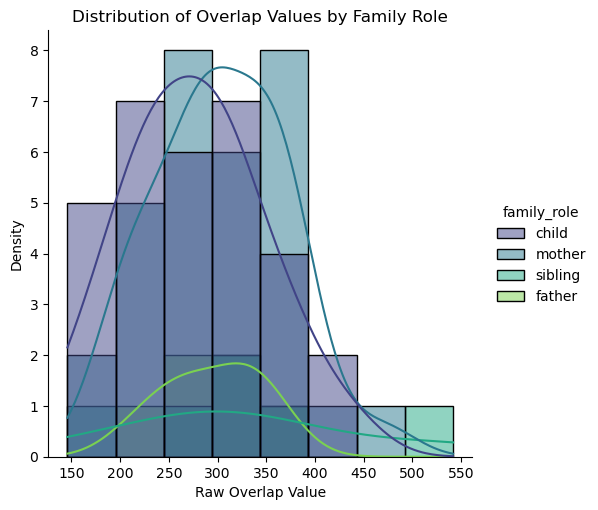

In [946]:
# Plot the distribution of the raw overlap values
sns.displot(go_dis_family, x='Overlap_rt', hue='family_role', palette='viridis', kde=True)
plt.title('Distribution of Overlap Values by Family Role')
plt.xlabel('Raw Overlap Value')
plt.ylabel('Density')   
plt.show()


c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intraclass Correlation Coefficient (ICC) for Gap: 0.093
Likelihood Ratio Test Statistic: -22.5680
P-value: 1.0000
Gap
No significant difference. Consider using the fixed-effects model.
family variance 0.008400715939052516
residual variance 0.05276198355034556
ICC FINAL Gap: 0.1374


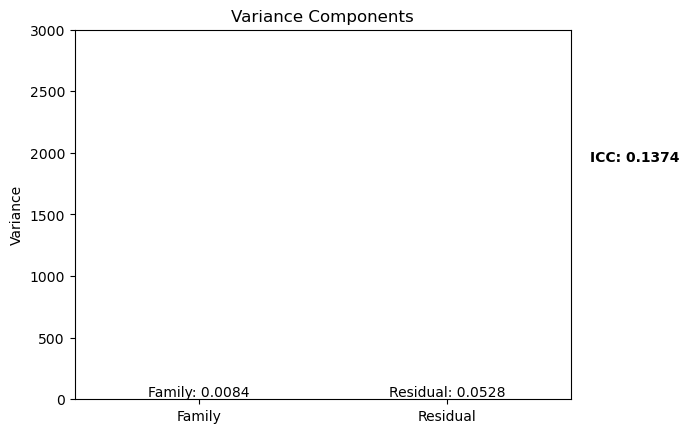

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 13   35.13513513513514 %


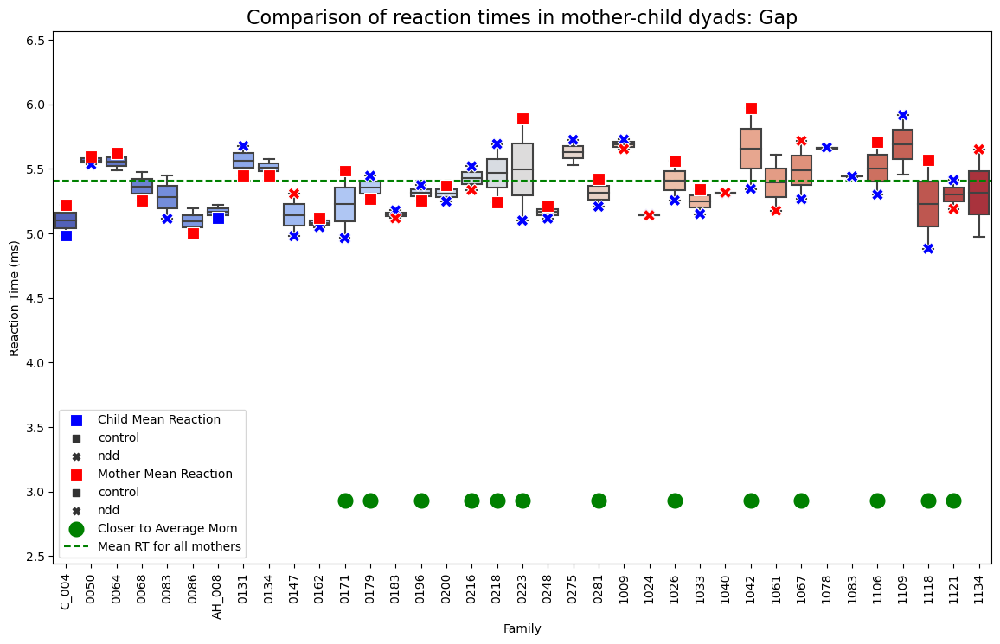

C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:201: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_mother["mother_rt"] = go_dis_family_mother[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


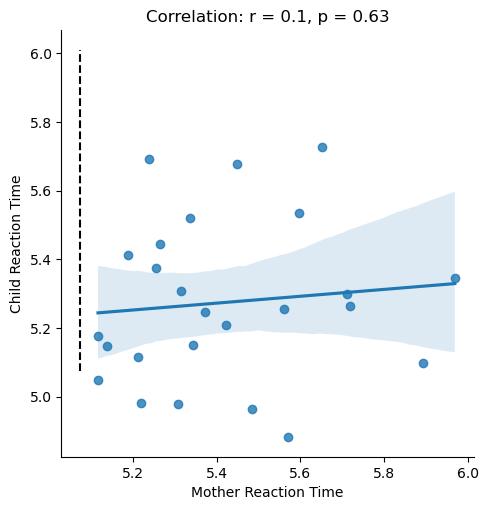

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intraclass Correlation Coefficient (ICC) for facilitation: 0.005
Likelihood Ratio Test Statistic: -25.6526
P-value: 1.0000
facilitation
No significant difference. Consider using the fixed-effects model.
family variance 3.9920132634533365e-05
residual variance 0.0331660309819035
ICC FINAL facilitation: 0.0012


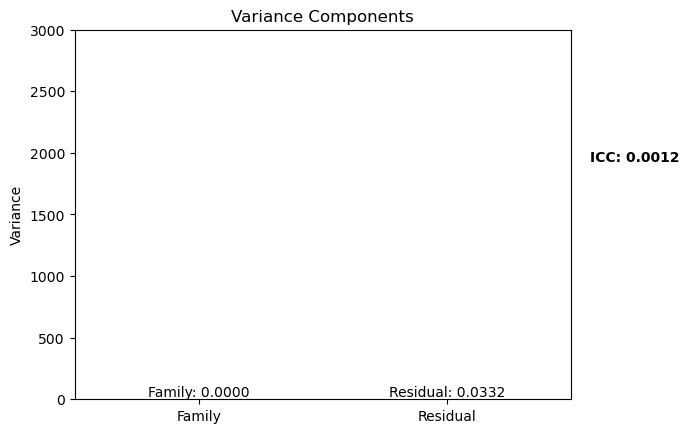

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 15   40.54054054054054 %


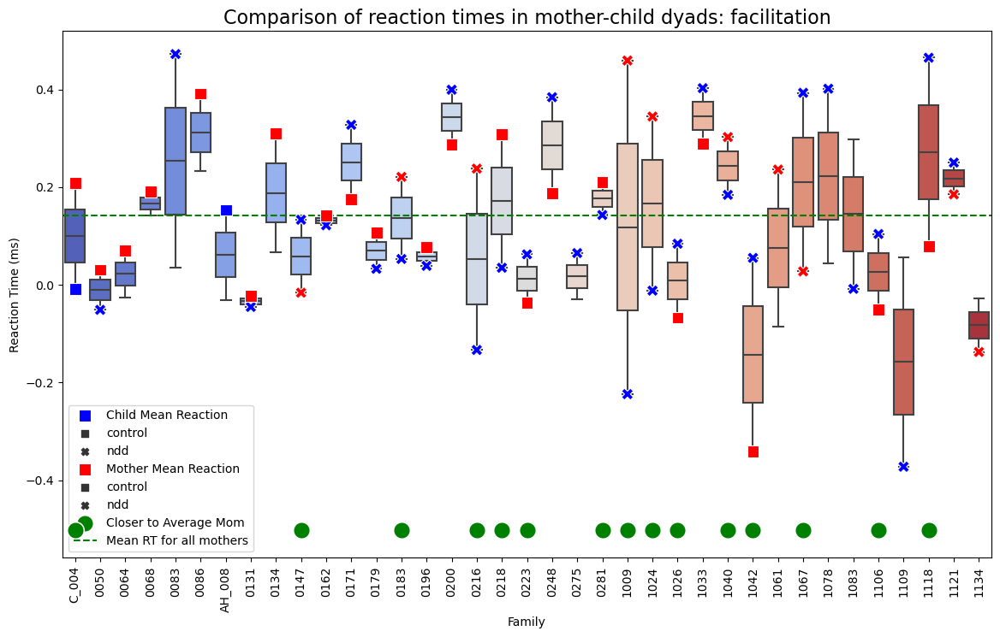

C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:201: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_mother["mother_rt"] = go_dis_family_mother[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


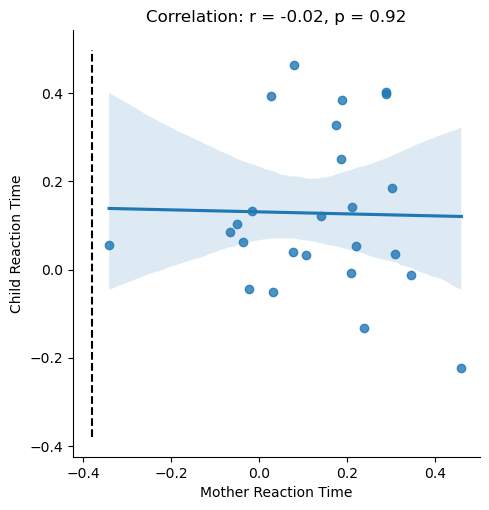

c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\Users\gabot\anaconda3\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Intraclass Correlation Coefficient (ICC) for disengage: 0.069
Likelihood Ratio Test Statistic: -26.6893
P-value: 1.0000
disengage
No significant difference. Consider using the fixed-effects model.
family variance 0.0017138272228353405
residual variance 0.022843206318343183
ICC FINAL disengage: 0.0698


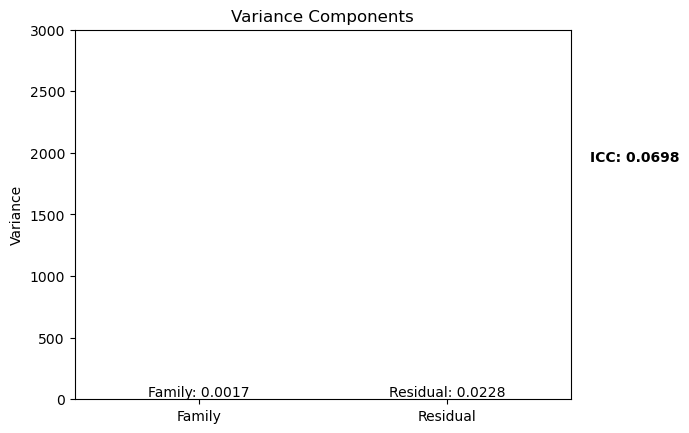

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 15   40.54054054054054 %


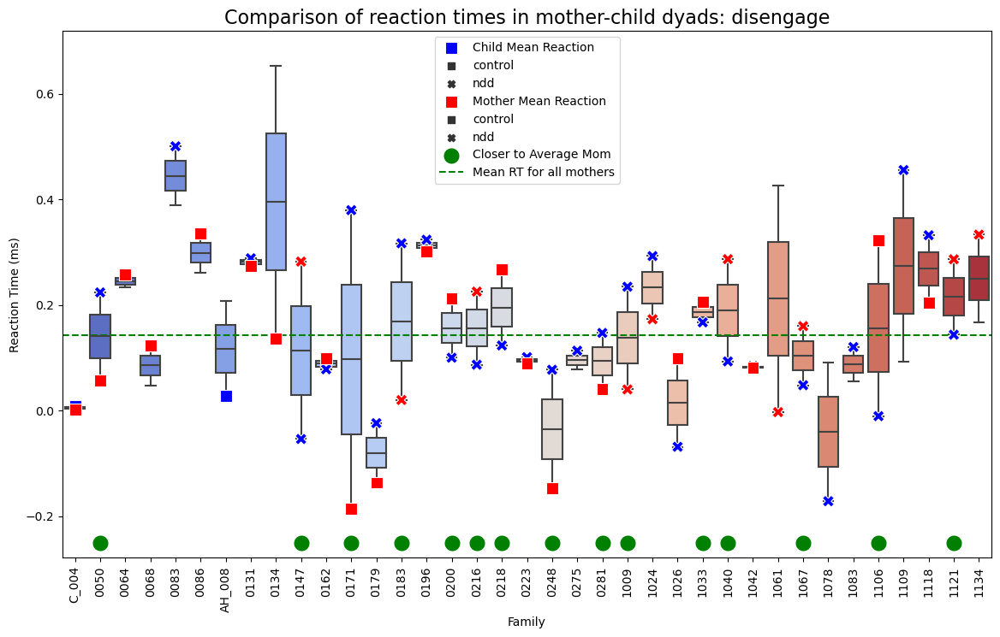

C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:201: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_mother["mother_rt"] = go_dis_family_mother[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


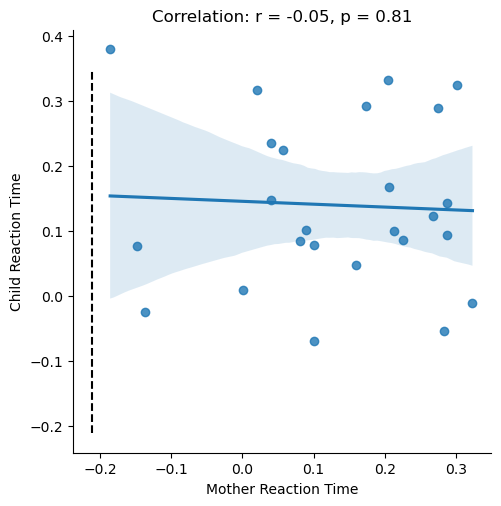

Intraclass Correlation Coefficient (ICC) for Overlap_rt: 0.221
Likelihood Ratio Test Statistic: 25.0854
P-value: 0.0000
Overlap_rt
The mixed model is significantly better. Retain family random effect.
family variance 1509.4265429713748
residual variance 4074.145264690491
ICC FINAL Overlap_rt: 0.2703


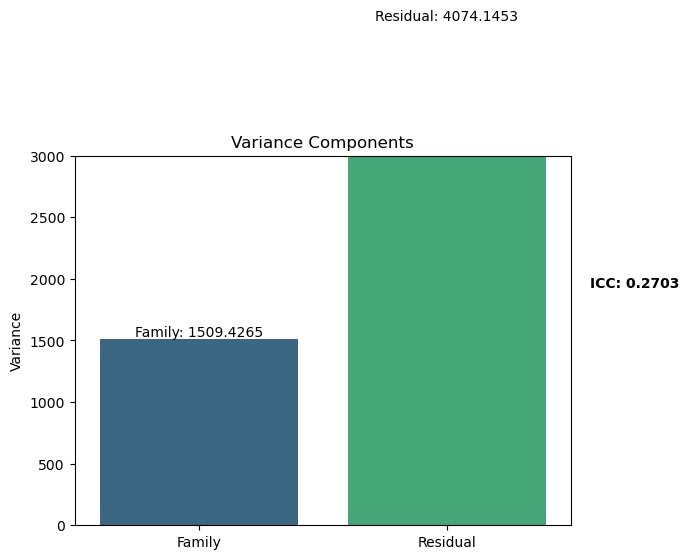

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 15   40.54054054054054 %


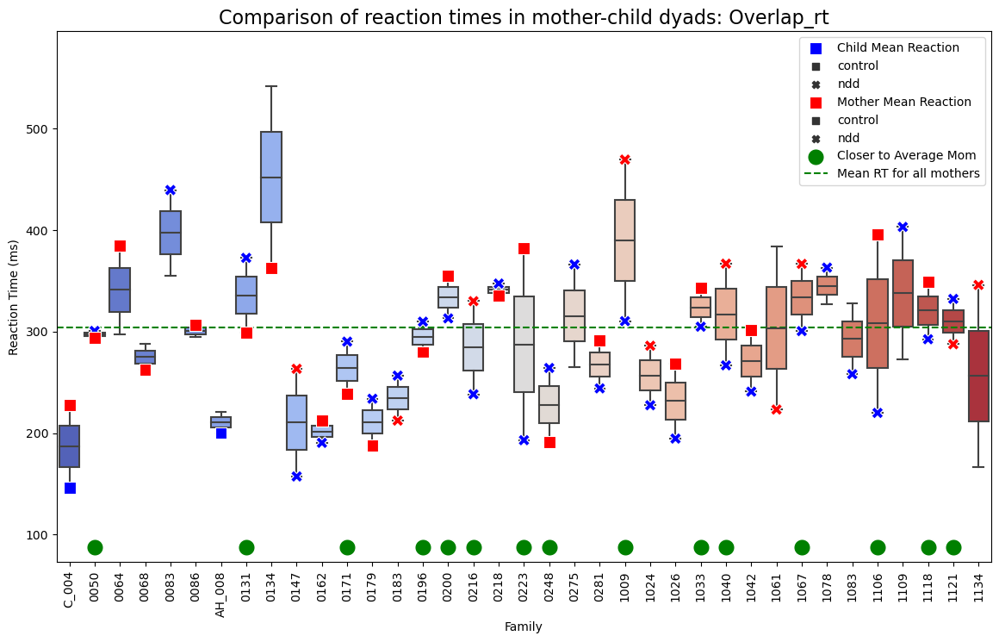

C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:201: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_mother["mother_rt"] = go_dis_family_mother[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


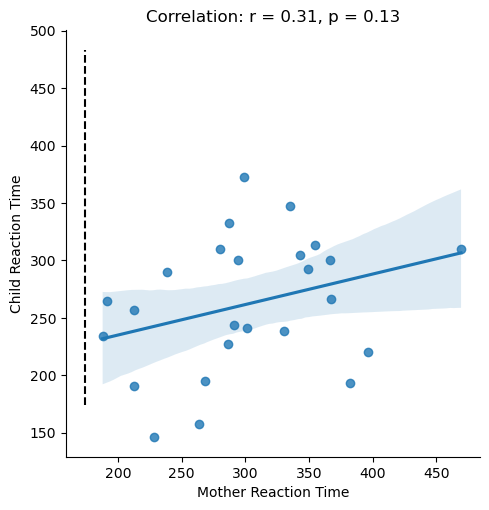

Intraclass Correlation Coefficient (ICC) for overall_rt: 0.185
Likelihood Ratio Test Statistic: 22.9587
P-value: 0.0000
overall_rt
The mixed model is significantly better. Retain family random effect.
family variance 914.7829843744065
residual variance 3016.660049526428
ICC FINAL overall_rt: 0.2327


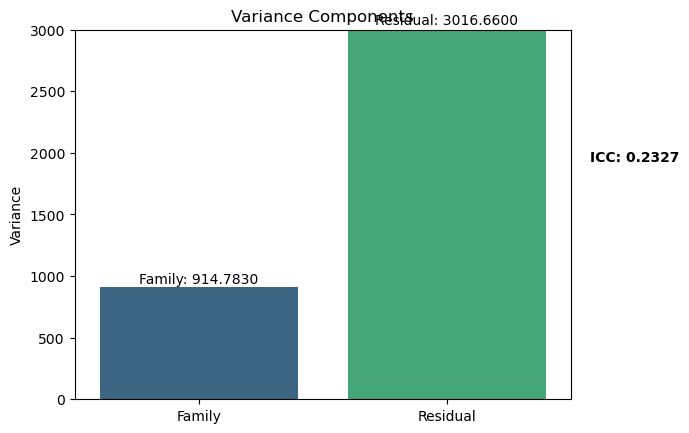

Total number of families 37
Total number of families where child's reaction time is closer to the random mother’s average 15   40.54054054054054 %


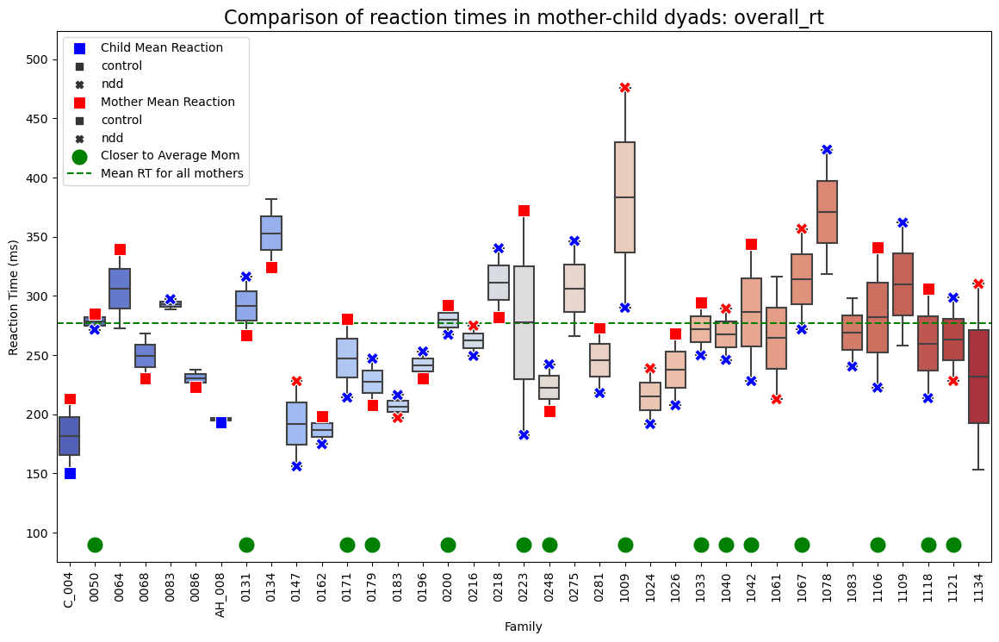

C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:201: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_mother["mother_rt"] = go_dis_family_mother[variable]
C:\Users\gabot\AppData\Local\Temp\ipykernel_2752\408471229.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  go_dis_family_child["child_rt"] = go_dis_family_child[variable]


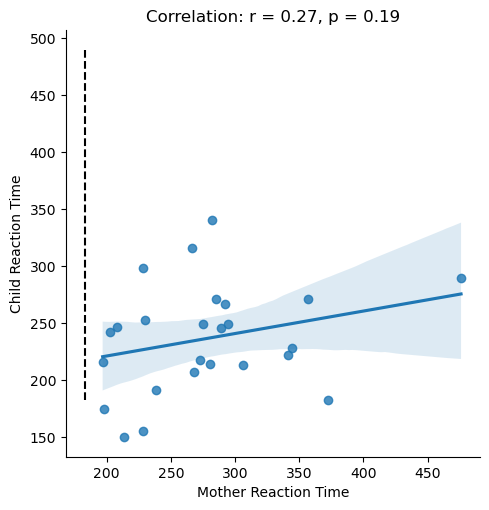

In [947]:
rt_variables = ["Gap","facilitation", "disengage", "Overlap_rt","overall_rt"]
for variable in rt_variables:


    # Fit a mixed-effects model with family as a random effect
    model = smf.mixedlm(f"{variable} ~ 1", go_dis_family, groups=go_dis_family["family_id"])
    result = model.fit()

    # Extract intraclass correlation manually
    icc = result.cov_re / (result.cov_re + result.scale)
    print(f"Intraclass Correlation Coefficient (ICC) for {variable}: {icc.Group.values.item():.3f}")

    # Add to the document
    doc.add_heading(f"Intraclass Correlation Coefficient (ICC) {variable}" , level=2)

    doc.add_paragraph(f"Intraclass Correlation Coefficient (ICC) for {variable}: {icc.Group.values.item():.4f}", style='List Bullet')

    # Mixed-effects model (random intercept for family)
    mixed_model = smf.mixedlm(f"{variable} ~ age + sex +ndd", go_dis_family, groups=go_dis_family["family_id"])
    mixed_result = mixed_model.fit()

    # Fixed-effects model (no family random effect)
    fixed_model = smf.ols(f"{variable} ~ age + sex + ndd", go_dis_family).fit()

    
    # Print summaries
   # print("Mixed-Effects Model Summary:")
    #print(mixed_result.summary())

    #print("\nFixed-Effects Model Summary:")
    #print(fixed_model.summary())

# Log-likelihoods for both models
    ll_mixed = mixed_result.llf  # Log-likelihood of mixed model
    ll_fixed = fixed_model.llf  # Log-likelihood of fixed model

    # Likelihood ratio test statistic
    lr_stat = 2 * (ll_mixed - ll_fixed)

    # Degrees of freedom (number of random effects added in mixed model)
    df_diff = 1

    # Calculate p-value
    p_value = chi2.sf(lr_stat, df_diff)

    print(f"Likelihood Ratio Test Statistic: {lr_stat:.4f}")
    print(f"P-value: {p_value:.4f}")

    if p_value < 0.05:
        print(variable)
        print("The mixed model is significantly better. Retain family random effect.")
        # Add to the document
        doc.add_heading('Likelihood Ratio Test', level=2)
        doc.add_paragraph(f"Likelihood Ratio Test Statistic {variable}: {lr_stat:.4f}", style='List Bullet')
        doc.add_paragraph(f"P-value: {p_value:.4f}", style='List Bullet')
        doc.add_paragraph("The mixed model is significantly better. Retain family random effect.", style='List Bullet')
    else:
        print(variable)
        print("No significant difference. Consider using the fixed-effects model.")
        # Add to the document
        doc.add_heading('Likelihood Ratio Test', level=2)
        doc.add_paragraph(f"Likelihood Ratio Test Statistic {variable}: {lr_stat:.4f}", style='List Bullet')
        doc.add_paragraph(f"P-value: {p_value:.4f}", style='List Bullet')
        doc.add_paragraph("No significant difference. Consider using the fixed-effects model.", style='List Bullet')
        # Extract variance components
    family_variance = mixed_result.cov_re.iloc[0, 0]  # Between-family variance
    residual_variance = mixed_result.scale            # Within-family variance

    # Compute ICC
    icc = family_variance / (family_variance + residual_variance)
    print("family variance", family_variance)
    print("residual variance", residual_variance)
    print(f"ICC FINAL {variable}: {icc:.4f}")
    # Plot the family variance and residual variance
    sns.barplot(x=["Family", "Residual"], y=[family_variance, residual_variance], palette="viridis")
    plt.ylabel("Variance")
    plt.title("Variance Components")

    # Add ICC values to the plot as subtitle
    plt.suptitle(f"ICC: {icc:.4f}", x=1, y=0.6, fontsize=10, fontweight="bold",ha= "center", va="bottom")

    # Write subtitle with ICC value

    # Add the variance valies to the plot
    plt.text(0, family_variance, f"Family: {family_variance:.4f}", ha="center", va="bottom", color="black")
    plt.text(1, residual_variance, f"Residual: {residual_variance:.4f}", ha="center", va="bottom", color="black")

    # Add ylimm 
    plt.ylim(0, 3000)
    # Add to the document
    doc.add_heading('Variance Components', level=2)


    # Save the plot
    plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/variance_components_{date}.png")

    # Add the figure to the document
    doc.add_heading('Variance Components figure', level=3)

    doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/variance_components_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))


    plt.show()
        
    # Step 1: Calculate the boxplot for each family
    # First, split the dataset by family_role (mother vs child)
    children_data = go_dis_family[go_dis_family['family_role'] == 'child']
    mothers_data = go_dis_family[go_dis_family['family_role'] == 'mother']

    # Step 2: Calculate the mean reaction time for children and mothers within families
    child_means = children_data.groupby('family_id')[variable].mean().reset_index()
    mother_means = mothers_data.groupby('family_id')[variable].mean().reset_index()

    # Merge ndd with the child_means and mother_means
    child_means = child_means.merge(children_data[['family_id', 'ndd']], on='family_id', how='left')
    mother_means = mother_means.merge(mothers_data[['family_id', 'ndd']], on='family_id', how='left')

    # Average for moms
    avg_mom_rt = mothers_data[variable].mean()

    # Step 4: Calculate absolute differences for each family
    child_means['diff_within'] = abs(child_means[variable] - child_means['family_id'].map(mother_means.set_index('family_id')[variable]))
    child_means['diff_random'] = abs(child_means[variable] - avg_mom_rt)


    # Step 5: Identify families where the child's reaction time is closer to the random mother’s
    highlight_families = child_means[child_means['diff_random'] < child_means['diff_within']]['family_id']

    # Sort dataframes by family_id order
    child_means['family_id'] = pd.Categorical(child_means['family_id'], categories=family_order, ordered=True)
    child_means = child_means.sort_values('family_id')

    mother_means['family_id'] = pd.Categorical(mother_means['family_id'], categories=family_order, ordered=True)
    mother_means = mother_means.sort_values('family_id')

    highlight_families = pd.Categorical(highlight_families, categories=family_order, ordered=True)
    highlight_families = highlight_families.sort_values()
    # Step 6: Create the plot
    plt.figure(figsize=(14, 8))

    # Plot the boxplot for each family, showing mother and child side by side
    sns.boxplot(x='family_id', y=variable, data=go_dis_family, showfliers=False, palette='coolwarm')

    # Overlay mean reaction times for children and random mothers
    sns.scatterplot(x='family_id', y=variable, color='blue', label='Child Mean Reaction',
                    s=100, zorder=5, style='ndd', data=child_means, markers=['s','X'])
    sns.scatterplot(x='family_id', y=variable, color='red', label='Mother Mean Reaction', data=mother_means,
                    s=100, zorder=5, style='ndd', markers=['s', "X"])

    # Add y limits based on reaction times for clarity. Make custome limits
    ymax= go_dis_family[variable].max() * 1.1

    if go_dis_family[variable].min() < 0:
        ymin= go_dis_family[variable].min() * 1.5
        closer_ymin= ymin - ymin*0.1

    else:
        ymin= go_dis_family[variable].min() * 0.5
        closer_ymin= ymin + ymin*0.2

    # Highlight families where child’s reaction time is closer to the random mother’s average
    sns.scatterplot(x=highlight_families, y=closer_ymin,
                    color='green', label='Closer to Average Mom', s=200, zorder=10, marker='o')

    # Plot the overall mean reaction time for context
    plt.axhline(y=mothers_data[variable].mean(), color='green', linestyle='--', label='Mean RT for all mothers')

    plt.ylim(ymin, ymax)

    # Add titles and labels
    plt.title(F'Comparison of reaction times in mother-child dyads: {variable}', fontsize=16)
    plt.xlabel('Family')
    plt.ylabel('Reaction Time (ms)')
    plt.xticks(rotation=90)

    print("Total number of families", len(go_dis_family.family_id.unique()))
    print("Total number of families where child's reaction time is closer to the random mother’s average", len(highlight_families), " ", len(highlight_families)/len(go_dis_family.family_id.unique())*100,"%")
    # Show legend for clarity
    plt.legend()

    # Add to the document
    doc.add_heading('Reaction Time Comparison in Mother-Child Dyads', level=2)

    # Add to the document
    doc.add_paragraph(f"Total number of families: {len(go_dis_family.family_id.unique())}", style='List Bullet')
    doc.add_paragraph(f"Total number of families where child's reaction time is closer to the random mother’s average: {len(highlight_families)} {len(highlight_families)/len(go_dis_family.family_id.unique())*100}%", style='List Bullet')
    # Save the plot
    plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_reaction_time_comparison_{date}.png")

    # Add the figure to the document
    doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_reaction_time_comparison_{date}.png", width=docx.shared.Inches(9), height=docx.shared.Inches(6))


    # Show the plot
    plt.show()

    # Calcualte correlation betwen child and mom's reaction times
    go_dis_family_mother=go_dis_family[go_dis_family.family_role=="mother"]
    go_dis_family_child=go_dis_family[go_dis_family.family_role=="child"]

    go_dis_family_mother["mother_rt"] = go_dis_family_mother[variable]
    go_dis_family_child["child_rt"] = go_dis_family_child[variable]

    # Merge the two dataframes
    go_dis_family_mother_child=pd.merge(go_dis_family_mother, go_dis_family_child, on="family_id", how="inner")


    # Calculate the correlation between mother and child reaction times
    r, p = stats.pearsonr(go_dis_family_mother_child["mother_rt"], go_dis_family_mother_child["child_rt"])
    r= round(r, 2)
    p= round(p, 2)

    # Plot the relationship between mother and child reaction times
    sns.lmplot(x="mother_rt", y="child_rt", data=go_dis_family_mother_child, palette="Sett1")


    plt.xlabel("Mother Reaction Time")
    plt.ylabel("Child Reaction Time")
    plt.title(f"Correlation: r = {r}, p = {p}")


    # Add diagonal line that represents perfect correlation (r = 1)
    xmin, xmax = plt.xlim()
    ymin, ymax = plt.ylim()
    plt.plot([xmin, xmin], [xmin, xmax], color="black", linestyle="--")



    # Add to the document
    doc.add_heading('Mother-Child Reaction Time Correlation', level=2)

    doc.add_paragraph(f"Correlation: r = {r}, p = {p.round(2)}", style='List Bullet')

    # Save the plot
    plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_rt_{date}.png")

    plt.show()  

    # Add the figure to the document
    doc.add_heading('Mother-Child Reaction Time Correlation figure', level=3)

    doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_rt_{date}.png", width=docx.shared.Inches(6), height=docx.shared.Inches(4))






In [ ]:
sns.reset_defaults()


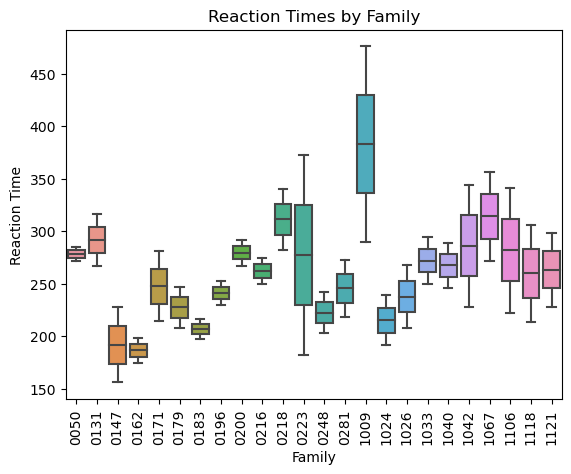

In [ ]:
# Assuming 'go_dis_family' is your dataset and 'family_id' represents the family group
sns.boxplot(x='family_id', y='overall_rt', data=go_dis_family)
plt.title('Reaction Times by Family')
plt.xlabel('Family')
plt.ylabel('Reaction Time')
plt.xticks(rotation=90)  # Rotate family labels if necessary
plt.show()

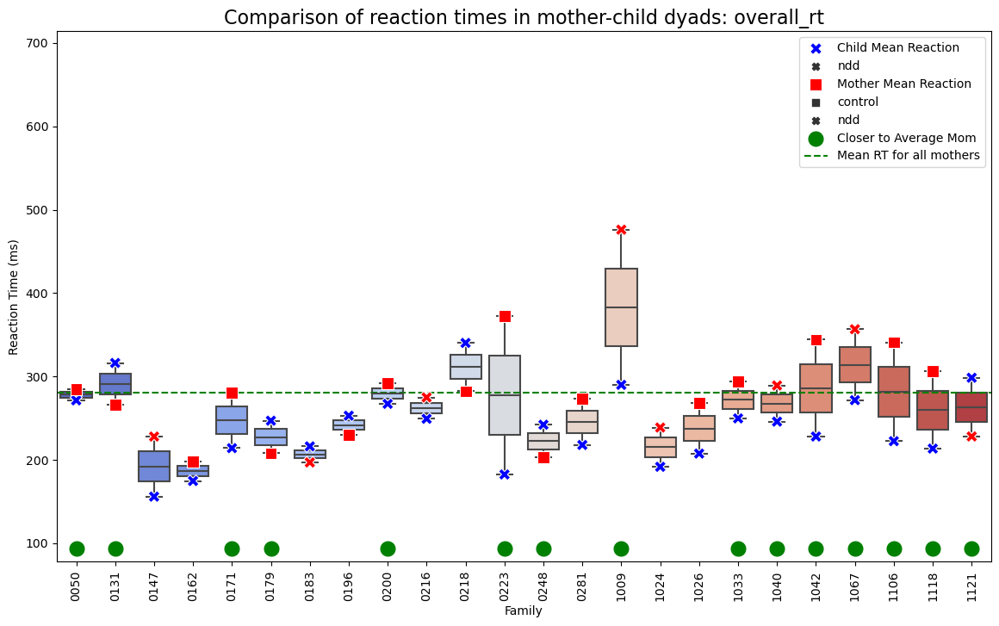

In [ ]:
# Variable to test
variable = 'overall_rt'

# Step 1: Calculate the boxplot for each family
# First, split the dataset by family_role (mother vs child)
children_data = go_dis_family[go_dis_family['family_role'] == 'child']
mothers_data = go_dis_family[go_dis_family['family_role'] == 'mother']

# Step 2: Calculate the mean reaction time for children and mothers within families
child_means = children_data.groupby('family_id')[variable].mean().reset_index()
mother_means = mothers_data.groupby('family_id')[variable].mean().reset_index()

# Merge ndd with the child_means and mother_means
child_means = child_means.merge(children_data[['family_id', 'ndd']], on='family_id', how='left')
mother_means = mother_means.merge(mothers_data[['family_id', 'ndd']], on='family_id', how='left')

# Average for moms
avg_mom_rt = mothers_data[variable].mean()

# Step 4: Calculate absolute differences for each family
child_means['diff_within'] = abs(child_means[variable] - child_means['family_id'].map(mother_means.set_index('family_id')[variable]))
child_means['diff_random'] = abs(child_means[variable] - avg_mom_rt)


# Step 5: Identify families where the child's reaction time is closer to the random mother’s
highlight_families = child_means[child_means['diff_random'] < child_means['diff_within']]['family_id']

# Step 6: Create the plot
plt.figure(figsize=(14, 8))

# Plot the boxplot for each family, showing mother and child side by side
sns.boxplot(x='family_id', y=variable, data=go_dis_family, showfliers=False, palette='coolwarm')

# Overlay mean reaction times for children and random mothers
sns.scatterplot(x='family_id', y=variable, color='blue', label='Child Mean Reaction',
                 s=100, zorder=5, style='ndd', data=child_means, markers=['X'])
sns.scatterplot(x='family_id', y=variable, color='red', label='Mother Mean Reaction', data=mother_means,
                 s=100, zorder=5, style='ndd', markers=['s', "X"])

# Add y limits based on reaction times for clarity. Make custome limits
ymax= go_dis_family[variable].max() * 1.5

if go_dis_family[variable].min() < 0:
    ymin= go_dis_family[variable].min() * 1.5
    closer_ymin= ymin - ymin*0.1

else:
    ymin= go_dis_family[variable].min() * 0.5
    closer_ymin= ymin + ymin*0.2

# Highlight families where child’s reaction time is closer to the random mother’s average
sns.scatterplot(x=highlight_families, y=closer_ymin,
                color='green', label='Closer to Average Mom', s=200, zorder=10, marker='o')

# Plot the overall mean reaction time for context
plt.axhline(y=mothers_data[variable].mean(), color='green', linestyle='--', label='Mean RT for all mothers')

plt.ylim(ymin, ymax)

# Add titles and labels
plt.title(F'Comparison of reaction times in mother-child dyads: {variable}', fontsize=16)
plt.xlabel('Family')
plt.ylabel('Reaction Time (ms)')
plt.xticks(rotation=90)

# Show legend for clarity
plt.legend()

# Add to the document
doc.add_heading('Reaction Time Comparison in Mother-Child Dyads', level=2)

# Save the plot
plt.savefig(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_reaction_time_comparison_{date}.png")

# Add the figure to the document
doc.add_picture(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/figures/mother_child_reaction_time_comparison_{date}.png", width=docx.shared.Inches(9), height=docx.shared.Inches(6))


# Show the plot
plt.show()


In [1]:
# Save the document

if outlier_rem:
    doc.save(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/automated/results-gap-{date}.docx")
else:
    doc.save(f"C:/Users/gabot/OneDrive - McGill University/Desktop/Q1K_neurosubs_2025/results/gap/automated/results-gap-{date}_{derivative}_no_outliers.docx")

NameError: name 'outlier_rem' is not defined

In [2077]:
# Define the mixed linear model formula
# Fixed effects: group, condition, trial_number, and their two-way interactions
# Random effect: intercept per participant
model_formula = "log_rt ~ group * condition + group * trial_number + condition * trial_number"

# Fit the model using statsmodels
# Random intercept by participant
mixed_lmm = smf.mixedlm(model_formula, data=df, groups=df["participant"], re_formula="~1")
mixed_lmm_fit = mixed_lmm.fit()

# Summary of the model
print(mixed_lmm_fit.summary())

KeyError: 'participant'

In [2076]:
mixed_lmm

NameError: name 'mixed_lmm' is not defined

In [ ]:

# Create a model
model = sm.OLS.from_formula("rt ~ C(condition, Treatment(reference='Baseline')) + C(ndd, Treatment(reference='control')) + age + site + sex", data=go_grouped)
result = model.fit()
result.summary()


In [658]:
# Function to calculate correlation matrix and p-values
def calculate_correlation_and_pvalues(dataframe):
    # Filter numeric columns
    numeric_df = dataframe.select_dtypes(include=[np.number])
    
    # Remove rows with NaN or infinite values
    numeric_df = numeric_df.replace([np.inf, -np.inf], np.nan).dropna()
    
    # Initialize matrices
    corr_matrix = numeric_df.corr()  # Pearson correlation matrix
    pval_matrix = pd.DataFrame(
        np.zeros(corr_matrix.shape), columns=numeric_df.columns, index=numeric_df.columns
    )
    
    # Calculate correlations and p-values
    for col in numeric_df.columns:
        for row in numeric_df.columns:
            if col != row:
                corr, pval = pearsonr(numeric_df[col], numeric_df[row])
                pval_matrix.loc[row, col] = pval
            else:
                pval_matrix.loc[row, col] = np.nan  # No p-value for self-correlation
    return corr_matrix, pval_matrix


In [659]:
### Correlation between variables
correlation_matrix, pvalue_matrix = calculate_correlation_and_pvalues(go_dis)


In [660]:
correlation_matrix

,Gap,Baseline,Overlap,baseline_gap,disensgage,gap_overlap,age
Gap,1.000000,0.773590,0.594302,-0.273858,0.008353,-0.162346,0.159392
Baseline,0.773590,1.000000,0.791827,0.397607,0.049372,0.281845,0.157940
Overlap,0.594302,0.791827,1.000000,0.341258,0.649095,0.697091,0.034408
baseline_gap,-0.273858,0.397607,0.341258,1.000000,0.062840,0.662838,0.008918
disensgage,0.008353,0.049372,0.649095,0.062840,1.000000,0.788936,-0.140452
gap_overlap,-0.162346,0.281845,0.697091,0.662838,0.788936,1.000000,-0.099883
age,0.159392,0.157940,0.034408,0.008918,-0.140452,-0.099883,1.000000


In [661]:
pvalue_matrix=pvalue_matrix[pvalue_matrix < 0.05]

C:\Users\gabot\AppData\Local\Temp\ipykernel_4452\4062766552.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(go_dis.corr(), annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)


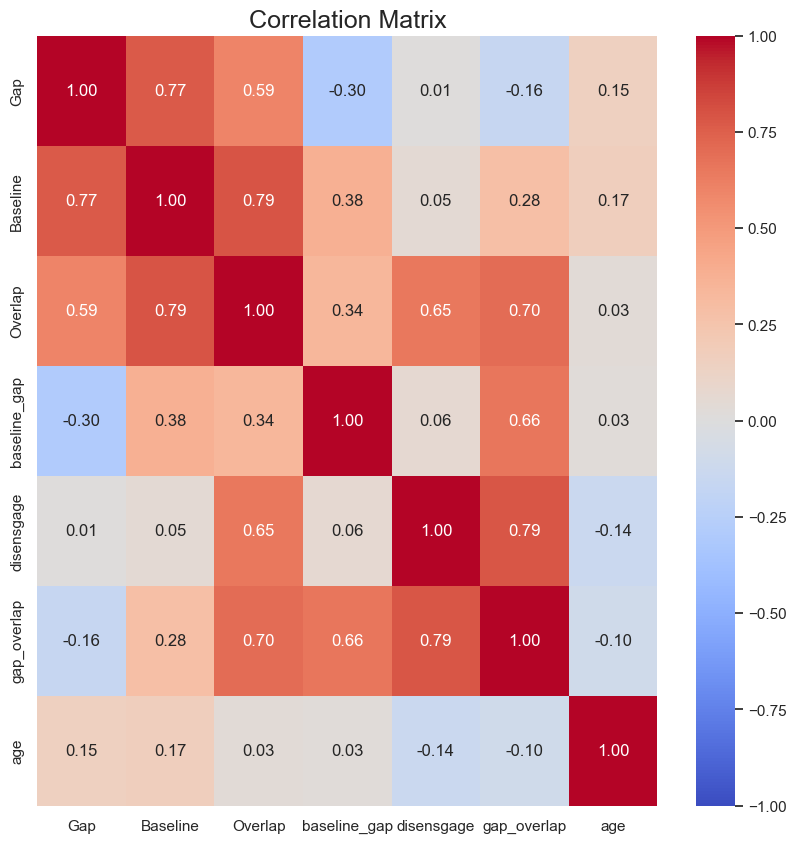

In [662]:
# Plot correlation matrix
sns.set_theme(style="white")
plt.figure(figsize=(10, 10))
sns.heatmap(go_dis.corr(), annot=True, cmap="coolwarm", fmt=".2f", vmin=-1, vmax=1)
plt.title("Correlation Matrix", fontsize=18)
plt.show()

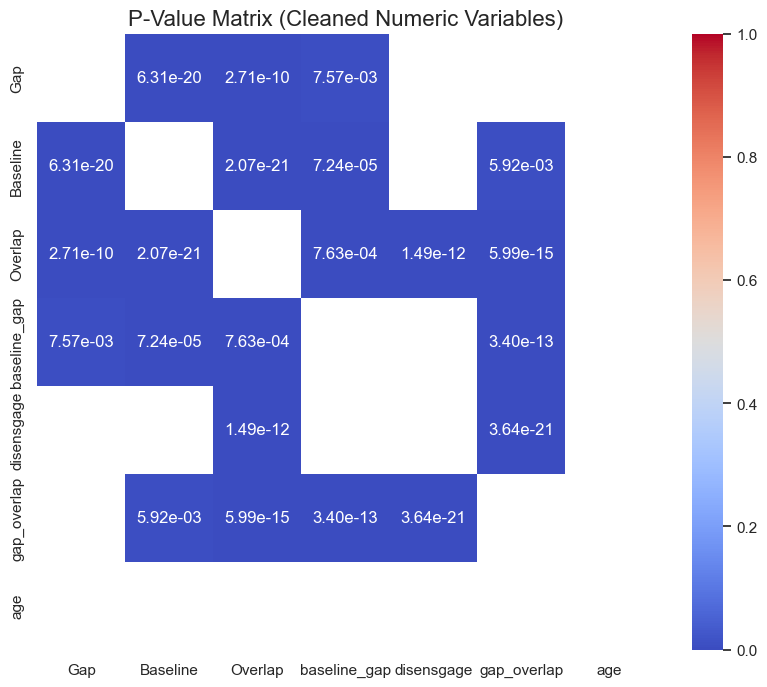

In [663]:
# Plot the p-value matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    pvalue_matrix,
    annot=True,
    fmt=".2e",  # Scientific notation for p-values
    cmap="coolwarm",
    cbar=True,
    square=True,
    vmin=0,
    vmax=1,
)
plt.title("P-Value Matrix (Cleaned Numeric Variables)", fontsize=16)
plt.show()

In [2063]:
go_grouped

,subject,condition,log_rt,age,group,site,sex,ndd,q1k_ID,age_group
0,002Z,Gap,5.338399,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
1,002Z,Baseline,5.584313,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
2,002Z,Overlap,5.752221,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
3,0042P,Gap,5.437029,30.973942,proband,mni,female,ndd,Q1K_MHC_20042_P,adult
4,0042P,Baseline,5.717505,30.973942,proband,mni,female,ndd,Q1K_MHC_20042_P,adult
...,...,...,...,...,...,...,...,...,...,...
277,1026P,Baseline,5.339557,15.198122,proband,hsj,male,ndd,Q1K_HSJ_1525-1026_P,child
278,1026P,Overlap,5.271139,15.198122,proband,hsj,male,ndd,Q1K_HSJ_1525-1026_P,child
279,1037F1,Gap,5.813759,31.239405,father,hsj,male,control,Q1K_HSJ_1525-1037_F1,adult
280,1037F1,Baseline,5.958461,31.239405,father,hsj,male,control,Q1K_HSJ_1525-1037_F1,adult


Text(0.5, 0, 'Type of effect')

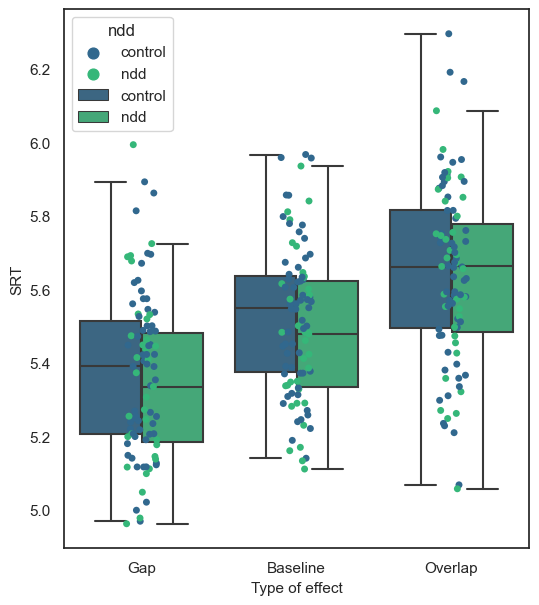

In [2064]:
ax = plt.figure(figsize=(6, 7))
ax = sns.stripplot(x="condition", y="log_rt", data=go_grouped , hue="ndd", palette="viridis")
ax = sns.boxplot(x="condition", y="log_rt", data=go_grouped, showfliers=False, hue="ndd", palette="viridis")
#plt.legend(handles=[ax])
plt.ylabel('SRT',fontsize=11)
plt.xlabel('Type of effect',fontsize=11)
# Create a single legend
#handles, labels = ax.get_legend_handles_labels()

#plt.legend(handles[2:], labels[2:], loc='upper right')  # Assuming 2 as the index to start from


In [2065]:
go_dis

,subject,Gap,Baseline,Overlap,facilitation,disengage,gap_overlap,total_trials,overall_rt,ndd,site,age,sex,age_group
0,002Z,5.338399,5.584313,5.752221,0.245914,0.167908,0.413822,35,266.250571,control,mni,45.880000,female,adult
1,0042P,5.437029,5.717505,5.755118,0.280476,0.037614,0.318089,35,292.678857,ndd,mni,30.973942,female,adult
2,0043F1,5.695441,5.798165,5.911835,0.102724,0.113670,0.216394,35,340.700571,control,hsj,58.133865,male,adult
3,0050M1,5.596039,5.626875,5.684424,0.030836,0.057549,0.088385,35,285.132857,control,hsj,37.095902,female,adult
4,0050P,5.533359,5.482190,5.706198,-0.051170,0.224008,0.172838,30,271.362333,ndd,hsj,8.071350,female,child
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,1024M1,5.138814,5.483200,5.656409,0.344386,0.173209,0.517595,35,238.751714,ndd,hsj,44.641460,female,adult
90,1024P,5.146063,5.134186,5.426991,-0.011876,0.292805,0.280928,27,191.651111,ndd,hsj,10.754499,female,child
91,1026M1,5.560951,5.493711,5.593539,-0.067240,0.099828,0.032588,26,267.918846,control,hsj,50.654018,female,adult
92,1026P,5.255495,5.339557,5.271139,0.084062,-0.068417,0.015645,33,207.523636,ndd,hsj,15.198122,male,child


In [ ]:
# Do glm to assess predictors of reaction time

# Create a model
model = sm.OLS.from_formula("disengage ~ ndd + age  + sex + Gap + Baseline", data=go_dis)
result = model.fit()
result.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             disensgage   R-squared:                       0.074
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     1.406
Date:                Mon, 13 Jan 2025   Prob (F-statistic):              0.230
Time:                        17:19:09   Log-Likelihood:                -489.07
No. Observations:                  94   AIC:                             990.1
Df Residuals:                      88   BIC:                             1005.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      46.4642     25.002      1.858      0.066      -3.223      96.151
ndd[T.ndd]      1.8339     10.725      0.171      0.865     -19.481      23.148
sex[T.male]   -22.0905     10.393     -2.125      0.036     -42.745      -1.436
age            -0.6143      0.349     -1.762      0.082      -1.307       0.079
Gap            -0.0555      0.137     -0.405      0.687      -0.328       0.217
Baseline        0.1107      0.131      0.844      0.401      -0.150       0.371
==============================================================================
Omnibus:                       32.550   Durbin-Watson:                   2.042
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               80.431
Skew:                           1.220   Prob(JB):                     3.43e-18
Kurtosis:                       6.819   Cond. No.                     1.93e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.93e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [667]:
go_grouped

,subject,condition,rt,log_rt,sqrt_rt,reciprocal_rt,age,group,site,sex,ndd,q1k_ID,age_group
0,002Z,Gap,213.916667,5.365587,14.625890,1.863256,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
1,002Z,Baseline,270.945000,5.601916,16.460407,1.878496,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
2,002Z,Overlap,318.220909,5.762746,17.838747,1.887885,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
3,0042P,Gap,241.000000,5.484797,15.524175,1.871169,30.973942,proband,mni,female,ndd,Q1K_MHC_20042_P,adult
4,0042P,Baseline,313.200000,5.746842,17.697457,1.886989,30.973942,proband,mni,female,ndd,Q1K_MHC_20042_P,adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,1026P,Baseline,215.571667,5.373293,14.682359,1.863782,15.198122,proband,hsj,male,ndd,Q1K_HSJ_1525-1026_P,child
284,1026P,Overlap,199.642000,5.296526,14.129473,1.858452,15.198122,proband,hsj,male,ndd,Q1K_HSJ_1525-1026_P,child
285,1037F1,Gap,347.583333,5.851004,18.643587,1.892725,31.239405,father,hsj,male,control,Q1K_HSJ_1525-1037_F1,adult
286,1037F1,Baseline,414.594545,6.027301,20.361595,1.901776,31.239405,father,hsj,male,control,Q1K_HSJ_1525-1037_F1,adult


In [668]:

# Create a model
model = sm.OLS.from_formula("rt ~ C(condition, Treatment(reference='Baseline')) + C(ndd, Treatment(reference='control')) + age + site + sex", data=go_grouped)
result = model.fit()
result.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     rt   R-squared:                       0.200
Model:                            OLS   Adj. R-squared:                  0.183
Method:                 Least Squares   F-statistic:                     11.66
Date:                Mon, 13 Jan 2025   Prob (F-statistic):           1.18e-11
Time:                        17:19:26   Log-Likelihood:                -1586.1
No. Observations:                 286   AIC:                             3186.
Df Residuals:                     279   BIC:                             3212.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
============================================================================================================================
                                                               coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
Intercept                                                  269.0149     13.652     19.705      0.000     242.141     295.889
C(condition, Treatment(reference='Baseline'))[T.Gap]       -32.8892      9.058     -3.631      0.000     -50.719     -15.059
C(condition, Treatment(reference='Baseline'))[T.Overlap]    37.7303      9.106      4.143      0.000      19.804      55.656
C(ndd, Treatment(reference='control'))[T.ndd]               -7.2903      8.608     -0.847      0.398     -24.236       9.655
site[T.mni]                                                -20.3755      7.928     -2.570      0.011     -35.981      -4.770
sex[T.male]                                                  1.3896      8.318      0.167      0.867     -14.984      17.764
age                                                          0.2900      0.278      1.044      0.297      -0.257       0.837
==============================================================================
Omnibus:                       26.597   Durbin-Watson:                   1.094
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               33.483
Skew:                           0.687   Prob(JB):                     5.36e-08
Kurtosis:                       3.960   Cond. No.                         138.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [669]:
print(go_dis.shape)


(96, 14)


In [670]:
go_dis.reset_index(drop=True, inplace=True)


In [671]:
# Drop the "group" column 
go_dis = go_dis.drop(columns=["group"])

In [674]:
go_grouped

,subject,condition,rt,log_rt,sqrt_rt,reciprocal_rt,age,group,site,sex,ndd,q1k_ID,age_group
0,002Z,Gap,213.916667,5.365587,14.625890,1.863256,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
1,002Z,Baseline,270.945000,5.601916,16.460407,1.878496,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
2,002Z,Overlap,318.220909,5.762746,17.838747,1.887885,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
3,0042P,Gap,241.000000,5.484797,15.524175,1.871169,30.973942,proband,mni,female,ndd,Q1K_MHC_20042_P,adult
4,0042P,Baseline,313.200000,5.746842,17.697457,1.886989,30.973942,proband,mni,female,ndd,Q1K_MHC_20042_P,adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...
283,1026P,Baseline,215.571667,5.373293,14.682359,1.863782,15.198122,proband,hsj,male,ndd,Q1K_HSJ_1525-1026_P,child
284,1026P,Overlap,199.642000,5.296526,14.129473,1.858452,15.198122,proband,hsj,male,ndd,Q1K_HSJ_1525-1026_P,child
285,1037F1,Gap,347.583333,5.851004,18.643587,1.892725,31.239405,father,hsj,male,control,Q1K_HSJ_1525-1037_F1,adult
286,1037F1,Baseline,414.594545,6.027301,20.361595,1.901776,31.239405,father,hsj,male,control,Q1K_HSJ_1525-1037_F1,adult


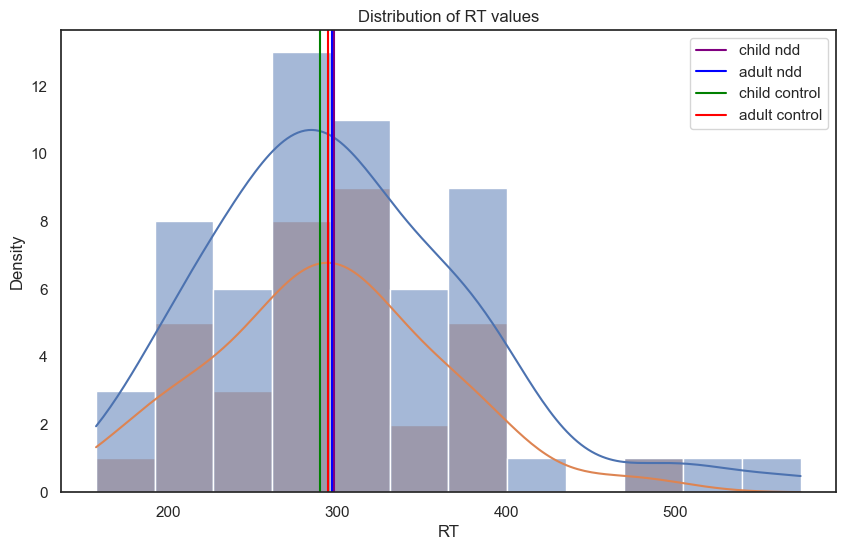

In [688]:
# Create the distribution plot

data_show=go_grouped[go_grouped.condition=="Overlap"]
plt.figure(figsize=(10, 6))
sns.histplot(data=data_show, x='rt', kde=True, color='blue', hue='ndd')


"""
for diagnosis in ['CHITO']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='red', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")

for diagnosis in ['KYLIE']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='black', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")

for diagnosis in ['RAFA']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='green', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")

for diagnosis in ['LEA']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='blue', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")
"""
# Line for overall NDD
#plt.axvline(data_show[data_show['ndd'] == 'ndd']['rt'].median(), color='orange', linestyle='-', label='ndd')

# Line for overall control
#plt.axvline(data_show[data_show['ndd'] == 'control']['rt'].median(), color='blue', linestyle='-', label='control')


# Line for child with NDD
plt.axvline(data_show[(data_show['ndd'] == 'ndd') & (data_show['age_group'] == 'child')]['rt'].median(), color='purple', linestyle='-', label='child ndd')

# Line for adult with NDD
plt.axvline(data_show[(data_show['ndd'] == 'ndd') & (data_show['age_group'] == 'adult')]['rt'].median(), color='blue', linestyle='-', label='adult ndd')

# Line for child with control
plt.axvline(data_show[(data_show['ndd'] == 'control') & (data_show['age_group'] == 'child')]['rt'].median(), color='green', linestyle='-', label='child control')

# Line for adult with control
plt.axvline(data_show[(data_show['ndd'] == 'control') & (data_show['age_group'] == 'adult')]['rt'].median(), color='red', linestyle='-', label='adult control')

# Add labels and legend
plt.xlabel('RT')
plt.ylabel('Density')
plt.title('Distribution of RT values')
plt.legend()
plt.show()

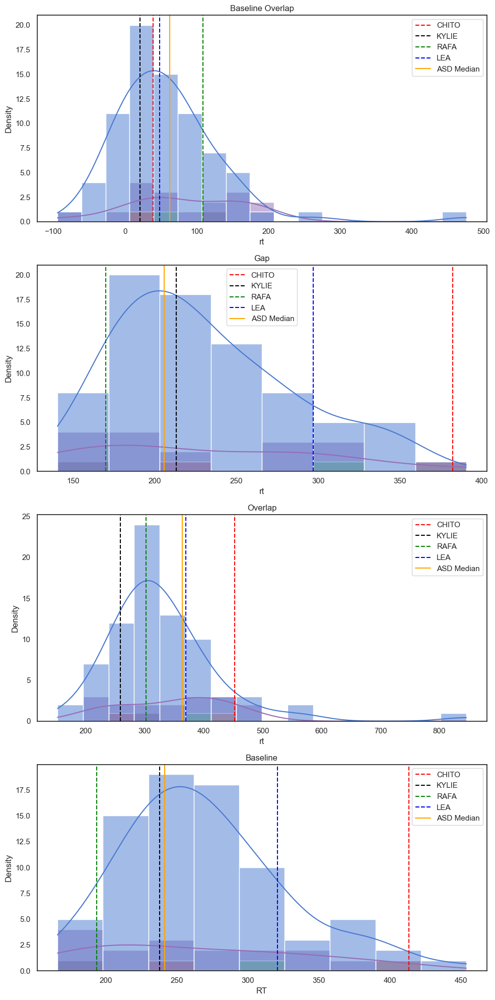

In [79]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define the conditions and colors for highlights
conditions = ['baseline_overlap', 'Gap', 'Overlap', 'Baseline']  # Replace with your condition names
titles = ['Baseline Overlap', 'Gap', 'Overlap', 'Baseline']   # Titles for subplots
highlight_colors = {'CHITO': 'red', 'KYLIE': 'black', 'RAFA': 'green', 'LEA': 'blue'}
asd_color = 'orange'

# Create subplots
fig, axes = plt.subplots(len(conditions), 1, figsize=(10, 20), sharex=False)

# Loop through conditions
for i, (condition, title) in enumerate(zip(conditions, titles)):
    # Filter data for the current condition
    data_show = test_df_melted[test_df_melted['condition'] == condition]

    # Plot distribution
    sns.histplot(data=data_show, x='rt', kde=True, hue='diagnosis', ax=axes[i], palette='muted')

    # Highlight specific diagnoses
    for diagnosis, color in highlight_colors.items():
        pt_data = data_show[data_show['diagnosis'] == diagnosis]
        for _, row in pt_data.iterrows():
            axes[i].axvline(row['rt'], color=color, linestyle='--', 
                            label=diagnosis if diagnosis not in axes[i].get_legend_handles_labels()[1] else "")

    # Highlight median for ASD
    asd_data = data_show[data_show['diagnosis'] == 'ASD']
    if not asd_data.empty:
        axes[i].axvline(asd_data['rt'].median(), color=asd_color, linestyle='-', label='ASD Median')

    # Set titles and labels
    axes[i].set_title(title)
    axes[i].set_ylabel('Density')
    axes[i].legend()

# Shared x-axis label
axes[-1].set_xlabel('RT')

# Adjust layout
plt.tight_layout()
plt.show()


In [685]:
ax = plt.figure(figsize=(6, 7))
ax = sns.stripplot(x="condition", y="rt", data=test_df_melted, hue="age")
ax = sns.boxplot(x="condition", y="rt", data=test_df_melted, showfliers=False, hue="age")
#plt.legend(handles=[ax])
plt.ylabel('SRT',fontsize=11)
plt.xlabel('Type of effect',fontsize=11)
# Create a single legend
#handles, labels = ax.get_legend_handles_labels()

#plt.legend(handles[2:], labels[2:], loc='upper right')  # Assuming 2 as the index to start from

NameError: name 'test_df_melted' is not defined

<Figure size 600x700 with 0 Axes>

## Children vs Adults

In [166]:
## Merge go dataset and demographics dataset

In [ ]:
go_df

### Accuracy 

In [551]:
go_df_c=go_df.loc[go_df.age_group=="child"]
go_df_a=go_df.loc[go_df.age_group=="adult"]


In [552]:
go_df

,subject,Trial_Index_,condition,detail,GO_SAC_RT,GO_VALID,age,group,site,sex,ndd,q1k_ID,age_group
0,002Z,1,Baseline,Right,230.31,True,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
1,002Z,2,Gap,Right,255.00,True,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
2,002Z,3,Overlap,Left,323.78,True,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
3,002Z,4,Gap,Right,197.00,True,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
4,002Z,5,Baseline,Left,372.62,True,45.880000,NaN,mni,female,control,Q1K_002_Z,adult
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3644,0068S3,42,Baseline,Left,1024.87,True,4.753007,sibling,mni,male,control,Q1K_MHC_20068_S3,child
3645,0068S3,43,Gap,Left,-1.00,True,4.753007,sibling,mni,male,control,Q1K_MHC_20068_S3,child
3646,0068S3,44,Gap,Left,994.00,True,4.753007,sibling,mni,male,control,Q1K_MHC_20068_S3,child
3647,0068S3,45,Baseline,Left,617.48,True,4.753007,sibling,mni,male,control,Q1K_MHC_20068_S3,child


In [ ]:
#### Particpant statistics for accuracy CHILDREN
valid_trials=go_df_c[go_df_c.GO_VALID==True].groupby(["subject","condition","age_group"])["GO_VALID"].count()
total_trials=go_df_c.groupby(["subject","condition","age_group"])["GO_VALID"].count()
acc_per_sub=valid_trials/total_trials

acc_per_sub_c=pd.DataFrame(acc_per_sub).reset_index().rename(columns={"GO_VALID":"perc_accuracy"})
acc_decriptive_stats_c=acc_per_sub_c.groupby(["condition"]).perc_accuracy.describe().reset_index()
acc_decriptive_stats_c

,condition,count,mean,std,min,25%,50%,75%,max
0,Baseline,32.0,0.911688,0.114652,0.583333,0.842949,0.966667,1.000000,1.0
1,Gap,32.0,0.857107,0.133272,0.428571,0.769231,0.886905,0.953125,1.0
2,Overlap,32.0,0.857355,0.134502,0.571429,0.750000,0.856410,1.000000,1.0


In [558]:
#### Particpant statistics for accuracy ADULTS
valid_trials=go_df_a[go_df_a.GO_VALID==True].groupby(["subject","condition","age_group"])["GO_VALID"].count()
total_trials=go_df_a.groupby(["subject","condition","age_group"])["GO_VALID"].count()
acc_per_sub=valid_trials/total_trials

acc_per_sub_a=pd.DataFrame(acc_per_sub).reset_index().rename(columns={"GO_VALID":"perc_accuracy"})
acc_decriptive_stats_a=acc_per_sub_a.groupby(["condition"]).perc_accuracy.describe().reset_index()
acc_decriptive_stats_a

,condition,count,mean,std,min,25%,50%,75%,max
0,Baseline,62.0,0.963916,0.061092,0.750000,0.916667,1.000000,1.0,1.0
1,Gap,62.0,0.921878,0.113903,0.466667,0.916667,0.928205,1.0,1.0
2,Overlap,61.0,0.951399,0.066361,0.750000,0.916667,1.000000,1.0,1.0


In [559]:
accuracy_all=pd.concat([acc_per_sub_a,acc_per_sub_c])

In [560]:
accuracy_all

,subject,condition,age_group,perc_accuracy
0,002Z,Baseline,child,NaN
1,002Z,Baseline,adult,1.000000
2,002Z,Gap,child,NaN
3,002Z,Gap,adult,1.000000
4,002Z,Overlap,child,NaN
...,...,...,...,...
187,1026P,Baseline,adult,NaN
188,1026P,Gap,child,0.916667
189,1026P,Gap,adult,NaN
190,1026P,Overlap,child,1.000000


In [ ]:
pg.friedman(data=accuracy_all, dv="perc_accuracy", within="condition", subject="subject").round(3)

,Source,W,ddof1,Q,p-unc
Friedman,condition,0.074,2,13.722,0.001


## Direct age comparions

In [ ]:
rt_decriptive_stats=accuracy_all.groupby(["condition","age_group"]).perc_accuracy.describe().reset_index()
rt_decriptive_stats.round(2)

,condition,age_group,count,mean,std,min,25%,50%,75%,max
0,Baseline,child,32.0,0.91,0.11,0.58,0.84,0.97,1.00,1.0
1,Baseline,adult,62.0,0.96,0.06,0.75,0.92,1.00,1.00,1.0
2,Gap,child,32.0,0.86,0.13,0.43,0.77,0.89,0.95,1.0
3,Gap,adult,62.0,0.92,0.11,0.47,0.92,0.93,1.00,1.0
4,Overlap,child,32.0,0.86,0.13,0.57,0.75,0.86,1.00,1.0
5,Overlap,adult,61.0,0.95,0.07,0.75,0.92,1.00,1.00,1.0


In [563]:
accuracy_all

,subject,condition,age_group,perc_accuracy
0,002Z,Baseline,child,NaN
1,002Z,Baseline,adult,1.000000
2,002Z,Gap,child,NaN
3,002Z,Gap,adult,1.000000
4,002Z,Overlap,child,NaN
...,...,...,...,...
187,1026P,Baseline,adult,NaN
188,1026P,Gap,child,0.916667
189,1026P,Gap,adult,NaN
190,1026P,Overlap,child,1.000000


In [ ]:
post_hocs = pg.pairwise_tests(dv='perc_accuracy', within=['condition'],between=["age_group"],
                               subject='subject', padjust='fdr_bh', data=accuracy_all)
post_hocs

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,condition,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,-,Baseline,Gap,True,True,3.562340,92.000000,two-sided,0.000585,0.001754,fdr_bh,37.244,0.399902
1,condition,-,Baseline,Overlap,True,True,2.716536,92.000000,two-sided,0.007881,0.011822,fdr_bh,3.616,0.274711
2,condition,-,Gap,Overlap,True,True,-1.073633,92.000000,two-sided,0.285795,0.285795,fdr_bh,0.2,-0.133430
3,age_group,-,child,adult,False,True,-3.903022,41.963355,two-sided,0.000338,NaN,NaN,130.429,-0.992452
4,condition * age_group,Baseline,child,adult,False,True,-2.375214,40.561463,two-sided,0.022351,0.022351,fdr_bh,2.576,-0.613605
5,condition * age_group,Gap,child,adult,False,True,-2.668168,50.095003,two-sided,0.010248,0.015372,fdr_bh,4.796,-0.629384
6,condition * age_group,Overlap,child,adult,False,True,-3.724638,39.093568,two-sided,0.000616,0.001849,fdr_bh,75.952,-0.979519


## Plotting differences

(0.7, 1.04)

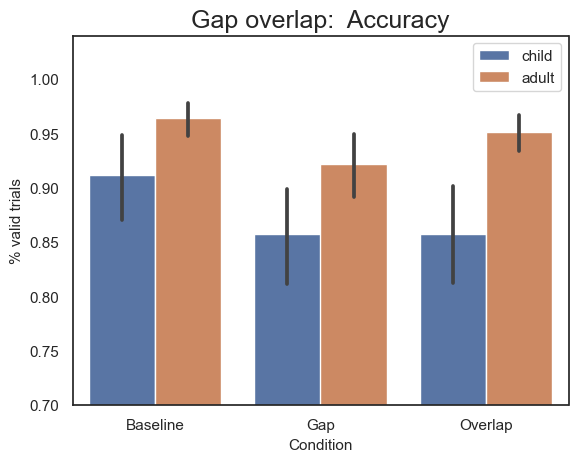

In [ ]:
sns.barplot(x="condition", y="perc_accuracy", data=accuracy_all, hue="age_group",
        ).set_title('Gap overlap:  Accuracy',fontsize=18)

plt.grid(False)
plt.ylabel('% valid trials',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper right')

plt.ylim([0.7,1.04])

## Differences in reaction time CHILD vs ADULT

### CHILD 

### Anova to test differences 

In [ ]:
go_grouped_c=go_grouped.loc[go_grouped.age_group=="child"]
go_grouped_a=go_grouped.loc[go_grouped.age_group=="adult"]

#### Assumption of normality

In [ ]:
pg.normality(data=go_grouped_c, dv='log_rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.955629,0.207813,True
Baseline,0.971997,0.556258,True
Overlap,0.974897,0.643726,True


In [579]:
pg.normality(data=go_grouped_a, dv='log_rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.974752,0.229509,True
Baseline,0.989275,0.866187,True
Overlap,0.991523,0.949822,True


<Axes: xlabel='reciprocal_rt', ylabel='Count'>

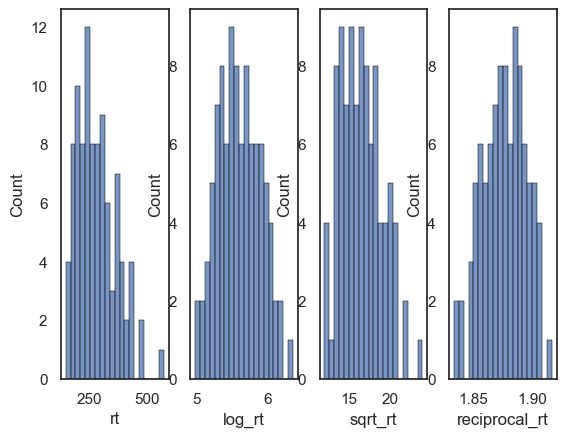

In [ ]:
fig, axs = plt.subplots(ncols=4)
sns.histplot(go_grouped_c.rt,edgecolor='black', bins=20, ax=axs[0])
sns.histplot(go_grouped_c.log_rt,edgecolor='black', bins=20, ax=axs[1])
sns.histplot(go_grouped_c.sqrt_rt,edgecolor='black', bins=20, ax=axs[2])
sns.histplot(go_grouped_c.reciprocal_rt,edgecolor='black', bins=20, ax=axs[3])


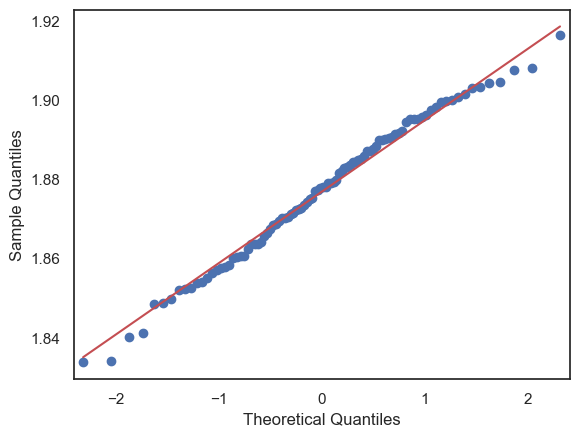

In [ ]:
fig = sm.qqplot(go_grouped_c.reciprocal_rt, line='s')

plt.show()

In [576]:
pg.normality(data=go_grouped_c, dv='reciprocal_rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.957297,0.231323,True
Baseline,0.977434,0.722292,True
Overlap,0.962257,0.316272,True


#### Assumption of sphericity (Mauchly’s test)

In [581]:
print(pg.sphericity(data=go_grouped_a, dv='log_rt', subject='subject', within='condition')[-1])

if pg.sphericity(data=go_grouped_a, dv='log_rt', subject='subject', within='condition')[-1] < 0.05:
    print("Assumption of sphericity is violated")

0.0005358173116688276
Assumption of sphericity is violated


In [ ]:
### Friedman Test (non-parametric)
pg.friedman(data=go_grouped_c, dv="rt", within="condition", subject="subject").round(3)


,Source,W,ddof1,Q,p-unc
Friedman,condition,0.546,2,34.938,0.0


In [584]:
sp.posthoc_conover_friedman(a=go_grouped_c, y_col="rt", group_col="condition", block_col="subject", 
                                 p_adjust="fdr_bh", melted=True).round(5)

,Gap,Baseline,Overlap
Gap,1.0000,0.00130,0.00000
Baseline,0.0013,1.00000,0.02066
Overlap,0.0000,0.02066,1.00000


In [586]:
post_hocs = pg.pairwise_tests(dv='rt', within=['condition'],
                               subject='subject', padjust='fdr_bh', data=go_grouped_c).round(4)
post_hocs

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,Baseline,Gap,True,True,5.6542,31.0,two-sided,0.0000,0.0000,fdr_bh,5815.844,0.6846
1,condition,Baseline,Overlap,True,True,-4.4548,31.0,two-sided,0.0001,0.0001,fdr_bh,251.967,-0.8081
2,condition,Gap,Overlap,True,True,-8.1088,31.0,two-sided,0.0000,0.0000,fdr_bh,3.304e+06,-1.4252


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


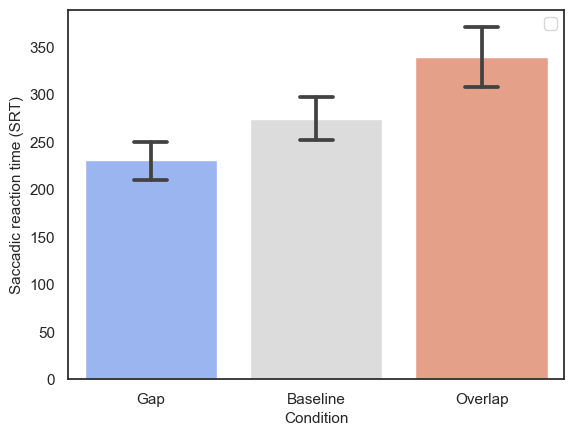

In [ ]:
sns.set_theme(style='white')
order = ["Gap", "Baseline","Overlap"]
ax=sns.barplot(x="condition", y="rt", data=go_grouped_c,order=order,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm").set_title("",fontsize=18)

plt.grid(False)
plt.ylabel('Saccadic reaction time (SRT)',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper right')




plt.show()


### ADULTS 

### Anova to test differences 

#### Assumption of normality

In [589]:
pg.normality(data=go_grouped_a, dv='rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.940691,0.004873,False
Baseline,0.961318,0.048281,False
Overlap,0.974737,0.237953,True


<Axes: xlabel='reciprocal_rt', ylabel='Count'>

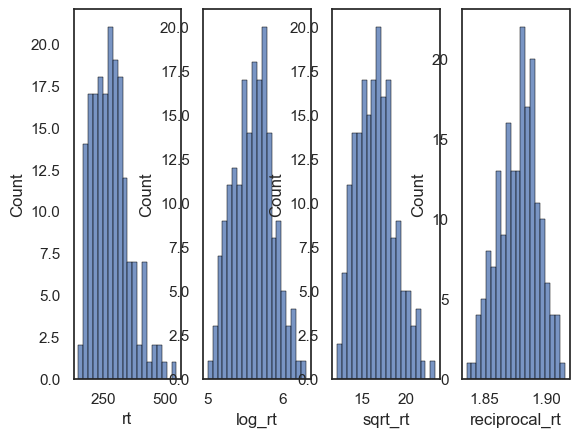

In [ ]:
fig, axs = plt.subplots(ncols=4)
sns.histplot(go_grouped_a.rt,edgecolor='black', bins=20, ax=axs[0])
sns.histplot(go_grouped_a.log_rt,edgecolor='black', bins=20, ax=axs[1])
sns.histplot(go_grouped_a.sqrt_rt,edgecolor='black', bins=20, ax=axs[2])
sns.histplot(go_grouped_a.reciprocal_rt,edgecolor='black', bins=20, ax=axs[3])


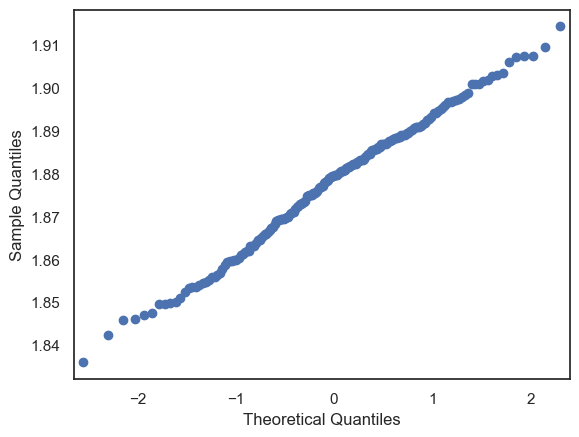

In [ ]:
fig = sm.qqplot(go_grouped_a.reciprocal_rt, line='s')

plt.show()

In [ ]:
pg.normality(data=go_grouped_a, dv='reciprocal_rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.982192,0.505373,True
Baseline,0.990617,0.918822,True
Overlap,0.983283,0.570632,True


#### Assumption of sphericity (Mauchly’s test)

In [594]:
print(pg.sphericity(data=go_grouped_a, dv='reciprocal_rt', subject='subject', within='condition')[-1])

if pg.sphericity(data=go_grouped_a, dv='reciprocal_rt', subject='subject', within='condition')[-1] < 0.05:
    print("Assumption of sphericity is violated")

1.0


c:\Users\gabot\anaconda3\lib\site-packages\pingouin\distribution.py:1006: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d
c:\Users\gabot\anaconda3\lib\site-packages\pingouin\distribution.py:1006: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d


In [ ]:
### Friedman Test (non-parametric)
pg.friedman(data=go_grouped_a, dv="rt", within="condition", subject="subject").round(3)


,Source,W,ddof1,Q,p-unc
Friedman,condition,0.608,2,74.197,0.0


In [596]:
sp.posthoc_conover_friedman(a=go_grouped_a, y_col="rt", group_col="condition", block_col="subject", 
                                 p_adjust="fdr_bh", melted=True)

,Gap,Baseline,Overlap
Gap,1.000000e+00,0.000073,3.864619e-14
Baseline,7.348369e-05,1.000000,1.198367e-05
Overlap,3.864619e-14,0.000012,1.000000e+00


In [ ]:
post_hocs = pg.pairwise_tests(dv='rt', within=['condition'],
                               subject='subject', padjust='fdr_bh', data=go_grouped_a).round(5)
post_hocs

,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,Baseline,Gap,True,True,6.55419,60.0,two-sided,0.0,0.0,fdr_bh,8.684e+05,0.62133
1,condition,Baseline,Overlap,True,True,-7.80164,60.0,two-sided,0.0,0.0,fdr_bh,9.316e+07,-0.86813
2,condition,Gap,Overlap,True,True,-10.30732,60.0,two-sided,0.0,0.0,fdr_bh,1.04e+12,-1.40825


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


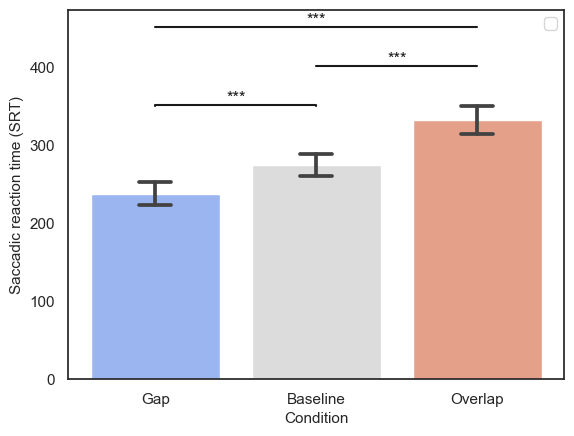

In [ ]:
sns.set_theme(style='white')
order = ["Gap", "Baseline","Overlap"]
ax=sns.barplot(x="condition", y="rt", data=go_grouped_a,order=order,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm").set_title("",fontsize=18)

plt.grid(False)
plt.ylabel('Saccadic reaction time (SRT)',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper right')

x1, x2 = 0,2 
y, h, col = 450 + 0.5, 0.2, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "***", ha='center', va='bottom', color=col)

x3, x2 = 0,1 
y, h, col = 350 + 0.5, 0.2, 'k'

plt.plot([x3, x3, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x3+x2)*.5, y+h, "***", ha='center', va='bottom', color=col)

x3, x2 = 1,2
y, h, col = 400 + 0.5, 0.2, 'k'

plt.plot([x3, x3, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x3+x2)*.5, y+h, "***", ha='center', va='bottom', color=col)

plt.show()


## Comparisons children vs adults

### Descriptive stats

In [ ]:
rt_decriptive_stats=go_grouped.groupby(["condition","age_group"]).rt.describe().reset_index()
rt_decriptive_stats.round(2)

,condition,age_group,count,mean,std,min,25%,50%,75%,max
0,Gap,child,32.0,230.52,58.43,144.73,186.04,213.02,274.17,338.78
1,Gap,adult,62.0,237.42,56.79,148.75,192.80,229.71,269.82,390.64
2,Baseline,child,32.0,274.46,68.01,176.96,229.61,256.06,303.49,438.50
3,Baseline,adult,62.0,274.24,56.69,180.07,231.90,272.73,311.45,453.79
4,Overlap,child,32.0,339.38,89.29,195.81,265.56,335.70,396.63,574.07
5,Overlap,adult,61.0,331.98,74.10,187.76,289.22,321.86,376.43,546.57


### Anova to test differences 

#### Assumption of normality

In [ ]:
pg.normality(data=go_grouped, dv='rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.951693,0.001617,False
Baseline,0.958020,0.004217,False
Overlap,0.979196,0.144160,True


<Axes: xlabel='reciprocal_rt', ylabel='Count'>

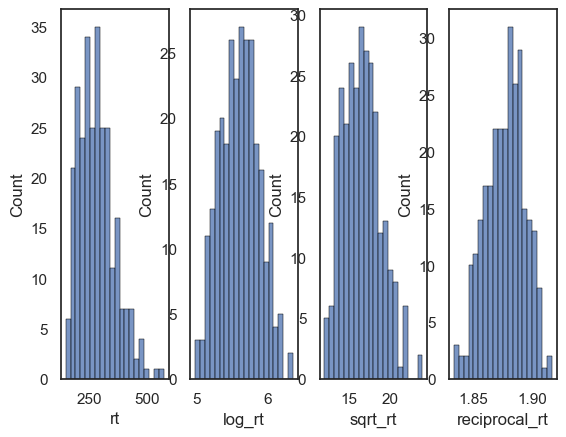

In [ ]:
fig, axs = plt.subplots(ncols=4)
sns.histplot(go_grouped.rt,edgecolor='black', bins=20, ax=axs[0])
sns.histplot(go_grouped.log_rt,edgecolor='black', bins=20, ax=axs[1])
sns.histplot(go_grouped.sqrt_rt,edgecolor='black', bins=20, ax=axs[2])
sns.histplot(go_grouped.reciprocal_rt,edgecolor='black', bins=20, ax=axs[3])


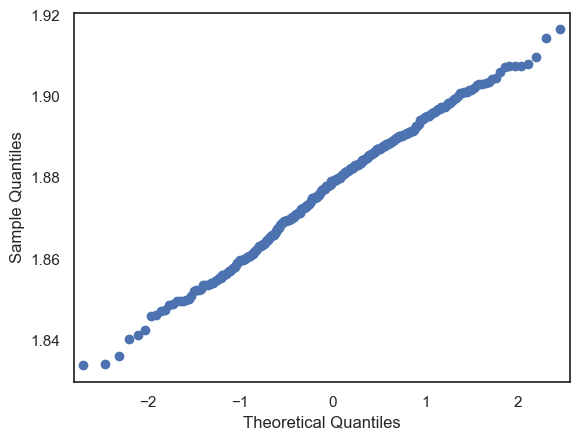

In [ ]:
fig = sm.qqplot(go_grouped.reciprocal_rt, line='s')

plt.show()

In [ ]:
pg.normality(data=go_grouped, dv='reciprocal_rt', group='condition')

,W,pval,normal
condition,,,
Gap,0.982215,0.231043,True
Baseline,0.990429,0.737112,True
Overlap,0.982751,0.258568,True


#### Assumption of sphericity (Mauchly’s test)

In [607]:
print(pg.sphericity(data=go_grouped, dv='log_rt', subject='subject', within='condition')[-1])

if pg.sphericity(data=go_grouped, dv='log_rt', subject='subject', within='condition')[-1] < 0.05:
    print("Assumption of sphericity is violated")

3.2646233896381876e-05
Assumption of sphericity is violated


In [612]:
#### One-way measures ANOVA
res = pg.mixed_anova(dv="log_rt", within="condition", between="age_group",
                  subject='subject', data=go_grouped).round(5)
res

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\parametric.py:1568: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)


,Source,SS,DF1,DF2,MS,F,p-unc,p-GG-corr,np2,eps,sphericity,W-spher,p-spher
0,age_group,0.00826,1,91,0.00826,0.07101,0.79047,NaN,0.00078,NaN,NaN,NaN,NaN
1,condition,5.70234,2,182,2.85117,132.50548,0.00000,0.0,0.59285,0.83118,False,0.7969,0.00003
2,Interaction,0.02897,2,182,0.01448,0.67313,0.51137,NaN,0.00734,NaN,NaN,NaN,NaN


In [614]:
post_hocs = pg.pairwise_tests(dv='reciprocal_rt', within=['condition'],between="age_group",
                               subject='subject', padjust='fdr_bh', data=go_grouped)
post_hocs.round(5)

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,condition,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,-,Baseline,Gap,True,True,9.17833,92.00000,two-sided,0.00000,0.00000,fdr_bh,5.665e+11,0.70153
1,condition,-,Baseline,Overlap,True,True,-9.18148,92.00000,two-sided,0.00000,0.00000,fdr_bh,5.749e+11,-0.84447
2,condition,-,Gap,Overlap,True,True,-13.52813,92.00000,two-sided,0.00000,0.00000,fdr_bh,3.125e+20,-1.46699
3,age_group,-,child,adult,False,True,-0.37630,55.28622,two-sided,0.70814,NaN,NaN,0.242,-0.08547
4,condition * age_group,Baseline,child,adult,False,True,-0.21335,54.81436,two-sided,0.83185,0.90213,fdr_bh,0.232,-0.04861
5,condition * age_group,Gap,child,adult,False,True,-0.80541,55.80889,two-sided,0.42400,0.90213,fdr_bh,0.302,-0.18230
6,condition * age_group,Overlap,child,adult,False,True,0.12355,53.81573,two-sided,0.90213,0.90213,fdr_bh,0.229,0.02835


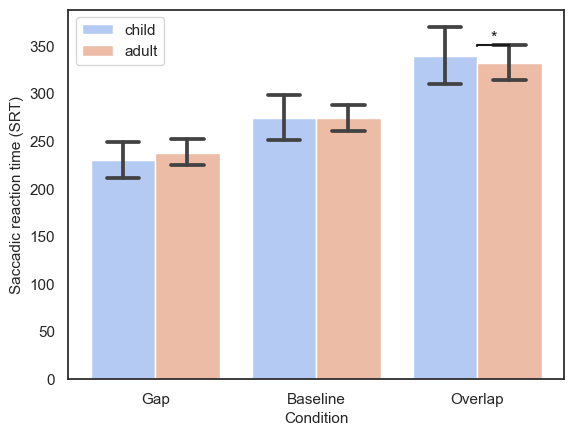

In [ ]:
sns.set_theme(style='white')
order = ["Gap", "Baseline","Overlap"]
ax=sns.barplot(x="condition", y="rt", hue="age_group", data=go_grouped,order=order,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm").set_title("",fontsize=18)

#ax = sns.stripplot(x="condition", y="rt", hue="age_group", data=go_grouped_all)

plt.grid(False)
plt.ylabel('Saccadic reaction time (SRT)',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper left')

x3, x2 = 2,2.2
y, h, col = 350 + 0.5, 0.2, 'k'

plt.plot([x3, x3, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x3+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)

plt.show()


## Disengagement effect (Gap-Overlap)

### Child

In [616]:
go_dis=go_grouped_c[["subject","condition", "rt", "age_group"]]

In [617]:
go_dis=go_dis.groupby(["subject","condition","age_group"]).mean().reset_index()

In [618]:
## Pivot the data to obtain columns with each condition
go_dis=go_dis.pivot(index=["subject","age_group"],columns="condition", values="rt")

In [619]:
go_dis["facilitation"]=go_dis["Baseline"]-go_dis["Gap"]

In [620]:
go_dis["baseline_overlap"]=go_dis["Baseline"]-go_dis["Overlap"]

In [621]:
go_dis["gap_overlap"]=go_dis["Overlap"]-go_dis["Gap"]

In [622]:
go_dis_c=go_dis.reset_index()

### Adult

In [623]:
go_dis=go_grouped_a[["subject","condition", "rt", "age_group"]]

In [624]:
go_dis=go_dis.groupby(["subject","condition","age_group"]).mean().reset_index()

In [625]:
## Pivot the data to obtain columns with each condition
go_dis=go_dis.pivot(index=["subject","age_group"],columns="condition", values="rt")

In [626]:
go_dis["facilitation"]=go_dis["Baseline"]-go_dis["Gap"]

In [627]:
go_dis["baseline_overlap"]=go_dis["Baseline"]-go_dis["Overlap"]

In [628]:
go_dis["gap_overlap"]=go_dis["Overlap"]-go_dis["Gap"]

In [629]:
go_dis_a=go_dis.reset_index()

In [630]:
# Merge datasets
go_dis_all=pd.concat([go_dis_c,go_dis_a])

In [631]:
#Melt all the dataframes

In [632]:
go_dis_melted=go_dis_all.melt(id_vars=["subject", "age_group"], value_vars=["facilitation",
                                                                        "baseline_overlap","gap_overlap"],value_name="diff")

In [633]:
go_dis_melted["descriptive_value"]=go_dis_melted["diff"]

### Descriptive stats

In [ ]:
rt_decriptive_stats=go_dis_melted.groupby(["condition","age_group"]).descriptive_value.describe().reset_index()
rt_decriptive_stats.round(2)

,condition,age_group,count,mean,std,min,25%,50%,75%,max
0,baseline_gap,child,32.0,43.94,43.96,-33.61,16.09,37.48,62.87,142.66
1,baseline_gap,adult,62.0,36.82,43.22,-68.11,9.12,39.63,62.02,183.38
2,baseline_overlap,child,32.0,-64.92,82.44,-266.31,-130.94,-37.29,-3.05,94.08
3,baseline_overlap,adult,61.0,-57.81,57.87,-203.84,-91.26,-57.76,-17.24,73.17
4,gap_overlap,child,32.0,108.86,75.94,-23.79,58.26,118.44,148.17,297.85
5,gap_overlap,adult,61.0,93.31,70.70,-52.53,42.64,85.56,122.94,277.94


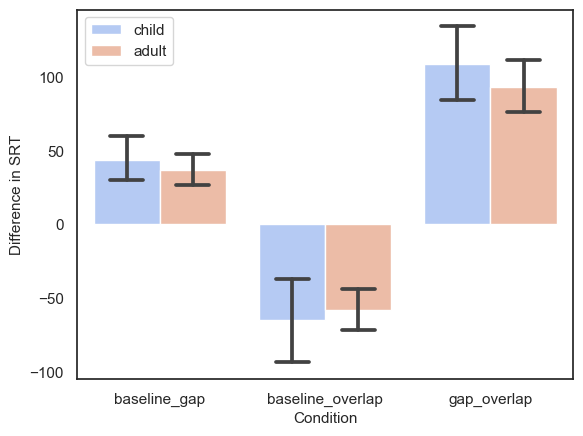

In [ ]:
sns.set_theme(style='white')
ax=sns.barplot(x="condition", y="diff", hue="age_group", data=go_dis_melted,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm").set_title("",fontsize=18)

plt.grid(False)
plt.ylabel('Difference in SRT',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper left')

plt.show()

In [637]:
post_hocs = pg.pairwise_tests(dv='diff', within=['condition'],between="age_group",
                               subject='subject', padjust='fdr_bh', data=go_dis_melted)
post_hocs.round(4)

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,condition,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,-,baseline_gap,baseline_overlap,True,True,13.1202,92.0000,two-sided,0.0000,0.0000,fdr_bh,5.029e+19,1.7479
1,condition,-,baseline_gap,gap_overlap,True,True,-8.6760,92.0000,two-sided,0.0000,0.0000,fdr_bh,5.36e+10,-1.0077
2,condition,-,baseline_overlap,gap_overlap,True,True,-11.5339,92.0000,two-sided,0.0000,0.0000,fdr_bh,3.557e+16,-2.2674
3,age_group,-,child,adult,False,True,0.8913,60.9923,two-sided,0.3763,NaN,NaN,0.322,0.1953
4,condition * age_group,baseline_gap,child,adult,False,True,0.8913,60.9923,two-sided,0.3763,0.5644,fdr_bh,0.322,0.1953
5,condition * age_group,baseline_overlap,child,adult,False,True,-0.4348,47.4629,two-sided,0.6657,0.6657,fdr_bh,0.247,-0.1048
6,condition * age_group,gap_overlap,child,adult,False,True,0.9605,59.2695,two-sided,0.3407,0.5644,fdr_bh,0.34,0.2126


C:\Users\gabot\AppData\Local\Temp\ipykernel_35260\135331556.py:8: UserWarning: Legend does not support handles for Axes instances.
A proxy artist may be used instead.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#controlling-the-legend-entries
  plt.legend(handles=[ax])


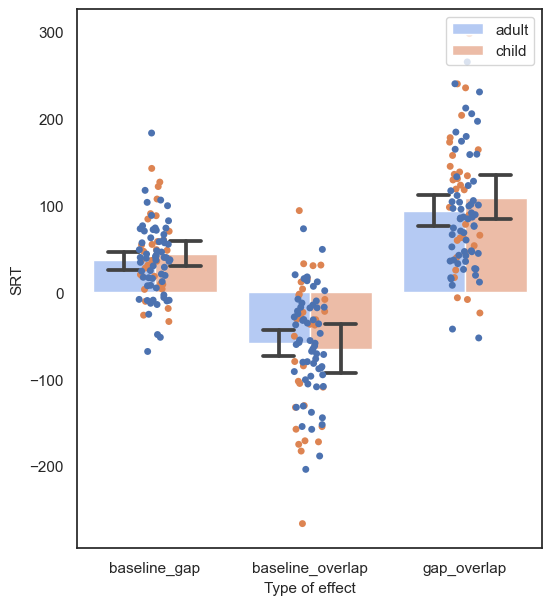

In [639]:
ax = plt.figure(figsize=(6, 7))
ax=sns.barplot(x="condition", y="diff", hue="age_group", data=go_dis_melted,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm", hue_order=["adult","child"]).set_title("",fontsize=18)

ax = sns.stripplot(x="condition", y="diff", hue="age_group",  hue_order=["adult","child"], data=go_dis_melted)


plt.legend(handles=[ax])

plt.ylabel('SRT',fontsize=11)
plt.xlabel('Type of effect',fontsize=11)
# Create a single legend
handles, labels = ax.get_legend_handles_labels()

plt.legend(handles[2:], labels[2:], loc='upper right')  # Assuming 2 as the index to start from


In [234]:
go_df_cluster=go_dis_all[["subject", "age_group", "baseline_overlap", "gap_overlap"]]

In [235]:
go_df_cluster.to_csv("go_df_cluster.csv", index=False)

In [236]:
go_df_cluster

condition,subject,age_g,baseline_overlap,gap_overlap
0,Q083_P,Child,-170.953333,297.853333
0,Q083_F1,Adult,-134.316667,134.526667
1,Q086M1,Adult,-138.166894,212.122727
2,Q086_S1,Adult,-86.929167,103.730000
3,QCOM_01,Adult,-5.440833,54.019167
4,QGAB_Pi,Adult,-60.114848,69.546667
5,q1k_p2,Adult,-40.330833,75.315000


In [237]:
go_dis_melted

,subject,age_g,condition,diff,descriptive_value
0,Q083_P,Child,baseline_gap,126.900000,126.900000
1,Q083_F1,Adult,baseline_gap,0.210000,0.210000
2,Q086M1,Adult,baseline_gap,73.955833,73.955833
3,Q086_S1,Adult,baseline_gap,16.800833,16.800833
4,QCOM_01,Adult,baseline_gap,48.578333,48.578333
5,QGAB_Pi,Adult,baseline_gap,9.431818,9.431818
6,q1k_p2,Adult,baseline_gap,34.984167,34.984167
7,Q083_P,Child,baseline_overlap,-170.953333,-170.953333
8,Q083_F1,Adult,baseline_overlap,-134.316667,-134.316667
9,Q086M1,Adult,baseline_overlap,-138.166894,-138.166894


In [ ]:
##

### NDD Differences

In [640]:
#### One-way measures ANOVA
res = pg.mixed_anova(dv="log_rt", within="condition", between="ndd",
                  subject='subject', data=go_grouped).round(5)
res

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\parametric.py:1568: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)


,Source,SS,DF1,DF2,MS,F,p-unc,p-GG-corr,np2,eps,sphericity,W-spher,p-spher
0,ndd,0.08218,1,91,0.08218,0.71119,0.40126,NaN,0.00775,NaN,NaN,NaN,NaN
1,condition,5.70234,2,182,2.85117,131.70215,0.00000,0.0,0.59138,0.83118,False,0.7969,0.00003
2,Interaction,0.00508,2,182,0.00254,0.11735,0.88934,NaN,0.00129,NaN,NaN,NaN,NaN


In [641]:
post_hocs = pg.pairwise_tests(dv='reciprocal_rt', within=['condition'],between="ndd",
                               subject='subject', padjust='fdr_bh', data=go_grouped)
post_hocs.round(5)

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,condition,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,-,Baseline,Gap,True,True,9.17833,92.00000,two-sided,0.00000,0.00000,fdr_bh,5.665e+11,0.70153
1,condition,-,Baseline,Overlap,True,True,-9.18148,92.00000,two-sided,0.00000,0.00000,fdr_bh,5.749e+11,-0.84447
2,condition,-,Gap,Overlap,True,True,-13.52813,92.00000,two-sided,0.00000,0.00000,fdr_bh,3.125e+20,-1.46699
3,ndd,-,control,ndd,False,True,0.86355,63.99860,two-sided,0.39106,NaN,NaN,0.313,0.18762
4,condition * ndd,Baseline,control,ndd,False,True,0.77131,61.83773,two-sided,0.44346,0.64247,fdr_bh,0.293,0.16956
5,condition * ndd,Gap,control,ndd,False,True,0.93746,62.78496,two-sided,0.35211,0.64247,fdr_bh,0.332,0.20502
6,condition * ndd,Overlap,control,ndd,False,True,0.46638,66.53031,two-sided,0.64247,0.64247,fdr_bh,0.249,0.09999


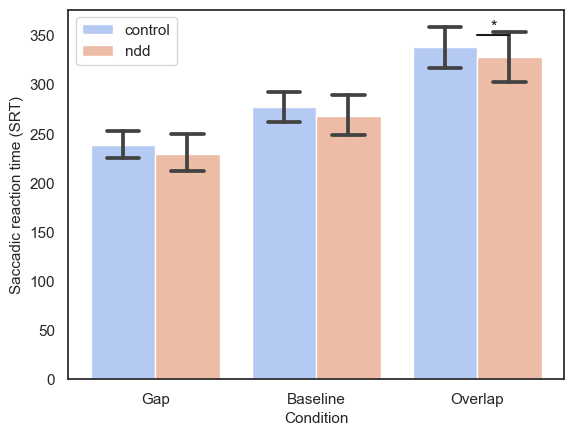

In [642]:
sns.set_theme(style='white')
order = ["Gap", "Baseline","Overlap"]
ax=sns.barplot(x="condition", y="rt", hue="ndd", data=go_grouped,order=order,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm").set_title("",fontsize=18)

#ax = sns.stripplot(x="condition", y="rt", hue="age_group", data=go_grouped_all)

plt.grid(False)
plt.ylabel('Saccadic reaction time (SRT)',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper left')

x3, x2 = 2,2.2
y, h, col = 350 + 0.5, 0.2, 'k'

plt.plot([x3, x3, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x3+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)

plt.show()


### NDD Differences in children

In [643]:
#### One-way measures ANOVA
res = pg.mixed_anova(dv="log_rt", within="condition", between="ndd",
                  subject='subject', data=go_grouped.loc[go_grouped.age_group=="child"]).round(5)
res

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\parametric.py:1568: FutureWarning: In a future version, object-dtype columns with all-bool values will not be included in reductions with bool_only=True. Explicitly cast to bool dtype instead.
  aov = pd.concat([aov_betw.drop(1), aov_with.drop(1)], axis=0, sort=False, ignore_index=True)


,Source,SS,DF1,DF2,MS,F,p-unc,p-GG-corr,np2,eps,sphericity,W-spher,p-spher
0,ndd,0.09641,1,30,0.09641,0.68387,0.41479,NaN,0.02229,NaN,NaN,NaN,NaN
1,condition,2.35806,2,60,1.17903,43.38508,0.00000,0.0,0.59120,0.80493,False,0.75765,0.01556
2,Interaction,0.02088,2,60,0.01044,0.38410,0.68273,NaN,0.01264,NaN,NaN,NaN,NaN


In [644]:
post_hocs = pg.pairwise_tests(dv='reciprocal_rt', within=['condition'],between="ndd",
                               subject='subject', padjust='fdr_bh', data=go_grouped.loc[go_grouped.age_group=="child"])
post_hocs.round(5)

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,condition,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,-,Baseline,Gap,True,True,6.03173,31.00000,two-sided,0.00000,0.00000,fdr_bh,1.576e+04,0.72154
1,condition,-,Baseline,Overlap,True,True,-4.65179,31.00000,two-sided,0.00006,0.00006,fdr_bh,418.759,-0.79245
2,condition,-,Gap,Overlap,True,True,-7.90477,31.00000,two-sided,0.00000,0.00000,fdr_bh,1.986e+06,-1.44241
3,ndd,-,control,ndd,False,True,0.82445,17.07191,two-sided,0.42105,NaN,NaN,0.458,0.30967
4,condition * ndd,Baseline,control,ndd,False,True,1.36579,20.57932,two-sided,0.18675,0.56025,fdr_bh,0.706,0.47562
5,condition * ndd,Gap,control,ndd,False,True,0.56725,17.34157,two-sided,0.57781,0.75325,fdr_bh,0.401,0.21166
6,condition * ndd,Overlap,control,ndd,False,True,0.31964,16.50859,two-sided,0.75325,0.75325,fdr_bh,0.369,0.12181


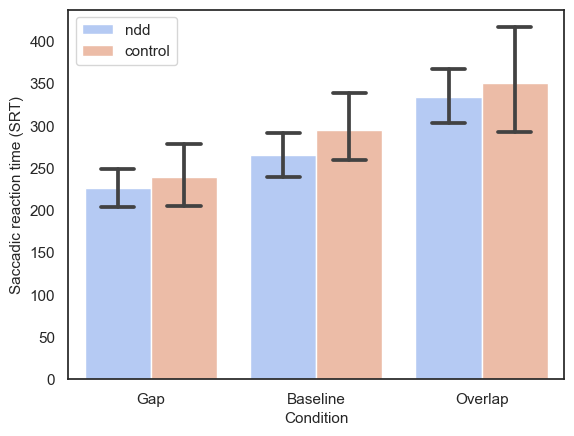

In [647]:
sns.set_theme(style='white')
order = ["Gap", "Baseline","Overlap"]
ax=sns.barplot(x="condition", y="rt", hue="ndd", data=go_grouped.loc[go_grouped.age_group=="child"],order=order,estimator=np.mean, ci=95, capsize=.2,
            palette="coolwarm").set_title("",fontsize=18)

#ax = sns.stripplot(x="condition", y="rt", hue="age_group", data=go_grouped_all)

plt.grid(False)
plt.ylabel('Saccadic reaction time (SRT)',fontsize=11)
plt.xlabel('Condition',fontsize=11)
plt.legend(loc='upper left')


plt.show()


In [650]:
go_grouped.loc[go_grouped.age_group=="child"].ndd.value_counts()/3

ndd        22.0
control    10.0
Name: ndd, dtype: float64

In [651]:
go_grouped.loc[go_grouped.age_group=="adult"].ndd.value_counts()/3

control    51.0
ndd        11.0
Name: ndd, dtype: float64

,subject,age_group,condition,diff,descriptive_value
0,0050P,child,baseline_gap,-33.613636,-33.613636
1,0050P,adult,baseline_gap,NaN,NaN
2,0064S1,child,baseline_gap,27.935889,27.935889
3,0064S1,adult,baseline_gap,NaN,NaN
4,0068S1,child,baseline_gap,9.080000,9.080000
...,...,...,...,...,...
559,1024M1,adult,gap_overlap,133.092500,133.092500
560,1026M1,child,gap_overlap,NaN,NaN
561,1026M1,adult,gap_overlap,-52.528889,-52.528889
562,1037F1,child,gap_overlap,NaN,NaN


# TEST-RETEST RELIABILITY

In [528]:
# Extract the eye-tracking files

In [529]:
go_secon_sesh_files = glob.glob('./eyelink_txt_files_2023/*/*_go_2*.txt')

In [530]:
go_secon_sesh_files

['./eyelink_txt_files_2023\\004_2\\004_go_2_GO_Q1K_ACAR_GO_pfp_v1.txt',
 './eyelink_txt_files_2023\\006_2\\006_go_2_GO_Q1K_ACAR_GO_pfp_v1.txt',
 './eyelink_txt_files_2023\\009_2\\009_go_2_GO_Q1K_ACAR_GO_pfp_v1.txt',
 './eyelink_txt_files_2023\\010_2\\010_go_2_GO_Q1K_ACAR_GO_pfp_v1.txt',
 './eyelink_txt_files_2023\\014_2\\014_go_2_GO_Q1K_ACAR_GO_pfp_v1.txt',
 './eyelink_txt_files_2023\\029_2\\029_go_2_GO_Q1K_ACAR_GO_pfp_v1.txt',
 './eyelink_txt_files_2023\\038_2\\038_go_2_GO_Q1K_ACAR_GO_pfp_v1.txt']

In [531]:
#How many test-retest do we have?
len(go_secon_sesh_files)

7

In [532]:
## Create dataframe with all files 
df = []
for file in go_secon_sesh_files:
    df.append(pd.read_csv(file, delimiter = "\t"))
go_df_sesh_2 = pd.concat(df, axis=0)

In [533]:
go_df_sesh_2=go_df_sesh_2.rename(columns={"position":"detail","Session_Name_": "subject"})

In [534]:
## Make all the subjetc names consistent in all files 
def transform_string(s):
    if '_' in s and "go" in s:
        return s[:3]
    elif "go" or "GO" in s and "_" not in s:
        return s[:3]
    else:
        return s

go_df_sesh_2['subject'] = go_df_sesh_2['subject'].str.replace('s', '0')
go_df_sesh_2['subject'] = go_df_sesh_2['subject'].apply(transform_string)


In [535]:
## Make all the subjetc names consistent in all files 
def transform_string(s):
    if '_' in s and "go" in s:
        return s[:3]
    elif "09" in s:
        return "009"
    else:
        return s
go_df_sesh_2['subject'] = go_df_sesh_2['subject'].apply(transform_string)


In [536]:
go_df_sesh_2.subject.unique()

array(['004', '006', '009', '010', '014', '029', '038'], dtype=object)

In [537]:
go_df_sesh_2

,subject,Trial_Index_,Trial_Recycled_,task,condition,detail,GO_JITTER,GO_SAC_RT,GO_VALID
0,004,1,False,GO,Baseline,Left,10,186.95,True
1,004,2,False,GO,Gap,Left,5,175.00,True
2,004,3,False,GO,Baseline,Right,101,186.08,True
3,004,4,False,GO,Overlap,Left,100,182.83,True
4,004,5,False,GO,Overlap,Left,96,188.22,True
...,...,...,...,...,...,...,...,...,...
34,038,35,False,GO,Baseline,Right,4,186.38,True
35,038,36,False,GO,Gap,Right,87,232.00,False
36,038,37,False,GO,Gap,Right,93,280.00,True
37,038,38,False,GO,Overlap,Right,18,147.62,True


In [538]:
## Keep valid trials and remove trails that were too slow or fast
go_df_sesh_2=go_df_sesh_2[go_df_sesh_2.GO_VALID] #Valid trials only
go_df_sesh_2=go_df_sesh_2.loc[(go_df_sesh_2.GO_SAC_RT>0) & (go_df_sesh_2.GO_SAC_RT<1000)] #Filter by RT

In [539]:
go_df_sesh_2["session"]=2

In [540]:
go_rt["session"]=1

In [541]:
go_rt

,subject,Trial_Index_,Trial_Recycled_,task,condition,detail,GO_JITTER,GO_SAC_RT,GO_VALID,session
0,002,1,False,GO,Baseline,Right,42,230.31,True,1
1,002,2,False,GO,Gap,Right,64,255.00,True,1
2,002,3,False,GO,Overlap,Left,72,323.78,True,1
3,002,4,False,GO,Gap,Right,29,197.00,True,1
4,002,5,False,GO,Baseline,Left,83,372.62,True,1
...,...,...,...,...,...,...,...,...,...,...
32,038,33,False,GO,Overlap,Right,2,192.14,True,1
33,038,34,False,GO,Gap,Left,53,362.00,True,1
34,038,35,False,GO,Gap,Left,78,256.00,True,1
35,038,36,False,GO,Gap,Right,46,224.00,True,1


In [542]:
# Merge datasets from both sessions

In [543]:
go_df_retest=pd.concat([go_rt,go_df_sesh_2])

In [544]:
go_df_retest

,subject,Trial_Index_,Trial_Recycled_,task,condition,detail,GO_JITTER,GO_SAC_RT,GO_VALID,session
0,002,1,False,GO,Baseline,Right,42,230.31,True,1
1,002,2,False,GO,Gap,Right,64,255.00,True,1
2,002,3,False,GO,Overlap,Left,72,323.78,True,1
3,002,4,False,GO,Gap,Right,29,197.00,True,1
4,002,5,False,GO,Baseline,Left,83,372.62,True,1
...,...,...,...,...,...,...,...,...,...,...
32,038,33,False,GO,Overlap,Right,101,573.89,True,2
34,038,35,False,GO,Baseline,Right,4,186.38,True,2
36,038,37,False,GO,Gap,Right,93,280.00,True,2
37,038,38,False,GO,Overlap,Right,18,147.62,True,2


In [545]:
#Identify subjects who did both 
valid_subjects=go_df_retest.groupby('subject')['session'].unique()
valid_subjects

subject
002       [1]
004    [1, 2]
006    [1, 2]
008       [1]
009    [1, 2]
010    [1, 2]
012       [1]
013       [1]
014    [1, 2]
015       [1]
017       [1]
018       [1]
020       [1]
023       [1]
024       [1]
026       [1]
027       [1]
028       [1]
029    [1, 2]
030       [1]
031       [1]
032       [1]
033       [1]
038    [1, 2]
Name: session, dtype: object

In [546]:
#Filter by subjects that did both
go_df_retest = go_df_retest[go_df_retest['subject'].isin(go_df_sesh_2.subject.unique())]

In [547]:
#Average values for each condition within subject
go_df_retest=go_df_retest.groupby(["subject","session","condition"]).mean().reset_index()

C:\Users\gabot\AppData\Local\Temp\ipykernel_15424\1274614499.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  go_df_retest=go_df_retest.groupby(["subject","session","condition"]).mean().reset_index()


In [548]:
#Keep only important columns
go_df_retest=go_df_retest[["subject","session","condition","GO_SAC_RT"]].rename(columns={"GO_SAC_RT":"SRT"})

In [549]:
#go_df_retest=go_df_retest.loc[go_df_retest.subject != "004"]

### Descriptive stats

In [651]:
rt_decriptive_stats=go_df_retest.groupby(["condition","session"]).SRT.describe().reset_index()
rt_decriptive_stats.round(2)

,condition,session,count,mean,std,min,25%,50%,75%,max
0,Baseline,1,7.0,235.68,52.37,166.02,200.84,246.38,256.79,322.10
1,Baseline,2,7.0,230.55,30.82,176.28,218.96,228.47,250.70,269.78
2,Gap,1,7.0,197.40,19.94,169.20,189.59,192.73,203.55,233.58
3,Gap,2,7.0,191.43,33.64,140.58,171.12,188.38,218.54,231.71
4,Overlap,1,7.0,287.36,120.65,151.79,207.92,235.90,370.02,467.94
5,Overlap,2,7.0,274.61,33.56,222.40,254.33,283.09,295.88,316.37


(150.0, 400.0)

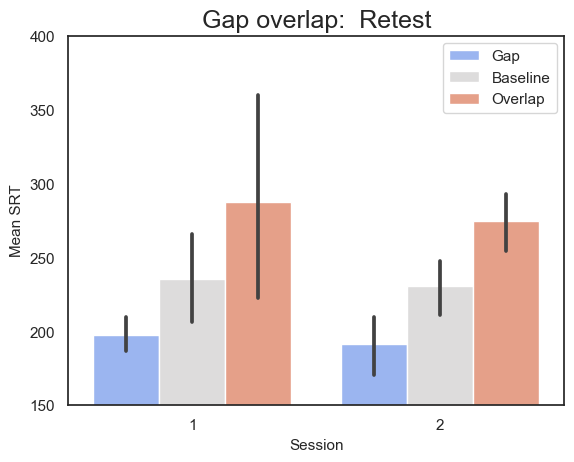

In [639]:
cond_order = ["Gap", "Baseline","Overlap"]
sns.barplot(x="session", y="SRT", data=go_df_retest,
            palette="coolwarm",ci=90,hue_order=cond_order, hue="condition").set_title('Gap overlap:  Retest',fontsize=18)

plt.grid(False)
plt.ylabel('Mean SRT',fontsize=11)
plt.xlabel('Session',fontsize=11)
plt.legend(loc='upper right')

plt.ylim([150,400])

In [551]:
go_wide_retest=go_df_retest.groupby(["subject","condition","session"]).mean().reset_index()

## Pivot the data to obtain columns with each condition
go_wide_retest=go_wide_retest.pivot(index=["subject","session"],columns="condition", values="SRT")

#Calculate the gap, overlap and gap-overlap effect. 
go_wide_retest["facilitation"]=go_wide_retest["Baseline"]-go_wide_retest["Gap"]
go_wide_retest["baseline_overlap"]=go_wide_retest["Baseline"]-go_wide_retest["Overlap"]
go_wide_retest["gap_overlap"]=go_wide_retest["Overlap"]-go_wide_retest["Gap"]

go_wide_retest=go_wide_retest.reset_index()


In [552]:
go_long_retest=go_wide_retest[["subject","session","facilitation","baseline_overlap","gap_overlap"]]

In [553]:
## Make into long once again
go_long_retest=go_long_retest.melt(id_vars=["subject","session"], value_name="effect")

In [554]:
go_long_retest

,subject,session,condition,effect
0,004,1,baseline_gap,-3.175000
1,004,2,baseline_gap,-12.090833
2,006,1,baseline_gap,88.515000
3,006,2,baseline_gap,-3.805833
4,009,1,baseline_gap,28.906515
5,009,2,baseline_gap,45.717500
6,010,1,baseline_gap,-9.129773
7,010,2,baseline_gap,115.039394
8,014,1,baseline_gap,74.106667
9,014,2,baseline_gap,65.806364


### Anova for test-retest reliability 

#### Assumption of normality

In [605]:
pg.normality(data=go_long_retest, dv='effect', group='session')

,W,pval,normal
session,,,
1,0.925403,0.111327,True
2,0.944499,0.267062,True


#### Assumption of sphericity (Mauchly’s test)

In [606]:
print(pg.sphericity(data=go_long_retest, dv='effect', subject='subject', within='session')[-1])

1.0


#### Repeated measures ANOVA


In [607]:
res = pg.rm_anova(dv="effect", within=["condition",'session'],
                  subject='subject', data=go_long_retest)


In [608]:
res

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,condition,130012.628191,2,12,65006.314096,9.797778,0.003001,0.019640,0.467316,0.508722
1,session,3.279342,1,6,3.279342,0.001152,0.974025,0.974025,0.000022,1.000000
2,condition * session,362.984964,2,12,181.492482,0.051436,0.950072,0.848308,0.002443,0.547696


### Post-hoc test

In [609]:
post_hocs = pg.pairwise_tests(dv='effect', within=["condition",'session'],
                               subject='subject', padjust='fdr_bh', data=go_long_retest)
post_hocs

C:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,condition,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,condition,-,baseline_gap,baseline_overlap,True,True,3.503998,6.0,two-sided,0.012764,0.031264,fdr_bh,5.564,2.050210
1,condition,-,baseline_gap,gap_overlap,True,True,-2.506629,6.0,two-sided,0.046113,0.046113,fdr_bh,2.107,-0.910462
2,condition,-,baseline_overlap,gap_overlap,True,True,-3.110225,6.0,two-sided,0.020843,0.031264,fdr_bh,3.825,-2.154395
3,session,-,1,2,True,True,-0.033941,6.0,two-sided,0.974025,NaN,NaN,0.353,-0.019379
4,condition * session,baseline_gap,1,2,True,True,-0.033941,6.0,two-sided,0.974025,0.974025,fdr_bh,0.353,-0.019379
5,condition * session,baseline_overlap,1,2,True,True,-0.256774,6.0,two-sided,0.805932,0.974025,fdr_bh,0.363,-0.111455
6,condition * session,gap_overlap,1,2,True,True,0.185167,6.0,two-sided,0.859199,0.974025,fdr_bh,0.358,0.078001


In [555]:
##Intra-calss correlation (just in case)

In [556]:
## Create ID's for each subject combination
go_long_retest["icc_id"]=pd.factorize(go_long_retest["subject"] + go_long_retest["condition"])[0]
icc = pg.intraclass_corr(data=go_long_retest, targets='icc_id', raters='session', ratings='effect')

,Type,Description,ICC,F,df1,df2,pval,CI95%
0,ICC1,Single raters absolute,0.586979,3.842373,20,21,0.001719,"[0.23, 0.81]"
1,ICC2,Single random raters,0.582675,3.659603,20,20,0.002767,"[0.2, 0.81]"
2,ICC3,Single fixed raters,0.570779,3.659603,20,20,0.002767,"[0.2, 0.8]"
3,ICC1k,Average raters absolute,0.739744,3.842373,20,21,0.001719,"[0.37, 0.89]"
4,ICC2k,Average random raters,0.736317,3.659603,20,20,0.002767,"[0.34, 0.89]"
5,ICC3k,Average fixed raters,0.726746,3.659603,20,20,0.002767,"[0.33, 0.89]"


In [557]:
pg.intraclass_corr(data=go_long_retest.loc[go_long_retest.condition=="facilitation"],
                         targets='subject', raters='session', ratings='effect')

,Type,Description,ICC,F,df1,df2,pval,CI95%
0,ICC1,Single raters absolute,-0.230394,0.625496,6,7,0.708002,"[-0.78, 0.56]"
1,ICC2,Single random raters,-0.370752,0.536242,6,6,0.766287,"[-1.13, 0.55]"
2,ICC3,Single fixed raters,-0.301878,0.536242,6,6,0.766287,"[-0.83, 0.51]"
3,ICC1k,Average raters absolute,-0.598731,0.625496,6,7,0.708002,"[-7.18, 0.72]"
4,ICC2k,Average random raters,-1.178397,0.536242,6,6,0.766287,"[17.95, 0.71]"
5,ICC3k,Average fixed raters,-0.864829,0.536242,6,6,0.766287,"[-9.85, 0.68]"


In [558]:
pg.intraclass_corr(data=go_long_retest.loc[go_long_retest.condition=="baseline_overlap"],
                         targets='subject', raters='session', ratings='effect')

,Type,Description,ICC,F,df1,df2,pval,CI95%
0,ICC1,Single raters absolute,0.313526,1.913441,6,7,0.207809,"[-0.46, 0.83]"
1,ICC2,Single random raters,0.275219,1.658115,6,6,0.277198,"[-0.7, 0.83]"
2,ICC3,Single fixed raters,0.247587,1.658115,6,6,0.277198,"[-0.56, 0.81]"
3,ICC1k,Average raters absolute,0.477381,1.913441,6,7,0.207809,"[-1.68, 0.91]"
4,ICC2k,Average random raters,0.431642,1.658115,6,6,0.277198,"[-4.64, 0.91]"
5,ICC3k,Average fixed raters,0.396905,1.658115,6,6,0.277198,"[-2.51, 0.9]"


In [559]:
pg.intraclass_corr(data=go_long_retest.loc[go_long_retest.condition=="gap_overlap"],
                         targets='subject', raters='session', ratings='effect')

,Type,Description,ICC,F,df1,df2,pval,CI95%
0,ICC1,Single raters absolute,0.357726,2.113935,6,7,0.175012,"[-0.42, 0.85]"
1,ICC2,Single random raters,0.322928,1.822299,6,6,0.241917,"[-0.66, 0.85]"
2,ICC3,Single fixed raters,0.291358,1.822299,6,6,0.241917,"[-0.52, 0.83]"
3,ICC1k,Average raters absolute,0.526949,2.113935,6,7,0.175012,"[-1.42, 0.92]"
4,ICC2k,Average random raters,0.488202,1.822299,6,6,0.241917,"[-3.88, 0.92]"
5,ICC3k,Average fixed raters,0.451243,1.822299,6,6,0.241917,"[-2.19, 0.91]"


Text(0.5, 32.99999999999997, 'Session')

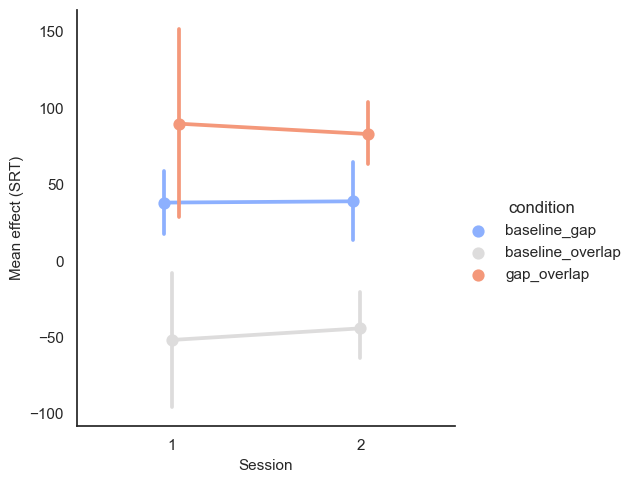

In [640]:
cond_order = ["baseline_overlap","gap_overlap","facilitation"]

sns.catplot(x="session", y="effect", data=go_long_retest, kind="point",
            palette="coolwarm",ci=90, hue="condition", dodge= True)
plt.ylabel('Mean effect (SRT)',fontsize=11)
plt.xlabel('Session',fontsize=11)

#plt.ylim([150,400])

Text(0.5, 32.99999999999997, 'Session')

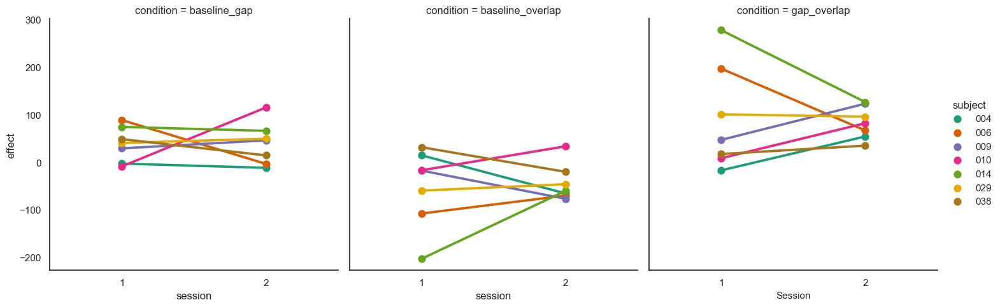

In [573]:
sns.catplot(x="session", y="effect",kind="point",col="condition",
            data=go_long_retest, palette="Dark2",ci=75, hue="subject")
plt.grid(False)
plt.ylabel('Mean SRT',fontsize=11)
plt.xlabel('Session',fontsize=11)


In [562]:
scatter_plot_df=go_long_retest.pivot(index=["subject","condition"],values=["effect"],columns="session").reset_index()

In [563]:
flat_cols = []
 # iterate through this tuples and
# join them as single string
for i in scatter_plot_df.columns:
    if i[0] == "effect":
        flat_cols.append(i[0]+'_'+str(i[1]))
    else: 
        flat_cols.append(i[0])
# now assign the list of flattened
# columns to the grouped columns.
scatter_plot_df.columns = flat_cols

In [611]:
scatter_plot_df["diff"]=scatter_plot_df["effect_1"]-scatter_plot_df["effect_2"]
scatter_plot_df["mean"]=((scatter_plot_df["effect_1"]+scatter_plot_df["effect_2"])/2)
scatter_plot_df

,subject,condition,effect_1,effect_2,diff,mean
0,004,baseline_gap,-3.175000,-12.090833,8.915833,-7.632917
1,004,baseline_overlap,14.238750,-66.025000,80.263750,-25.893125
2,004,gap_overlap,-17.413750,53.934167,-71.347917,18.260208
3,006,baseline_gap,88.515000,-3.805833,92.320833,42.354583
4,006,baseline_overlap,-108.373333,-70.476667,-37.896667,-89.425000
5,006,gap_overlap,196.888333,66.670833,130.217500,131.779583
6,009,baseline_gap,28.906515,45.717500,-16.810985,37.312008
7,009,baseline_overlap,-17.808333,-77.355833,59.547500,-47.582083
8,009,gap_overlap,46.714848,123.073333,-76.358485,84.894091
9,010,baseline_gap,-9.129773,115.039394,-124.169167,52.954811


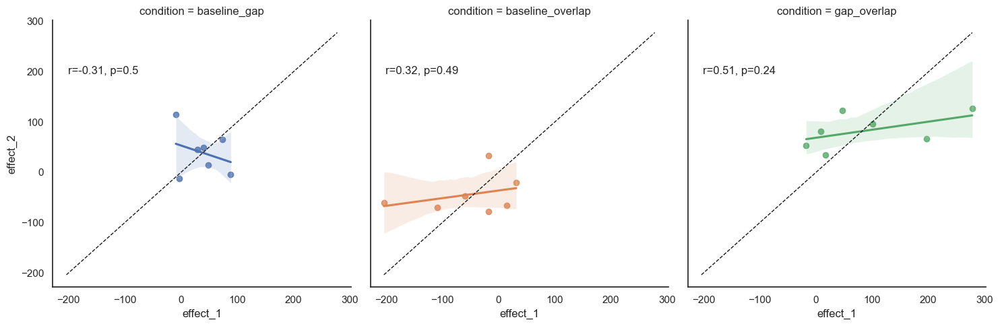

In [565]:
g=sns.lmplot(data=scatter_plot_df,x="effect_1", y="effect_2", hue="condition", col="condition")

def plot_diag(data,**kws):
    mn=min(test["effect_1"].min(), test["effect_2"].min())
    mx=max(test["effect_1"].max(), test["effect_2"].max())
    points=np.linspace(mn, mx, 100)
    plt.gca().plot(points, points, color="k",marker=None,
                  linestyle="--",linewidth=1.0)
def annotate(data, **kws):
    r, p = stats.pearsonr(data["effect_1"], data["effect_2"])
    ax = plt.gca()
    ax.text(.05, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes)
    
g.map_dataframe(annotate)
g.map_dataframe(plot_diag)

plt.show()

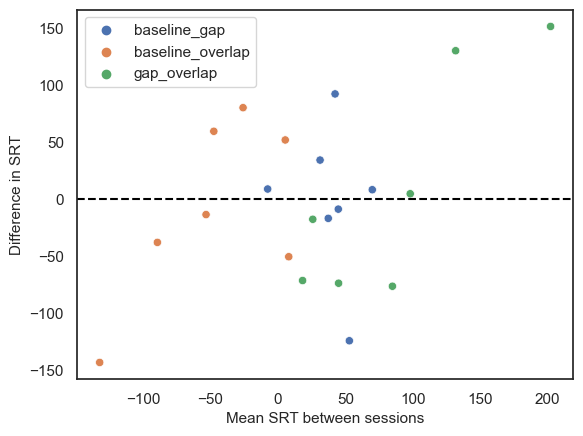

In [621]:
sns.scatterplot(data=scatter_plot_df,x="mean", y="diff", hue="condition")
plt.axhline(0,  linestyle='--', color="black")

plt.ylabel('Difference in SRT',fontsize=11)
plt.xlabel('Mean SRT between sessions',fontsize=11)
plt.legend(loc='upper left')

# Anti Saccade

In [105]:
#as_files = glob.glob('/Users/lina_01/Desktop/eyelink_txt_files_2023/*_1/*_as_*')
as_files = glob.glob('./eyelink_txt_files_2023/*/*_as_1_*.txt')

In [106]:
len(as_files)

22

In [107]:
## Create df with all files 
df = []
for file in as_files:
    df.append(pd.read_csv(file, delimiter = "\t"))
as_df = pd.concat(df, axis=0)

In [108]:
as_df=as_df.rename(columns={"condition": "set_size", "detail":"set_type","Session_Name_": "subject"})

In [109]:
#Fix subject names make all subject names consistent: 
def transform_string(s):
    if '_' in s and "as" in s:
        return s[:3]
    elif "as" or "AS" in s and "_" not in s:
        return s[:3]
    else:
        return s

as_df['subject'] = as_df['subject'].str.replace('s', '0')
as_df['subject'] = as_df['subject'].apply(transform_string)


In [110]:
as_df

,subject,Trial_Index_,Trial_Recycled_,task,set_size,AS_VALID,PREDICTIVE_SACCADE,DISTRACTOR_SACCADE,CLASSIFIER,AS_DISTRACTOR_SAC_RT,AS_TARGET_SAC_RT
0,002,1,False,AS,Left,True,False,True,Pro-Saccade,292,1432
1,002,2,False,AS,Left,False,False,False,Invalid,-1,1403
2,002,3,False,AS,Left,False,False,False,Invalid,-1,1464
3,002,4,False,AS,Left,False,False,False,Invalid,-1,1491
4,002,5,False,AS,Left,False,False,False,Invalid,-1,1515
...,...,...,...,...,...,...,...,...,...,...,...
49,038,50,False,AS,Left,True,True,False,Anti-Saccade,-1,250
50,038,51,False,AS,Left,True,True,False,Anti-Saccade,-1,205
51,038,52,False,AS,Left,True,True,False,Anti-Saccade,-1,65
52,038,53,False,AS,Left,True,True,False,Anti-Saccade,-1,206


### Identify the total number of invalid

In [113]:
as_df_invalid = as_df.loc[ (as_df.CLASSIFIER == 'Invalid') | (as_df.CLASSIFIER == '.') ]
as_df_invalid

,subject,Trial_Index_,Trial_Recycled_,task,set_size,AS_VALID,PREDICTIVE_SACCADE,DISTRACTOR_SACCADE,CLASSIFIER,AS_DISTRACTOR_SAC_RT,AS_TARGET_SAC_RT
1,002,2,False,AS,Left,False,False,False,Invalid,-1,1403
2,002,3,False,AS,Left,False,False,False,Invalid,-1,1464
3,002,4,False,AS,Left,False,False,False,Invalid,-1,1491
4,002,5,False,AS,Left,False,False,False,Invalid,-1,1515
5,002,6,False,AS,Left,False,False,False,Invalid,-1,1546
...,...,...,...,...,...,...,...,...,...,...,...
51,033,52,True,AS,Left,False,False,False,.,-1,-1
52,033,53,False,AS,Left,False,False,False,Invalid,-1,1407
53,033,54,False,AS,Left,False,False,False,Invalid,-1,1439
5,038,6,True,AS,Right,False,False,False,.,-1,-1


In [268]:
#Remove those who had no prditive or distractor saccade

as_df = as_df.loc[ (as_df.CLASSIFIER != 'Invalid') & (as_df.CLASSIFIER != '.') ]


In [269]:
#as_df=as_df.loc[as_df.set_size=="Right"]

In [270]:
first_half

,subject,Trial_Index_,Trial_Recycled_,task,set_size,AS_VALID,PREDICTIVE_SACCADE,DISTRACTOR_SACCADE,CLASSIFIER,AS_DISTRACTOR_SAC_RT,AS_TARGET_SAC_RT
0,002,1,False,AS,Left,True,False,True,Pro-Saccade,292,1432
11,002,12,False,AS,Left,True,False,True,Pro-Saccade,242,1465
19,002,20,False,AS,Left,True,True,False,Anti-Saccade,-1,1025
20,002,21,False,AS,Left,True,True,False,Anti-Saccade,-1,923
22,002,23,False,AS,Left,True,True,False,Anti-Saccade,-1,1289
...,...,...,...,...,...,...,...,...,...,...,...
21,038,22,False,AS,Right,True,True,True,Corrective-Saccade,194,410
22,038,23,False,AS,Right,True,True,False,Anti-Saccade,-1,398
23,038,24,False,AS,Right,True,True,False,Anti-Saccade,-1,314
24,038,25,False,AS,Right,True,True,False,Anti-Saccade,-1,287


In [271]:
as_df.groupby(["subject"]).count().set_size

subject
002     8
004    51
006    31
008    52
009    31
00_    52
010    25
012    12
014    51
015    43
017    38
018    32
023    51
024    37
026    40
028    34
029    51
030    22
031    48
032    45
033    38
038    52
Name: set_size, dtype: int64

In [272]:
first_half.groupby(["subject"]).count().set_size

subject
002     6
004    21
006     9
008    26
009    11
00_    26
010     2
012     9
014    25
015    17
017    18
018    10
023    25
024    16
026    14
028    16
029    25
030     8
031    22
032    20
033    19
038    24
Name: set_size, dtype: int64

In [273]:
second_half.groupby(["subject"]).count().set_size

subject
002     2
004    30
006    22
008    26
009    20
00_    26
010    23
012     3
014    26
015    26
017    20
018    22
023    26
024    21
026    26
028    18
029    26
030    14
031    26
032    25
033    19
038    28
Name: set_size, dtype: int64

In [274]:
first_half = as_df.loc[as_df.Trial_Index_ <= 26]
second_half = as_df.loc[as_df.Trial_Index_ > 26]

In [275]:
first_half

,subject,Trial_Index_,Trial_Recycled_,task,set_size,AS_VALID,PREDICTIVE_SACCADE,DISTRACTOR_SACCADE,CLASSIFIER,AS_DISTRACTOR_SAC_RT,AS_TARGET_SAC_RT
0,002,1,False,AS,Left,True,False,True,Pro-Saccade,292,1432
11,002,12,False,AS,Left,True,False,True,Pro-Saccade,242,1465
19,002,20,False,AS,Left,True,True,False,Anti-Saccade,-1,1025
20,002,21,False,AS,Left,True,True,False,Anti-Saccade,-1,923
22,002,23,False,AS,Left,True,True,False,Anti-Saccade,-1,1289
...,...,...,...,...,...,...,...,...,...,...,...
21,038,22,False,AS,Right,True,True,True,Corrective-Saccade,194,410
22,038,23,False,AS,Right,True,True,False,Anti-Saccade,-1,398
23,038,24,False,AS,Right,True,True,False,Anti-Saccade,-1,314
24,038,25,False,AS,Right,True,True,False,Anti-Saccade,-1,287


In [276]:
first_half.subject.unique()

array(['002', '004', '006', '008', '009', '010', '012', '014', '015',
       '017', '018', '00_', '023', '024', '026', '028', '029', '030',
       '031', '032', '033', '038'], dtype=object)

In [277]:
second_half.subject.unique()

array(['002', '004', '006', '008', '009', '010', '012', '014', '015',
       '017', '018', '00_', '023', '024', '026', '028', '029', '030',
       '031', '032', '033', '038'], dtype=object)

In [278]:
first_half.groupby(['CLASSIFIER','subject']).CLASSIFIER.count()

CLASSIFIER          subject
Anti-Saccade        002         3
                    004         1
                    00_         4
                    010         2
                    012         7
                    014         1
                    015         5
                    017         1
                    018         2
                    023        10
                    024         4
                    026        10
                    028         4
                    030         1
                    031        12
                    033        10
                    038         5
Corrective-Saccade  002         1
                    004        18
                    008        18
                    00_        20
                    014        20
                    015         7
                    017         7
                    023        12
                    024         1
                    028         6
                    029        24
                    

In [279]:
first_half_proportion.Cl

AttributeError: 'DataFrame' object has no attribute 'Cl'

In [280]:
first_half_proportion=first_half.groupby(['CLASSIFIER','subject']).CLASSIFIER.count()
#first_half_proportion=first_half.groupby(['CLASSIFIER','subject']).CLASSIFIER.count() /first_half.groupby(["subject"]).count().set_size
first_half_proportion = pd.DataFrame(first_half_proportion)
first_half_proportion

CLASSIFIER
CLASSIFIER         subject            
Anti-Saccade       002               3
                   004               1
                   00_               4
                   010               2
                   012               7
                   014               1
                   015               5
                   017               1
                   018               2
                   023              10
                   024               4
                   026              10
                   028               4
                   030               1
                   031              12
                   033              10
                   038               5
Corrective-Saccade 002               1
                   004              18
                   008              18
                   00_              20
                   014              20
                   015               7
                   017               7
                   023              12
                   024               1
                   028               6
                   029              24
                   031               5
                   032              11
                   033               1
                   038              14
Pro-Saccade        002               2
                   004               2
                   006               9
                   008               8
                   009              11
                   00_               2
                   012               2
                   014               4
                   015               5
                   017              10
                   018               8
                   023               3
                   024              11
                   026               4
                   028               6
                   029               1
                   030               7
                   031               5
                   032               9
                   033               8
                   038               5

In [281]:
first_half_proportion["n_1"]=first_half.groupby(["subject"]).count().set_size

In [282]:
second_half_proportion=second_half.groupby(['CLASSIFIER','subject']).CLASSIFIER.count()
#second_half_proportion=second_half.groupby(['CLASSIFIER','subject']).CLASSIFIER.count() /second_half.groupby(["subject"]).count().set_size

second_half_proportion = pd.DataFrame(second_half_proportion)#.reset_index()

In [283]:
second_half.groupby(["subject"]).count().set_size

subject
002     2
004    30
006    22
008    26
009    20
00_    26
010    23
012     3
014    26
015    26
017    20
018    22
023    26
024    21
026    26
028    18
029    26
030    14
031    26
032    25
033    19
038    28
Name: set_size, dtype: int64

In [284]:
second_half_proportion["n_2"]=second_half.groupby(["subject"]).count().set_size

In [285]:
#first_half_proportion = first_half_proportion.rename(columns = {'CLASSIFIER' : 'condition', 0: 1})
first_half_proportion = first_half_proportion.rename(columns = {'CLASSIFIER' : '1'})
second_half_proportion = second_half_proportion.rename(columns = {'CLASSIFIER' : '2'})


In [286]:
first_half_proportion

1  n_1
CLASSIFIER         subject         
Anti-Saccade       002       3  NaN
                   004       1  NaN
                   00_       4  NaN
                   010       2  NaN
                   012       7  NaN
                   014       1  NaN
                   015       5  NaN
                   017       1  NaN
                   018       2  NaN
                   023      10  NaN
                   024       4  NaN
                   026      10  NaN
                   028       4  NaN
                   030       1  NaN
                   031      12  NaN
                   033      10  NaN
                   038       5  NaN
Corrective-Saccade 002       1  NaN
                   004      18  NaN
                   008      18  NaN
                   00_      20  NaN
                   014      20  NaN
                   015       7  NaN
                   017       7  NaN
                   023      12  NaN
                   024       1  NaN
                   028       6  NaN
                   029      24  NaN
                   031       5  NaN
                   032      11  NaN
                   033       1  NaN
                   038      14  NaN
Pro-Saccade        002       2  NaN
                   004       2  NaN
                   006       9  NaN
                   008       8  NaN
                   009      11  NaN
                   00_       2  NaN
                   012       2  NaN
                   014       4  NaN
                   015       5  NaN
                   017      10  NaN
                   018       8  NaN
                   023       3  NaN
                   024      11  NaN
                   026       4  NaN
                   028       6  NaN
                   029       1  NaN
                   030       7  NaN
                   031       5  NaN
                   032       9  NaN
                   033       8  NaN
                   038       5  NaN

In [287]:
second_half_proportion = second_half_proportion.rename(columns = {'CLASSIFIER' : 'condition', 0: 2})


In [288]:
second_half_proportion = second_half_proportion.rename(columns = {'CLASSIFIER' : '2'})


In [289]:
second_half_proportion=second_half_proportion.reset_index()


In [290]:
first_half_proportion=first_half_proportion.reset_index()


In [291]:
second_half_proportion

,CLASSIFIER,subject,2,n_2
0,Anti-Saccade,004,5,NaN
1,Anti-Saccade,006,1,NaN
2,Anti-Saccade,008,1,NaN
3,Anti-Saccade,009,2,NaN
4,Anti-Saccade,00_,3,NaN
5,Anti-Saccade,010,1,NaN
6,Anti-Saccade,014,16,NaN
7,Anti-Saccade,015,2,NaN
8,Anti-Saccade,017,4,NaN
9,Anti-Saccade,018,15,NaN


In [292]:
AS_df = first_half_proportion.merge(second_half_proportion, on=["subject", "CLASSIFIER"],how='inner')

In [293]:
AS_df

,CLASSIFIER,subject,1,n_1,2,n_2
0,Anti-Saccade,004,1,NaN,5,NaN
1,Anti-Saccade,00_,4,NaN,3,NaN
2,Anti-Saccade,010,2,NaN,1,NaN
3,Anti-Saccade,014,1,NaN,16,NaN
4,Anti-Saccade,015,5,NaN,2,NaN
5,Anti-Saccade,017,1,NaN,4,NaN
6,Anti-Saccade,018,2,NaN,15,NaN
7,Anti-Saccade,023,10,NaN,10,NaN
8,Anti-Saccade,024,4,NaN,11,NaN
9,Anti-Saccade,026,10,NaN,15,NaN


In [294]:
AS_df_long = AS_df.reset_index().melt(id_vars=['CLASSIFIER',"subject"],var_name = 'half', value_vars = ["1","2"])

In [295]:
AS_df_long

,CLASSIFIER,subject,half,value
0,Anti-Saccade,004,1,1
1,Anti-Saccade,00_,1,4
2,Anti-Saccade,010,1,2
3,Anti-Saccade,014,1,1
4,Anti-Saccade,015,1,5
...,...,...,...,...
85,Pro-Saccade,030,2,7
86,Pro-Saccade,031,2,2
87,Pro-Saccade,032,2,3
88,Pro-Saccade,033,2,5


In [249]:
AS_df_long

,CLASSIFIER,subject,half,value
0,Anti-Saccade,004,1,1
1,Anti-Saccade,00_,1,4
2,Anti-Saccade,010,1,2
3,Anti-Saccade,014,1,1
4,Anti-Saccade,015,1,5
...,...,...,...,...
85,Pro-Saccade,030,2,7
86,Pro-Saccade,031,2,2
87,Pro-Saccade,032,2,3
88,Pro-Saccade,033,2,5


<Figure size 200x200 with 0 Axes>

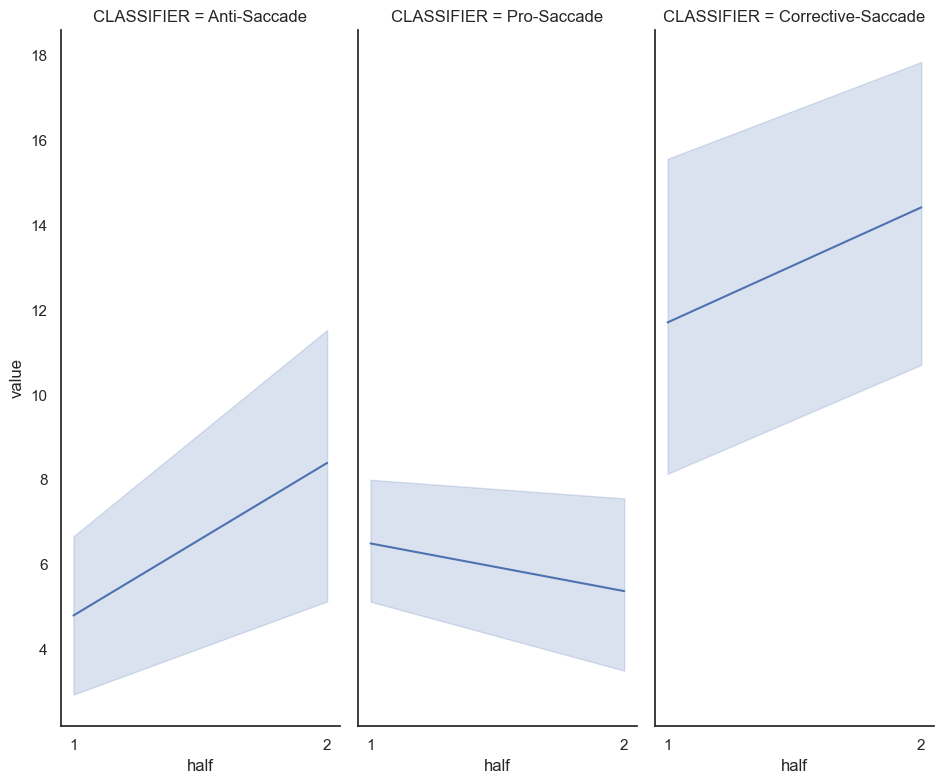

In [250]:
plt.figure(figsize=(2,2))
sns.set_theme(style='white')
sns.relplot(data=AS_df_long, x="half",y="value", height=8, aspect=0.4,
            col="CLASSIFIER", kind="line", col_order=["Anti-Saccade","Pro-Saccade","Corrective-Saccade"])


In [251]:
first_half = as_df.loc[as_df.Trial_Index_ <= 26]
second_half = as_df.loc[as_df.Trial_Index_ > 26]
first_half_proportion = first_half.groupby('CLASSIFIER').CLASSIFIER.count() / first_half.subject.count()
first_half_proportion = pd.DataFrame(first_half_proportion)
first_half_proportion = first_half_proportion.rename(columns = {'CLASSIFIER' : '1'})
second_half_proportion = second_half.groupby('CLASSIFIER').CLASSIFIER.count() / second_half.subject.count()
second_half_proportion = pd.DataFrame(second_half_proportion)
second_half_proportion = second_half_proportion.rename(columns = {'CLASSIFIER' : '2'})



In [252]:
AS_df = first_half_proportion.merge(second_half_proportion, on='CLASSIFIER',how='inner')

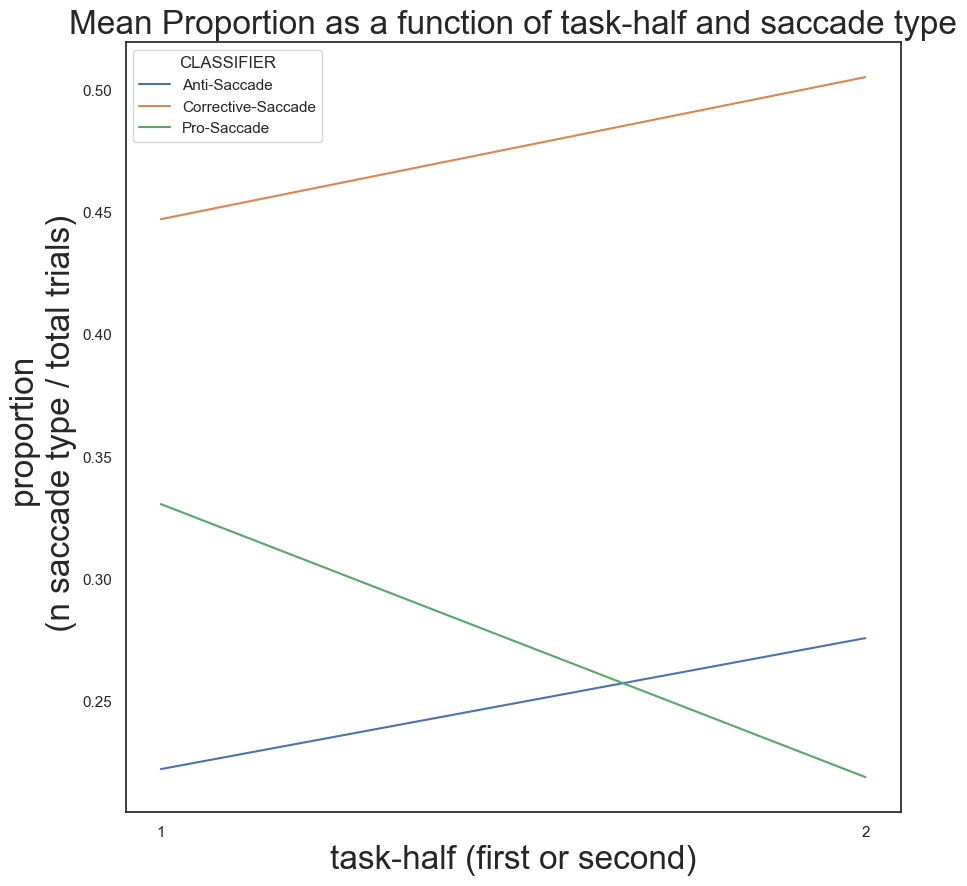

In [255]:
first_half = as_df.loc[as_df.Trial_Index_ <= 26]
second_half = as_df.loc[as_df.Trial_Index_ > 26]
first_half_proportion = first_half.groupby('CLASSIFIER').CLASSIFIER.count() / first_half.subject.count()
first_half_proportion = pd.DataFrame(first_half_proportion)
first_half_proportion = first_half_proportion.rename(columns = {'CLASSIFIER' : '1'})
second_half_proportion = second_half.groupby('CLASSIFIER').CLASSIFIER.count() / second_half.subject.count()
second_half_proportion = pd.DataFrame(second_half_proportion)
second_half_proportion = second_half_proportion.rename(columns = {'CLASSIFIER' : '2'})


AS_df = first_half_proportion.merge(second_half_proportion, on='CLASSIFIER',how='inner')
AS_df_long = AS_df.reset_index().melt(id_vars='CLASSIFIER',var_name = 'half', value_vars = ['1','2'])
ax = plt.figure(figsize=(10, 10))
ax = sns.lineplot(x = 'half', y = 'value', hue='CLASSIFIER', data=AS_df_long)
ax = plt.xlabel('task-half (first or second)',fontsize=24)
ax = plt.ylabel('proportion \n (n saccade type / total trials)',fontsize=24)
ax = plt.title('Mean Proportion as a function of task-half and saccade type',fontsize=24)
#plt.savefig('as_plot_1.png')

<Figure size 200x200 with 0 Axes>

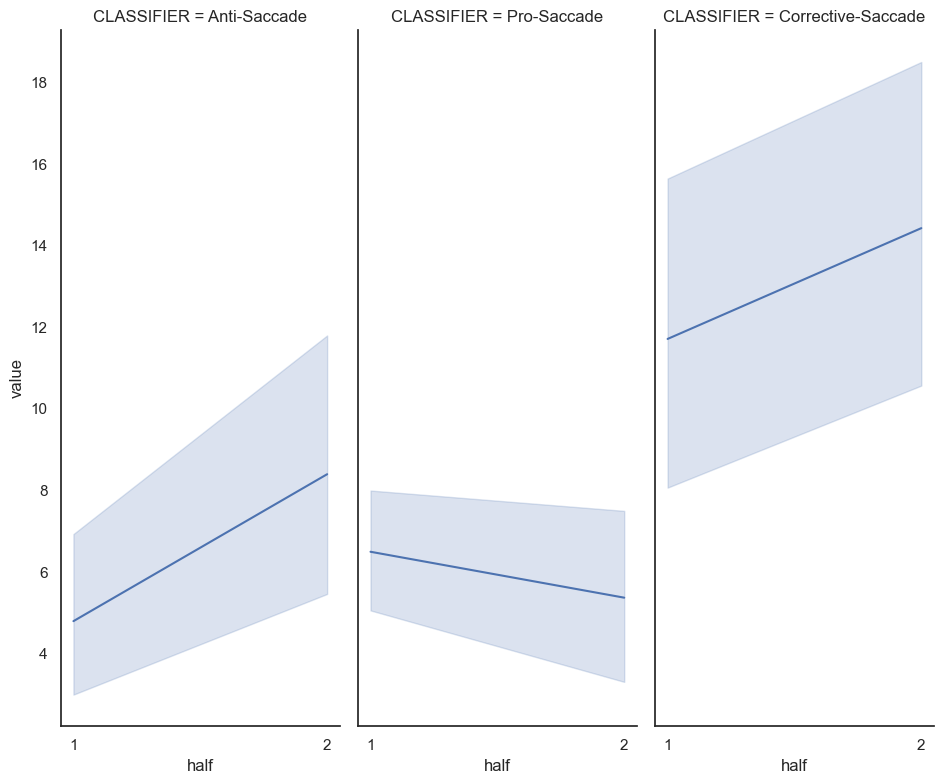

In [296]:
plt.figure(figsize=(2,2))
sns.set_theme(style='white')
sns.relplot(data=AS_df_long, x="half",y="value", height=8, aspect=0.4,
            col="CLASSIFIER", kind="line", col_order=["Anti-Saccade","Pro-Saccade","Corrective-Saccade"])


In [297]:
AS_df_long

,CLASSIFIER,subject,half,value
0,Anti-Saccade,004,1,1
1,Anti-Saccade,00_,1,4
2,Anti-Saccade,010,1,2
3,Anti-Saccade,014,1,1
4,Anti-Saccade,015,1,5
...,...,...,...,...
85,Pro-Saccade,030,2,7
86,Pro-Saccade,031,2,2
87,Pro-Saccade,032,2,3
88,Pro-Saccade,033,2,5


<Figure size 200x200 with 0 Axes>

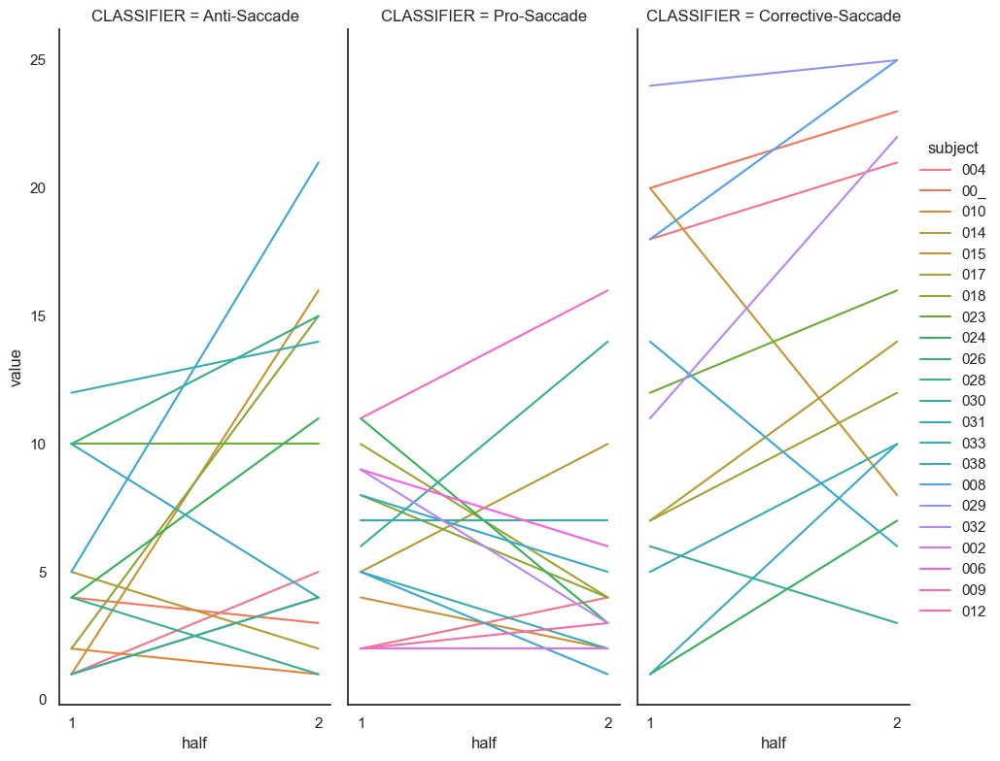

In [298]:
plt.figure(figsize=(2,2))
sns.set_theme(style='white')
sns.relplot(data=AS_df_long, x="half",y="value", height=8, aspect=0.4,hue="subject",
            col="CLASSIFIER", kind="line", col_order=["Anti-Saccade","Pro-Saccade","Corrective-Saccade"])


In [316]:
as_df_cluster=AS_df_long.loc[AS_df_long.CLASSIFIER=="Pro-Saccade"]

In [317]:
as_df_cluster=as_df_cluster.pivot(index="subject", columns=["half", "CLASSIFIER"]).reset_index()

In [318]:
as_df_cluster.columns = as_df_cluster.columns.to_series().str.join('_')
as_df_cluster["as_prosac"]=as_df_cluster["value_1_Pro-Saccade"]-as_df_cluster["value_2_Pro-Saccade"]
as_df_cluster=as_df_cluster[["subject__","as_prosac"]]
as_df_cluster.columns=["subject", "as_prosac"]
as_df_cluster

,subject,as_prosac
0,002,0
1,004,-2
2,006,3
3,009,-5
4,012,-1
5,014,2
6,015,-5
7,017,6
8,018,4
9,024,8


In [600]:
as_df_cluster.to_csv("as_df_cluster.csv", index=False)

# Visual Search

In [132]:
vsfiles = glob.glob('./eyelink_txt_files_2023/*/*VS*.txt')

In [133]:
len(vsfiles)

77

In [134]:
vsfiles

['./eyelink_txt_files_2023\\002_1\\002_vs_1_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\002_2\\002_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\004_1\\004_vs_1__VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\004_2\\004_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\006_1\\006_vs_1_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\006_2\\006_vs_2_vs_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\008_1\\008_vs_1_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\009_1\\009_vs_1_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\009_2\\09vs02_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\010_1\\010_vs_1_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\010_2\\010_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\012\\012_vs_1_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\013\\013_vs_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\014_1\\014_vs_VS_Q1K_ACAR_VS_pfp_v1.txt'

In [135]:
## Create df with all files 
df = []
for file in vsfiles:
    df.append(pd.read_csv(file, delimiter = "\t"))
vs_df = pd.concat(df, axis=0)

In [136]:
vs_df=vs_df.rename(columns={"condition": "set_size", "detail":"set_type","Session_Name_": "subject"})

In [137]:
vs_df["set_type_joined"] = np.where((vs_df["set_type"] == "Single_Apple") | (vs_df["set_type"] == "Single_Slice"), "single", "conjunction")


In [138]:
vs_df.loc[vs_df.set_type_joined=="single"]["set_type"].unique()

array(['Single_Slice', 'Single_Apple'], dtype=object)

In [139]:
vs_df["session"]=1

In [130]:
#make all subject names consistent: 
def transform_string(s):
    if '_' in s and "vs" in s:
        return s[:3]
    elif "vs" or "VS" in s and "_" not in s:
        return s[:3]
    else:
        return s

vs_df['subject'] = vs_df['subject'].str.replace('^s', '0')
vs_df['subject'] = vs_df['subject'].apply(transform_string)


C:\Users\gabot\AppData\Local\Temp\ipykernel_19996\69756385.py:10: FutureWarning: The default value of regex will change from True to False in a future version.
  vs_df['subject'] = vs_df['subject'].str.replace('^s', '0')


In [140]:
vs_df.subject.unique()

array(['s02', '002_vs_2', 's04vs', '004_vs_2', 's06vs', 's06v2_vs',
       's08vs', 's09_VS', '09vs02', 's10vs', '010_vs_2', '012_vs',
       '013_vs', '014_vs', '014_vs_2', '015_vs', '017_vs_1', '018_vs_1',
       '020_vs_1', '023_vs_1', '024_vs_1', '026_vs_1', '027_vs_1',
       '028_vs_1', '029_vs_1', '030_vs_1', '031_vs_1', '032_vs_1',
       '033_vs_1', '038_vs_1', '038_vs_2', '052_vs_1', '052_vs_3',
       '096_vs_1', 'CJ', 'LJ', 'MJ', 'Q119M1', 'Q129_M1', 'Q131_P',
       'Q131_S1', 'Q134_F1', 'Q134_M1', 'Q146_P', 'Q162_M1', 'Q162_P',
       'Q162_S1', 'Q062_P', 'Q064_M1', 'Q064_S1', 'Q093_O1', 'Q1006_M1',
       'Q1024_M1', 'Q1024_P', 'Q1026_M1', 'Q1037_F1', 'Q171_F1',
       'Q171_M1', 'Q171_P', 'Q179_M1', 'Q179_P', 'Q181_P', 'Q183_M1',
       'Q186F1', 'Q186M1', 'Q196_M1', 'Q196_P', 'Q196_S2', 'Q200_F1',
       'Q200_M1', 'Q200_P', 'Q200_S1', 'Q068_F1', 'Q068_M1', 'Q068_S1',
       'Q068_S3', 'RJ'], dtype=object)

In [141]:
# TEST-RETEST RELIABILITY
vsfiles2 = glob.glob('./eyelink_txt_files_2023/0*/*vs_2_*.txt')
vsfiles2
## Create df with all files 
df = []
for file in vsfiles2:
    df.append(pd.read_csv(file, delimiter = "\t"))
vs_df_2 = pd.concat(df, axis=0)

vs_df_2=vs_df_2.rename(columns={"condition": "set_size", "detail":"set_type","Session_Name_": "subject"})

vs_df_2["set_type_joined"] = np.where((vs_df_2["set_type"] == "Single_Apple") | (vs_df_2["set_type"] == "Single_Slice"), "single", "conjunction")
vs_df_2.loc[vs_df_2.set_type_joined=="single"]["set_type"].unique()
vs_df_2["session"]=2
vs_df_2['subject'] = vs_df_2['subject'].str.replace('^s', '0')
vs_df_2['subject'] = vs_df_2['subject'].apply(transform_string)
#vs_df_2.subject.unique()

# Merge both dataset together
vs_df_retest=pd.concat([vs_df,vs_df_2])
# find subjects taht did both. 
valid_subjects=vs_df_retest.groupby('subject')['session'].nunique()
valid_subjects = valid_subjects[valid_subjects == 2].index
vs_df_retest = vs_df_retest[vs_df_retest['subject'].isin(valid_subjects)]


C:\Users\gabot\AppData\Local\Temp\ipykernel_19996\591212134.py:15: FutureWarning: The default value of regex will change from True to False in a future version.
  vs_df_2['subject'] = vs_df_2['subject'].str.replace('^s', '0')


In [142]:
#Test trying wihthout th first 3 3 trials

In [143]:
#vs_df=vs_df.loc[vs_df.Trial_Index_<16]

In [144]:
vs_df

,subject,Trial_Index_,Trial_Recycled_,VS_SAC_RT,VS_VALID,sub_task_blocking,task,set_size,set_type,dl_video,vs_location_list,set_type_joined,session
0,s02,1,False,428,True,1,VS,Five,Single_Slice,Blank.mov,"(7, 2, 9, 14, 4)",single,1
1,s02,2,False,-1,False,2,VS,Nine,Single_Slice,Blank.mov,"(1, 15, 2, 10, 6, 11, 7, 4, 16)",single,1
2,s02,3,False,622,True,3,VS,Thirteen,Single_Slice,Blank.mov,"(3, 9, 14, 15, 12, 4, 10, 16, 1, 5, 8, 6, 11)",single,1
3,s02,4,False,1114,True,4,VS,Five,Single_Apple,Blank.mov,"(10, 0, 14, 3, 2)",single,1
4,s02,5,False,408,True,5,VS,Nine,Single_Apple,Blank.mov,"(3, 10, 0, 13, 9, 16, 14, 5, 7)",single,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
25,RJ,26,False,348,True,7,VS,Nine,Conjunction,Blank.mov,"(0, 3, 11, 13, 7, 8, 5, 1, 6)",conjunction,1
26,RJ,27,False,369,True,7,VS,Nine,Conjunction,Blank.mov,"(13, 8, 7, 5, 0, 4, 16, 11, 1)",conjunction,1
27,RJ,28,False,213,True,7,VS,Thirteen,Conjunction,Blank.mov,"(15, 9, 5, 8, 0, 11, 12, 4, 7, 6, 13, 2, 14)",conjunction,1
28,RJ,29,False,342,True,7,VS,Thirteen,Conjunction,Blank.mov,"(6, 13, 12, 14, 15, 16, 4, 11, 3, 2, 8, 1, 9)",conjunction,1


## Differnces in accuracy (set size, set type)

#### Descriptive statistics for accuracy, group level 

In [145]:
valid_trials=vs_df[vs_df.VS_VALID==True].groupby(["set_size","set_type"])["VS_VALID"].count()
invalid_trials=vs_df[vs_df.VS_VALID==False].groupby(["set_size","set_type"])["VS_VALID"].count()
accuracy_df=valid_trials/(valid_trials+invalid_trials)

In [146]:
accuracy_df=pd.DataFrame(accuracy_df).reset_index().rename(columns={"VS_VALID":"perc_accuracy"})
accuracy_df

,set_size,set_type,perc_accuracy
0,Five,Conjunction,0.919740
1,Five,Single_Apple,0.929032
2,Five,Single_Slice,0.917197
3,Nine,Conjunction,0.910064
4,Nine,Single_Apple,0.923077
5,Nine,Single_Slice,0.898089
6,Thirteen,Conjunction,0.901288
7,Thirteen,Single_Apple,0.954248
8,Thirteen,Single_Slice,0.917197


#### Particpant statistics for accuracy 

In [147]:
valid_trials=vs_df[vs_df.VS_VALID==True].groupby(["subject","set_size","set_type"])["VS_VALID"].count()
total_trials=vs_df.groupby(["subject","set_size","set_type"])["VS_VALID"].count()
acc_per_sub=valid_trials/total_trials

In [148]:
acc_per_sub_s=pd.DataFrame(acc_per_sub).reset_index().rename(columns={"VS_VALID":"perc_accuracy"})
acc_decriptive_stats=acc_per_sub_s.groupby(["set_size","set_type"]).perc_accuracy.describe().reset_index()
acc_decriptive_stats

,set_size,set_type,count,mean,std,min,25%,50%,75%,max
0,Five,Conjunction,76.0,0.922619,0.156836,0.142857,0.833333,1.0,1.0,1.0
1,Five,Single_Apple,75.0,0.951111,0.144398,0.500000,1.000000,1.0,1.0,1.0
2,Five,Single_Slice,75.0,0.948889,0.152490,0.333333,1.000000,1.0,1.0,1.0
3,Nine,Conjunction,76.0,0.918285,0.163064,0.111111,0.851190,1.0,1.0,1.0
4,Nine,Single_Apple,75.0,0.953333,0.148970,0.333333,1.000000,1.0,1.0,1.0
5,Nine,Single_Slice,76.0,0.923246,0.179383,0.500000,1.000000,1.0,1.0,1.0
6,Thirteen,Conjunction,76.0,0.911602,0.192170,0.222222,1.000000,1.0,1.0,1.0
7,Thirteen,Single_Apple,75.0,0.973333,0.113105,0.500000,1.000000,1.0,1.0,1.0
8,Thirteen,Single_Slice,75.0,0.946667,0.147959,0.500000,1.000000,1.0,1.0,1.0


#### Particiapnts single vs conjunction

In [149]:
valid_trials=vs_df[vs_df.VS_VALID==True].groupby(["subject","set_size","set_type_joined"])["VS_VALID"].count()
total_trials=vs_df.groupby(["subject","set_size","set_type_joined"])["VS_VALID"].count()
acc_per_sub=valid_trials/total_trials
acc_per_sub=pd.DataFrame(acc_per_sub).reset_index().rename(columns={"VS_VALID":"perc_accuracy"})
acc_decriptive_stats=acc_per_sub.groupby(["set_size","set_type_joined"]).perc_accuracy.describe().reset_index()
acc_decriptive_stats

,set_size,set_type_joined,count,mean,std,min,25%,50%,75%,max
0,Five,conjunction,76.0,0.922619,0.156836,0.142857,0.833333,1.0,1.0,1.0
1,Five,single,75.0,0.948000,0.120090,0.400000,1.000000,1.0,1.0,1.0
2,Nine,conjunction,76.0,0.918285,0.163064,0.111111,0.851190,1.0,1.0,1.0
3,Nine,single,76.0,0.932237,0.145992,0.400000,1.000000,1.0,1.0,1.0
4,Thirteen,conjunction,76.0,0.911602,0.192170,0.222222,1.000000,1.0,1.0,1.0
5,Thirteen,single,75.0,0.958667,0.115774,0.500000,1.000000,1.0,1.0,1.0


### Plotting accuracy 

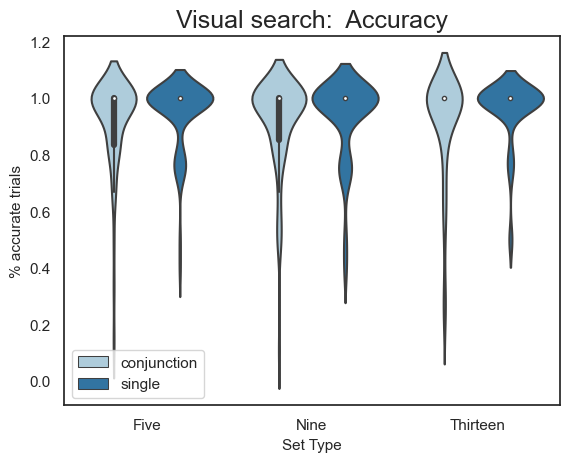

In [150]:
#plt.figure(figsize=(10, 10))
#sns.boxplot(x="set_type_joined", y="perc_accuracy", data=acc_per_sub, 
 #           hue="set_size").set_title('VS Accuracy distractor type and count',fontsize=18)

sns.violinplot(x="set_size", y="perc_accuracy", data=acc_per_sub, palette="Paired",
            hue="set_type_joined").set_title('Visual search:  Accuracy',fontsize=18)

plt.grid(False)
plt.ylabel('% accurate trials',fontsize=11)
plt.xlabel('Set Type',fontsize=11)
plt.legend(loc='lower left')

#plt.ylim([0.7,1.2])

### Anova to test differences 

#### Assumption of sphericity (Mauchly’s test)

In [151]:
print(pg.sphericity(data=acc_per_sub, dv='perc_accuracy', subject='subject', within='set_type_joined')[-1])
print(pg.sphericity(data=acc_per_sub, dv='perc_accuracy', subject='subject', within='set_size')[-1])

1.0
2.6644353712783013e-05


#### Assumption of normality

In [152]:
pg.normality(data=acc_per_sub, dv='perc_accuracy', group='set_type_joined')

,W,pval,normal
set_type_joined,,,
conjunction,0.555097,9.188154e-24,False
single,0.475419,2.308558e-25,False


In [153]:
## Attempting data transformations did not yield anything close to normality. 
#acc_per_sub["log_percent"]=np.log1p(acc_per_sub.perc_accuracy)
#acc_per_sub["sqrt_percent"]=(acc_per_sub.perc_accuracy)**(1/2)
#pg.normality(data=acc_per_sub, dv='sqrt_percent', group='set_type_joined')
#plt.hist(acc_per_sub.perc_accuracy,edgecolor='black', bins=20)


### Friedman Test (non-parametric)

In [154]:
pg.friedman(data=acc_per_sub_s, dv="perc_accuracy", within="set_type", subject="subject")


,Source,W,ddof1,Q,p-unc
Friedman,set_type,0.099965,2,15.194631,0.000502


In [155]:
pg.friedman(data=acc_per_sub, dv="perc_accuracy", within="set_size", subject="subject")

,Source,W,ddof1,Q,p-unc
Friedman,set_size,0.018492,2,2.810811,0.245268


### Post-hoc test

In [156]:
sp.posthoc_conover_friedman(a=acc_per_sub_s, y_col="perc_accuracy", group_col="set_type", block_col="subject", 
                                 p_adjust="fdr_bh", melted=True)

,Conjunction,Single_Apple,Single_Slice
Conjunction,1.000000,0.584457,0.584457
Single_Apple,0.584457,1.000000,0.771166
Single_Slice,0.584457,0.771166,1.000000


Text(0.5, 0, 'Set Type')

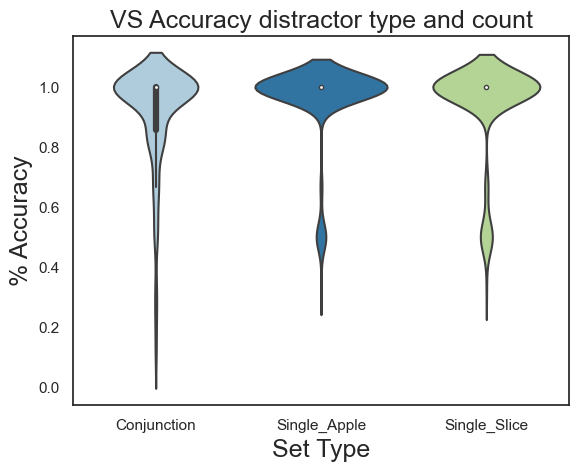

In [157]:
sns.violinplot(x="set_type", y="perc_accuracy", data=acc_per_sub_s, palette="Paired").set_title('VS Accuracy distractor type and count',fontsize=18)

plt.grid(False)
plt.ylabel('% Accuracy',fontsize=18)
plt.xlabel('Set Type',fontsize=18)
#plt.ylim([0.7,1.2])

In [158]:
## Conclusion: no significant differences 

## Differences in mean reaction time (set size, set type)

In [159]:
#remove failed trials 
vs_rt=vs_df[vs_df.VS_VALID==True]


#### Descriptive stats Single vs Conjunction

In [160]:
vs_rt_sub=pd.DataFrame(vs_rt).reset_index().rename(columns={"VS_SAC_RT":"rt"})
rt_decriptive_stats=vs_rt_sub.groupby(["set_size","set_type_joined"]).rt.describe().reset_index()
rt_decriptive_stats

,set_size,set_type_joined,count,mean,std,min,25%,50%,75%,max
0,Five,conjunction,424.0,702.018868,735.310262,156.0,268.00,402.5,761.25,3928.0
1,Five,single,288.0,735.312500,706.467420,162.0,268.75,429.5,914.00,3834.0
2,Nine,conjunction,425.0,648.771765,678.457043,63.0,262.00,419.0,661.00,3880.0
3,Nine,single,285.0,647.378947,725.083485,163.0,259.00,357.0,609.00,3940.0
4,Thirteen,conjunction,420.0,643.400000,651.601747,49.0,292.75,433.5,651.25,3774.0
5,Thirteen,single,290.0,513.706897,647.401781,174.0,233.25,274.0,470.00,3928.0


#### Descriptive stats Single colour vs Single size vs Conjunction

In [161]:
#Set type separated
rt_decriptive_stats=vs_rt_sub.groupby(["set_size","set_type"]).rt.describe().reset_index()
rt_decriptive_stats

,set_size,set_type,count,mean,std,min,25%,50%,75%,max
0,Five,Conjunction,424.0,702.018868,735.310262,156.0,268.00,402.5,761.25,3928.0
1,Five,Single_Apple,144.0,650.000000,670.815504,162.0,231.00,330.5,870.25,3834.0
2,Five,Single_Slice,144.0,820.625000,732.823946,183.0,355.75,507.5,1007.25,3706.0
3,Nine,Conjunction,425.0,648.771765,678.457043,63.0,262.00,419.0,661.00,3880.0
4,Nine,Single_Apple,144.0,671.881944,829.522219,163.0,223.75,331.0,567.75,3940.0
5,Nine,Single_Slice,141.0,622.354610,602.007417,201.0,288.00,374.0,703.00,3647.0
6,Thirteen,Conjunction,420.0,643.400000,651.601747,49.0,292.75,433.5,651.25,3774.0
7,Thirteen,Single_Apple,146.0,534.082192,701.203306,178.0,230.00,267.0,469.75,3928.0
8,Thirteen,Single_Slice,144.0,493.048611,589.605490,174.0,236.00,282.0,469.75,3844.0


### Plotting accuracy 

(0.0, 1000.0)

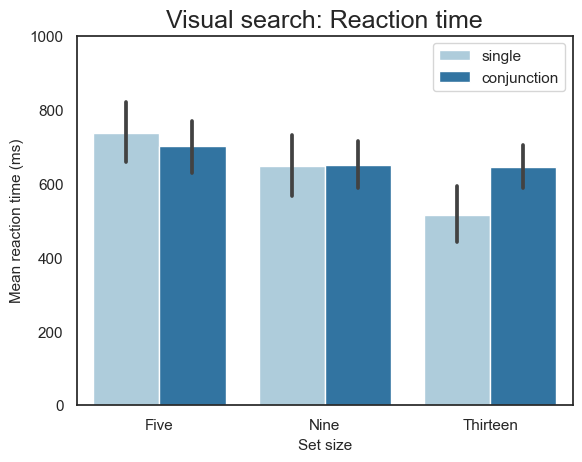

In [162]:
sns.barplot(x="set_size", y="rt", data=vs_rt_sub, palette="Paired",
            hue="set_type_joined", order=["Five","Nine","Thirteen"]).set_title('Visual search: Reaction time',
                                                                               fontsize=18)
plt.grid(False)
plt.ylabel('Mean reaction time (ms)',fontsize=11)
plt.xlabel('Set size',fontsize=11)
plt.legend(loc='upper right')
plt.ylim([0,1000])

In [163]:
## Make numbers integres so they are easier to graph 

vs_rt_sub["set_size_int"]=0

for size in vs_rt_sub.set_size.unique():
    if size =="Five":
        vs_rt_sub.loc[vs_rt_sub.set_size==size,"set_size_int"]=5
    elif size =="Nine":
        vs_rt_sub.loc[vs_rt_sub.set_size==size,"set_size_int"]=9
    else:
        vs_rt_sub.loc[vs_rt_sub.set_size==size,"set_size_int"]=13 
#Alternative visualization as line plot 
""""sns.lineplot(x="set_size_int", y="log_rt", data=vs_rt_sub, hue="set_type",
            palette="Set1").set_title('Visual search: Reaction time',fontsize=18)

plt.grid(False)
plt.ylabel('Mean reaction time (ms)',fontsize=11)
plt.xlabel('Set size',fontsize=11)
plt.legend(loc='upper right')"""

'"sns.lineplot(x="set_size_int", y="log_rt", data=vs_rt_sub, hue="set_type",\n            palette="Set1").set_title(\'Visual search: Reaction time\',fontsize=18)\n\nplt.grid(False)\nplt.ylabel(\'Mean reaction time (ms)\',fontsize=11)\nplt.xlabel(\'Set size\',fontsize=11)\nplt.legend(loc=\'upper right\')'

### Anova to test differences 

#### Assumption of sphericity (Mauchly’s test)

In [164]:
print(pg.sphericity(data=vs_rt_sub, dv='rt', subject='subject', within='set_type_joined')[-1])
print(pg.sphericity(data=vs_rt_sub, dv='rt', subject='subject', within='set_size')[-1])

1.0
0.013426835894927911


#### Assumption of normality

In [165]:
pg.normality(data=vs_rt_sub, dv='rt', group='set_type_joined')

,W,pval,normal
set_type_joined,,,
single,0.630316,1.908891e-39,False
conjunction,0.658073,1.121039e-44,False


In [166]:
pg.normality(data=vs_rt_sub, dv='rt', group='set_size')

,W,pval,normal
set_size,,,
Five,0.699992,1.015392e-33,False
Thirteen,0.601880,2.033762e-37,False
Nine,0.634734,2.938756e-36,False


#### Assumption of normality after log-transform

In [167]:
#Applied various trasnformations
vs_rt_sub["log_rt"]=np.log(vs_rt_sub.rt)
vs_rt_sub["sqrt_rt"]=np.sqrt(vs_rt_sub.rt)
vs_rt_sub["reciprocal_rt"] = boxcox(vs_rt_sub.rt,-0.5)

In [168]:
pg.normality(data=vs_rt_sub, dv='log_rt',group="subject" )

,W,pval,normal
subject,,,
s02,0.915105,0.030141,False
002_vs_2,0.892527,0.009060,False
s04vs,0.900950,0.008861,False
004_vs_2,0.911785,0.016510,False
s06vs,0.952431,0.211569,True
...,...,...,...
Q068_F1,0.911243,0.018401,False
Q068_M1,0.978334,0.888086,True
Q068_S1,0.963678,0.469050,True


In [169]:
## Attempting data transformations did not yield anything close to normality. 

<Axes: xlabel='reciprocal_rt', ylabel='Count'>

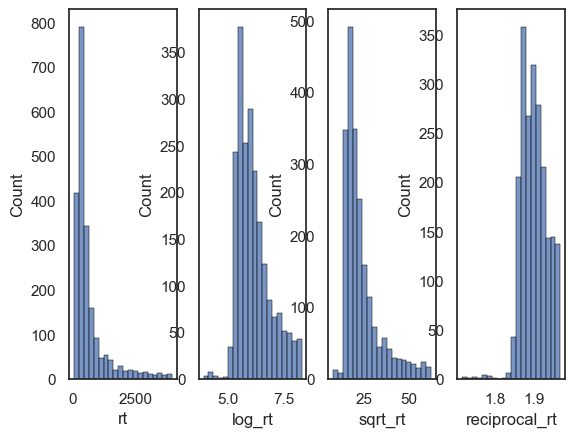

In [170]:
fig, axs = plt.subplots(ncols=4)
sns.histplot(vs_rt_sub.rt,edgecolor='black', bins=20, ax=axs[0])
sns.histplot(vs_rt_sub.log_rt,edgecolor='black', bins=20, ax=axs[1])
sns.histplot(vs_rt_sub.sqrt_rt,edgecolor='black', bins=20, ax=axs[2])
sns.histplot(vs_rt_sub.reciprocal_rt,edgecolor='black', bins=20, ax=axs[3])


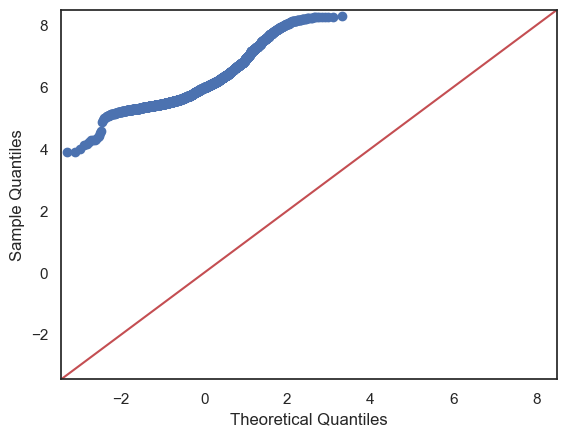

In [171]:
fig = sm.qqplot(vs_rt_sub.log_rt, line='45')

plt.show()

In [172]:
## Attempting data transformations did not yield anything close to normality. 
#acc_per_sub["log_percent"]=np.log1p(acc_per_sub.perc_accuracy)
#acc_per_sub["sqrt_percent"]=(acc_per_sub.perc_accuracy)**(1/2)
#pg.normality(data=acc_per_sub, dv='sqrt_percent', group='set_type_joined')
#plt.hist(acc_per_sub.perc_accuracy,edgecolor='black', bins=20)


### Friedman Test (non-parametric)

In [173]:
pg.friedman(data=vs_rt_sub, dv="rt", within="set_type", subject="subject")

,Source,W,ddof1,Q,p-unc
Friedman,set_type,0.092105,2,14.0,0.000912


In [174]:
pg.friedman(data=vs_rt_sub, dv="rt", within="set_size", subject="subject")

,Source,W,ddof1,Q,p-unc
Friedman,set_size,0.07635,2,11.605263,0.00302


### Post-hoc test

In [175]:
sp.posthoc_conover_friedman(a=vs_rt_sub, y_col="log_rt", group_col="set_type_joined", block_col="subject", 
                                 p_adjust="fdr_bh", melted=True)

,single,conjunction
single,1.000000e+00,1.777674e-11
conjunction,1.777674e-11,1.000000e+00


In [176]:
sp.posthoc_conover_friedman(a=vs_rt_sub, y_col="log_rt", group_col="set_size", block_col="subject", 
                                 p_adjust="fdr_bh", melted=True)

,Five,Thirteen,Nine
Five,1.000000,0.449235,0.540746
Thirteen,0.449235,1.000000,0.540746
Nine,0.540746,0.540746,1.000000


In [177]:
res = pg.rm_anova(dv='log_rt', within=['set_size', 'set_type_joined'],
                  subject='subject', data=vs_rt_sub, detailed=True)


In [178]:
res

,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,ng2,eps
0,set_size,3.065057,2,146,1.532529,17.342747,1.747263e-07,2.931999e-07,0.027532,0.957873
1,set_type_joined,0.670977,1,73,0.670977,6.512650,1.280349e-02,1.280349e-02,0.006160,1.000000
2,set_size * set_type_joined,1.459515,2,146,0.729758,11.462305,2.377798e-05,2.493147e-05,0.013302,0.993840


In [179]:
## post-hoc test 

In [180]:
post_hocs = pg.pairwise_tests(dv='reciprocal_rt', within=['set_size',"set_type_joined"],
                               subject='subject', padjust='fdr_bh', data=vs_rt_sub)
post_hocs

c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()
c:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()


,Contrast,set_size,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,set_size,-,Five,Nine,True,True,3.097568,73.0,two-sided,2.768947e-03,2.768947e-03,fdr_bh,9.984,0.242822
1,set_size,-,Five,Thirteen,True,True,6.413770,73.0,two-sided,1.247219e-08,3.741658e-08,fdr_bh,9.569e+05,0.482569
2,set_size,-,Nine,Thirteen,True,True,3.303677,73.0,two-sided,1.480334e-03,2.220501e-03,fdr_bh,17.481,0.258221
3,set_type_joined,-,conjunction,single,True,True,2.671966,73.0,two-sided,9.294364e-03,NaN,NaN,3.437,0.186960
4,set_size * set_type_joined,Five,conjunction,single,True,True,-0.950330,73.0,two-sided,3.450804e-01,3.450804e-01,fdr_bh,0.197,-0.080628
5,set_size * set_type_joined,Nine,conjunction,single,True,True,1.136507,73.0,two-sided,2.594615e-01,3.450804e-01,fdr_bh,0.237,0.108146
6,set_size * set_type_joined,Thirteen,conjunction,single,True,True,4.589422,73.0,two-sided,1.807490e-05,5.422471e-05,fdr_bh,995.133,0.462345


(0.0, 1000.0)

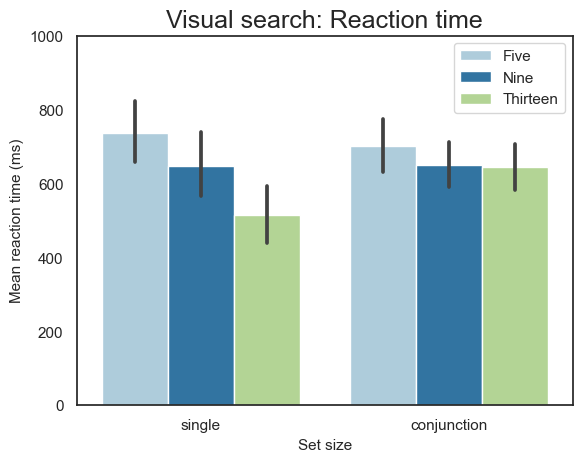

In [181]:
sns.barplot(x="set_type_joined", y="rt", data=vs_rt_sub, palette="Paired",
            hue="set_size", hue_order=["Five", "Nine","Thirteen"]
).set_title('Visual search: Reaction time',
                                                                               fontsize=18)
plt.grid(False)
plt.ylabel('Mean reaction time (ms)',fontsize=11)
plt.xlabel('Set size',fontsize=11)
plt.legend(loc='upper right')
plt.ylim([0,1000])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


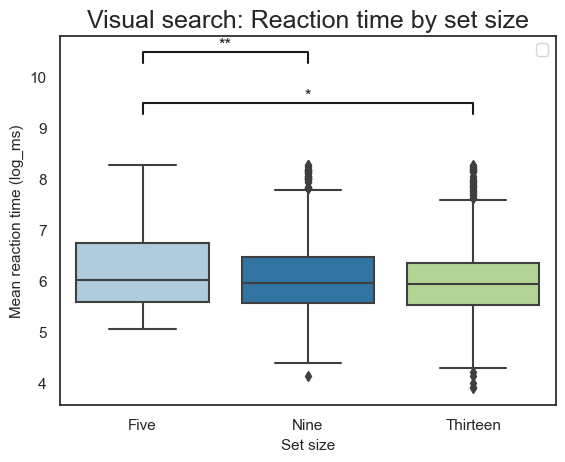

In [182]:
order = ["Five", "Nine","Thirteen"]

ax=sns.boxplot(x="set_size", y="log_rt", data=vs_rt_sub,order=order,
            palette="Paired").set_title('Visual search: Reaction time by set size',fontsize=18)

plt.grid(False)
plt.ylabel('Mean reaction time (log_ms)',fontsize=11)
plt.xlabel('Set size',fontsize=11)
plt.legend(loc='upper right')

x1, x2 = 0,2 
y, h, col = vs_rt_sub['log_rt'].max() + 1, 0.2, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col)

x3, x2 = 0,1 
y, h, col = vs_rt_sub['log_rt'].max() + 2, 0.2, 'k'

plt.plot([x3, x3, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x3+x2)*.5, y+h, "**", ha='center', va='bottom', color=col)

plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


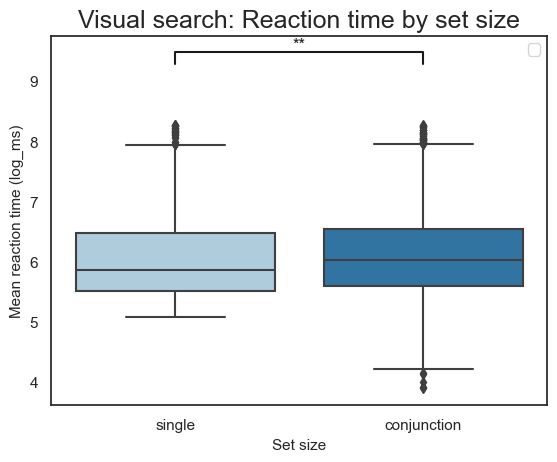

In [183]:
order = ["single", "conjunction"]

ax=sns.boxplot(x="set_type_joined", y="log_rt", data=vs_rt_sub,order=order,
            palette="Paired").set_title('Visual search: Reaction time by set size',fontsize=18)

plt.grid(False)
plt.ylabel('Mean reaction time (log_ms)',fontsize=11)
plt.xlabel('Set size',fontsize=11)
plt.legend(loc='upper right')


x1, x2 = 0,1
y, h, col = vs_rt_sub['log_rt'].max() + 1, 0.2, 'k'
plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
plt.text((x1+x2)*.5, y+h, "**", ha='center', va='bottom', color=col)


plt.show()



In [202]:
vs_df_cluster=vs_rt_sub.loc[(vs_rt_sub.set_type=="Conjunction") & (vs_rt_sub.set_size=="Thirteen")]

In [203]:
vs_rt_sub

,index,subject,Trial_Index_,Trial_Recycled_,rt,VS_VALID,sub_task_blocking,task,set_size,set_type,dl_video,vs_location_list,set_type_joined,session,set_size_int,log_rt,sqrt_rt,reciprocal_rt
0,0,s02,1,False,428,True,1,VS,Five,Single_Slice,Blank.mov,"(7, 2, 9, 14, 4)",single,1,5,6.059123,20.688161,1.903326
1,2,s02,3,False,622,True,3,VS,Thirteen,Single_Slice,Blank.mov,"(3, 9, 14, 15, 12, 4, 10, 16, 1, 5, 8, 6, 11)",single,1,13,6.432940,24.939928,1.919807
2,3,s02,4,False,1114,True,4,VS,Five,Single_Apple,Blank.mov,"(10, 0, 14, 3, 2)",single,1,5,7.015712,33.376639,1.940078
3,4,s02,5,False,408,True,5,VS,Nine,Single_Apple,Blank.mov,"(3, 10, 0, 13, 9, 16, 14, 5, 7)",single,1,9,6.011267,20.199010,1.900985
4,5,s02,6,False,376,True,6,VS,Thirteen,Single_Apple,Blank.mov,"(15, 10, 14, 4, 11, 16, 3, 7, 13, 1, 2, 8, 6)",single,1,13,5.929589,19.390719,1.896858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2127,25,RJ,26,False,348,True,7,VS,Nine,Conjunction,Blank.mov,"(0, 3, 11, 13, 7, 8, 5, 1, 6)",conjunction,1,9,5.852202,18.654758,1.892789
2128,26,RJ,27,False,369,True,7,VS,Nine,Conjunction,Blank.mov,"(13, 8, 7, 5, 0, 4, 16, 11, 1)",conjunction,1,9,5.910797,19.209373,1.895884
2129,27,RJ,28,False,213,True,7,VS,Thirteen,Conjunction,Blank.mov,"(15, 9, 5, 8, 0, 11, 12, 4, 7, 6, 13, 2, 14)",conjunction,1,13,5.361292,14.594520,1.862962
2130,28,RJ,29,False,342,True,7,VS,Thirteen,Conjunction,Blank.mov,"(6, 13, 12, 14, 15, 16, 4, 11, 3, 2, 8, 1, 9)",conjunction,1,13,5.834811,18.493242,1.891852


In [204]:
vs_df_cluster=vs_df_cluster.groupby(["subject"])["rt"].mean().reset_index()

In [205]:
vs_df_cluster.columns=["subject", "vs_conj_rt"]

In [206]:
#vs_df_cluster.to_csv("vs_df_cluster.csv", index=False)

In [207]:
vs_df_cluster

,subject,vs_conj_rt
0,002_vs_2,620.400000
1,004_vs_2,519.666667
2,010_vs_2,1298.666667
3,012_vs,486.000000
4,013_vs,301.166667
...,...,...
71,s06v2_vs,361.500000
72,s06vs,886.666667
73,s08vs,535.666667
74,s09_VS,2230.500000


In [208]:
test_df_vs= vs_df_cluster

In [209]:
test_df_vs["age"]=test_df_vs.subject.map(demographics.set_index("subject")["age_group"].to_dict())


In [210]:
test_df_vs["diagnosis"]= "Control"

In [211]:
for subject in test_df_vs.subject.unique():
    if "P" in subject:
        test_df_vs.loc[test_df_vs.subject==subject, "age"]="Child"
        test_df_vs.loc[test_df_vs.subject==subject, "diagnosis"]="ASD"
    elif "S" in subject:
        test_df_vs.loc[test_df_vs.subject==subject, "age"]="Adult"
    else:
        test_df_vs.loc[test_df_vs.subject==subject, "age"]="Adult"

In [212]:
# melt test_df
test_df_melted= pd.melt(test_df_vs, id_vars=['subject', 'age', 'diagnosis'], value_vars=['vs_conj_rt'], var_name='condition', value_name='rt')

Text(0.5, 0, 'Type of effect')

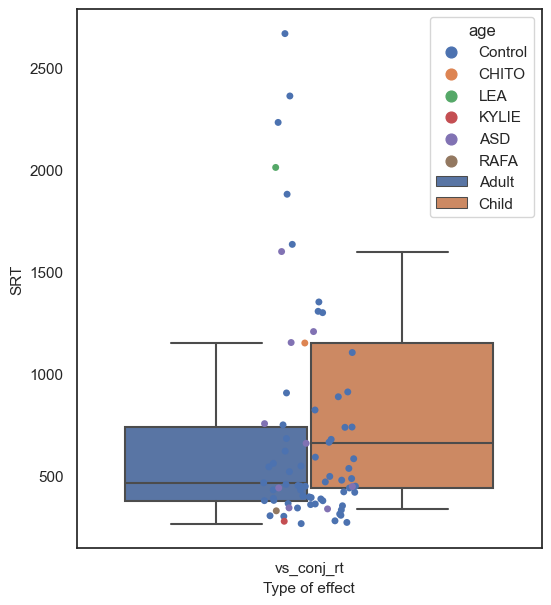

In [223]:
ax = plt.figure(figsize=(6, 7))
ax = sns.stripplot(x="condition", y="rt", data=test_df_melted, hue="diagnosis")
ax = sns.boxplot(x="condition", y="rt", data=test_df_melted, showfliers=False, hue="age")
#plt.legend(handles=[ax])
plt.ylabel('SRT',fontsize=11)
plt.xlabel('Type of effect',fontsize=11)
# Create a single legend
#handles, labels = ax.get_legend_handles_labels()

#plt.legend(handles[2:], labels[2:], loc='upper right')  # Assuming 2 as the index to start from


In [214]:
test_df_melted.loc[test_df_melted.subject=="RJ", "diagnosis"]="RAFA"

test_df_melted.loc[test_df_melted.subject=="MJ", "diagnosis"]="KYLIE"

test_df_melted.loc[test_df_melted.subject=="LJ", "diagnosis"]="LEA"

test_df_melted.loc[test_df_melted.subject=="CJ", "diagnosis"]="CHITO"

In [218]:
test_df_melted.subject.unique()

array(['002_vs_2', '004_vs_2', '010_vs_2', '012_vs', '013_vs', '014_vs',
       '014_vs_2', '015_vs', '017_vs_1', '018_vs_1', '020_vs_1',
       '023_vs_1', '024_vs_1', '026_vs_1', '027_vs_1', '028_vs_1',
       '029_vs_1', '030_vs_1', '031_vs_1', '032_vs_1', '033_vs_1',
       '038_vs_1', '038_vs_2', '052_vs_1', '052_vs_3', '096_vs_1',
       '09vs02', 'CJ', 'LJ', 'MJ', 'Q062_P', 'Q064_M1', 'Q064_S1',
       'Q068_F1', 'Q068_M1', 'Q068_S1', 'Q068_S3', 'Q093_O1', 'Q1006_M1',
       'Q1024_M1', 'Q1024_P', 'Q1026_M1', 'Q1037_F1', 'Q119M1', 'Q129_M1',
       'Q131_P', 'Q131_S1', 'Q134_F1', 'Q134_M1', 'Q146_P', 'Q162_M1',
       'Q162_P', 'Q162_S1', 'Q171_F1', 'Q171_M1', 'Q171_P', 'Q179_M1',
       'Q179_P', 'Q183_M1', 'Q186F1', 'Q186M1', 'Q196_M1', 'Q196_P',
       'Q196_S2', 'Q200_F1', 'Q200_M1', 'Q200_P', 'Q200_S1', 'RJ', 's02',
       's04vs', 's06v2_vs', 's06vs', 's08vs', 's09_VS', 's10vs'],
      dtype=object)

In [219]:
test_df_melted

,subject,age,diagnosis,condition,rt
0,002_vs_2,Adult,Control,vs_conj_rt,620.400000
1,004_vs_2,Adult,Control,vs_conj_rt,519.666667
2,010_vs_2,Adult,Control,vs_conj_rt,1298.666667
3,012_vs,Adult,Control,vs_conj_rt,486.000000
4,013_vs,Adult,Control,vs_conj_rt,301.166667
...,...,...,...,...,...
71,s06v2_vs,Adult,Control,vs_conj_rt,361.500000
72,s06vs,Adult,Control,vs_conj_rt,886.666667
73,s08vs,Adult,Control,vs_conj_rt,535.666667
74,s09_VS,Adult,Control,vs_conj_rt,2230.500000


In [220]:
data_show

,subject,age,diagnosis,condition,rt
0,002_vs_2,Adult,Control,vs_conj_rt,620.400000
1,004_vs_2,Adult,Control,vs_conj_rt,519.666667
2,010_vs_2,Adult,Control,vs_conj_rt,1298.666667
3,012_vs,Adult,Control,vs_conj_rt,486.000000
4,013_vs,Adult,Control,vs_conj_rt,301.166667
...,...,...,...,...,...
71,s06v2_vs,Adult,Control,vs_conj_rt,361.500000
72,s06vs,Adult,Control,vs_conj_rt,886.666667
73,s08vs,Adult,Control,vs_conj_rt,535.666667
74,s09_VS,Adult,Control,vs_conj_rt,2230.500000


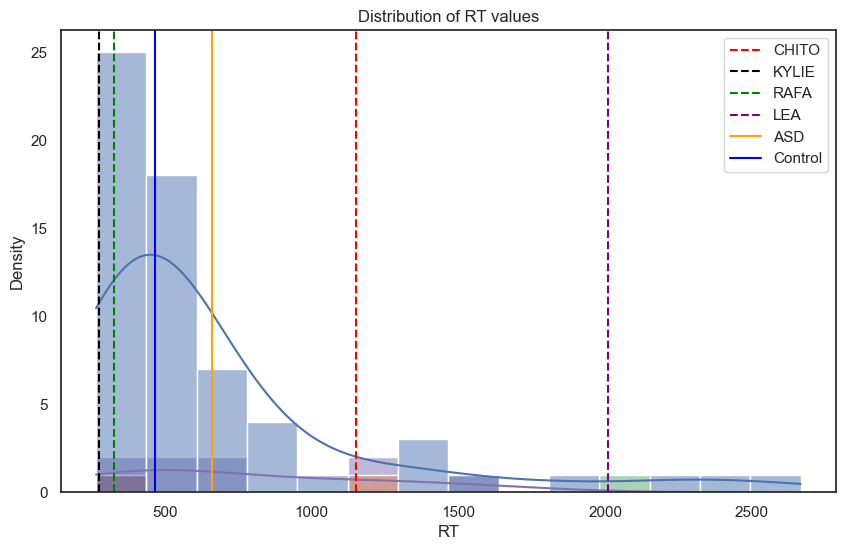

In [121]:
# Create the distribution plot

data_show=test_df_melted[test_df_melted.condition=="vs_conj_rt"]
plt.figure(figsize=(10, 6))
sns.histplot(data=data_show, x='rt', kde=True, color='blue', hue='diagnosis')


# Highlight cancer diagnoses

for diagnosis in ['CHITO']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='red', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")

for diagnosis in ['KYLIE']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='black', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")

for diagnosis in ['RAFA']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='green', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")

for diagnosis in ['LEA']:
    cancer_data = data_show[data_show['diagnosis'] == diagnosis]
    for _, row in cancer_data.iterrows():
        plt.axvline(row['rt'], color='purple', linestyle='--', label=diagnosis if diagnosis not in plt.gca().get_legend_handles_labels()[1] else "")

plt.axvline(data_show[data_show['diagnosis'] == 'ASD']['rt'].median(), color='orange', linestyle='-', label='ASD')
plt.axvline(data_show[data_show['diagnosis'] == 'Control']['rt'].median(), color='blue', linestyle='-', label='Control')

# Add labels and legend
plt.xlabel('RT')
plt.ylabel('Density')
plt.title('Distribution of RT values')
plt.legend()
plt.show()

# TEST-RETEST RELIABILITY

In [541]:
vsfiles2 = glob.glob('./eyelink_txt_files_2023/0*/*vs_2_*.txt')

In [542]:
vsfiles2

['./eyelink_txt_files_2023\\002_2\\002_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\004_2\\004_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\006_2\\006_vs_2_vs_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\010_2\\010_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\014_2\\014_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt',
 './eyelink_txt_files_2023\\038_2\\038_vs_2_VS_Q1K_ACAR_VS_pfp_v1.txt']

In [543]:
len(vsfiles2)

6

In [544]:
## Create df with all files 
df = []
for file in vsfiles2:
    df.append(pd.read_csv(file, delimiter = "\t"))
vs_df_2 = pd.concat(df, axis=0)

In [545]:
vs_df_2=vs_df_2.rename(columns={"condition": "set_size", "detail":"set_type","Session_Name_": "subject"})

In [546]:
vs_df_2["set_type_joined"] = np.where((vs_df_2["set_type"] == "Single_Apple") | (vs_df_2["set_type"] == "Single_Slice"), "single", "conjunction")


In [547]:
vs_df_2.loc[vs_df_2.set_type_joined=="single"]["set_type"].unique()

array(['Single_Slice', 'Single_Apple'], dtype=object)

In [548]:
vs_df_2["session"]=2

In [549]:
vs_df_2['subject'] = vs_df_2['subject'].str.replace('^s', '0')
vs_df_2['subject'] = vs_df_2['subject'].apply(transform_string)
#vs_df_2.subject.unique()

C:\Users\gabot\AppData\Local\Temp\ipykernel_38032\1122062423.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  vs_df_2['subject'] = vs_df_2['subject'].str.replace('^s', '0')


In [550]:
# Merge both dataset together

In [551]:
vs_df_retest=pd.concat([vs_df,vs_df_2])

In [552]:
# find subjects taht did both. 
valid_subjects=vs_df_retest.groupby('subject')['session'].nunique()
valid_subjects = valid_subjects[valid_subjects == 2].index
vs_df_retest = vs_df_retest[vs_df_retest['subject'].isin(valid_subjects)]

In [553]:
vs_df_retest

,subject,Trial_Index_,Trial_Recycled_,VS_SAC_RT,VS_VALID,sub_task_blocking,task,set_size,set_type,dl_video,vs_location_list,set_type_joined,session
0,002,1,False,428,True,1,VS,Five,Single_Slice,Blank.mov,"(7, 2, 9, 14, 4)",single,1
1,002,2,False,-1,False,2,VS,Nine,Single_Slice,Blank.mov,"(1, 15, 2, 10, 6, 11, 7, 4, 16)",single,1
2,002,3,False,622,True,3,VS,Thirteen,Single_Slice,Blank.mov,"(3, 9, 14, 15, 12, 4, 10, 16, 1, 5, 8, 6, 11)",single,1
3,002,4,False,1114,True,4,VS,Five,Single_Apple,Blank.mov,"(10, 0, 14, 3, 2)",single,1
4,002,5,False,408,True,5,VS,Nine,Single_Apple,Blank.mov,"(3, 10, 0, 13, 9, 16, 14, 5, 7)",single,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26,038,27,False,372,True,7,VS,Nine,Conjunction,Blank.mov,"(0, 3, 11, 13, 7, 8, 5, 1, 6)",conjunction,2
27,038,28,False,266,True,7,VS,Nine,Conjunction,Blank.mov,"(13, 8, 7, 5, 0, 4, 16, 11, 1)",conjunction,2
28,038,29,False,259,True,7,VS,Thirteen,Conjunction,Blank.mov,"(15, 9, 5, 8, 0, 11, 12, 4, 7, 6, 13, 2, 14)",conjunction,2
29,038,30,False,538,True,7,VS,Thirteen,Conjunction,Blank.mov,"(6, 13, 12, 14, 15, 16, 4, 11, 3, 2, 8, 1, 9)",conjunction,2


In [554]:
vs_df_retest

,subject,Trial_Index_,Trial_Recycled_,VS_SAC_RT,VS_VALID,sub_task_blocking,task,set_size,set_type,dl_video,vs_location_list,set_type_joined,session
0,002,1,False,428,True,1,VS,Five,Single_Slice,Blank.mov,"(7, 2, 9, 14, 4)",single,1
1,002,2,False,-1,False,2,VS,Nine,Single_Slice,Blank.mov,"(1, 15, 2, 10, 6, 11, 7, 4, 16)",single,1
2,002,3,False,622,True,3,VS,Thirteen,Single_Slice,Blank.mov,"(3, 9, 14, 15, 12, 4, 10, 16, 1, 5, 8, 6, 11)",single,1
3,002,4,False,1114,True,4,VS,Five,Single_Apple,Blank.mov,"(10, 0, 14, 3, 2)",single,1
4,002,5,False,408,True,5,VS,Nine,Single_Apple,Blank.mov,"(3, 10, 0, 13, 9, 16, 14, 5, 7)",single,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26,038,27,False,372,True,7,VS,Nine,Conjunction,Blank.mov,"(0, 3, 11, 13, 7, 8, 5, 1, 6)",conjunction,2
27,038,28,False,266,True,7,VS,Nine,Conjunction,Blank.mov,"(13, 8, 7, 5, 0, 4, 16, 11, 1)",conjunction,2
28,038,29,False,259,True,7,VS,Thirteen,Conjunction,Blank.mov,"(15, 9, 5, 8, 0, 11, 12, 4, 7, 6, 13, 2, 14)",conjunction,2
29,038,30,False,538,True,7,VS,Thirteen,Conjunction,Blank.mov,"(6, 13, 12, 14, 15, 16, 4, 11, 3, 2, 8, 1, 9)",conjunction,2


#### Particpant statistics for accuracy 

In [555]:
valid_trials=vs_df_retest[vs_df_retest.VS_VALID==True].groupby(["subject","session","set_size","set_type"])["VS_VALID"].count()
total_trials=vs_df_retest.groupby(["subject","session","set_size","set_type"])["VS_VALID"].count()
acc_per_sub=valid_trials/total_trials
acc_per_sub_s=pd.DataFrame(acc_per_sub).reset_index().rename(columns={"VS_VALID":"perc_accuracy"})


#### Particiapnts single vs conjunction

In [556]:
valid_trials=vs_df_retest[vs_df_retest.VS_VALID==True].groupby(["subject","session","set_size","set_type_joined"])["VS_VALID"].count()
total_trials=vs_df_retest.groupby(["subject","session","set_size","set_type_joined"])["VS_VALID"].count()
acc_conjoined_set=valid_trials/total_trials
acc_conjoined_set=pd.DataFrame(acc_conjoined_set).reset_index().rename(columns={"VS_VALID":"perc_accuracy"})

acc_conjoined_set

,subject,session,set_size,set_type_joined,perc_accuracy
0,002,1,Five,conjunction,0.833333
1,002,1,Five,single,1.000000
2,002,1,Nine,conjunction,1.000000
3,002,1,Nine,single,0.750000
4,002,1,Thirteen,conjunction,0.833333
5,002,1,Thirteen,single,1.000000
6,002,2,Five,conjunction,0.833333
7,002,2,Five,single,1.000000
8,002,2,Nine,conjunction,1.000000
9,002,2,Nine,single,0.750000


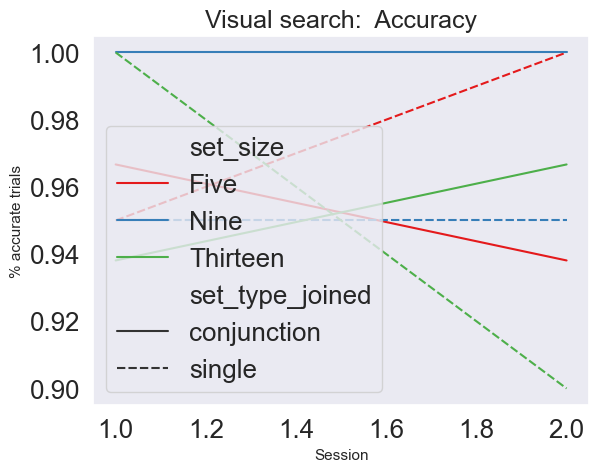

In [557]:
sns.lineplot(x="session", y="perc_accuracy", data=acc_conjoined_set, palette="Set1",hue="set_size",ci=None,
            style="set_type_joined").set_title('Visual search:  Accuracy',fontsize=18)

plt.grid(False)
plt.ylabel('% accurate trials',fontsize=11)
plt.xlabel('Session',fontsize=11)
plt.legend(loc='lower left')

#plt.ylim([0.7,1.2])

In [558]:
pg.pairwise_tests(dv='perc_accuracy', within=['set_type_joined',"session"],
                               subject='subject', padjust='fdr_bh', data=acc_conjoined_set)

C:\Users\gabot\anaconda3\lib\site-packages\pingouin\pairwise.py:478: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp = data.groupby([subject, f], as_index=False, observed=True, sort=True).mean()
C:\Users\gabot\anaconda3\lib\site-packages\pingouin\parametric.py:248: UserWarning: x and y are equals. Cannot compute T or p-value.
  warnings.warn("x and y are equals. Cannot compute T or p-value.")


,Contrast,set_type_joined,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,set_type_joined,-,conjunction,single,True,True,0.418707,4.0,two-sided,0.696935,NaN,NaN,0.427,0.197194
1,session,-,1,2,True,True,0.408248,4.0,two-sided,0.704000,NaN,NaN,0.426,0.173413
2,set_type_joined * session,conjunction,1,2,True,True,NaN,4.0,two-sided,NaN,NaN,fdr_bh,nan,0.000000
3,set_type_joined * session,single,1,2,True,True,0.408248,4.0,two-sided,0.704000,0.704,fdr_bh,0.426,0.243582


In [559]:
acc_test_retest=acc_conjoined_set.pivot(index=["subject","set_size","set_type_joined"],
                    columns="session", values="perc_accuracy").reset_index()

In [560]:
acc_test_retest.rename(columns={1:"acc_1",2:"acc_2"}, inplace=True)

In [561]:
acc_test_retest

session,subject,set_size,set_type_joined,acc_1,acc_2
0,002,Five,conjunction,0.833333,0.833333
1,002,Five,single,1.000000,1.000000
2,002,Nine,conjunction,1.000000,1.000000
3,002,Nine,single,0.750000,0.750000
4,002,Thirteen,conjunction,0.833333,0.833333
5,002,Thirteen,single,1.000000,1.000000
6,004,Five,conjunction,1.000000,1.000000
7,004,Five,single,1.000000,1.000000
8,004,Nine,conjunction,1.000000,1.000000
9,004,Nine,single,1.000000,1.000000


In [562]:
retest_corr_list=[]
for size in acc_test_retest.set_size.unique():
    test_cor=pg.pairwise_corr(acc_test_retest.loc[acc_test_retest.set_size==size], 
                     method='pearson', columns=["acc_1","acc_2"])
    test_cor["comparison"]=size
    retest_corr_list.append(test_cor)
    
for stype in acc_test_retest.set_type_joined.unique():
    test_cor=pg.pairwise_corr(acc_test_retest.loc[acc_test_retest.set_type_joined==stype], 
                     method='pearson', columns=["acc_1","acc_2"])
    test_cor["comparison"]=stype
    retest_corr_list.append(test_cor)

ac_retest_corr=pd.concat(retest_corr_list)
ac_retest_corr

,X,Y,method,alternative,n,r,CI95%,p-unc,BF10,power,comparison
0,acc_1,acc_2,pearson,two-sided,10,0.280474,"[-0.42, 0.77]",0.432492,0.509,0.124535,Five
0,acc_1,acc_2,pearson,two-sided,10,1.000000,"[1.0, 1.0]",0.000000,inf,1.000000,Nine
0,acc_1,acc_2,pearson,two-sided,10,0.075259,"[-0.58, 0.67]",0.836300,0.394,0.053866,Thirteen
0,acc_1,acc_2,pearson,two-sided,15,0.664596,"[0.23, 0.88]",0.006875,8.932,0.812985,conjunction
0,acc_1,acc_2,pearson,two-sided,15,0.217262,"[-0.33, 0.66]",0.436679,0.42,0.122622,single


In [563]:
vs_df_retest

,subject,Trial_Index_,Trial_Recycled_,VS_SAC_RT,VS_VALID,sub_task_blocking,task,set_size,set_type,dl_video,vs_location_list,set_type_joined,session
0,002,1,False,428,True,1,VS,Five,Single_Slice,Blank.mov,"(7, 2, 9, 14, 4)",single,1
1,002,2,False,-1,False,2,VS,Nine,Single_Slice,Blank.mov,"(1, 15, 2, 10, 6, 11, 7, 4, 16)",single,1
2,002,3,False,622,True,3,VS,Thirteen,Single_Slice,Blank.mov,"(3, 9, 14, 15, 12, 4, 10, 16, 1, 5, 8, 6, 11)",single,1
3,002,4,False,1114,True,4,VS,Five,Single_Apple,Blank.mov,"(10, 0, 14, 3, 2)",single,1
4,002,5,False,408,True,5,VS,Nine,Single_Apple,Blank.mov,"(3, 10, 0, 13, 9, 16, 14, 5, 7)",single,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
26,038,27,False,372,True,7,VS,Nine,Conjunction,Blank.mov,"(0, 3, 11, 13, 7, 8, 5, 1, 6)",conjunction,2
27,038,28,False,266,True,7,VS,Nine,Conjunction,Blank.mov,"(13, 8, 7, 5, 0, 4, 16, 11, 1)",conjunction,2
28,038,29,False,259,True,7,VS,Thirteen,Conjunction,Blank.mov,"(15, 9, 5, 8, 0, 11, 12, 4, 7, 6, 13, 2, 14)",conjunction,2
29,038,30,False,538,True,7,VS,Thirteen,Conjunction,Blank.mov,"(6, 13, 12, 14, 15, 16, 4, 11, 3, 2, 8, 1, 9)",conjunction,2


### Test-retest reaction time

In [564]:
vs_rt_retest=vs_df_retest[vs_df_retest.VS_VALID==True]
vs_rt_retest_sub=pd.DataFrame(vs_rt_retest).reset_index().rename(columns={"VS_SAC_RT":"rt"})
rt_decriptive_stats_retest=vs_rt_retest_sub.groupby(["set_size","set_type_joined","session"]).rt.describe().reset_index()
rt_decriptive_stats_retest

,set_size,set_type_joined,session,count,mean,std,min,25%,50%,75%,max
0,Five,conjunction,1,29.0,675.413793,706.664273,171.0,298.00,458.0,708.00,3854.0
1,Five,conjunction,2,29.0,583.620690,708.632859,178.0,250.00,346.0,463.00,3434.0
2,Five,single,1,19.0,440.684211,291.666296,170.0,232.00,363.0,451.00,1114.0
3,Five,single,2,20.0,417.300000,468.586688,174.0,221.75,266.5,454.50,2327.0
4,Nine,conjunction,1,30.0,538.866667,341.613790,178.0,256.25,513.5,709.50,1850.0
5,Nine,conjunction,2,30.0,704.100000,911.710456,159.0,266.00,389.0,552.25,3880.0
6,Nine,single,1,19.0,478.947368,430.163725,208.0,268.50,326.0,406.50,1812.0
7,Nine,single,2,19.0,616.105263,788.709135,192.0,211.00,250.0,429.00,2786.0
8,Thirteen,conjunction,1,29.0,656.724138,495.962981,192.0,360.00,499.0,848.00,2614.0
9,Thirteen,conjunction,2,29.0,620.827586,782.005392,55.0,259.00,363.0,525.00,3598.0


In [565]:
vs_rt_retest_sub.groupby(["subject","set_size","set_type_joined","session"]).mean()

C:\Users\gabot\AppData\Local\Temp\ipykernel_38032\3550152827.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  vs_rt_retest_sub.groupby(["subject","set_size","set_type_joined","session"]).mean()


index  Trial_Index_  \
subject set_size set_type_joined session                            
002     Five     conjunction     1        15.800000     16.800000   
                                 2        16.000000     17.000000   
                 single          1         8.500000      9.500000   
                                 2         8.500000      9.500000   
        Nine     conjunction     1        17.500000     18.500000   
                                 2        17.500000     18.500000   
                 single          1        13.000000     14.000000   
                                 2        13.000000     14.000000   
        Thirteen conjunction     1        22.200000     23.200000   
                                 2        22.200000     23.200000   
                 single          1        11.500000     12.500000   
                                 2        11.500000     12.500000   
004     Five     conjunction     1        14.500000     15.500000   
                                 2        14.500000     15.500000   
                 single          1         8.500000      9.500000   
                                 2         8.500000      9.500000   
        Nine     conjunction     1        17.500000     18.500000   
                                 2        17.500000     18.500000   
                 single          1        10.000000     11.000000   
                                 2        10.000000     11.000000   
        Thirteen conjunction     1        20.500000     21.500000   
                                 2        20.500000     21.500000   
                 single          1        11.500000     12.500000   
                                 2        11.500000     12.500000   
006     Five     conjunction     1        14.500000     15.500000   
                                 2        14.500000     15.500000   
                 single          1        11.333333     12.333333   
                                 2         8.500000      9.500000   
        Nine     conjunction     1        17.500000     18.500000   
                                 2        17.500000     18.500000   
                 single          1        10.000000     11.000000   
                                 2        10.000000     11.000000   
        Thirteen conjunction     1        20.500000     21.500000   
                                 2        20.500000     21.500000   
                 single          1        11.500000     12.500000   
                                 2        11.500000     12.500000   
010     Five     conjunction     1        14.500000     15.500000   
                                 2        14.500000     15.500000   
                 single          1         8.500000      9.500000   
                                 2         8.500000      9.500000   
        Nine     conjunction     1        17.500000     18.500000   
                                 2        17.500000     18.500000   
                 single          1        10.000000     11.000000   
                                 2        10.000000     11.000000   
        Thirteen conjunction     1        20.500000     21.500000   
                                 2        20.500000     21.500000   
                 single          1        11.500000     12.500000   
                                 2        19.500000     20.500000   
038     Five     conjunction     1        15.000000     16.000000   
                                 2        15.333333     16.333333   
                 single          1         9.000000     10.000000   
                                 2         9.000000     10.000000   
        Nine     conjunction     1        18.000000     19.000000   
                                 2        18.500000     19.500000   
                 single          1        10.500000     11.500000   
                                 2        10.500000     11.500000   
        Thirteen conjunction     1        21

In [566]:
test_rt_sub=vs_rt_retest_sub.pivot(index=["subject","set_size","set_type_joined","Trial_Index_"],
                    columns="session", values="rt").reset_index()
test_rt_sub.rename(columns={1:"rt_1",2:"rt_2"}, inplace=True)

Text(0.5, 56.72499999999998, 'RT 2')

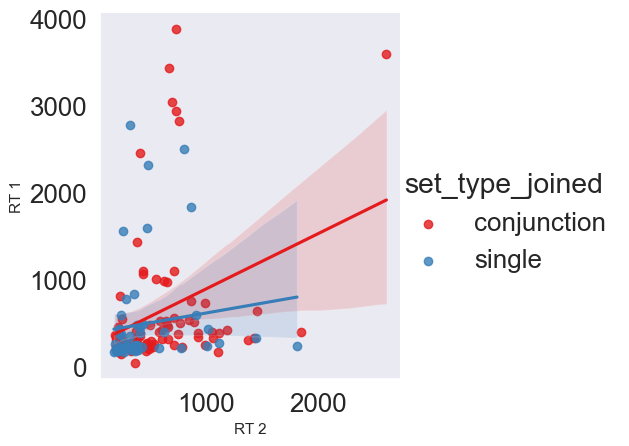

In [567]:
sns.lmplot(x="rt_1", y="rt_2", data=test_rt_sub,
           palette="Set1",hue="set_type_joined")

plt.grid(False)
plt.ylabel("RT 1",fontsize=11)
plt.xlabel('RT 2',fontsize=11)
#plt.legend(loc='lower left')

In [568]:
test_rt_sub

session,subject,set_size,set_type_joined,Trial_Index_,rt_1,rt_2
0,002,Five,conjunction,7,1048.0,404.0
1,002,Five,conjunction,8,3854.0,NaN
2,002,Five,conjunction,9,NaN,401.0
3,002,Five,conjunction,22,648.0,981.0
4,002,Five,conjunction,23,185.0,200.0
...,...,...,...,...,...,...
145,038,Thirteen,conjunction,31,892.0,525.0
146,038,Thirteen,single,3,234.0,602.0
147,038,Thirteen,single,6,278.0,221.0
148,038,Thirteen,single,21,191.0,191.0


In [569]:
test_rt_sub

session,subject,set_size,set_type_joined,Trial_Index_,rt_1,rt_2
0,002,Five,conjunction,7,1048.0,404.0
1,002,Five,conjunction,8,3854.0,NaN
2,002,Five,conjunction,9,NaN,401.0
3,002,Five,conjunction,22,648.0,981.0
4,002,Five,conjunction,23,185.0,200.0
...,...,...,...,...,...,...
145,038,Thirteen,conjunction,31,892.0,525.0
146,038,Thirteen,single,3,234.0,602.0
147,038,Thirteen,single,6,278.0,221.0
148,038,Thirteen,single,21,191.0,191.0


In [570]:
test_rt_sub.rename(columns={1:"rt_1",2:"rt_2"}, inplace=True)

In [571]:
retest_corr_rt_list=[]
for size in test_rt_sub.set_size.unique():
    test_cor=pg.pairwise_corr(test_rt_sub.loc[test_rt_sub.set_size==size], 
                     method='pearson', columns=["rt_1","rt_2"])
    test_cor["comparison"]=size
    retest_corr_rt_list.append(test_cor)
    
for stype in test_rt_sub.set_type_joined.unique():
    test_cor=pg.pairwise_corr(test_rt_sub.loc[test_rt_sub.set_type_joined==stype], 
                     method='pearson', columns=["rt_1","rt_2"])
    test_cor["comparison"]=stype
    retest_corr_rt_list.append(test_cor)

rt_retest_corr=pd.concat(retest_corr_rt_list)
rt_retest_corr

,X,Y,method,alternative,n,r,CI95%,p-unc,BF10,power,comparison
0,rt_1,rt_2,pearson,two-sided,46,0.114236,"[-0.18, 0.39]",0.449681,0.242,0.117875,Five
0,rt_1,rt_2,pearson,two-sided,48,0.141868,"[-0.15, 0.41]",0.336122,0.282,0.161678,Nine
0,rt_1,rt_2,pearson,two-sided,47,0.555387,"[0.32, 0.73]",0.000051,520.19,0.987144,Thirteen
0,rt_1,rt_2,pearson,two-sided,85,0.315396,"[0.11, 0.5]",0.003280,9.489,0.844292,conjunction
0,rt_1,rt_2,pearson,two-sided,56,0.123036,"[-0.14, 0.37]",0.366318,0.248,0.147999,single


In [572]:
vs_rt_2=vs_rt_retest_sub.groupby(["subject","set_size","set_type_joined","session"]).mean().reset_index()

C:\Users\gabot\AppData\Local\Temp\ipykernel_38032\3227187213.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  vs_rt_2=vs_rt_retest_sub.groupby(["subject","set_size","set_type_joined","session"]).mean().reset_index()


In [573]:
test_rt_sub=vs_rt_2.pivot(index=["subject","set_size","set_type_joined"],
                    columns="session", values="rt").reset_index()

In [574]:
test_rt_sub

session,subject,set_size,set_type_joined,1,2
0,002,Five,conjunction,1278.800000,461.600000
1,002,Five,single,563.500000,870.000000
2,002,Nine,conjunction,575.500000,1463.666667
3,002,Nine,single,376.333333,1214.666667
4,002,Thirteen,conjunction,377.400000,620.400000
5,002,Thirteen,single,398.500000,760.000000
6,004,Five,conjunction,786.333333,555.166667
7,004,Five,single,400.750000,307.500000
8,004,Nine,conjunction,408.666667,420.000000
9,004,Nine,single,253.500000,352.750000


In [575]:
test_rt_sub.rename(columns={1:"rt_1",2:"rt_2"}, inplace=True)

In [576]:
retest_corr_rt_list=[]
for size in test_rt_sub.set_size.unique():
    test_cor=pg.pairwise_corr(test_rt_sub.loc[test_rt_sub.set_size==size], 
                     method='pearson', columns=["rt_1","rt_2"])
    test_cor["comparison"]=size
    retest_corr_rt_list.append(test_cor)
    
for stype in test_rt_sub.set_type_joined.unique():
    test_cor=pg.pairwise_corr(test_rt_sub.loc[test_rt_sub.set_type_joined==stype], 
                     method='pearson', columns=["rt_1","rt_2"])
    test_cor["comparison"]=stype
    retest_corr_rt_list.append(test_cor)

rt_retest_corr=pd.concat(retest_corr_rt_list)
rt_retest_corr

,X,Y,method,alternative,n,r,CI95%,p-unc,BF10,power,comparison
0,rt_1,rt_2,pearson,two-sided,10,0.065244,"[-0.59, 0.67]",0.857885,0.392,0.052613,Five
0,rt_1,rt_2,pearson,two-sided,10,-0.245212,"[-0.76, 0.45]",0.494705,0.476,0.105564,Nine
0,rt_1,rt_2,pearson,two-sided,10,0.466142,"[-0.23, 0.85]",0.174488,0.879,0.286415,Thirteen
0,rt_1,rt_2,pearson,two-sided,15,-0.077051,"[-0.57, 0.45]",0.784904,0.329,0.057798,conjunction
0,rt_1,rt_2,pearson,two-sided,15,0.182149,"[-0.36, 0.64]",0.515868,0.387,0.099826,single


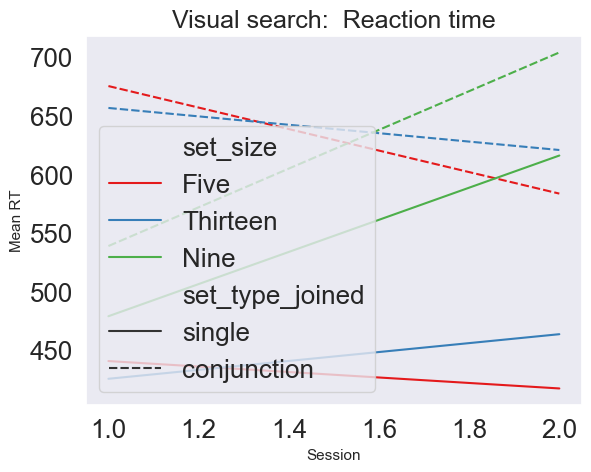

In [577]:
sns.lineplot(x="session", y="rt", data=vs_rt_retest_sub, palette="Set1",hue="set_size",ci=None,
            style="set_type_joined").set_title('Visual search:  Reaction time',fontsize=18)

plt.grid(False)
plt.ylabel("Mean RT",fontsize=11)
plt.xlabel('Session',fontsize=11)
plt.legend(loc='lower left')

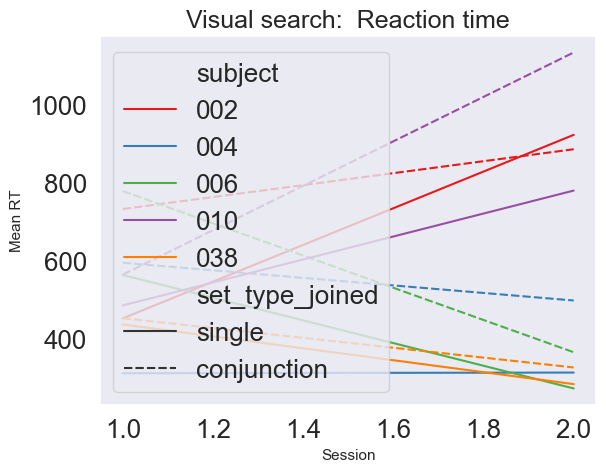

In [578]:
sns.lineplot(x="session", y="rt", data=vs_rt_retest_sub, palette="Set1",hue="subject",ci=None,
            style="set_type_joined").set_title('Visual search:  Reaction time',fontsize=18)

plt.grid(False)
plt.ylabel("Mean RT",fontsize=11)
plt.xlabel('Session',fontsize=11)
plt.legend(loc='lower left')

Text(0.5, 28.999999999999986, 'RT 2')

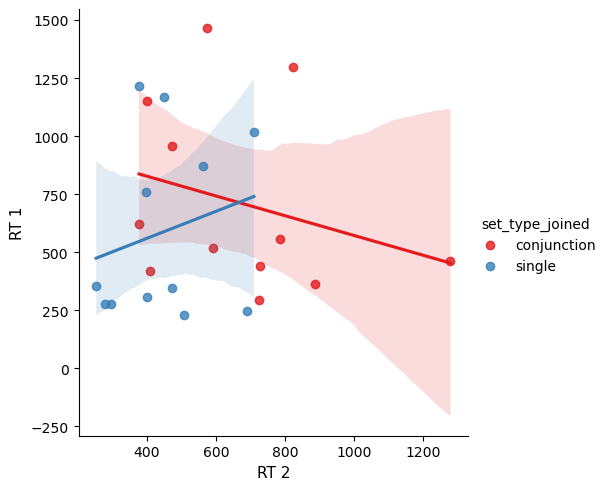

In [669]:
sns.lmplot(x="rt_1", y="rt_2", data=test_rt_sub,
           palette="Set1",hue="set_type_joined")

plt.grid(False)
plt.ylabel("RT 1",fontsize=11)
plt.xlabel('RT 2',fontsize=11)
#plt.legend(loc='lower left')

In [631]:
vs_rt_retest_sub

,index,subject,Trial_Index_,Trial_Recycled_,rt,VS_VALID,sub_task_blocking,task,set_size,set_type,dl_video,vs_location_list,set_type_joined,session
0,0,002,1,False,428,True,1,VS,Five,Single_Slice,Blank.mov,"(7, 2, 9, 14, 4)",single,1
1,2,002,3,False,622,True,3,VS,Thirteen,Single_Slice,Blank.mov,"(3, 9, 14, 15, 12, 4, 10, 16, 1, 5, 8, 6, 11)",single,1
2,3,002,4,False,1114,True,4,VS,Five,Single_Apple,Blank.mov,"(10, 0, 14, 3, 2)",single,1
3,4,002,5,False,408,True,5,VS,Nine,Single_Apple,Blank.mov,"(3, 10, 0, 13, 9, 16, 14, 5, 7)",single,1
4,5,002,6,False,376,True,6,VS,Thirteen,Single_Apple,Blank.mov,"(15, 10, 14, 4, 11, 16, 3, 7, 13, 1, 2, 8, 6)",single,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,25,010,26,False,1069,True,7,VS,Nine,Conjunction,Blank.mov,"(0, 3, 11, 13, 7, 8, 5, 1, 6)",conjunction,2
227,26,010,27,False,318,True,7,VS,Nine,Conjunction,Blank.mov,"(13, 8, 7, 5, 0, 4, 16, 11, 1)",conjunction,2
228,27,010,28,False,267,True,7,VS,Thirteen,Conjunction,Blank.mov,"(15, 9, 5, 8, 0, 11, 12, 4, 7, 6, 13, 2, 14)",conjunction,2
229,28,010,29,False,3598,True,7,VS,Thirteen,Conjunction,Blank.mov,"(6, 13, 12, 14, 15, 16, 4, 11, 3, 2, 8, 1, 9)",conjunction,2


### Plotting accuracy 

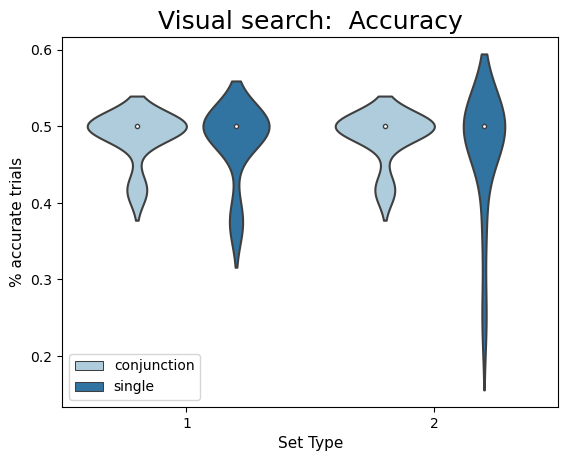

In [944]:
#plt.figure(figsize=(10, 10))
#sns.boxplot(x="set_type_joined", y="perc_accuracy", data=acc_per_sub, 
 #           hue="set_size").set_title('VS Accuracy distractor type and count',fontsize=18)

sns.violinplot(x="session", y="perc_accuracy", data=acc_per_sub, palette="Paired",
            hue="set_type_joined").set_title('Visual search:  Accuracy',fontsize=18)

plt.grid(False)
plt.ylabel('% accurate trials',fontsize=11)
plt.xlabel('Set Type',fontsize=11)
plt.legend(loc='lower left')

#plt.ylim([0.7,1.2])

### Anova to test differences 

#### Assumption of sphericity (Mauchly’s test)

In [603]:
print(pg.sphericity(data=acc_per_sub, dv='perc_accuracy', subject='subject', within='set_type_joined')[-1])
print(pg.sphericity(data=acc_per_sub, dv='perc_accuracy', subject='subject', within='set_size')[-1])

1.0
1.0


In [196]:
acc_conjoined_set.loc[acc_conjoined_set.set_type_joined==stype]

,subject,session,set_size,set_type_joined,perc_accuracy


#### Assumption of normality

In [604]:
pg.normality(data=acc_per_sub, dv='perc_accuracy', group='set_type_joined')

,W,pval,normal
set_type_joined,,,
conjunction,0.570425,1.172148e-11,False
single,0.394016,7.664209e-14,False


In [605]:
## Attempting data transformations did not yield anything close to normality. 
#acc_per_sub["log_percent"]=np.log1p(acc_per_sub.perc_accuracy)
#acc_per_sub["sqrt_percent"]=(acc_per_sub.perc_accuracy)**(1/2)
#pg.normality(data=acc_per_sub, dv='sqrt_percent', group='set_type_joined')
#plt.hist(acc_per_sub.perc_accuracy,edgecolor='black', bins=20)


### Friedman Test (non-parametric)

In [606]:
pg.friedman(data=acc_per_sub_s, dv="perc_accuracy", within="set_type", subject="subject")


,Source,W,ddof1,Q,p-unc
Friedman,set_type,0.157895,2,6.0,0.049787


In [607]:
pg.friedman(data=acc_per_sub, dv="perc_accuracy", within="set_size", subject="subject")

,Source,W,ddof1,Q,p-unc
Friedman,set_size,0.023593,2,0.896552,0.638728


### Post-hoc test

In [608]:
sp.posthoc_conover_friedman(a=acc_per_sub_s, y_col="perc_accuracy", group_col="set_type", block_col="subject", 
                                 p_adjust="fdr_bh", melted=True)

,Conjunction,Single_Apple,Single_Slice
Conjunction,1.000000,0.924224,0.924224
Single_Apple,0.924224,1.000000,0.946217
Single_Slice,0.924224,0.946217,1.000000


Text(0.5, 0, 'Set Type')

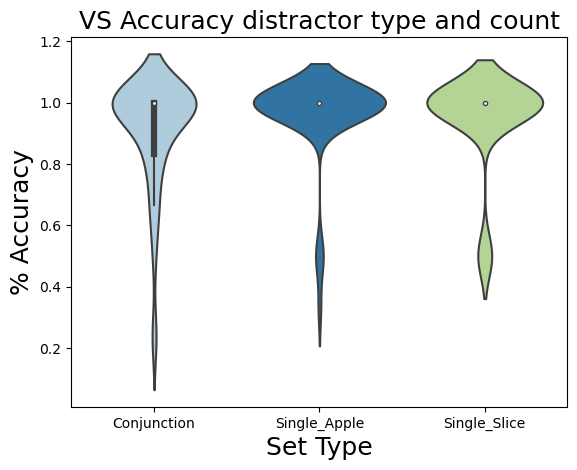

In [609]:
sns.violinplot(x="set_type", y="perc_accuracy", data=acc_per_sub_s, palette="Paired").set_title('VS Accuracy distractor type and count',fontsize=18)

plt.grid(False)
plt.ylabel('% Accuracy',fontsize=18)
plt.xlabel('Set Type',fontsize=18)
#plt.ylim([0.7,1.2])

In [610]:
## Conclusion: no significant differences 

In [879]:

sns.violinplot(x="session", y="perc_accuracy", data=vs_df_retest, palette="Paired",
            hue="set_type_joined").set_title('Visual search:  Accuracy',fontsize=18)

plt.grid(False)
plt.ylabel('% accurate trials',fontsize=11)
plt.xlabel('Set Type',fontsize=11)
plt.legend(loc='lower left')

ValueError: Could not interpret input 'perc_accuracy'

## Facial Social Preference

In [50]:
fs_files = glob.glob('/Users/lina_01/Desktop/eyelink_txt_files_2023/*_1/*_fs_*.txt')

In [49]:
len(fs_files)

19

In [51]:
df = []
for file in fs_files:
    df.append(pd.read_csv(file, delimiter = "\t"))
df = pd.concat(df, axis=0)
df = df[~df['Session_Name_'].isin(['Test'])] #dropping rows with "test" Session_Name_
df

,Session_Name_,Trial_Index_,Trial_Recycled_,block,sub_task_blocking,task,condition,detail,DELAY_DURATION,VIEWED_SIDE,PLAYED_VIDEO_CONDITION,VIDEO_SHOWN,INITAL_LOOK_RT,event_tag_left,event_tag_right
0,023_fs_1,1,False,1,1,FSP,AT,Left,500,Left,Away,Face3_back_left_533.mov,-1.00,vlat,vrat
1,023_fs_1,2,False,1,1,FSP,AT,Right,500,Right,Towards,Face1_smile_right_533.mov,-1.00,vlat,vrat
2,023_fs_1,3,False,1,2,FSP,AT,NaN,500,Left,Away,Face3_back_left_533.mov,269.27,vlat,vrat
3,023_fs_1,4,False,1,2,FSP,AT,NaN,500,Right,Towards,Face1_smile_right_533.mov,265.03,vlat,vrat
4,023_fs_1,5,False,1,2,FSP,AT,NaN,500,Left,Away,Face3_back_left_533.mov,253.11,vlat,vrat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,017_fs_1,68,False,2,12,FSP,FT,NaN,322,Left,Toy,Toy_533.mov,203.04,vltf,vrtf
64,017_fs_1,69,False,2,12,FSP,FT,NaN,999,Left,Toy,Toy_533.mov,173.81,vltf,vrtf
65,017_fs_1,70,False,2,12,FSP,FT,NaN,500,Right,Face,Face5_Hello_right_533.mov,220.95,vltf,vrtf
66,017_fs_1,72,False,2,12,FSP,FT,NaN,92,Left,Toy,Toy_533.mov,784.81,vltf,vrtf


/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is 

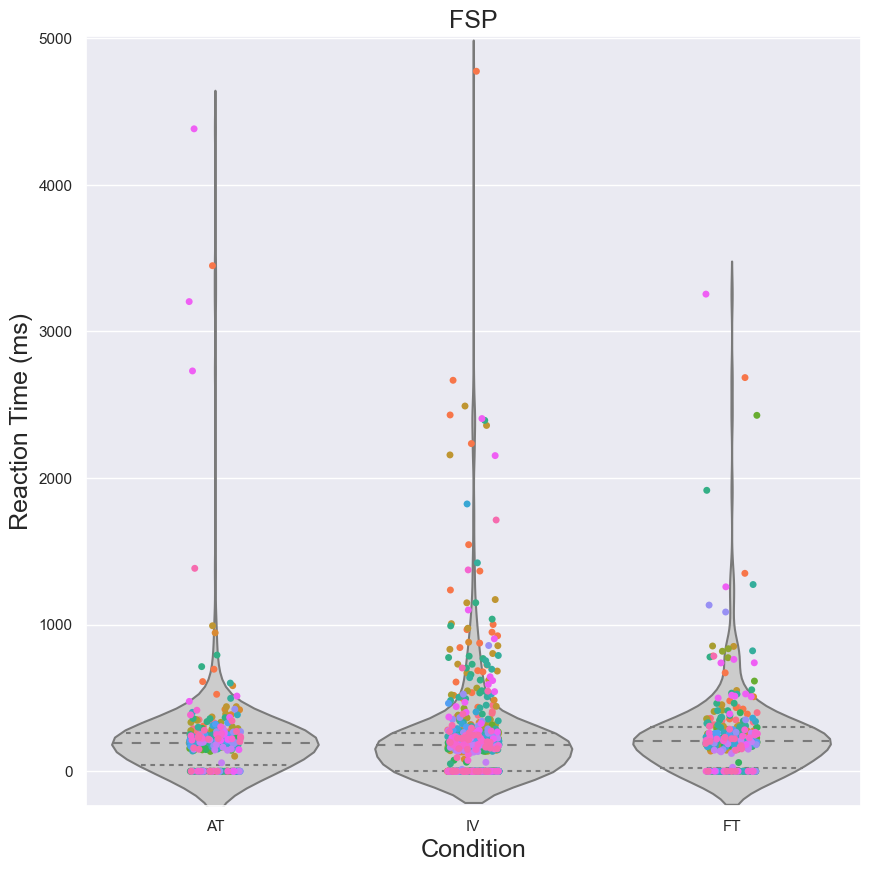

In [52]:
ax = plt.figure(figsize=(10, 10))


ax = sns.violinplot(x="condition", y="INITAL_LOOK_RT", inner='quartile', data=df, color=".8").set_title('FSP',fontsize=18)
ax = sns.stripplot(x="condition", y="INITAL_LOOK_RT", hue="Session_Name_", data=df, legend=False)
ax = plt.ylabel('Reaction Time (ms)',fontsize=18)
ax = plt.xlabel('Condition',fontsize=18)
plt.savefig('fs_plot_1.png')

/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is 

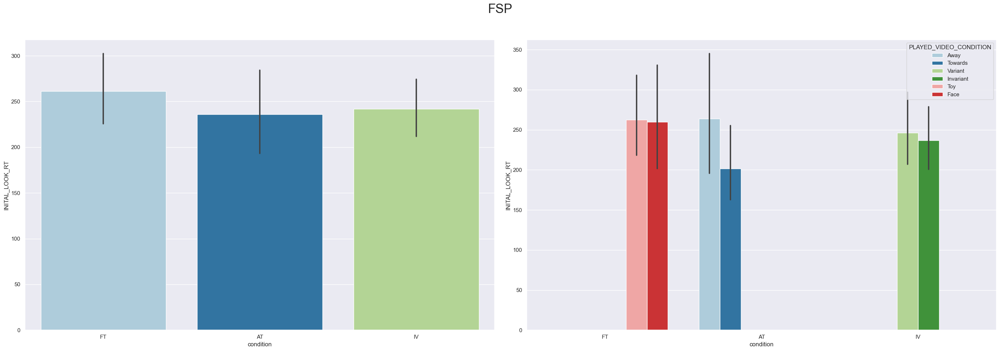

In [53]:
title="FSP" 
plt.rc('font', size=20)
fig, (ax1, ax2) =plt.subplots(1,2,figsize=(28, 10))
sns.barplot(x="condition", y="INITAL_LOOK_RT", data=df, ax=ax1,palette="Paired",order=["FT","AT","IV"])
sns.barplot(x="condition", y="INITAL_LOOK_RT", hue='PLAYED_VIDEO_CONDITION', data=df, ax=ax2,palette="Paired", order=["FT","AT","IV"])
plt.tight_layout()
plt.suptitle(title, fontsize=25)   
plt.subplots_adjust(top=0.88)
plt.show
plt.savefig('fs_plot_2.png')

In [54]:
df_at = df.loc[ (df.condition == 'AT') & (df.INITAL_LOOK_RT != -1.00)]
at_proportion = df_at.groupby('PLAYED_VIDEO_CONDITION').PLAYED_VIDEO_CONDITION.count() /df_at.Session_Name_.count()
at_proportion_df = pd.DataFrame(at_proportion)
at_proportion_df = at_proportion_df.rename(columns = {'PLAYED_VIDEO_CONDITION' : 'Proportion'})
at_proportion_df['block'] = 'Away vs towards'

df_ft = df.loc[ (df.condition == 'FT') & (df.INITAL_LOOK_RT != -1.00)]
ft_proportion = pd.DataFrame(df_ft.groupby('PLAYED_VIDEO_CONDITION').PLAYED_VIDEO_CONDITION.count() /df_ft.Session_Name_.count())
ft_proportion_df = ft_proportion.rename(columns = {'PLAYED_VIDEO_CONDITION' : 'Proportion'})
ft_proportion_df['block'] = 'Face vs Toys'

df_iv = df.loc[ (df.condition == 'IV') & (df.INITAL_LOOK_RT != -1.00)]
iv_proportion = pd.DataFrame(df_iv.groupby('PLAYED_VIDEO_CONDITION').PLAYED_VIDEO_CONDITION.count() /df_iv.Session_Name_.count())
iv_proportion_df = iv_proportion.rename(columns = {'PLAYED_VIDEO_CONDITION' : 'Proportion'})
iv_proportion_df['block'] = 'Invariant vs Variable'

In [55]:
fsp_melt1 = pd.concat([at_proportion_df, ft_proportion_df])
fsp_melt2 = pd.concat([fsp_melt1, iv_proportion_df]).reset_index()
fsp_proportions_df = fsp_melt2.rename(columns = {'PLAYED_VIDEO_CONDITION' : 'condition'})

/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Applications/MNE-Python/1.5.1_0/.mne-python/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is 

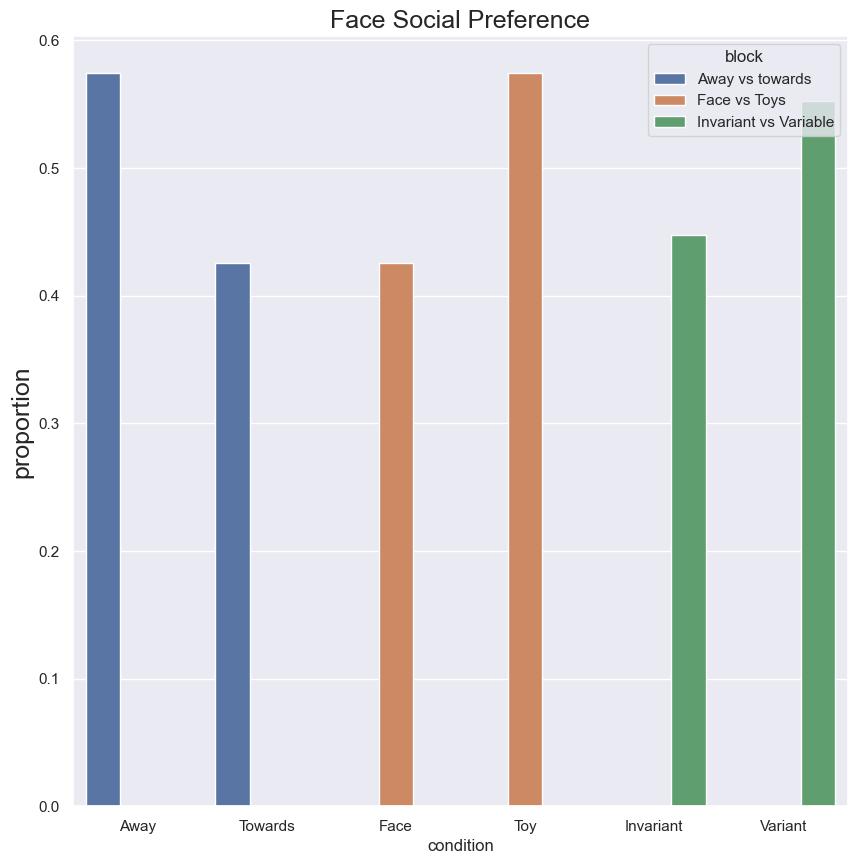

In [57]:
ax = plt.figure(figsize=(10, 10))
ax = sns.set_theme(style="darkgrid")
ax = sns.barplot(x = 'condition', y = 'Proportion', hue='block', data=fsp_proportions_df)
ax = plt.ylabel('proportion',fontsize=18)
ax = plt.title('Face Social Preference',fontsize=18)
#ax = plt.xlabel('Condition',fontsize=18)
plt.savefig('fs_plot_3.png')

In [440]:
ax = plt.figure(figsize=(10, 10))
ax = sns.set_theme(style="darkgrid", font_scale=1.7, )
ax =sns.catplot(x = 'condition', y = 'Proportion', col ='block', col_order = ['Face vs Toys','Away vs towards','Invariant vs Variable'], kind='bar', sharex=False, data=fsp_proportions_df)
#ax = plt.xlabel('task block',fontsize=24)
plt.savefig('fs_plot_4.png')

NameError: name 'fsp_proportions_df' is not defined

<Figure size 1000x1000 with 0 Axes>

## NSP 

In [602]:
df = pd.read_csv("./df2_ns_results.xls.csv") 

In [603]:
df=df[["RECORDING_SESSION_LABEL","condition","AVERAGE_FIXATION_DURATION","FIXATION_COUNT"]]

In [604]:
df.loc[df.condition=="Scrambled","condition"]="Semi-Naturalistic"


In [605]:
df2=df.groupby(["RECORDING_SESSION_LABEL","condition"]).mean().reset_index()

In [606]:
df2=df2.loc[df2.RECORDING_SESSION_LABEL!="014_ns_2"]
df2=df2.loc[df2.RECORDING_SESSION_LABEL!="024_ns_1"]

In [607]:
nsp_df=df2

In [608]:
nsp_df=nsp_df.rename(columns={"AVERAGE_FIXATION_DURATION":"fd","RECORDING_SESSION_LABEL": "subject"})

In [609]:
## Make all the subjetc names consistent in all files 
def transform_string(s):
    if '_' in s and "go" in s:
        return s[:3]
    elif "go" or "GO" in s and "_" not in s:
        return s[:3]
    else:
        return s

nsp_df['subject'] = nsp_df['subject'].str.replace('s', '0')
nsp_df['subject'] = nsp_df['subject'].apply(transform_string)


In [610]:
nsp_df.subject.unique()

array(['012', '013', '014', '015', '017', '018', '020', '023', '026',
       '027', '028', '029', '030', '031', '032', '033', '002', '004',
       '006', '008', '009', '010'], dtype=object)

In [611]:
nsp_df=nsp_df[["subject", "condition", "fd"]]

In [612]:
nsp_df

,subject,condition,fd
0,012,Naturalistic,453.406
1,012,Semi-Naturalistic,483.112
2,013,Naturalistic,536.506
3,013,Semi-Naturalistic,531.214
4,014,Naturalistic,485.182
5,014,Semi-Naturalistic,607.910
8,015,Naturalistic,760.346
9,015,Semi-Naturalistic,779.246
10,017,Naturalistic,400.968
11,017,Semi-Naturalistic,513.740


In [613]:
nsp_df_cluster=nsp_df.pivot(index="subject", columns=["condition"]).reset_index()

In [614]:
nsp_df_cluster.columns = nsp_df_cluster.columns.to_series().str.join('_')
#nsp_df_cluster["nsp_prop"]=nsp_df_cluster["fd_Naturalistic"]/(nsp_df_cluster["fd_Semi-Naturalistic"]+nsp_df_cluster["fd_Naturalistic"])
nsp_df_cluster["nsp_prop"]=nsp_df_cluster["fd_Naturalistic"]
nsp_df_cluster=nsp_df_cluster[["subject_","nsp_prop"]]
nsp_df_cluster.columns=["subject", "nsp_prop"]
nsp_df_cluster

,subject,nsp_prop
0,002,381.258
1,004,408.650
2,006,350.260
3,008,512.454
4,009,430.126
5,010,384.132
6,012,453.406
7,013,536.506
8,014,485.182
9,015,760.346


In [615]:
nsp_df_cluster.to_csv("nsp_df_cluster.csv", index=False)

In [487]:
nsp_df_cluster

,subject,nsp_prop
0,002,87.892
1,004,3.128
2,006,88.170
3,008,123.816
4,009,275.458
5,010,82.864
6,012,29.706
7,013,-5.292
8,014,122.728
9,015,18.900


In [488]:
nsp_df.pivot(index="subject", columns=["condition"])

fd                  
condition Naturalistic Semi-Naturalistic
subject                                 
002            381.258           469.150
004            408.650           411.778
006            350.260           438.430
008            512.454           636.270
009            430.126           705.584
010            384.132           466.996
012            453.406           483.112
013            536.506           531.214
014            485.182           607.910
015            760.346           779.246
017            400.968           513.740
018            509.110           585.382
020            618.166           405.868
023            501.158           560.566
026            430.274           430.686
027            356.072           413.200
028            446.092           412.776
029            516.946           729.194
030            356.308           323.104
031            442.812           451.132
032            415.048           492.272
033            344.762           487.054

In [325]:
fix_d_decriptive_stats=df.groupby(["condition"]).AVERAGE_FIXATION_DURATION.describe().reset_index()
fix_d_decriptive_stats

,condition,count,mean,std,min,25%,50%,75%,max
0,Naturalistic,120.0,469.683083,145.074717,165.5,367.880,449.405,528.235,1242.45
1,Semi-Naturalistic,120.0,562.135167,300.775655,15.0,402.425,466.450,644.135,2801.12


In [327]:
df=df.loc[df.RECORDING_SESSION_LABEL!="014_ns_2"]
df=df.loc[df.RECORDING_SESSION_LABEL!="024_ns_1"]

In [328]:
df2

,RECORDING_SESSION_LABEL,condition,AVERAGE_FIXATION_DURATION,FIXATION_COUNT
0,012_ns,Naturalistic,453.406,46.2
1,012_ns,Semi-Naturalistic,483.112,43.6
2,013_nsp,Naturalistic,536.506,39.8
3,013_nsp,Semi-Naturalistic,531.214,39.6
4,014_ns,Naturalistic,485.182,43.4
5,014_ns,Semi-Naturalistic,607.910,37.0
6,014_ns_2,Naturalistic,467.662,45.2
7,014_ns_2,Semi-Naturalistic,780.820,28.6
8,015_ns,Naturalistic,760.346,29.0
9,015_ns,Semi-Naturalistic,779.246,28.0


<function matplotlib.pyplot.show(close=None, block=None)>

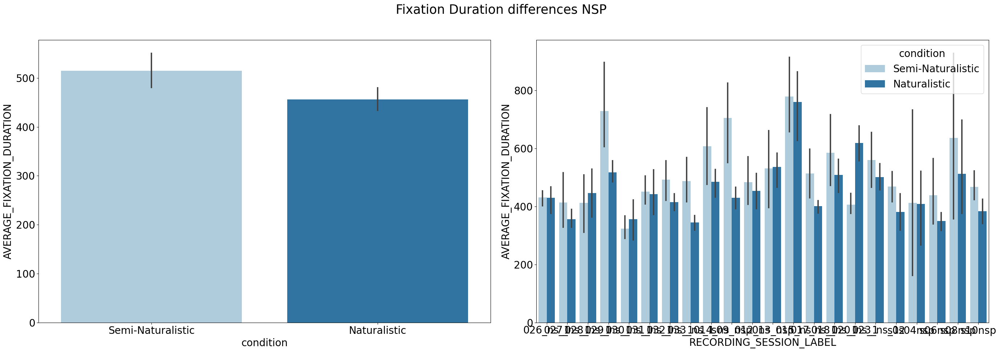

In [25]:
title="Fixation Duration differences NSP" 
plt.rc('font', size=20)
fig, (ax1, ax2) =plt.subplots(1,2,figsize=(28, 10))
sns.barplot(x="condition", y="AVERAGE_FIXATION_DURATION", data=df, ax=ax1,palette="Paired")
sns.barplot(x="RECORDING_SESSION_LABEL", y="AVERAGE_FIXATION_DURATION", hue='condition', data=df, ax=ax2,palette="Paired")
plt.tight_layout()
plt.suptitle(title, fontsize=25)   
plt.subplots_adjust(top=0.88)
subtitle="FDs (naturalistic: M = 327 ms, SD = 45; semi-naturalistic: M = 377 ms, SD = 69)"
plt.show
#sns.barplot(x="condition", y="AVERAGE_FIXATION_DURATION", data=df, color=".8").set_title('NSP',fontsize=18)
#ax = sns.barplot(x="Session_Name_", y="AVERAGE_FIXATION_DURATION", hue='condition', data=df,palette="Paired")

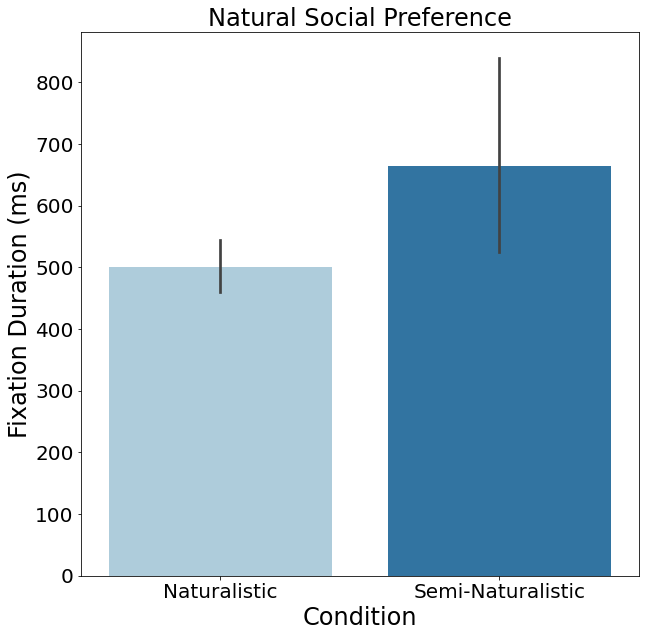

In [11]:
ax = plt.figure(figsize=(10, 10))
ax = sns.barplot(x="condition", y="AVERAGE_FIXATION_DURATION", data=df, palette="Paired").set_title('Natural Social Preference',fontsize=24)
#ax = sns.barplot(x="Session_Name_", y="AVERAGE_FIXATION_DURATION", hue='condition', data=df)
ax = plt.ylabel('Fixation Duration (ms)',fontsize=24)
ax = plt.xlabel('Condition',fontsize=24)
plt.savefig('./Plots/NSP_barplot')

(300.0, 700.0)

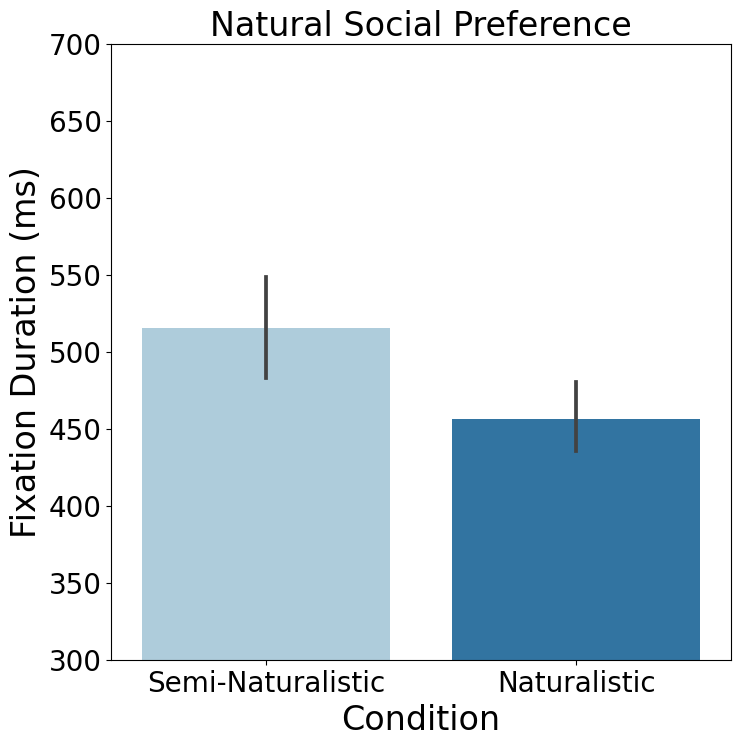

In [52]:
ax = plt.figure(figsize=(8, 8))
ax = sns.barplot(x="condition", y="AVERAGE_FIXATION_DURATION", data=df, palette="Paired").set_title('Natural Social Preference',fontsize=24)
#ax = sns.barplot(x="Session_Name_", y="AVERAGE_FIXATION_DURATION", hue='condition', data=df)
ax = plt.ylabel('Fixation Duration (ms)',fontsize=24)
ax = plt.xlabel('Condition',fontsize=24)
plt.ylim([300,700])